In [1]:
# # === INSTALL LIBRARIES ===
# %pip install croston
# %pip install lightgbm
# %pip install matplotlib
# %pip install numpy
# %pip install openpyxl
# %pip install optuna
# %pip install pandas
# %pip install pyInterDemand
# %pip install scikit-learn
# %pip install seaborn
# %pip install sktime
# %pip install statsforecast
# %pip install tslearn

In [1]:
# === IMPORT LIBRARIES ===
from pathlib import Path
from datetime import datetime, date, timedelta
from io import StringIO
import os
import re
import csv

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import openpyxl  # for Excel I/O if needed

# (Optional) seaborn for plotting
import seaborn as sns

# # Path del proyecto
# # C:\Users\AlejandroLaderasImpe\Documents\InterForecast\raw_data


# (EXPERIMENTAL) CARGA Y PREPROCESADO AUTOMÁTICO

In [3]:
# # ==============================
# # PREPROCESSING SCRIPT (English)
# # ==============================

# def _week_start_calendar_on_or_after(code: str, week_start: int = 1) -> datetime:
#     """
#     Convert a 'YYYYWW' code to the start date of that week using a business rule:
#       - week_start: 1=Mon ... 7=Sun
#       - Week 1 = first 'week_start' ON OR AFTER January 1st of that year.
#     Returns the datetime for the week's start (e.g., Monday if week_start=1).
#     """
#     code = str(code).strip().zfill(6)
#     yy, ww = int(code[:4]), int(code[4:])
#     if not (1 <= ww <= 53):
#         raise ValueError(f"Week out of range in code {code}")
#     py_week_start = (week_start - 1) % 7  # Python: Monday=0 ... Sunday=6
#     d0 = date(yy, 1, 1)
#     # First desired weekday on or after Jan 1st (e.g., first Monday >= Jan 1)
#     delta = (py_week_start - d0.weekday()) % 7
#     first = d0 + timedelta(days=delta)
#     return datetime.fromordinal(first.toordinal() + (ww - 1) * 7)


# def _clean_outer_quoted_lines(text: str) -> str:
#     """
#     Clean lines like:
#         '"202301,8805.0,""0123600126""'
#     into:
#         '202301,8805.0,"0123600126"'
#     This handles CSVs where the entire line is quoted and inner quotes are doubled.
#     """
#     out = []
#     for line in text.splitlines():
#         line = line.rstrip("\r\n")
#         if len(line) >= 2 and line[0] == '"' and line[-1] == '"':
#             line = line[1:-1]          # drop outer quotes
#         line = line.replace('""', '"')  # normalize doubled inner quotes
#         out.append(line)
#     return "\n".join(out) + "\n"


# def _read_csv_with_fallback(
#     path, has_header: bool = True, names: tuple[str, str, str] = ("ds", "y", "unique_id")
# ):
#     """
#     Robust CSV reader with fallback:
#       1) Try normal read (comma sep, thousands=',', decimal='.')
#       2) If it looks misparsed (first column has commas in >80% of rows and the
#          others are mostly NaN, or only 1 column), re-read after cleaning outer quotes.
#       3) In the fallback, use dtype=str to preserve leading zeros.
#     """
#     read_kwargs = dict(sep=",", engine="python", thousands=",", decimal=".", quoting=csv.QUOTE_MINIMAL)

#     if has_header:
#         df = pd.read_csv(path, **read_kwargs)
#     else:
#         df = pd.read_csv(path, header=None, names=list(names), skiprows=1, **read_kwargs)

#     need_fallback = False
#     if df.shape[1] == 1:
#         need_fallback = True
#     else:
#         first_col = df.columns[0]
#         # Heuristic: first col has commas in >80% AND other cols are mostly NaN => likely misparsed
#         if df[first_col].astype(str).str.contains(",").mean() > 0.8:
#             other = df.columns[1:]
#             if len(other) > 0 and all(df[c].isna().mean() > 0.8 for c in other):
#                 need_fallback = True

#     if need_fallback:
#         raw = Path(path).read_text(encoding="utf-8", errors="ignore")
#         cleaned = _clean_outer_quoted_lines(raw)
#         if has_header:
#             df = pd.read_csv(StringIO(cleaned), sep=",", engine="python", dtype=str)
#         else:
#             df = pd.read_csv(
#                 StringIO(cleaned),
#                 sep=",",
#                 engine="python",
#                 header=None,
#                 names=list(names),
#                 skiprows=1,
#                 dtype=str,
#             )
#     return df


# def _to_month_datetime(s):
#     """
#     Parse YYYYMM strings to the first day of month (datetime64[ns]).
#     Ensures 6 digits and strips any stray quotes.
#     """
#     s = pd.Series(s, dtype="string").str.strip().str.replace('"', "", regex=False)
#     s = s.str.zfill(6)  # ensure YYYYMM
#     return pd.to_datetime(s, format="%Y%m", errors="coerce")


# def _to_week_datetime(s):
#     """
#     Parse ISO YYYYWW to the Monday of that ISO week (datetime64[ns]).
#     Ensures 6 digits and strips any stray quotes.
#     """
#     s = pd.Series(s, dtype="string").str.strip().str.replace('"', "", regex=False)
#     s = s.str.zfill(6)  # ensure YYYYWW
#     # %G = ISO year, %V = ISO week, %u = weekday (1=Mon)
#     return pd.to_datetime(s + "1", format="%G%V%u", errors="coerce")


# def _coerce_float(y):
#     """
#     Convert to float, accepting thousands with comma and decimals with dot.
#     Defensive: remove quotes and commas in case the column came as text.
#     """
#     y = (
#         pd.Series(y, dtype="string")
#         .str.strip()
#         .str.replace('"', "", regex=False)
#         .str.replace(",", "", regex=False)  # remove thousand separators just in case
#     )
#     return pd.to_numeric(y, errors="coerce").astype("float").fillna(0.0)


# def _as_string(x):
#     """Normalize to pandas 'string' dtype, stripping stray quotes."""
#     return pd.Series(x, dtype="string").str.strip().str.replace('"', "", regex=False)


# def _detect_kind_from_ds(ds_series):
#     """
#     Infer 'month' vs 'week' when we only have a 6-digit code in 'ds':
#       - if last two digits > 12 => treat as week
#       - else => treat as month
#     (Kept for compatibility; explicit 'kind' is safer.)
#     """
#     s = pd.Series(ds_series, dtype="string").str.strip().str.replace('"', "", regex=False)
#     s6 = s.str.zfill(6)
#     tail = pd.to_numeric(s6.str[-2:], errors="coerce")
#     if (tail > 12).any():
#         return "week"
#     return "month"


# def parse_ds(
#     df: pd.DataFrame,
#     *,
#     kind: str | None = None,
#     month_col: str = "CODE_MONTH",
#     week_col: str = "CODE_WEEK",
#     ds_col: str = "DS",
#     week_start: int = 1,
#     week_mode: str = "calendar_on_or_after",  # default: business rule (not ISO)
#     week_anchor: str = "start",               # 'start' = Monday; 'end' = Sunday
# ) -> pd.Series:
#     """
#     Build a datetime Series from the time code columns:
#       - If month_col exists => parse YYYYMM to first day of month.
#       - If week_col exists => parse YYYYWW to week start using 'week_mode':
#             * 'calendar_on_or_after': Week 1 = first 'week_start' >= Jan 1st
#             * 'iso'                : Monday of ISO week
#         Then shift +6 days if week_anchor='end' (returns Sunday).
#       - If only 'ds' exists and it is a 6-digit code => REQUIRE 'kind' ('month' or 'week').
#       - If 'ds' holds full dates (yyyy-mm-dd, etc.) => direct parse.
#     """
#     # Normalize headers for robust detection
#     df.columns = df.columns.str.strip().str.strip('"').str.upper()

#     if month_col in df.columns and week_col in df.columns:
#         raise ValueError("Cannot have both CODE_MONTH and CODE_WEEK in the same file.")

#     if month_col in df.columns:
#         s = df[month_col].astype(str).str.strip().str.zfill(6)
#         return pd.to_datetime(s, format="%Y%m", errors="raise")

#     if week_col in df.columns:
#         s = df[week_col].astype(str).str.strip().str.zfill(6)
#         if week_mode == "calendar_on_or_after":
#             out = s.apply(lambda code: _week_start_calendar_on_or_after(code, week_start))
#             out = pd.to_datetime(out, errors="raise")
#         elif week_mode == "iso":
#             out = pd.to_datetime(s + "1", format="%G%V%u", errors="raise")  # ISO Monday
#         else:
#             raise ValueError("week_mode must be 'calendar_on_or_after' or 'iso'.")
#         if week_anchor == "end":
#             out = out + pd.Timedelta(days=6)
#         return out

#     if ds_col in df.columns:
#         s = df[ds_col].astype(str).str.strip()
#         if s.str.fullmatch(r"\d{6}").all():
#             if kind is None:
#                 raise ValueError("Ambiguous 'ds' (YYYYMM/ YYYYWW). Provide kind='month' or 'week'.")
#             if kind == "month":
#                 return pd.to_datetime(s, format="%Y%m", errors="raise")
#             if kind == "week":
#                 if week_mode == "calendar_on_or_after":
#                     out = s.apply(lambda code: _week_start_calendar_on_or_after(code, week_start))
#                     out = pd.to_datetime(out, errors="raise")
#                 elif week_mode == "iso":
#                     s = s.str.zfill(6)
#                     out = pd.to_datetime(s + "1", format="%G%V%u", errors="raise")
#                 else:
#                     raise ValueError("week_mode must be 'calendar_on_or_after' or 'iso'.")
#                 if week_anchor == "end":
#                     out = out + pd.Timedelta(days=6)
#                 return out
#             raise ValueError("kind must be 'month' or 'week'.")
#         # Non-ambiguous full dates
#         return pd.to_datetime(s, errors="raise")

#     raise ValueError("No time column found (CODE_MONTH, CODE_WEEK, or ds).")


# def load_to_standard_df(
#     path,
#     has_header: bool = True,
#     names_if_no_header: tuple[str, str, str] = ("ds", "y", "unique_id"),
#     kind: str | None = None,
#     week_mode: str = "calendar_on_or_after",  # default weekly rule (Mon–Sun; week 1 = first Mon >= Jan 1)
#     week_anchor: str = "start",
#     week_start: int = 1,
# ):
#     """
#     Read a raw CSV and return a standardized DataFrame with columns:
#         unique_id | ds (datetime64[ns]) | y (float)
#     Behavior:
#       - Robust CSV reader with a fallback for fully-quoted lines.
#       - 'ds' is parsed via parse_ds (requires 'kind' if only 6-digit 'ds' exists).
#       - 'unique_id' taken from ID_PRODUCT / UNIQUE_ID / PRODUCT_CODE / PRODUCT_ID (as string).
#       - 'y' taken from TOTAL_AMOUNT or Y (float; thousands=',' and decimals='.')
#     """
#     # 1) Robust read
#     df = _read_csv_with_fallback(path, has_header=has_header, names=names_if_no_header)

#     # 2) Build 'ds' (enforces 'kind' when only a 6-digit ds is present)
#     ds = parse_ds(df, kind=kind, week_mode=week_mode, week_anchor=week_anchor, week_start=week_start)

#     # 3) Normalize headers for mapping 'y' and 'unique_id'
#     df.columns = df.columns.str.strip().str.strip('"').str.upper()

#     # 4) unique_id (patched: accept PRODUCT_CODE / PRODUCT_ID as well)
#     id_candidates = ["ID_PRODUCT", "UNIQUE_ID", "PRODUCT_CODE", "PRODUCT_ID"]
#     unique_id = None
#     for col in id_candidates:
#         if col in df.columns:
#             unique_id = _as_string(df[col])
#             break
#     if unique_id is None:
#         raise ValueError("Could not find ID column (ID_PRODUCT / UNIQUE_ID / PRODUCT_CODE / PRODUCT_ID).")

#     # 5) y (demand)
#     if "TOTAL_AMOUNT" in df.columns:
#         y = _coerce_float(df["TOTAL_AMOUNT"])
#     elif "Y" in df.columns:
#         y = _coerce_float(df["Y"])
#     else:
#         raise ValueError("Could not find demand column (TOTAL_AMOUNT or Y).")

#     # 6) Assemble standardized output
#     out = pd.DataFrame({"unique_id": unique_id, "ds": ds, "y": y})
#     out = (
#         out.dropna(subset=["unique_id", "ds"])
#            .sort_values(["unique_id", "ds"])
#            .reset_index(drop=True)
#     )
#     out["unique_id"] = out["unique_id"].astype("string")
#     out["y"] = out["y"].astype("float")
#     return out

In [4]:
# # === AUTOMATIC DATAFRAME NAMING SCRIPT ===
# import os
# import re
# import csv
# import unicodedata
# from typing import Iterable


# def _slugify(s: str) -> str:
#     """
#     Convert to a safe, lowercase identifier:
#       - strip spaces
#       - remove accents
#       - keep only [a-z0-9_], collapse other chars to underscores
#     """
#     s = str(s).strip().lower()
#     s = unicodedata.normalize("NFKD", s).encode("ascii", "ignore").decode("ascii")
#     s = re.sub(r"[^a-z0-9]+", "_", s).strip("_")
#     return s or "unknown"


# # common header-like tokens that must NOT be used as client codes
# _HEADER_TOKENS: set[str] = {
#     "customer_name", "customer", "cliente",
#     "id_product", "product_id", "id", "unique_id",
#     "code_month", "code_week", "code", "ds", "y",
#     "total_amount", "amount", "qty", "quantity", "demanda",
# }


# def _looks_like_header_token(x: str) -> bool:
#     """
#     True if 'x' looks like a header/token rather than a real client code.
#     """
#     x_norm = _slugify(x)
#     if not x_norm:
#         return True
#     if x_norm in _HEADER_TOKENS:
#         return True
#     # overly generic 1-letter tokens (e.g., 'i') or very long concatenations of header-like words
#     if len(x_norm) <= 1:
#         return True
#     # reject strings composed only of header keywords joined with underscores
#     parts = [p for p in x_norm.split("_") if p]
#     if parts and all(p in _HEADER_TOKENS for p in parts):
#         return True
#     return False


# def _client_code_from_first_col(path: str, has_header: bool = True) -> str | None:
#     """
#     Read the first data row and return the first column (client code).
#     Skips rows where the first cell looks like a header token.
#     Uses csv.reader to respect quoting.
#     """
#     try:
#         with open(path, "r", encoding="utf-8", errors="ignore", newline="") as f:
#             reader = csv.reader(f)
#             it: Iterable[list[str]] = reader
#             if has_header:
#                 next(it, None)  # skip header
#             for row in it:
#                 if not row:
#                     continue
#                 first = (row[0] or "").strip().strip('"')
#                 if not first or _looks_like_header_token(first):
#                     # skip header-like or empty token; keep scanning
#                     continue
#                 return first
#     except Exception:
#         pass
#     return None


# def _varname_for_df(path: str, has_header: bool = True) -> str:
#     """
#     Build the variable name 'df_<client>'.
#     - Try the first column of the first valid data row.
#     - Fallback to the file name stem if no suitable client code is found.
#     """
#     code = _client_code_from_first_col(path, has_header=has_header)
#     if not code:
#         code = os.path.splitext(os.path.basename(path))[0]
#     return f"df_{_slugify(code)}"


In [5]:
# # === FILE CONFIGURATION ===
# files_cfg = {
#     "AMC.csv":          {"has_header": True},
#     "Amrest.csv":       {"has_header": True},
#     "Calvo.csv":        {"has_header": True},
#     "CuatroGasa.csv":   {"has_header": True},
#     "Damel.csv":        {"has_header": True},
#     "Fiorucci.csv":     {"has_header": True},
#     "FrescoBaldi.csv":  {"has_header": True},
#     "Frias.csv":        {"has_header": True},
#     "Grefusa.csv":      {"has_header": True},
#     "Lladro.csv":       {"has_header": True},
#     "Chovi.csv":        {"has_header": True},   # monthly (verified)
#     "Almond.csv":       {"has_header": True},   # weekly (uses your default rule)
#     "Varma.csv":        {"has_header": False, "kind": "month"},  # no header, ds=YYYYMM
#     "Noel.csv":         {"has_header": True},
#     "Pescanova.csv":    {"has_header": True},
# }

# # === BULK LOAD + CREATE df_<client> VARIABLES ===
# dfs = {}       # recommended: access by key, e.g., 'amc', 'calvo', ...
# errors = {}

# for fname, opts in files_cfg.items():
#     try:
#         df_i = load_to_standard_df(
#             fname,
#             **opts,
#             # Weekly rule (default): Week 1 = first Monday >= Jan 1 (Mon–Sun weeks)
#             week_mode="calendar_on_or_after",
#             week_start=1,
#             week_anchor="start",
#         )
#         # Build variable name from file content (client code) or filename
#         varname = _varname_for_df(fname, has_header=opts.get("has_header", True))

#         # Create/overwrite a global variable df_<client>
#         if varname in globals():
#             print(f"Warning: overwriting {varname}")
#         globals()[varname] = df_i

#         # Also store in a dict without the 'df_' prefix
#         key = varname.removeprefix("df_")
#         dfs[key] = df_i

#         print(f"OK: {fname:15s} => {varname:20s} {df_i.shape}")
#     except Exception as e:
#         errors[fname] = e
#         print(f"FAIL: {fname:15s} -> {e}")

# # Access examples:
# #   df_amc, df_calvo, df_noel, ...
# # Or via dictionary:
# #   dfs['amc'], dfs['calvo'], dfs['noel'], ...


# # === (ALTERNATIVE) BULK LOAD WITHOUT CREATING GLOBAL VARIABLES ===
# loaded = {}
# errors = {}

# for fname, opts in files_cfg.items():
#     try:
#         df_i = load_to_standard_df(
#             fname,
#             **opts,
#             # Weekly rule (default): Week 1 = first Monday >= Jan 1 (Mon–Sun weeks)
#             week_mode="calendar_on_or_after",
#             week_start=1,
#             week_anchor="start",
#         )
#         loaded[fname] = df_i
#         print(f"OK: {fname:15s} -> {df_i.shape}")
#     except Exception as e:
#         errors[fname] = e
#         print(f"FAIL: {fname:15s} -> {e}")

# # === UNION (optional) ===
# if loaded:
#     df_all = pd.concat(loaded.values(), ignore_index=True)
#     print("Total rows:", len(df_all),
#           "| unique_id:", df_all["unique_id"].nunique(),
#           "| ds range:", df_all["ds"].min(), "→", df_all["ds"].max())


In [6]:
# # --- Keep only these dataframes ---
# whitelist = {"df_almond",     "df_amc",    "df_amrest",   "df_chovi", 
#              "df_cuatrogasa", "df_damel",  "df_fiorucci", "df_frescobaldi", 
#              "df_grefusa",    "df_lladro", "df_noel",     "df_pescanova", 
#              "df_varma",      "df_all"} # <- optional: Delete of the list if yo don't keeping int

# # 1) Delete unintended globals like df_code_month_total_amount_product_code, df_i, etc.
# to_delete = [name for name in globals() if name.startswith("df_") and name not in whitelist]
# for name in to_delete:
#     try:
#         del globals()[name]
#         print(f"Deleted: {name}")
#     except Exception as e:
#         print(f"Could not delete {name}: {e}")

# # 2) Clean dfs dict (if present)
# if "dfs" in globals() and isinstance(dfs, dict):
#     dfs_whitelist = {n.removeprefix("df_") for n in whitelist if n.startswith("df_")}
#     bad_keys = [k for k in list(dfs.keys()) if k not in dfs_whitelist]
#     for k in bad_keys:
#         dfs.pop(k, None)
#         print(f"Removed from dfs: {k}")


# Propuesta de plan de EDA

La idea es crear un EDA unificado, rápido y reutilizable para los dataframes multiserie (unique_id | ds | y) que ya están estandarizados.

Con una sola llamada debe obtenerse: perfil global por serie, calidad de datos, métricas de intermitencia y unos pocos gráficos clave - todo vectorizado y sin loops pesados.



In [7]:
# # SCRIPT DE PREPROCESADO
# def _week_start_calendar_on_or_after(code: str, week_start: int = 1) -> datetime:
#     """
#     Code: 'YYYYWW' (6 dígitos). week_start: 1 = Mon ... 7 = Sun.
#     Semana 1 = primer 'week_start' >= 1 de enero.
#     Devuelve el lunes de esa semana (o el día indicado por week_start).
#     """
#     code = str(code).strip().zfill(6)
#     yy, ww = int(code[:4]), int (code[4:])
#     if not (1 <= ww <= 53):
#         raise ValueError(f"Semana fuera de rango en código {code}")
#     py_week_start = (week_start - 1) % 7 # Python: Monday = 0 ... Sunday = 6
#     d0 = date(yy, 1, 1)
#     delta = (py_week_start - d0.weekday()) % 7 # primer lunes >= 1/ene
#     first = d0 + timedelta(days = delta)
#     return datetime.fromordinal(first.toordinal() + (ww - 1) * 7)

# def _clean_outer_quoted_lines(text: str) -> str:
#     """
#     Limpia líneas del tipo:
#       '202301,8805.0,""0123600126""'
#     -> 202301,8805.0,"0123600126"
#     """
#     out = []
#     for line in text.splitlines():
#         line = line.rstrip("\r\n")
#         if len(line) >= 2 and line[0] == '"' and line[-1] == '"':
#             line = line[1:-1]          # quita comillas exteriores
#         line = line.replace('""', '"')  # normaliza comillas dobles internas
#         out.append(line)
#     return "\n".join(out) + "\n"

# def _read_csv_with_fallback(path, has_header=True, names=('ds','y','unique_id')):
#     """
#     Lector robusto con fallback:
#     - Intenta lectura normal.
#     - Si detecta que el primer campo contiene comas y el resto de columnas están casi vacías,
#       re-lee tras limpiar comillas exteriores (caso Varma).
#     - En el fallback usa dtype=str para preservar ceros a la izquierda.
#     """
#     read_kwargs = dict(sep=",", engine="python", thousands=",", decimal=".", quoting=csv.QUOTE_MINIMAL)
#     if has_header:
#         df = pd.read_csv(path, **read_kwargs)
#     else:
#         df = pd.read_csv(path, header=None, names=list(names), skiprows=1, **read_kwargs)

#     need_fallback = False
#     if df.shape[1] == 1:
#         need_fallback = True
#     else:
#         first_col = df.columns[0]
#         # Heurística: si la 1ª col tiene comas en >80% de filas y el resto son ~NaN => mal parseado
#         if df[first_col].astype(str).str.contains(',').mean() > 0.8:
#             other = df.columns[1:]
#             if len(other) > 0 and all(df[c].isna().mean() > 0.8 for c in other):
#                 need_fallback = True

#     if need_fallback:
#         raw = Path(path).read_text(encoding="utf-8", errors="ignore")
#         cleaned = _clean_outer_quoted_lines(raw)
#         if has_header:
#             df = pd.read_csv(StringIO(cleaned), sep=",", engine="python", dtype=str)
#         else:
#             df = pd.read_csv(StringIO(cleaned), sep=",", engine="python",
#                              header=None, names=list(names), skiprows=1, dtype=str)
#     return df
    
# def _to_month_datetime(s):
#     # s: serie/columna con códigos YYYYMM (str o int)
#     s = pd.Series(s, dtype = "string").str.strip().str.replace('"', '', regex = False)
#     s = s.str.zfill(6) # <--asegura 6 dígitos (YYYYMM)
#     # parsea a primer día del mes
#     return pd.to_datetime(s, format = "%Y%m", errors = "coerce")

# def _to_week_datetime(s):
#     # s: serie/columna con códigos YYYYWW (semana ISO)
#     s = pd.Series(s, dtype = "string").str.strip().str.replace('"', '', regex = False)
#     s = s.str.zfill(6) # <-- asegura 6 dígitos (YYYYWW)
#     # Convertimos a lunes ISO: %G = ISO year, %V = week, %u = weekday(1 = Mon)
#     return pd.to_datetime(s + "1", format = "%G%V%u", errors = "coerce")

# def _coerce_float(y):
#     # Acepta miles con coma y decimales con punto
#     y = (
#         pd.Series(y, dtype = "string")
#         .str.strip()
#         .str.replace('"', '', regex = False)
#         .str.replace(',', '', regex = False) # <-- quitar comas de miles por si acaso
#     )
#     # Aunque se usa thousands = "," en read_csv, esto blinda los casos en los que 
#     # la columna llega como texto por comillas o tipos mixtos.
#     return pd.to_numeric(y, errors = "coerce").astype("float").fillna(0.0)

# def _as_string(x):
#     return pd.Series(x, dtype = "string").str.strip().str.replace('"', '', regex = False)

# def _detect_kind_from_ds(ds_series):
#     """
#     Si sólo tenemos 'ds' como código tipo 'YYYYMM' o 'YYYYWW',
#     intentamos inferir si es mes o semana.
#     Regla: si los últimos 2 dígitos > 12 → semana.
#            si <= 12 → asumimos MES (caso típico).
#     """
#     s = pd.Series(ds_series, dtype = "string").str.strip().str.replace('"', '', regex = False)
#     s6 = s.str.zfill(6)
#     tail = pd.to_numeric(s6.str[-2:], errors = "coerce")
#     if (tail > 12).any():
#         return "week"
#     return "month"

# def parse_ds(df: pd.DataFrame, *,
#              kind: str | None = None,
#              month_col: str = "CODE_MONTH",
#              week_col: str = "CODE_WEEK",
#              ds_col: str = "DS",
#              week_start: int = 1,
#              week_mode: str = "calendar_on_or_after", # <-- regla por defecto
#              week_anchor: str = "start" # 'start' = lunes; 'end' = domingo
#              ) -> pd.Series:
#     """
#     Devuelve una Serie datetime con la columna temporal estandarizada:
#       - Si existe CODE_MONTH => %Y%m (primer día del mes)
#       - Si existe CODE_WEEK => ISO YYYYWW -> lunes (week_start = 1)
#       - Si solo existe 'ds' (códigos de 6 dígitos): REQUIERE kind = 'month' o 'week'
#       - Si 'ds' trae fechas no ambiguas (yyyy-mm-dd, etc.): parseo directo
#     """
#     df.columns = df.columns.str.strip().str.strip('"').str.upper()

#     if month_col in df.columns and week_col in df.columns:
#         raise ValueError("No es posible tener CODE_MONTH y CODE_WEEK a la vez.")

#     if month_col in df.columns:
#         s = df[month_col].astype(str).str.strip().str.zfill(6)
#         return pd.to_datetime(s, format="%Y%m", errors="raise")

#     if week_col in df.columns:
#         s = df[week_col].astype(str).str.strip().str.zfill(6)
#         if week_mode == "calendar_on_or_after":  # <-- tu comportamiento por defecto
#             out = s.apply(lambda code: _week_start_calendar_on_or_after(code, week_start))
#             out = pd.to_datetime(out, errors="raise")
#         elif week_mode == "iso":
#             out = pd.to_datetime(s + "1", format="%G%V%u", errors="raise")  # lunes ISO
#         else:
#             raise ValueError("week_mode debe ser 'calendar_on_or_after' o 'iso'")
#         if week_anchor == "end":
#             out = out + pd.Timedelta(days=6)
#         return out

#     if ds_col in df.columns:
#         s = df[ds_col].astype(str).str.strip()
#         if s.str.fullmatch(r"\d{6}").all():
#             if kind is None:
#                 raise ValueError("Ambigüedad en 'ds' (YYYYMM / YYYYWW). Indica kind='month' o 'week'.")
#             if kind == "month":
#                 return pd.to_datetime(s, format="%Y%m", errors="raise")
#             if kind == "week":
#                 # reutiliza los mismos defaults para la conversión semanal
#                 if week_mode == "calendar_on_or_after":
#                     out = s.apply(lambda code: _week_start_calendar_on_or_after(code, week_start))
#                     out = pd.to_datetime(out, errors="raise")
#                 elif week_mode == "iso":
#                     s = s.str.zfill(6)
#                     out = pd.to_datetime(s + "1", format="%G%V%u", errors="raise")
#                 else:
#                     raise ValueError("week_mode debe ser 'calendar_on_or_after' o 'iso'")
#                 if week_anchor == "end":
#                     out = out + pd.Timedelta(days=6)
#                 return out
#             raise ValueError("kind debe ser 'month' o 'week'.")
#         return pd.to_datetime(s, errors="raise")

#     raise ValueError("No se encuentra ninguna columna temporal (CODE_MONTH, CODE_WEEK o ds).")


# def load_to_standard_df(
#         path,
#         has_header = True,
#         names_if_no_header = ('ds', 'y', 'unique_id'),
#         kind: str | None = None,
#         week_mode: str = "calendat_on_or_after", # <-- por defecto
#         week_anchor: str = "start",
#         week_start: int = 1
# ):
#     # LECTURA ROBUSTA (con fallback)
#     df = _read_csv_with_fallback(path, 
#                                  has_header = has_header, 
#                                  names = names_if_no_header)

#     # --- ds (obliga kind si solo hay DS=YYYY??)
#     ds = parse_ds(df, 
#                   kind = kind, 
#                   week_mode = week_mode, 
#                   week_anchor = week_anchor, 
#                   week_start = week_start)

#     # normaliza cabeceras para mapear y/unique_id
#     df.columns = df.columns.str.strip().str.strip('"').str.upper()

#     # --- ID
#     if "ID_PRODUCT" in df.columns:
#         unique_id = _as_string(df["ID_PRODUCT"])
#     elif "UNIQUE_ID" in df.columns:
#         unique_id = _as_string(df["UNIQUE_ID"])
#     else:
#         raise ValueError("No se encuentra columna de ID (ID_PRODUCT / unique_id).")

#     # --- y
#     if "TOTAL_AMOUNT" in df.columns:
#         y = _coerce_float(df["TOTAL_AMOUNT"])
#     elif "Y" in df.columns:
#         y = _coerce_float(df["Y"])
#     else:
#         raise ValueError("No se encuentra columna de demanda (total_amount / y).")

#     out = pd.DataFrame({"unique_id": unique_id, "ds": ds, "y": y})
#     out = out.dropna(subset=["unique_id", "ds"]).sort_values(["unique_id","ds"]).reset_index(drop=True)
#     out["unique_id"] = out["unique_id"].astype("string")
#     out["y"] = out["y"].astype("float")
#     return out


In [8]:
# # MINI TEST RÁPIDO (forzando parámetros de semana)

# # 1) Varma: SIN cabecera y códigos YYYYMM  -> mensual
# df_varma = load_to_standard_df(
#     "Varma.csv",
#     has_header=False,
#     kind="month"                 # <-- explícito
# )
# print(df_varma.head(), df_varma.dtypes)

# # 2) Almond: CON cabecera y CODE_WEEK -> semanal (tu regla)
# df_almond = load_to_standard_df(
#     "Almond.csv",
#     has_header=True,
#     # reglas por defecto deberían ser estas, pero las pasamos explícitas para evitar ambigüedad
#     week_mode="calendar_on_or_after",   # semana 1 = primer lunes >= 1/ene
#     week_start=1,                       # lunes
#     week_anchor="start"                 # anclar al lunes de la semana
# )
# print(df_almond.head(), df_almond.dtypes)

# # 3) Chovi: CON cabecera y CODE_MONTH -> mensual
# df_chovi = load_to_standard_df(
#     "Chovi.csv",
#     has_header=True,
#     # no hace falta kind, detecta CODE_MONTH automáticamente
# )
# print(df_chovi.head(), df_chovi.dtypes)


In [9]:
# # SCRIPT PARA NAMING AUTOMÁTICO DE LOS DATAFRAMES
# import os, unicodedata, re, csv

# def _slugify(s: str) -> str:
#     """minúsculas, sin acentos, solo [a-z0-9_]."""
#     s = str(s).strip().lower()
#     s = unicodedata.normalize("NFKD", s).encode("ascii", "ignore").decode("ascii")
#     s = re.sub(r"[^a-z0-9]+", "_", s).strip("_")
#     return s or "unknown"

# def _client_code_from_first_col(path: str, has_header: bool = True) -> str | None:
#     """
#     Lee solo la primera fila de datos y devuelve la primera columna (código cliente).
#     Usa csv.reader para respetar comillas.
#     """
#     try:
#         with open(path, "r", encoding="utf-8", errors="ignore", newline="") as f:
#             reader = csv.reader(f)
#             if has_header:
#                 next(reader, None)  # salta cabecera
#             for row in reader:
#                 if row and len(row) > 0:
#                     return row[0].strip().strip('"')
#     except Exception:
#         pass
#     return None

# def _varname_for_df(path: str, has_header: bool = True) -> str:
#     """
#     Genera el nombre de variable df_<cliente>:
#     - intenta con 1ª columna de datos
#     - si no, usa el stem del filename
#     """
#     code = _client_code_from_first_col(path, has_header=has_header)
#     if not code:
#         code = os.path.splitext(os.path.basename(path))[0]
#     return f"df_{_slugify(code)}"


In [10]:
# # ======== CONFIGURACIÓN DE ARCHIVOS ========
# files_cfg = {
#     "AMC.csv":          {"has_header": True},
#     "Amrest.csv":       {"has_header": True},
#     "Calvo.csv":        {"has_header": True},
#     "CuatroGasa.csv":   {"has_header": True},
#     "Damel.csv":        {"has_header": True},
#     "Fiorucci.csv":     {"has_header": True},
#     "FrescoBaldi.csv":  {"has_header": True},
#     "Frias.csv":        {"has_header": True},
#     "Grefusa.csv":      {"has_header": True},
#     "Lladro.csv":       {"has_header": True},
#     "Chovi.csv":        {"has_header": True},
#     "Almond.csv":       {"has_header": True},
#     "Varma.csv":        {"has_header": False, "kind": "month"},
#     "Noel.csv":         {"has_header": True},
#     "Pescanova.csv":    {"has_header": True},
# }

# # ======== CARGA MASIVA + CREACIÓN DE VARIABLES df_<cliente> ========
# dfs = {}        # recomendado: acceso por clave 'amc', 'calvo', etc.
# errores = {}

# for fname, opts in files_cfg.items():
#     try:
#         df_i = load_to_standard_df(
#             fname,
#             **opts,
#             week_mode="calendar_on_or_after",  # tu regla semanal por defecto
#             week_start=1,
#             week_anchor="start",
#         )
#         varname = _varname_for_df(fname, has_header=opts.get("has_header", True))
#         # crea variable global df_<cliente>
#         if varname in globals():
#             print(f"Aviso: sobrescribiendo {varname}")
#         globals()[varname] = df_i

#         # además guárdalo en dict con clave <cliente> (sin 'df_')
#         key = varname.removeprefix("df_")
#         dfs[key] = df_i

#         print(f"OK: {fname:15s} => {varname:20s} {df_i.shape}")
#     except Exception as e:
#         errores[fname] = e
#         print(f"FAIL: {fname:15s} -> {e}")

# # ejemplo de acceso:
# # df_amc, df_calvo, df_noel, ...
# # o por dict:
# # dfs['amc'], dfs['calvo'], dfs['noel'], ...

# # ======== CONFIGURACIÓN DE ARCHIVOS ========
# files_cfg = {
#     "AMC.csv":          {"has_header": True},
#     "Amrest.csv":       {"has_header": True},
#     "Calvo.csv":        {"has_header": True},
#     "CuatroGasa.csv":   {"has_header": True},
#     "Damel.csv":        {"has_header": True},
#     "Fiorucci.csv":     {"has_header": True},
#     "FrescoBaldi.csv":  {"has_header": True},
#     "Frias.csv":        {"has_header": True},
#     "Grefusa.csv":      {"has_header": True},
#     "Lladro.csv":       {"has_header": True},
#     "Chovi.csv":        {"has_header": True},     # mensual (verificado)
#     "Almond.csv":       {"has_header": True},     # semanal (usa tu regla por defecto)
#     "Varma.csv":        {"has_header": False, "kind": "month"},  # sin cabecera, ds=YYYYMM
#     "Noel.csv":         {"has_header": True},
#     "Pescanova.csv":    {"has_header": True},
# }

# # ======== CARGA MASIVA ========
# loaded = {}
# errores = {}

# for fname, opts in files_cfg.items():
#     try:
#         df_i = load_to_standard_df(
#             fname,
#             **opts,
#             # Regla semanal por defecto (semana 1 = primer lunes ≥ 1/ene):
#             week_mode="calendar_on_or_after",
#             week_start=1,
#             week_anchor="start",
#         )
#         loaded[fname] = df_i
#         print(f"OK: {fname:15s} -> {df_i.shape}")
#     except Exception as e:
#         errores[fname] = e
#         print(f"FAIL: {fname:15s} -> {e}")

# # ======== UNION (opcional) ========
# if loaded:
#     df_all = pd.concat(loaded.values(), ignore_index=True)
#     print(
#         "Total filas:", len(df_all),
#         "| unique_id:", df_all["unique_id"].nunique(),
#         "| rango ds:", df_all["ds"].min(), "→", df_all["ds"].max()
#     )


# TRABAJAR DESDE AQUÍ EN ADELANTE

Lo que esté comentado y lo que sea bloque de markdown no hacer caso, son anotaciones que seguramente eliminaré en el notebook definitivo.

El código que hay antes de este punto es experimental, no he trabajado su continuidad aún.

In [2]:
# ALMOND
df_Almond = pd.read_csv("Almond.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# AMC
df_Amc = pd.read_csv("AMC.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# AMREST
df_Amrest = pd.read_csv("Amrest.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# CALVO
df_Calvo = pd.read_csv("Calvo.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# CHOVI
df_Chovi = pd.read_csv("Chovi.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# CUATROGASA
df_Cuatrogasa = pd.read_csv("CuatroGasa.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# DAMEL
df_Damel = pd.read_csv("Damel.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# FIORUCCI
df_Fiorucci = pd.read_csv("Fiorucci.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# FRESCOBALDI
df_Frescobaldi = pd.read_csv("FrescoBaldi.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# FRIAS
df_Frias = pd.read_csv("Frias.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# GREFUSA
df_Grefusa = pd.read_csv("Grefusa.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# LLADRO
df_Lladro = pd.read_csv("Lladro.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# NOEL
#df_Noel = pd.read_excel('Noel_Test.xlsx')
df_Noel = pd.read_csv("Noel.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# PESCANOVA
df_Pescanova = pd.read_csv("Pescanova.csv", sep = ",", header = 0, names = ["client", "unique_id", "ds", "y"], quoting = csv.QUOTE_NONE, engine = "python")
# VARMA
df_Varma = pd.read_csv("Varma.csv", sep = ",", header = None, skiprows = 1, names = ["ds", "y", "unique_id"], quoting = csv.QUOTE_NONE, engine = "python")

In [12]:
# import pandas as pd

# def check_dups(df, name, freq='MS'):
#     # ds como datetime (sin colapsar)
#     s = pd.to_datetime(df['ds'], errors='coerce')

#     # duplicados exactos (mismo unique_id + misma fecha exacta)
#     raw_groups = df.assign(ds_dt=s).groupby(['unique_id','ds_dt']).size()
#     raw_dups = int((raw_groups > 1).sum())

#     # duplicados si colapsamos
#     if freq == 'W-MON':
#         ds_c = s.dt.to_period('W-MON').dt.start_time
#     else:  # 'MS' mensual por defecto
#         ds_c = s.dt.to_period('M').dt.start_time
#     col_groups = df.assign(ds_c=ds_c).groupby(['unique_id','ds_c']).size()
#     col_dups = int((col_groups > 1).sum())

#     print(f"{name}: dups exactos={raw_dups} | dups tras colapsar ({freq})={col_dups}")

# # Lánzalo para tus 15 DF antes de colapsar fechas:
# datasets = {
#     "Almond":      (df_Almond,      "W-MON"),
#     "Amc":         (df_Amc,         "MS"),
#     "Amrest":      (df_Amrest,      "MS"),
#     "Calvo":       (df_Calvo,       "MS"),
#     "Chovi":       (df_Chovi,       "MS"),
#     "Cuatrogasa":  (df_Cuatrogasa,  "MS"),
#     "Damel":       (df_Damel,       "MS"),
#     "Fiorucci":    (df_Fiorucci,    "MS"),
#     "Frescobaldi": (df_Frescobaldi, "MS"),
#     "Frias":       (df_Frias,       "MS"),
#     "Grefusa":     (df_Grefusa,     "MS"),
#     "Lladro":      (df_Lladro,      "MS"),
#     "Noel":        (df_Noel,        "MS"),
#     "Pescanova":   (df_Pescanova,   "MS"),
#     "Varma":       (df_Varma,       "MS"),
# }

# for name, (df_obj, freq) in datasets.items():
#     check_dups(df_obj, name, freq)


In [3]:
# --- 1) Conversión semanal robusta: YYYYWW -> lunes ISO ---
df_Almond = df_Almond.copy()
df_Almond['unique_id'] = df_Almond['unique_id'].astype('string')
df_Almond['y'] = pd.to_numeric(df_Almond['y'], errors='coerce').astype('float64')

s = (df_Almond['ds'].astype(str)
                     .str.strip()
                     .str.replace(r'\D', '', regex=True)
                     .str.zfill(6))

# Limpieza (s): se pasa ds a str, se quitan espacios, se elimina cualquier carácter no numérico y se asegura que tenga 6 dígitos (YYYYWW).
# Se convierte pd.to_datetime(..., format = '%G%V-%u') interpreta:
# - %G = año ISO (no exactamente el año calendario),
# - %V = semana uso (01 - 53),
# - %u = día de la semana (1 = lunes),
# Se añadie -1 para forzar el lunes de esa semana ISO, así todas las fechas quedan ancladas al mismo día.

# Si alguna cadena no es válida, errors = 'coerce' la convierte en NaT. Luego se avisa de cuántas hubo con el bad.

df_Almond['ds'] = pd.to_datetime(s + '-1', format='%G%V-%u', errors='coerce')
# (opcional) avisar si algo no se pudo parsear
bad = int(df_Almond['ds'].isna().sum())
if bad:
    print(f'ALMOND: {bad} fechas no parseadas (revisa columna ds)')

# --- 2) Agregar posibles duplicados por (unique_id, semana) ---
df_Almond = (df_Almond
             .groupby(['unique_id','ds','client'], as_index=False)['y']
             .sum())
# Si hay varias filas del mismo unique_id en la misma semana, se suman (ventas/demanda)
# Se incluye client en el groupby para convervarlo (aunque sea constante)

# --- 3) Relleno semanal con reindex (conserva y y crea huecos=0) ---
global_max = df_Almond['ds'].max()
parts = []
for uid, g in df_Almond.groupby('unique_id', sort=False):
    idx = pd.date_range(start=g['ds'].min(), end=global_max, freq='W-MON')  # lunes ISO
    tmp = (g.set_index('ds')
             .reindex(idx)[['y']]
             .rename_axis('ds').reset_index())
    tmp['unique_id'] = uid
    tmp['client'] = g['client'].iloc[0]
    tmp['y'] = tmp['y'].fillna(0.0)
    parts.append(tmp)

# Se construye, para cada serie, un índice semana (lunes) desde su primer dato hasta la fecha máxima global del DF.
# reindex garantiza que las semanas existentes caigan exactamente en su fecha; las que faltan quedan NaN y luego se rellenan con 0.0.
# Esto es lo que evita el problema anterior de quedarte con todo a cero por un desalineamiento en el merge.
# Si se prefiere no extender hasta el máximo global (sin "cola" de ceros), se cambia end = global_max por end = g['ds'].max().

df_Almond_filled = (pd.concat(parts, ignore_index=True)
                      [['unique_id','ds','y','client']]
                      .sort_values(['unique_id','ds'])
                      .reset_index(drop=True))

# --- 4) Tipos finales / no-negativos ---
df_Almond_filled['unique_id'] = df_Almond_filled['unique_id'].astype('string')
df_Almond_filled['y'] = df_Almond_filled['y'].clip(lower=0.0).astype('float64')

# Se unen todas las series, se ordenan columnas y filas, se fijan tipos y se capan negativos a 0.0.

In [4]:
print("Base  - y>0:", (df_Almond['y']>0).sum(), " | sum(y):", df_Almond['y'].sum())
print("Filled- y>0:", (df_Almond_filled['y']>0).sum(), " | sum(y):", df_Almond_filled['y'].sum())

Base  - y>0: 118813  | sum(y): 154482020.8
Filled- y>0: 118813  | sum(y): 154482020.8


In [5]:
# # CONVERSIÓN "MENSUAL" (YYYYMM -> Primer día del mes)
###################################################################################
# AMC
df_Amc['unique_id'] = df_Amc['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Amc['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Amc['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Amc['y'] = pd.to_numeric(df_Amc['y'], errors = 'coerce').astype('float64')

###################################################################################
# AMREST
df_Amrest['unique_id'] = df_Amrest['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Amrest['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Amrest['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Amrest['y'] = pd.to_numeric(df_Amrest['y'], errors = 'coerce').astype('float64')

###################################################################################
# CALVO
df_Calvo['unique_id'] = df_Calvo['unique_id'].astype('string')

# Corregir '520208' -> '202508' en df_Calvo (aún como texto/número)
raw_ds = df_Calvo['ds'].astype(str).str.replace(r'\D', '', regex = True)
mask_bad = raw_ds.eq('520208')
ds_m = (df_Calvo['ds'].astype(str)
                    .str.replace(r'\D', '', regex=True)
                    .str.extract(r'([12]\d{3}(0[1-9]|1[0-2]))', expand=False)[0])
df_Calvo['ds'] = pd.to_datetime(ds_m + '01', format = '%Y%m%d', errors = 'coerce')
df_Calvo['y'] = pd.to_numeric(df_Calvo['y'], errors = 'coerce').astype('float64')

###################################################################################
# CHOVI
df_Chovi['unique_id'] = df_Chovi['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Chovi['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Chovi['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Chovi['y'] = pd.to_numeric(df_Chovi['y'], errors = 'coerce').astype('float64')

###################################################################################
# CUATROGASA
df_Cuatrogasa['unique_id'] = df_Cuatrogasa['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Cuatrogasa['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Cuatrogasa['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Cuatrogasa['y'] = pd.to_numeric(df_Cuatrogasa['y'], errors = 'coerce').astype('float64')

###################################################################################
# DAMEL
df_Damel['unique_id'] = df_Damel['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Damel['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Damel['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Damel['y'] = pd.to_numeric(df_Damel['y'], errors = 'coerce').astype('float64')

###################################################################################
# FIORUCCI
df_Fiorucci['unique_id'] = df_Fiorucci['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Fiorucci['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Fiorucci['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Fiorucci['y'] = pd.to_numeric(df_Fiorucci['y'], errors = 'coerce').astype('float64')

###################################################################################
# FRESCOBALDI
df_Frescobaldi['unique_id'] = df_Frescobaldi['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Frescobaldi['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Frescobaldi['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Frescobaldi['y'] = pd.to_numeric(df_Frescobaldi['y'], errors = 'coerce').astype('float64')

###################################################################################
# FRIAS
# --- FRIAS: correcciones puntuales y conversión mensual ---

# Asegura tipos base antes de corregir
df_Frias['unique_id'] = df_Frias['unique_id'].astype('string')
df_Frias['ds'] = df_Frias['ds'].astype(str).str.strip()

# Correcciones específicas que indicas:
df_Frias.loc[(df_Frias['unique_id'] == '347') & (df_Frias['ds'] == '525504'), 'ds'] = '202509'
df_Frias.loc[(df_Frias['unique_id'] == '481') & (df_Frias['ds'] == '220105'), 'ds'] = '202310'
df_Frias.loc[(df_Frias['unique_id'] == '393') & (df_Frias['ds'] == '220105'), 'ds'] = '202307'
df_Frias.loc[(df_Frias['unique_id'] == '83')  & (df_Frias['ds'] == '220105'), 'ds'] = '202509'

# Limpieza mínima y parseo mensual (YYYYMM -> primer día del mes)
ds_m = (df_Frias['ds']
          .str.replace(r'\D', '', regex=True)                                # deja solo dígitos
          .str.extract(r'([12]\d{3}(0[1-9]|1[0-2]))', expand=False)[0])      # YYYYMM válido

df_Frias['ds'] = pd.to_datetime(ds_m + '01', format='%Y%m%d', errors='coerce')
df_Frias['y']  = pd.to_numeric(df_Frias['y'], errors='coerce').astype('float64')

# (Opcional) comprueba si queda algo inválido:
# print(df_Frias[df_Frias['ds'].isna()][['unique_id','ds','y']].head())

###################################################################################
# GREFUSA
df_Grefusa['unique_id'] = df_Grefusa['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Grefusa['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Grefusa['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Grefusa['y'] = pd.to_numeric(df_Grefusa['y'], errors = 'coerce').astype('float64')

###################################################################################
# LLADRO
df_Lladro['unique_id'] = df_Lladro['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Lladro['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Lladro['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Lladro['y'] = pd.to_numeric(df_Lladro['y'], errors = 'coerce').astype('float64')

###################################################################################
# NOEL
# --- NOEL: parche puntual y conversión mensual ---

# 1) normaliza a dígitos para comparar con seguridad
s = df_Noel['ds'].astype(str).str.strip().str.replace(r'\D', '', regex=True)

# 2) CORRECCIÓN puntual: 220607 -> 202307
#    (si quieres limitarlo al unique_id 1468, descomenta la condición del uid)
mask = (s == '220607')  # & (df_Noel['unique_id'].astype(str) == '1468')
s.loc[mask] = '202307'
print("Correcciones aplicadas:", int(mask.sum()))

# 3) convierte a datetime (primer día del mes)
df_Noel['ds'] = pd.to_datetime(s.str.slice(0, 6) + '01', format='%Y%m%d', errors='coerce')

# 4) asegura tipos del resto
df_Noel['unique_id'] = df_Noel['unique_id'].astype('string')
df_Noel['y'] = pd.to_numeric(df_Noel['y'], errors='coerce').astype('float64')

###################################################################################
# PESCANOVA
df_Pescanova['unique_id'] = df_Pescanova['unique_id'].astype('string')

# Asegurar 6 dígitos y crear día "01"
ds_m = df_Pescanova['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Pescanova['ds'] = pd.to_datetime(ds_m, format = '%Y%m%d')

df_Pescanova['y'] = pd.to_numeric(df_Pescanova['y'], errors = 'coerce').astype('float64')

###################################################################################
import re

# VARMA
# Quitar comillas y espacios al inicio/fin en ds y unique_id (sin tocar ceros internos)
df_Varma['ds'] = (
    df_Varma['ds'].astype(str)
    .str.strip()
    .str.replace(r'^"+|"+$', '', regex=True)   # quita comillas de borde
)

df_Varma['unique_id'] = (
    df_Varma['unique_id'].astype(str)
    .str.strip()
    .str.replace(r'^"+|"+$', '', regex=True)   # quita comillas de borde
)

# Tipos finales
df_Varma['unique_id'] = df_Varma['unique_id'].astype('string')

# ds es mensual: YYYYMM -> primer día del mes
ds_m = df_Varma['ds'].astype(str).str.strip().str.zfill(6) + '01'
df_Varma['ds'] = pd.to_datetime(ds_m, format='%Y%m%d')

# y a float
df_Varma['y'] = pd.to_numeric(df_Varma['y'], errors='coerce').astype('float64')

# si no hay 'client' en el CSV, se crea
if 'client' not in df_Varma.columns:
    df_Varma['client'] = 'Varma'

Correcciones aplicadas: 1


In [6]:
# Reordenar columnas y ordenar filas en todos tus dataframes
dfs = {
    "Almond": df_Almond,
    "Amc": df_Amc,
    "Amrest": df_Amrest,
    "Calvo": df_Calvo,
    "Chovi": df_Chovi,
    "Cuatrogasa": df_Cuatrogasa,
    "Damel": df_Damel,
    "Fiorucci": df_Fiorucci,
    "Frescobaldi": df_Frescobaldi,
    "Frias": df_Frias,
    "Grefusa": df_Grefusa,
    "Lladro": df_Lladro,
    "Noel": df_Noel,
    "Pescanova": df_Pescanova,
    "Varma": df_Varma,
}

for name, df in dfs.items():
    # # asegurar columna client
    # if 'client' not in df.columns:
    #     df['client'] = 'Unknown'

    # (opcional pero útil) asegurar tipos consistentes antes de ordenar
    df['unique_id'] = df['unique_id'].astype('string')
    # si 'ds' ya es datetime, esto no lo cambia; si es string, lo convierte
    df['ds'] = pd.to_datetime(df['ds'], errors='coerce')
    df['y'] = pd.to_numeric(df['y'], errors='coerce')

    # reordenar columnas y ordenar filas
    df = df[['unique_id', 'ds', 'y', 'client']].sort_values(['unique_id', 'ds']).reset_index(drop=True)

    # devolver al espacio de nombres con su nombre original
    globals()[f"df_{name}"] = df


---

# B1: RESUMEN ESTADÍSTICO

In [7]:
# FUNCIÓN summarize_ts()
def summarize_ts(df, ds_col = 'ds', id_col = 'unique_id', target_col = 'y'):
    # Asegurarse de que ds es datetime
    df[ds_col]  = pd.to_datetime(df[ds_col])

    # Estadísticas descriptivas globales para la columna target_col
    desc_global = df[target_col].describe()
        # Calcula: count, mean, std, min, 25%, 50%(median), 75%, max.
        # Esto ayuda a entender la distribución general de la demanda.
    
    # Número de series diferentes (únicas)
    n_series = df[id_col].nunique()

    # Fechas globales (da las fechas mínima y máxima del dataset)
    ds_min_global = df[ds_col].min()
    ds_max_global = df[ds_col].max()

    # Estadísticas por serie usando Named Aggregation
    series_summary = (df.groupby(id_col).agg(series_length = (target_col, 'size'),
                                             min           = (target_col, 'min'),
                                             q25           = (target_col, lambda x: x.quantile(0.25)),
                                             mean          = (target_col, 'mean'),
                                             median        = (target_col, 'median'),
                                             q75           = (target_col, lambda x: x.quantile(0.75)),
                                             maximum       = (target_col, 'max'),
                                             first_date    = (ds_col, 'min'),
                                             last_date     = (ds_col, 'max'))
                                        .reset_index()
                                        # Opcional: ordenar columnas
                                        #[['unique_id', 'series_length', 'first_date', 'last_date', 'mean', 'median', 'minimum', 'q25', 'q75', 'maximum']]
                                        )
    
    # Imprimir resumen global
    print("=== Estadísticas globales de", target_col, "===")
    print(desc_global.to_frame().T, end = "\n\n")
    print(f"Número de series ({id_col} distintos): {n_series}")
    print(f"Fecha mínima global ({ds_col}): {ds_min_global.date()}")
    print(f"Fecha máxima global ({ds_col}): {ds_max_global.date()}", end = "\n\n")

    print("=== Estadísticas por serie ===")
    display(series_summary) # en Jupyter; en script podría ser print(series_summary)

    # Devolver para uso programático
    return {'global_stats':   desc_global,
            'n_series':       n_series,
            'ds_min_global':  ds_min_global,
            'ds_max_global':  ds_max_global,
            'series_summary': series_summary}
    


In [8]:
# Utilización de la función summarize_ts
# Aplica summariz_ts a cada df_* y crea summary_*
clients = [
    'Almond', 'Amc', 'Amrest', 'Calvo', 'Chovi', 
    'Cuatrogasa', 'Damel', 'Fiorucci', 'Frescobaldi', 'Frias',
    'Grefusa', 'Lladro', 'Noel', 'Pescanova', 'Varma'
    ]

summaries = {}

for name in clients:
    df = globals()[f"df_{name}"]
    summary = summarize_ts(df)
    globals()[f"summary_{name}"] = summary
    summaries[name] = summary

=== Estadísticas globales de y ===
      count         mean          std  min   25%    50%    75%        max
y  120062.0  1286.685386  7627.867901  0.0  36.0  112.0  400.0  1566660.0

Número de series (unique_id distintos): 1133
Fecha mínima global (ds): 2000-01-31
Fecha máxima global (ds): 2025-08-18

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,100,92,6.0,30.00,86.945652,78.0,120.00,294.0,2018-12-31,2020-11-23
1,1000,260,0.0,7.00,43.534615,24.0,48.00,680.0,2019-01-07,2025-01-13
2,1001,268,0.0,7.00,29.085821,18.0,32.00,835.0,2019-01-07,2025-06-23
3,1002,310,1.0,31.25,87.187097,54.0,119.75,1104.0,2018-12-31,2025-07-07
4,1003,271,0.0,31.00,79.343173,60.0,109.00,582.0,2018-12-31,2024-06-10
...,...,...,...,...,...,...,...,...,...,...
1128,995,157,1.0,6.00,25.643312,20.0,36.00,114.0,2018-12-31,2022-12-12
1129,996,89,0.0,6.00,21.011236,12.0,30.00,91.0,2019-01-28,2022-02-21
1130,997,224,0.0,10.00,31.116071,24.5,42.00,174.0,2018-12-31,2023-11-06
1131,998,95,0.0,12.00,81.126316,49.0,99.00,503.0,2019-12-09,2022-01-24


=== Estadísticas globales de y ===
      count          mean           std  min  25%  50%     75%        max
y  289687.0  12126.444808  98295.439858  0.0  0.0  0.0  2556.0  7869426.0

Número de series (unique_id distintos): 4363
Fecha mínima global (ds): 2020-01-01
Fecha máxima global (ds): 2025-07-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,67,0.0,0.0,13242.626866,0.0,0.0,153696.0,2020-01-01,2025-07-01
1,10,67,0.0,0.0,901.850746,0.0,0.0,11336.0,2020-01-01,2025-07-01
2,100,67,0.0,1872.0,3111.940299,2808.0,3744.0,9360.0,2020-01-01,2025-07-01
3,1000,67,0.0,0.0,1822.089552,0.0,0.0,36960.0,2020-01-01,2025-07-01
4,1004,67,0.0,0.0,944.328358,0.0,1944.0,11664.0,2020-01-01,2025-07-01
...,...,...,...,...,...,...,...,...,...,...
4358,995,67,0.0,0.0,11.194030,0.0,0.0,750.0,2020-01-01,2025-07-01
4359,996,67,0.0,0.0,55.970149,0.0,0.0,750.0,2020-01-01,2025-07-01
4360,997,67,0.0,0.0,11.194030,0.0,0.0,750.0,2020-01-01,2025-07-01
4361,998,67,0.0,0.0,217.313433,0.0,0.0,7840.0,2020-01-01,2025-07-01


=== Estadísticas globales de y ===
     count         mean           std     min   25%    50%     75%       max
y  48277.0  5160.426352  30282.904809 -2500.0  22.0  240.0  1917.0  979630.0

Número de series (unique_id distintos): 2552
Fecha mínima global (ds): 2021-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,1,-259.0,-259.00,-259.000000,-259.0,-259.00,-259.0,2024-03-01,2024-03-01
1,10,29,2.0,32.00,84.241379,57.0,114.00,301.0,2021-01-01,2023-11-01
2,100,56,56.0,97.25,121.005357,113.5,145.00,229.0,2021-01-01,2025-08-01
3,1000,2,20.0,25.00,30.000000,30.0,35.00,40.0,2021-11-01,2022-02-01
4,1001,3,20.0,30.00,40.000000,40.0,50.00,60.0,2021-11-01,2022-03-01
...,...,...,...,...,...,...,...,...,...,...
2547,995,3,400.0,600.00,933.333333,800.0,1200.00,1600.0,2021-07-01,2021-09-01
2548,996,1,65.0,65.00,65.000000,65.0,65.00,65.0,2021-11-01,2021-11-01
2549,997,2,25.0,35.00,45.000000,45.0,55.00,65.0,2021-11-01,2022-02-01
2550,998,2,20.0,21.25,22.500000,22.5,23.75,25.0,2021-11-01,2022-02-01


=== Estadísticas globales de y ===
     count      mean          std    min      25%    50%    75%       max
y  72160.0  934.8441  2542.448589 -0.917  53.5155  217.0  800.0  124562.0

Número de series (unique_id distintos): 4163
Fecha mínima global (ds): 1999-11-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,10797,5,210.000,240.000,347.200000,266.000,480.00000,540.000,2024-08-01,2024-12-01
1,1080,74,1.000,135.000,3459.689189,331.000,5499.50000,18793.000,2000-03-01,2022-06-01
2,10826,6,78.000,142.500,171.000000,156.000,219.00000,258.000,2024-08-01,2025-01-01
3,10829,4,60.000,105.750,180.250000,150.500,225.00000,360.000,2024-08-01,2024-11-01
4,1083,4,10.000,287.500,1238.250000,732.000,1682.75000,3479.000,2000-03-01,2002-01-01
...,...,...,...,...,...,...,...,...,...,...
4158,8337,12,0.125,7.251,41.122250,56.146,64.35475,90.915,2024-09-01,2025-08-01
4159,8347,3,504.000,513.000,567.333333,522.000,599.00000,676.000,2024-11-01,2025-06-01
4160,8352,4,404.000,405.500,439.250000,437.000,470.75000,479.000,2024-07-01,2025-06-01
4161,8353,16,10.000,23.500,41.354188,27.500,48.00000,118.000,2024-05-01,2025-08-01


=== Estadísticas globales de y ===
     count         mean          std  min    25%    50%     75%      max
y  21866.0  2113.741688  5276.589207  0.0  137.0  595.0  1824.0  94032.0

Número de series (unique_id distintos): 989
Fecha mínima global (ds): 2017-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,52,919.0,1302.75,1785.403846,1652.0,2124.0,3709.0,2017-01-01,2021-04-01
1,10,63,1046.0,1927.00,2127.380952,2101.0,2281.0,3111.0,2017-01-01,2022-03-01
2,100,97,11.0,148.00,256.103093,262.0,315.0,1155.0,2017-01-01,2025-01-01
3,1000,29,1315.0,3346.00,4043.793103,4166.0,4958.0,5366.0,2023-04-01,2025-08-01
4,1001,29,39.0,540.00,1124.586207,691.0,1472.0,4561.0,2023-04-01,2025-08-01
...,...,...,...,...,...,...,...,...,...,...
984,995,29,195.0,318.00,393.206897,376.0,469.0,653.0,2023-04-01,2025-08-01
985,996,29,435.0,1620.00,1904.517241,1825.0,2252.0,3016.0,2023-04-01,2025-08-01
986,997,29,123.0,302.00,365.931034,369.0,432.0,654.0,2023-04-01,2025-08-01
987,998,29,73.0,1176.00,1390.172414,1362.0,1671.0,3052.0,2023-04-01,2025-08-01


=== Estadísticas globales de y ===
     count        mean         std  min   25%   50%    75%      max
y  30821.0  258.463802  627.481699  0.0  20.0  68.0  247.0  21988.0

Número de series (unique_id distintos): 1311
Fecha mínima global (ds): 2020-01-01
Fecha máxima global (ds): 2025-12-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,28,0.0,26.0,64.285714,60.0,92.5,180.0,2022-02-01,2025-06-01
1,100,45,1184.0,2184.0,2587.473778,2608.0,2827.0,4664.0,2021-12-01,2025-08-01
2,101,45,133.0,331.0,435.977778,412.0,522.0,864.0,2021-12-01,2025-08-01
3,1014,1,32.0,32.0,32.000000,32.0,32.0,32.0,2023-09-01,2023-09-01
4,102,45,32.0,152.0,287.466667,228.0,372.0,779.0,2021-12-01,2025-08-01
...,...,...,...,...,...,...,...,...,...,...
1306,972,67,0.0,0.0,3.223881,0.0,0.0,60.0,2020-01-01,2025-07-01
1307,98,9,1.0,15.0,28.111111,25.0,30.0,80.0,2021-12-01,2022-08-01
1308,986,2,30.0,30.0,30.000000,30.0,30.0,30.0,2022-02-01,2022-03-01
1309,99,45,549.0,1440.0,1764.402222,1686.0,2033.0,3938.0,2021-12-01,2025-08-01


=== Estadísticas globales de y ===
     count          mean           std       min    25%     50%     75%  \
y  46144.0  11922.411518  64363.231398 -367200.0  576.0  2376.0  7308.0   

         max  
y  2709504.0  

Número de series (unique_id distintos): 2635
Fecha mínima global (ds): 2021-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,3535,45,-24.0,75.0,3929.955556,1455.0,6032.0,24150.0,2021-01-01,2025-07-01
1,3536,7,-4200.0,-6.0,-1.714286,45.0,1087.5,1980.0,2021-01-01,2023-11-01
2,3537,1,4245.0,4245.0,4245.000000,4245.0,4245.0,4245.0,2021-04-01,2021-04-01
3,3538,56,1176.0,6480.0,11645.750000,9648.0,15953.5,33648.0,2021-01-01,2025-08-01
4,3539,27,1848.0,1848.0,3832.888889,3696.0,3696.0,14784.0,2021-08-01,2025-04-01
...,...,...,...,...,...,...,...,...,...,...
2630,8882,2,0.0,1443.0,2886.000000,2886.0,4329.0,5772.0,2025-07-01,2025-08-01
2631,8913,1,90.0,90.0,90.000000,90.0,90.0,90.0,2025-07-01,2025-07-01
2632,8924,2,-348.0,171.0,690.000000,690.0,1209.0,1728.0,2025-07-01,2025-08-01
2633,8925,1,105.0,105.0,105.000000,105.0,105.0,105.0,2025-08-01,2025-08-01


=== Estadísticas globales de y ===
     count         mean           std       min     25%       50%       75%  \
y  13977.0  5304.556904  13044.174583 -5111.688  458.64  1587.948  4941.232   

          max  
y  235681.744  

Número de series (unique_id distintos): 449
Fecha mínima global (ds): 2022-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,44,1105.200,1916.10000,2363.872727,2158.0000,2775.60000,4456.800,2022-01-01,2025-08-01
1,10,44,7349.370,12932.30850,14864.518636,14576.9480,17466.52350,25124.490,2022-01-01,2025-08-01
2,100,44,682.226,1573.58750,1853.476909,1910.1125,2167.76650,3313.680,2022-01-01,2025-08-01
3,102,44,5235.615,11558.45150,16635.707386,17108.9775,19820.40775,28422.732,2022-01-01,2025-08-01
4,103,44,2536.163,7251.53200,8911.105045,8372.0180,10315.49000,14185.006,2022-01-01,2025-08-01
...,...,...,...,...,...,...,...,...,...,...
444,94,1,936.000,936.00000,936.000000,936.0000,936.00000,936.000,2023-10-01,2023-10-01
445,95,44,3121.395,7293.91175,8665.212568,8300.6255,9772.87650,14230.694,2022-01-01,2025-08-01
446,96,44,4059.720,15044.91650,19157.067568,19235.0250,22797.76050,31843.008,2022-01-01,2025-08-01
447,97,44,2719.562,5430.59900,7036.064341,7037.3920,8419.76075,11417.966,2022-01-01,2025-08-01


=== Estadísticas globales de y ===
     count       mean          std  min  25%   50%    75%      max
y  15479.0  386.35209  1382.830306  1.0  6.0  30.0  174.0  33840.0

Número de series (unique_id distintos): 3453
Fecha mínima global (ds): 2022-01-01
Fecha máxima global (ds): 2025-07-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,10000,1,10.0,10.00,10.0,10.0,10.00,10.0,2023-03-01,2023-03-01
1,10005,1,5.0,5.00,5.0,5.0,5.00,5.0,2023-03-01,2023-03-01
2,10009,1,5.0,5.00,5.0,5.0,5.00,5.0,2023-03-01,2023-03-01
3,10012,1,5.0,5.00,5.0,5.0,5.00,5.0,2023-03-01,2023-03-01
4,10015,1,10.0,10.00,10.0,10.0,10.00,10.0,2023-03-01,2023-03-01
...,...,...,...,...,...,...,...,...,...,...
3448,9987,1,21.0,21.00,21.0,21.0,21.00,21.0,2024-05-01,2024-05-01
3449,9990,1,5.0,5.00,5.0,5.0,5.00,5.0,2025-05-01,2025-05-01
3450,9993,5,2.0,3.00,9.4,4.0,6.00,32.0,2022-03-01,2022-12-01
3451,9994,4,13.0,19.75,23.0,23.0,26.25,33.0,2023-02-01,2023-12-01


=== Estadísticas globales de y ===
     count          mean            std  min     25%      50%      75%  \
y  17174.0  46084.083207  101047.913934  0.0  6750.0  16644.0  40500.0   

         max  
y  1813680.0  

Número de series (unique_id distintos): 863
Fecha mínima global (ds): 2021-01-01
Fecha máxima global (ds): 2025-12-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1,6,0.0,600.0,36400.00000,7350.0,76650.0,105600.0,2024-07-01,2025-06-01
1,10,49,0.0,9750.0,13570.77551,13500.0,18000.0,24000.0,2021-02-01,2025-02-01
2,100,6,2250.0,4500.0,20375.00000,14625.0,28687.5,56250.0,2024-07-01,2025-08-01
3,101,20,3000.0,6750.0,8137.50000,8625.0,9937.5,12000.0,2024-01-01,2025-08-01
4,1010,1,63000.0,63000.0,63000.00000,63000.0,63000.0,63000.0,2025-07-01,2025-07-01
...,...,...,...,...,...,...,...,...,...,...
858,995,4,228.0,4377.0,4809.00000,6048.0,6480.0,6912.0,2025-05-01,2025-08-01
859,996,1,3600.0,3600.0,3600.00000,3600.0,3600.0,3600.0,2025-08-01,2025-08-01
860,997,3,17250.0,42000.0,52500.00000,66750.0,70125.0,73500.0,2025-06-01,2025-08-01
861,998,4,26580.0,66900.0,100050.00000,97500.0,130650.0,178620.0,2025-05-01,2025-08-01


=== Estadísticas globales de y ===
     count          mean           std  min     25%      50%      75%  \
y  13190.0  64345.777066  98211.611384  1.0  6400.0  25951.5  77607.0   

         max  
y  1220352.0  

Número de series (unique_id distintos): 1322
Fecha mínima global (ds): 2022-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,10298,5,11780.0,26770.0,33440.000000,42100.0,42930.00,43620.0,2022-01-01,2022-05-01
1,10300,44,12660.0,47645.0,66349.545455,73830.0,83630.00,120000.0,2022-01-01,2025-08-01
2,10425,14,720.0,1080.0,18843.214286,6127.5,21476.25,69555.0,2022-01-01,2023-05-01
3,10426,15,600.0,2100.0,8952.000000,4410.0,10552.50,31485.0,2022-01-01,2023-05-01
4,10554,44,18120.0,77045.0,93775.000000,89330.0,98215.00,265960.0,2022-01-01,2025-08-01
...,...,...,...,...,...,...,...,...,...,...
1317,9398,28,600.0,219756.0,250226.571429,263172.0,301878.00,383040.0,2022-01-01,2024-05-01
1318,9399,16,1152.0,194280.0,205642.500000,231384.0,255030.00,306696.0,2022-01-01,2024-12-01
1319,9401,12,10488.0,17784.0,25284.000000,21864.0,25992.00,73680.0,2022-01-01,2022-12-01
1320,9585,38,120.0,2667.5,4878.947368,3505.0,5850.00,16800.0,2022-01-01,2025-07-01


=== Estadísticas globales de y ===
      count      mean        std    min  25%  50%  75%     max
y  108080.0  8.596419  42.379503 -796.0  1.0  3.0  7.0  8160.0

Número de series (unique_id distintos): 5308
Fecha mínima global (ds): 2020-01-01
Fecha máxima global (ds): 2025-06-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1000,62,1.0,6.00,13.129032,10.5,20.0,38.0,2020-01-01,2025-06-01
1,10003,5,0.0,1.00,1.000000,1.0,1.0,2.0,2020-12-01,2023-12-01
2,10008,1,1.0,1.00,1.000000,1.0,1.0,1.0,2021-11-01,2021-11-01
3,1001,66,30.0,63.25,90.575758,77.0,116.0,226.0,2020-01-01,2025-06-01
4,10012,1,5.0,5.00,5.000000,5.0,5.0,5.0,2021-09-01,2021-09-01
...,...,...,...,...,...,...,...,...,...,...
5303,999,66,40.0,77.00,116.469697,95.5,139.5,302.0,2020-01-01,2025-06-01
5304,9990,1,1.0,1.00,1.000000,1.0,1.0,1.0,2020-01-01,2020-01-01
5305,9994,4,0.0,0.75,0.750000,1.0,1.0,1.0,2020-01-01,2023-03-01
5306,9995,2,1.0,1.00,1.000000,1.0,1.0,1.0,2020-01-01,2020-02-01


=== Estadísticas globales de y ===
     count          mean          std           min    25%     50%      75%  \
y  74295.0  17410.095458  46683.34234 -1.137000e-13  720.0  3222.0  12600.0   

        max  
y  912016.0  

Número de series (unique_id distintos): 3612
Fecha mínima global (ds): 1993-11-01
Fecha máxima global (ds): 2025-11-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1004,1,5796.000000,5796.000000,5796.000000,5796.000000,5796.000000,5796.000000,2019-01-01,2019-01-01
1,10062,1,1395.140000,1395.140000,1395.140000,1395.140000,1395.140000,1395.140000,2019-05-01,2019-05-01
2,1009,46,315.000000,945.000000,1567.500000,1260.000000,1890.000000,4095.000000,2019-01-01,2022-10-01
3,101,47,34.827586,280.073892,362.660099,376.551724,456.847291,624.876847,2019-01-01,2022-11-01
4,1010,28,210.000000,315.000000,465.535714,315.000000,472.500000,1575.000000,2019-01-01,2022-09-01
...,...,...,...,...,...,...,...,...,...,...
3607,989,3,8604.000000,8925.000000,9750.000000,9246.000000,10323.000000,11400.000000,2024-10-01,2025-03-01
3608,99,7,192.000000,360.000000,1333.714286,408.000000,552.000000,6912.000000,2019-01-01,2019-09-01
3609,990,2,4800.000000,5040.000000,5280.000000,5280.000000,5520.000000,5760.000000,2025-07-01,2025-08-01
3610,991,1,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,2024-09-01,2024-09-01


=== Estadísticas globales de y ===
      count         mean           std       min      25%     50%         75%  \
y  122654.0  8233.892645  30001.171214 -282412.0  290.304  1547.0  5927.97525   

         max  
y  2357716.0  

Número de series (unique_id distintos): 15941
Fecha mínima global (ds): 2022-01-01
Fecha máxima global (ds): 2025-08-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,1000,1,144.00,144.0000,144.0000,144.000,144.0000,144.00,2024-02-01,2024-02-01
1,1001,1,10.00,10.0000,10.0000,10.000,10.0000,10.00,2024-03-01,2024-03-01
2,1052,2,90.72,90.7225,90.7250,90.725,90.7275,90.73,2023-04-01,2023-07-01
3,1065,1,163.29,163.2900,163.2900,163.290,163.2900,163.29,2022-04-01,2022-04-01
4,1071,4,18.14,916.2650,1006.9875,1215.645,1306.3675,1578.52,2022-08-01,2023-04-01
...,...,...,...,...,...,...,...,...,...,...
15936,995,2,396.00,3892.5000,7389.0000,7389.000,10885.5000,14382.00,2024-02-01,2024-03-01
15937,996,1,2916.00,2916.0000,2916.0000,2916.000,2916.0000,2916.00,2024-02-01,2024-02-01
15938,997,1,378.00,378.0000,378.0000,378.000,378.0000,378.00,2024-02-01,2024-02-01
15939,998,2,936.00,3325.5000,5715.0000,5715.000,8104.5000,10494.00,2024-02-01,2024-03-01


=== Estadísticas globales de y ===
    count        mean          std     min  25%  50%   75%      max
y  2201.0  260.447751  3184.908318 -1350.0  1.0  6.0  30.0  96000.0

Número de series (unique_id distintos): 365
Fecha mínima global (ds): 2023-01-01
Fecha máxima global (ds): 2025-06-01

=== Estadísticas por serie ===


,unique_id,series_length,min,q25,mean,median,q75,maximum,first_date,last_date
0,0102300062,12,1.0,3.00,14.333333,8.5,30.00,30.0,2023-01-01,2025-05-01
1,0102300068,7,18.0,39.00,59.000000,54.0,84.50,94.0,2024-06-01,2025-04-01
2,0102300535,12,2.0,16.50,39.833333,36.0,55.75,96.0,2023-03-01,2025-04-01
3,0102300537,6,12.0,24.00,78.000000,57.0,126.00,180.0,2024-08-01,2025-05-01
4,0102300548,3,120.0,300.00,400.000000,480.0,540.00,600.0,2024-09-01,2025-05-01
...,...,...,...,...,...,...,...,...,...,...
360,0518001050,1,509.0,509.00,509.000000,509.0,509.00,509.0,2024-12-01,2024-12-01
361,0520400026,5,0.0,1.00,4.200000,2.0,4.00,14.0,2024-09-01,2025-05-01
362,0520400027,6,0.0,2.25,4.833333,4.5,7.50,10.0,2024-10-01,2025-05-01
363,0520400030,6,0.0,0.25,1.833333,1.5,2.00,6.0,2024-09-01,2025-05-01


# PRUEBA DE UNIFICACIÓN DE CÓDIGO

- Filtro de series nulas (elimina cualquier 'unique_id' cuya suma de 'y' en la ventana final sea == 0).
- Concatenación client_unique_id (p.ej. Noel_101) y eliminación de la columna 'client'.
- Tipos forzados: 'unique_id' -> object, 'ds' -> datetime64[ns], 'y' -> float64.
- Mensual(todos) + semanal(Almond, W-MON alineado a la semana que contiene CAP_DATE).

In [9]:
# SCRIPT 1 - prep_fill_cap_trim.py
# ==================================================================
# PREP: capar (derecha), densificar (rellenar huecos con 0),
# recortar (izquierda) y post-proceso (concat client + filtrar series nulas)
# Requiere en el workspace:
# df_Almond, df_Amc, df_Amrest, df_Calvo, df_Chovi, df_Cuatrogasa,
# df_Damel, df_Fiorucci, df_Frescobaldi, df_Frias, df_Grefusa,
# df_Lladro, df_Noel, df_Pescanova, df_Varma
# con columnas: unique_id, ds, y, client (si falta, se completa con 'Unknown')
# ==================================================================

import pandas as pd
from pandas.tseries.frequencies import to_offset

# --------------------------------------------------
# Parámetros globales
# --------------------------------------------------
CAP_DATE = pd.Timestamp('2025-07-01') # fecha tope global (mensual)
CUT      = pd.Timestamp('2020-07-01') # recorte izquierdo

monthly_names = ['Amc', 'Amrest', 'Calvo', 'Chovi', 'Cuatrogasa', 'Damel', 'Fiorucci',
                 'Frescobaldi', 'Frias', 'Grefusa', 'Lladro', 'Noel', 'Pescanova', 'Varma']

# --------------------------------------------------
# Utilidades de tipos
# --------------------------------------------------
def _coerce_types(df, id_col = 'unique_id', ds_col = 'ds', y_col = 'y', client_col = 'client'):
    df[id_col] = df[id_col].astype('object')
    df[ds_col] = pd.to_datetime(df[ds_col], errors = 'coerce')
    df[y_col]  = pd.to_numeric(df[y_col], errors = 'coerce').astype('float64')
    if client_col in df.columns:
        df[client_col] = df[client_col].astype('object')
    return df

# --------------------------------------------------
# 1) Cargar mensuales a CAP_DATE (normalizado a MS)
# --------------------------------------------------
def cap_monthly(df, ds_col = 'ds', cap_date = CAP_DATE):
    d = df.copy()
    d[ds_col] = pd.to_datetime(d[ds_col], errors = 'coerce').dt.to_period('M').dt.start_time
    if cap_date is not None:
        d = d.loc[d[ds_col] <= cap_date].copy()
    return d

for name in monthly_names:
    globals()[f'df_{name}'] = cap_monthly(globals()[f'df_{name}'])

# --------------------------------------------------
# 2) Densificación mensual por SERIE con ceros de cola hasta CAP_DATE
# --------------------------------------------------

def fill_missing_months(df, *, id_col = 'unique_id', ds_col = 'ds', y_col = 'y', client_col = 'client', cap_date = CAP_DATE, extend_to_cap = True):
    d = df.copy()
    if client_col not in d.columns:
        d[client_col] = 'Unknown'
    
    d[id_col] = d[id_col].astype('object')
    d[y_col]  = pd.to_numeric(d[y_col], errors = 'coerce')
    d[ds_col] = pd.to_datetime(d[ds_col], errors = 'coerce').dt.to_period('M').dt.start_time
    d = d.drop_duplicates([id_col, ds_col], keep = 'first')

    if cap_date is not None:
        d = d.loc[d[ds_col] <= cap_date].copy()
    
    parts = []
    for uid, g in d.groupby(id_col, sort = False):
        if g.empty:
            continue
        start = g[ds_col].min()
        end = cap_date if (extend_to_cap and cap_date is not None) else g[ds_col].max()
        if pd.isna(start) or pd.isna(end) or start > end:
            continue

        full_idx = pd.date_range(start = start, end = end, freq = 'MS')
        tmp = pd.DataFrame({ds_col: full_idx})
        tmp[id_col] = uid
        tmp = tmp.merge(g[[ds_col, y_col]], on = ds_col, how = 'left')
        tmp[client_col] = g[client_col].iloc[0]
        tmp[y_col] = tmp[y_col].fillna(0.0)
        parts.append(tmp)
    
    out = pd.concat(parts, ignore_index = True) if parts else d[[id_col, ds_col, y_col, client_col]].head(0).copy()
    out = out[[id_col, ds_col, y_col, client_col]].sort_values([id_col, ds_col]).reset_index(drop = True)
    out[y_col] = out[y_col].fillna(0.0).clip(lower = 0.0).astype('float64')
    return out

# --------------------------------------------------
# 3) Densificación semanal (Almond) con ceros de cola hasta semana(CAP_DATE)
# --------------------------------------------------

def fill_missing_weeks(df, *, id_col = 'unique_id', ds_col = 'ds', y_col = 'y', client_col = 'client', freq = 'W-MON', cap_date = CAP_DATE, align = 'floor'):
    # 'floor': semana que contiene CAP_DATE
    d = df.copy()
    if client_col not in d.columns:
        d[client_col] = 'Unknown'
    
    d[id_col] = d[id_col].astype('object')
    d[y_col]  = pd.to_numeric(d[y_col], errors = 'coerce')
    d[ds_col] = pd.to_datetime(d[ds_col], errors = 'coerce').dt.to_period('M').dt.start_time
    d = d.drop_duplicates([id_col, ds_col], keep = 'first')

    cap_base = pd.Timestamp(cap_date).to_period(freq).start_time
    cap_end  = cap_base + to_offset(freq) if align == 'ceil' else cap_base
    d = d[d[ds_col] <= cap_end]

    parts = []
    for uid, g in d.groupby(id_col, sort = False):
        if g.empty:
            continue
        start = g[ds_col].min()
        if pd.isna(start) or start > cap_end:
            continue

        full_idx = pd.date_range(start = start, end = cap_end, freq = freq)
        tmp = pd.DataFrame({ds_col: full_idx})
        tmp[id_col] = uid
        tmp = tmp.merge(g[[ds_col, y_col]], on = ds_col, how = 'left')
        tmp[client_col] = g[client_col].iloc[0]
        tmp[y_col] = tmp[y_col].fillna(0.0)
        parts.append(tmp)
    
    out = pd.concat(parts, ignore_index = True) if parts else d[[id_col, ds_col, y_col, client_col]].head(0).copy()
    out = out[[id_col, ds_col, y_col, client_col]].sort_values([id_col, ds_col]).reset_index(drop = True)
    out = _coerce_types(out, id_col, ds_col, y_col, client_col)
    out[y_col] = out[y_col].fillna(0.0).clip(lower = 0.0).astype('float64')
    return out

# --------------------------------------------------
# 4) Construir *_filled (mensuales + Almond semanal)
# --------------------------------------------------

for name in monthly_names:
    globals()[f'df_{name}_filled'] = fill_missing_months(globals()[f'df_{name}'])

df_Almond_filled = fill_missing_weeks(df_Almond, freq = 'W-MON', cap_date = CAP_DATE, align = 'floor')

# --------------------------------------------------
# 5) Recorte izquierdo: eliminar < CUT solo si había historia previa
# --------------------------------------------------

def trim_before_cutoff(df, id_col = 'unique_id', ds_col = 'ds', cutoff = CUT):
    d = df.copy()
    d[ds_col] = pd.to_datetime(d[ds_col], errors = 'coerce')
    out = (d.groupby(id_col, group_keys = False).apply(lambda g: g[g[ds_col] >= cutoff] if g[ds_col].min() < cutoff else g))
    return out.reset_index(drop = True)

for name in monthly_names:
    globals()[f'df_{name}_filled'] = trim_before_cutoff(globals()[f'df_{name}_filled'])

df_Almond_filled = trim_before_cutoff(df_Almond_filled)

# --------------------------------------------------
# 6) Post-proceso: concatenar client + unique_id, quitar client
# --------------------------------------------------
def concat_client_to_id(df, id_col = 'unique_id', client_col = 'client', sep = '_'):
    d = df.copy()
    if client_col not in d.columns:
        d[client_col] = 'Unknown'
    cid = d[client_col].astype('string').fillna('Unknown').str.strip()
    uid = d[id_col].astype('string').fillna('')
    d[id_col] = (cid + sep + uid).astype('object')
    d = d.drop(columns = [client_col], errors = 'ignore')
    # forzar tipos finales
    d[id_col] = d[id_col].astype('object')
    d['ds']   = pd.to_datetime(d['ds'], errors = 'coerce')
    d['y']    = pd.to_numeric(d['y'], errors = 'coerce').astype('float64')
    return d

for name in monthly_names:
    globals()[f'df_{name}_filled'] = concat_client_to_id(globals()[f'df_{name}_filled'])

df_Almond_filled = concat_client_to_id(df_Almond_filled)

# --------------------------------------------------
# 7) Filtro de series nulas (sum(y) == 0) - eliminar del dataset
# --------------------------------------------------
def drop_zero_sum_series(df, id_col = 'unique_id', y_col = 'y'):
    sums = df.groupby(id_col, as_index = False)[y_col].sum()
    keep = set(sums.loc[sums[y_col] > 0, id_col].astype('object'))
    out  = df[df[id_col].isin(keep)].copy()
    # asegurar tipos:
    out[id_col] = out[id_col].astype('object')
    out['ds']   = pd.to_datetime(out['ds'], errors = 'coerce')
    out['y']    = pd.to_numeric(out['y'], errors = 'coerce').astype('float64')
    return out

for name in monthly_names:
    globals()[f'df_{name}_filled'] = drop_zero_sum_series(globals()[f'df_{name}_filled'])

df_Almond_filled = drop_zero_sum_series(df_Almond_filled)

# --------------------------------------------------
# 8) Diccionarios convenientes (listos para usar/plotear)
# --------------------------------------------------

dfs_ready = {
    'Almond':      (df_Almond_filled,   'W-MON'),
    'Amc':         (df_Amc_filled,         'MS'),
    'Amrest':      (df_Amrest_filled,      'MS'),
    'Calvo':       (df_Calvo_filled,       'MS'),
    'Chovi':       (df_Chovi_filled,       'MS'),
    'Cuatrogasa':  (df_Cuatrogasa_filled,  'MS'),
    'Damel':       (df_Damel_filled,       'MS'),
    'Fiorucci':    (df_Fiorucci_filled,    'MS'),
    'Frescobaldi': (df_Frescobaldi_filled, 'MS'),
    'Frias':       (df_Frias_filled,       'MS'),
    'Grefusa':     (df_Grefusa_filled,     'MS'),
    'Lladro':      (df_Lladro_filled,      'MS'),
    'Noel':        (df_Noel_filled,        'MS'),
    'Pescanova':   (df_Pescanova_filled,   'MS'),
    'Varma':       (df_Varma_filled,       'MS'),
}

# --------------------------------------------------
# 9) Sanity checks finales
# --------------------------------------------------
# Mensuales: max ds <= CAP_DATE
for name in monthly_names:
    mx = globals()[f'df_{name}_filled']['ds'].max()
    assert mx <= CAP_DATE, f'{name}: max ds {mx} > CAP_DATE'

# Almond: max ds <= lunes de la semana que contiene CAP_DATE (W-MON)
almond_cap_end = pd.Timestamp(CAP_DATE).to_period('W-MON').start_time # align = 'floor'
almond_max     = df_Almond_filled['ds'].max()
assert almond_max <= almond_cap_end, f'Almond: max ds {almond_max} > {almond_cap_end}'

print("✅ Prep OK: capado, densificación, recortes, concat client -> unique_id y filtro de series nulas.")


C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\4294389910.py:144: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out = (d.groupby(id_col, group_keys = False).apply(lambda g: g[g[ds_col] >= cutoff] if g[ds_col].min() < cutoff else g))
C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\4294389910.py:144: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out = (d.groupby(id_col, group_keys = F

✅ Prep OK: capado, densificación, recortes, concat client -> unique_id y filtro de series nulas.


In [10]:
# SCRIPT 2 - plotting_and_overview.py
# (usa dfs_ready del Script 1; sólo traza series con suma > 0 por seguridad)
def plot_series(
    df, name, freq,
    n=10, seed=42, plot_all=False, ids=None,
    normalize='none',        # 'none' | 'max'
    show_legend=True
):
    """
    - Rellena huecos con 0 para el gráfico (los DF originales no se tocan).
    - Normaliza por serie con 'max' (y / max(y)) o 'none'.
    - Dibuja línea central (mediana temporal) en negro, más gruesa.
    """
    if df is None or df.empty:
        print(f'{name}: dataframe vacío.')
        return

    dfx = df[['unique_id', 'ds', 'y']].copy()
    dfx['ds'] = pd.to_datetime(dfx['ds'], errors='coerce')
    dfx['y']  = pd.to_numeric(dfx['y'], errors='coerce')
    dfx = dfx.dropna(subset=['ds'])

    # filtra series nulas
    sums = dfx.groupby('unique_id', sort=False)['y'].sum()
    pos_ids = sums[sums > 0].index.to_numpy()
    if len(pos_ids) == 0:
        print(f"{name}: no hay series con suma(y) > 0.")
        return

    # decide ids
    if ids is not None:
        chosen = np.array([i for i in ids if i in pos_ids])
    elif plot_all:
        chosen = pos_ids
    else:
        rng = np.random.default_rng(seed)
        k = min(n, len(pos_ids))
        chosen = rng.choice(pos_ids, size=k, replace=False)

    if len(chosen) == 0:
        print(f"{name}: no hay ids válidos para graficar.")
        return

    # malla global
    g_min = dfx.loc[dfx['unique_id'].isin(chosen), 'ds'].min()
    g_max = dfx.loc[dfx['unique_id'].isin(chosen), 'ds'].max()
    global_idx = pd.date_range(start=g_min, end=g_max, freq=freq)

    def _max_scale(values):
        vmax = np.nanmax(values)
        if vmax is None or not np.isfinite(vmax) or vmax <= 0:
            return np.zeros_like(values)
        return values / vmax

    # construir matriz (tiempo x series) normalizada según 'normalize'
    cols = []
    M = np.zeros((len(global_idx), len(chosen)), dtype=float)
    for j, uid in enumerate(chosen):
        g = dfx[dfx['unique_id'] == uid][['ds', 'y']].sort_values('ds')
        if g.empty:
            M[:, j] = 0.0
            cols.append(uid)
            continue
        s = g.set_index('ds').reindex(global_idx)['y'].fillna(0.0).values
        if normalize == 'max':
            M[:, j] = _max_scale(s)
        else:  # 'none'
            M[:, j] = s
        cols.append(uid)

    # línea central = mediana temporal
    center_line = np.median(M, axis=1)

    # dibujar
    plt.figure(figsize=(12, 6))
    for j, uid in enumerate(cols):
        plt.plot(global_idx, M[:, j], linewidth=0.8, alpha=0.7, label=str(uid))
    # central en negro
    plt.plot(global_idx, center_line, color='black', linewidth=2.5, label='median')

    ttl_norm = 'max' if normalize == 'max' else 'none'
    plt.title(f"{name}  |  normalize={ttl_norm}  central=median")
    plt.xlabel('ds'); plt.ylabel('y')
    if show_legend:
        plt.legend(loc='upper left', fontsize=8, ncol=2, frameon=False)
    plt.tight_layout()
    plt.show()



# def plot_series(df, name, freq, 
#                 n:           int = 10, 
#                 seed:        int = 42, 
#                 plot_all:    bool  = False, 
#                 ids:         list[str] | None = None, 
#                 *, 
#                 normalize:   str | tuple | None = 'max', # 'max' | 'minmax' | 'zscore' | ('percentile', 99) | None
#                 avg_line:    bool = True,
#                 show_legend: bool = True,
#                 line_alpha:  float = 0.6):
#     """
#     Grafica series (por unique_id) con opciones de normalización y línea de media.

#     - plot_all=True  -> todas las series con suma(y)>0
#     - ids=[...]      -> sólo esas series (si están en el DF y tienen suma(y)>0)
#     - si no, n aleatorias con suma(y)>0

#     La media se calcula sobre los valores que efectivamente se trazan:
#     si normalize='max', la media es de las series ya normalizadas.
#     No modifica el DF; la serie de media es virtual.
#     """
#     # --- chequeos y preparación ---
#     if df is None or df.empty:
#         print(f'{name}: dataframe vacío.')
#         return
    
#     dfx = df[['unique_id', 'ds', 'y']].copy()
#     dfx['ds'] = pd.to_datetime(dfx['ds'], errors = 'coerce')
#     dfx['y']  = pd.to_numeric(dfx['y'], errors = 'coerce')
#     dfx = dfx.dropna(subset = ['ds'])
    
#     # Por seguridad, filtra series nulas
#     sums = dfx.groupby('unique_id', sort = False)['y'].sum()
#     pos_ids = sums[sums > 0].index.to_numpy()
#     if len(pos_ids) == 0:
#         print(f"{name}: no hay series con suma(y) > 0.")
#         return
    
#     # decidir el conjunto de ids a graficar
#     if ids is not None:
#         chosen = np.array([i for i in ids if i in pos_ids], dtype = object)
#     elif plot_all:
#         chosen = pos_ids
#     else:
#         rng = np.random.default_rng(seed)
#         k = min(n, len(pos_ids))
#         chosen = rng.choice(pos_ids, size = k, replace = False)
    
#     if len(chosen) == 0:
#         print(f"{name}: no hay ids válidos para graficar.")
#         return
    
#     # --- helpers de normalización por serie ---
#     def _norm_values(values: pd.Series, how):
#         v = values.astype(float).to_numpy()
#         if how is None:
#             return v
#         if how == 'max':
#             m = np.nanmax(v) if v.size else np.nan
#             return v / m if m and m > 0 else v
#         if how == 'minmax':
#             vmin = np.nanmin(v)
#             vmax = np.nanmax(v)
#             rng = vmax - vmin
#             return (v - vmin) / rng if rng and rng > 0 else np.zeros_like(v)
#         if how == 'zscore':
#             mu = np.nanmean(v)
#             sd = np.nanstd(v)
#             return (v - mu) / sd if sd and sd > 0 else np.zeros_like(v)
#         if isinstance(how, tuple) and len(how) == 2 and how[0] == 'percentile':
#             p = float(how[1])
#             denom = np.nanpercentile(v, p) if v.size else np.nan
#             return v / denom if denom and denom > 0 else v
#         # fallback
#         return v
    
#     # --- Construir series alineadas y (opcionalmente) normalizadas ---
#     # malla global = [min start de elegidas, max end de elegidas] con la freq indicada
#     starts = []
#     ends  = []
#     per_uid_series = {} # uid -> Serie (index común, valores normalizados/puros)

#     # Primero se calculan los índices individuales para conocer min/max
#     for uid in chosen:
#         g = dfx.loc[dfx['unique_id'] == uid, ['ds', 'y']].sort_values('ds')
#         if g.empty:
#             continue
#         starts.append(g['ds'].min())
#         ends.append(g['ds'].max())
    
#     if not starts:
#         print(f'{name}: no hay datos tras filtrar.')
#         return
    
#     global_start = min(starts)
#     global_end   = max(ends)
#     global_idx   = pd.date_range(start = global_start, end = global_end, freq = freq)

#     # Se rellena cada sere en su propio rango y luego se reindexa a la malla global

#     for uid in chosen:
#         g = dfx[dfx['unique_id'] == uid][['ds', 'y']].sort_values('ds')
#         if g.empty:
#             continue
#         idx_full = pd.date_range(start = g['ds'].min(), end = g['ds'].max(), freq = freq)
#         s = g.set_index('ds').reindex(idx_full)['y']  # deja NaN donde no hay dato (sin crear ceros de cabeza)
#         # normaliza por serie si procede
#         s_norm = pd.Series(_norm_values(s, normalize), index = idx_full)
#         # reindex a la malla global para poder promediar
#         per_uid_series[uid] = s_norm.reindex(global_idx)

#     if not per_uid_series:
#         print(f"{name}: no se pudo construir ninguna serie para graficar.")
#         return
    
#     # --- Plotting ---
#     plt.figure(figsize = (12, 6))
#     # Se traza cada serie
#     for uid, s in per_uid_series.items():
#         plt.plot(global_idx, s.values, linewidth = 1.0, alpha = line_alpha, label = str(uid))
    
#     # Línea media (sobre lo que se esté graficando)
#     if avg_line:
#         mat = pd.concat(per_uid_series, axis = 1)  # columnas = uids, filas = fechas
#         mean_line = mat.mean(axis = 1, skipna = True)
#         plt.plot(global_idx, mean_line.values, color = 'black', linewidth = 2.8, label = 'media')

#     plt.title(name)
#     plt.xlabel('ds')
#     plt.ylabel('y' if normalize is None else f'y (normalizado: {normalize})')

#     if show_legend:
#         plt.legend(loc = 'upper left', fontsize = 8, ncol = 2, frameon = False)
#     plt.tight_layout()
#     plt.show()
    


# # === Ejemplos de uso con los DF procesados (salidos del Script 1: dfs_ready) ===

# # (A) 10 aleatorias por dataset
# for name, (dfx, freq) in dfs_ready.items():
#     plot_series(dfx, name, freq, n = 10, seed = 42)

# # (B) TODAS las series de un dataset (descomentar UNA de estas líneas cuando se desee)
# plot_series(dfs_ready['Almond'][0],     'Almond',     dfs_ready['Almond'][1],     plot_all = True, show_legend = False)
# plot_series(dfs_ready['Amc'][0],        'Amc',        dfs_ready['Amc'][1],        plot_all = True, show_legend = False)
# plot_series(dfs_ready['Amrest'][0],     'Amrest',     dfs_ready['Amrest'][1],     plot_all = True, show_legend = False)
# plot_series(dfs_ready['Calvo'][0],      'Calvo',      dfs_ready['Calvo'][1],      plot_all = True, show_legend = False)
# plot_series(dfs_ready['Chovi'][0],      'Chovi',      dfs_ready['Chovi'][1],      plot_all = True, show_legend = False)
# plot_series(dfs_ready['Cuatrogasa'][0], 'Cuatrogasa', dfs_ready['Cuatrogasa'][1], plot_all = True, show_legend = False)
# plot_series(dfs_ready['Damel'][0],      'Damel',      dfs_ready['Damel'][1],      plot_all = True, show_legend = False)
# plot_series(dfs_ready['Fiorucci'][0],   'Fiorucci',   dfs_ready['Fiorucci'][1],   plot_all = True, show_legend = False)
# plot_series(dfs_ready['Frias'][0],      'Frias',      dfs_ready['Frias'][1],      plot_all = True, show_legend = False)
# plot_series(dfs_ready['Grefusa'][0],    'Grefusa',    dfs_ready['Grefusa'][1],    plot_all = True, show_legend = False)
# plot_series(dfs_ready['Lladro'][0],     'Lladro',     dfs_ready['Lladro'][1],     plot_all = True, show_legend = False)
# plot_series(dfs_ready['Noel'][0],       'Noel',       dfs_ready['Noel'][1],       plot_all = True, show_legend = False)
# plot_series(dfs_ready['Pescanova'][0],  'Pescanova',  dfs_ready['Pescanova'][1],  plot_all = True, show_legend = False)
# plot_series(dfs_ready['Varma'][0],      'Varma',      dfs_ready['Varma'][1],      plot_all = True, show_legend = False)

# # (C) Sólo ciertos ids concretos
# plot_series(dfs_ready['Amc'][0], 'Amc', dfs_ready['Amc'][1], ids = ['Amc_1435', 'Amc_4142'])

In [ ]:
# Ejemplo: todas las series de <cliente>, max-scaling y SIN leyenda:
# Todas las series de cada dataset, normalización max-scaling, sin leyenda
for name, (dfx, freq) in dfs_ready.items():
    plot_series(dfx, name, freq, plot_all=True, normalize='max', show_legend=False)

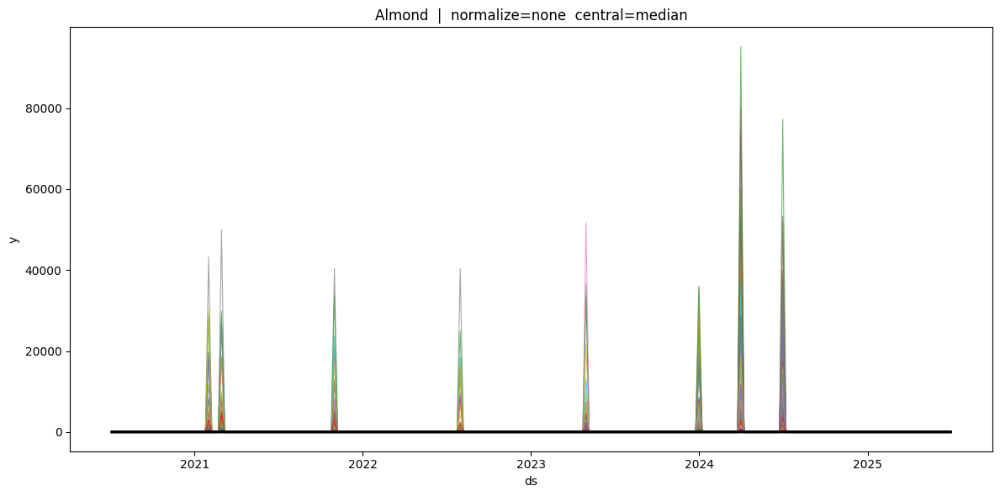

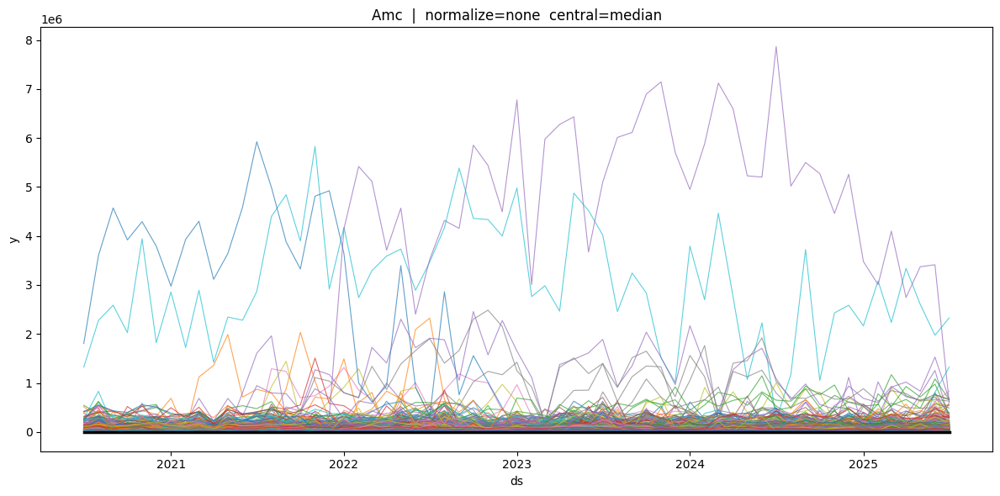

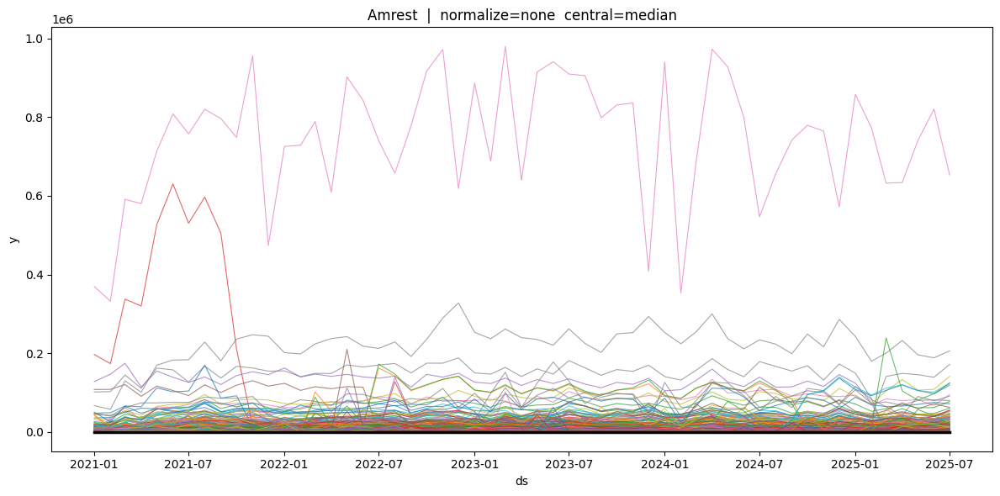

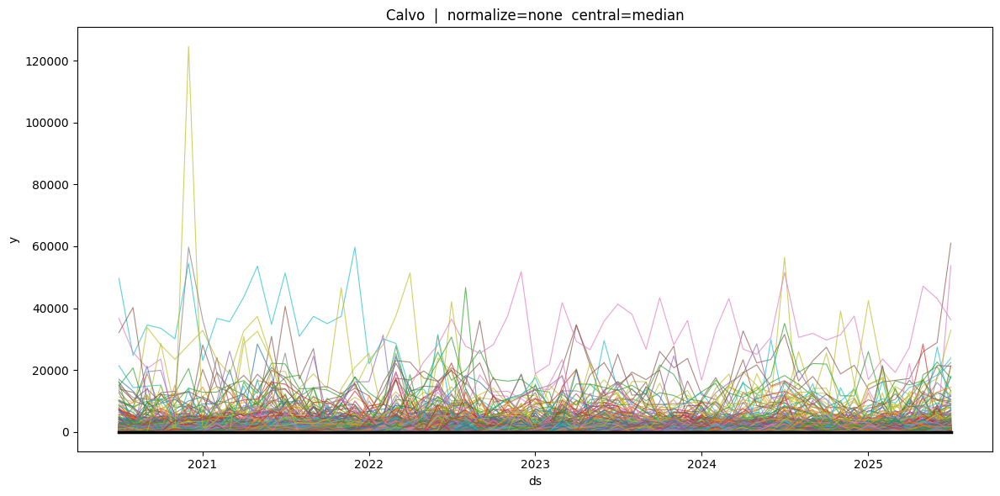

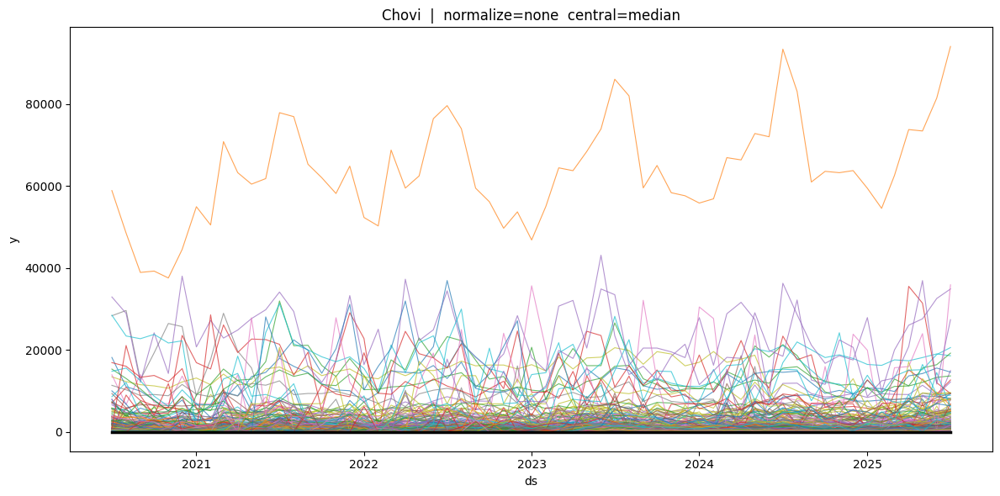

...

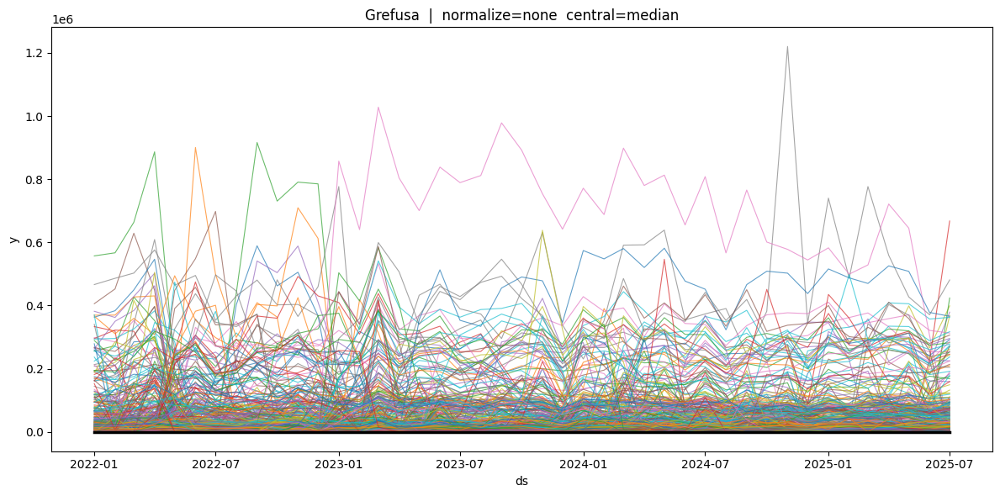

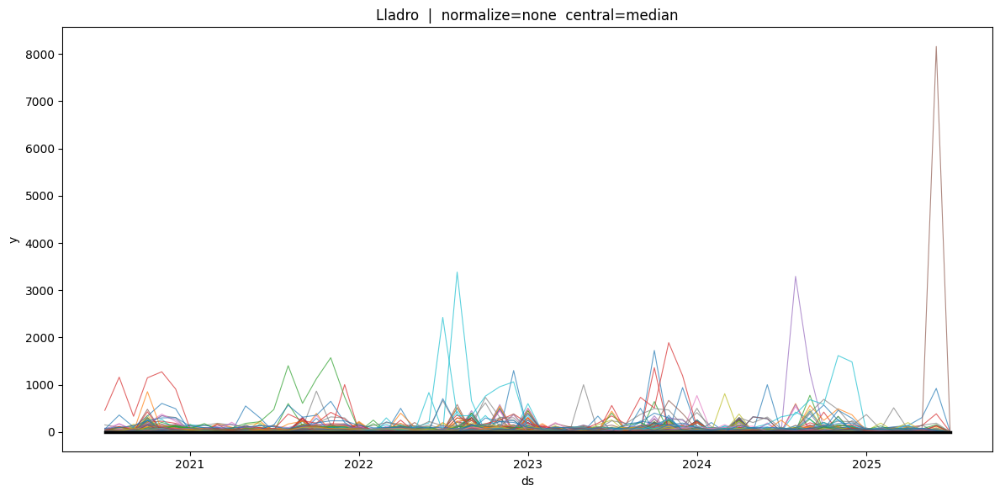

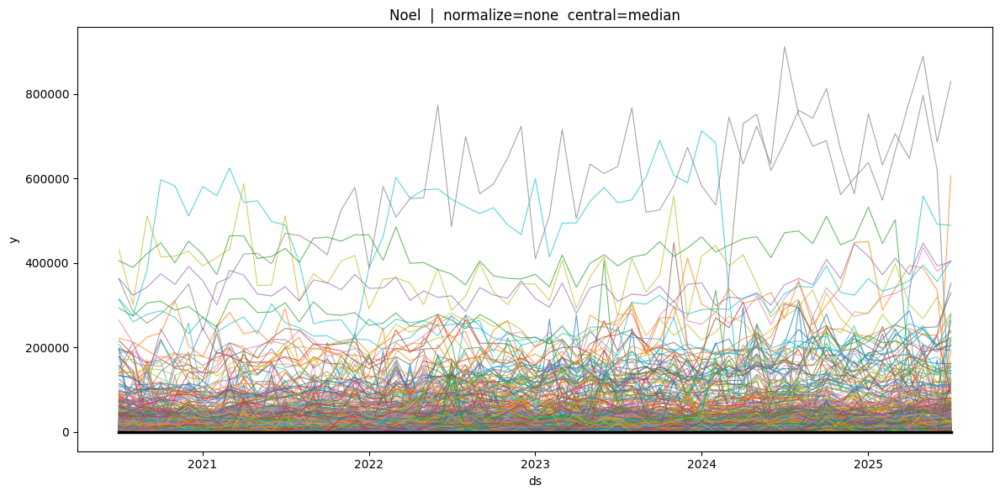

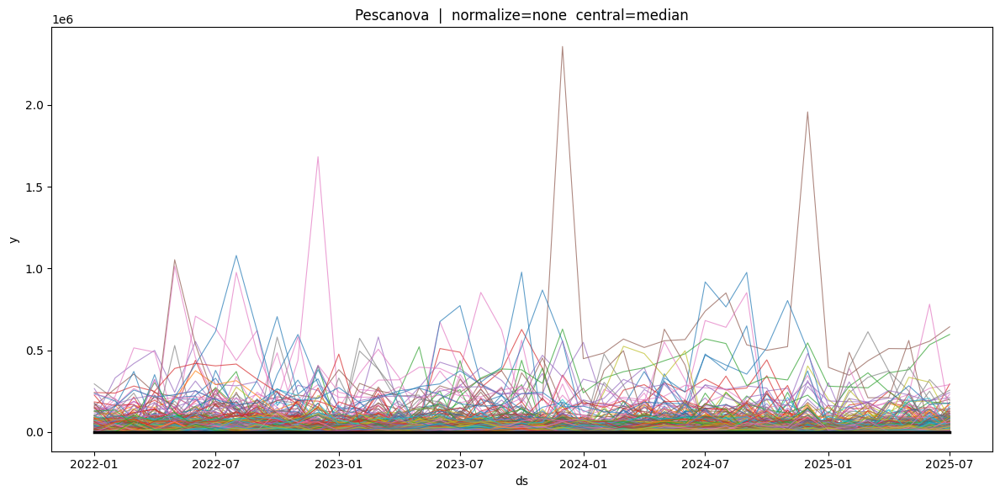

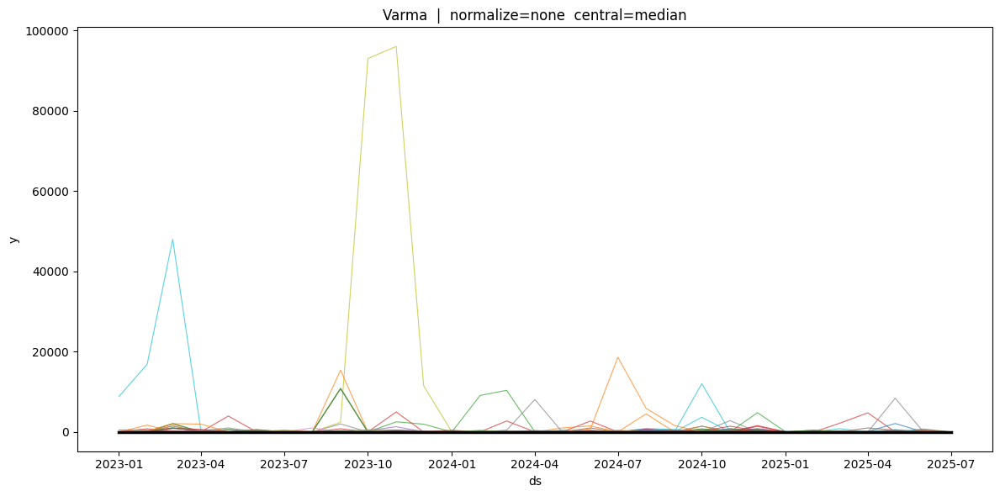

In [12]:
# TODAS LAS SERIES DE <cliente>, SIN NORMALIZAR Y SIN LEYENDA:
plot_series(dfs_ready['Almond'][0],      'Almond',      dfs_ready['Almond'][1],      plot_all = True, show_legend = False)
plot_series(dfs_ready['Amc'][0],         'Amc',         dfs_ready['Amc'][1],         plot_all = True, show_legend = False)
plot_series(dfs_ready['Amrest'][0],      'Amrest',      dfs_ready['Amrest'][1],      plot_all = True, show_legend = False)
plot_series(dfs_ready['Calvo'][0],       'Calvo',       dfs_ready['Calvo'][1],       plot_all = True, show_legend = False)
plot_series(dfs_ready['Chovi'][0],       'Chovi',       dfs_ready['Chovi'][1],       plot_all = True, show_legend = False)
plot_series(dfs_ready['Cuatrogasa'][0],  'Cuatrogasa',  dfs_ready['Cuatrogasa'][1],  plot_all = True, show_legend = False)
plot_series(dfs_ready['Damel'][0],       'Damel',       dfs_ready['Damel'][1],       plot_all = True, show_legend = False)
plot_series(dfs_ready['Fiorucci'][0],    'Fiorucci',    dfs_ready['Fiorucci'][1],    plot_all = True, show_legend = False)
plot_series(dfs_ready['Frescobaldi'][0], 'Frescobaldi', dfs_ready['Frescobaldi'][1], plot_all = True, show_legend = False)
plot_series(dfs_ready['Frias'][0],       'Frias',       dfs_ready['Frias'][1],       plot_all = True, show_legend = False)
plot_series(dfs_ready['Grefusa'][0],     'Grefusa',     dfs_ready['Grefusa'][1],     plot_all = True, show_legend = False)
plot_series(dfs_ready['Lladro'][0],      'Lladro',      dfs_ready['Lladro'][1],      plot_all = True, show_legend = False)
plot_series(dfs_ready['Noel'][0],        'Noel',        dfs_ready['Noel'][1],        plot_all = True, show_legend = False)
plot_series(dfs_ready['Pescanova'][0],   'Pescanova',   dfs_ready['Pescanova'][1],   plot_all = True, show_legend = False)
plot_series(dfs_ready['Varma'][0],       'Varma',       dfs_ready['Varma'][1],       plot_all = True, show_legend = False)

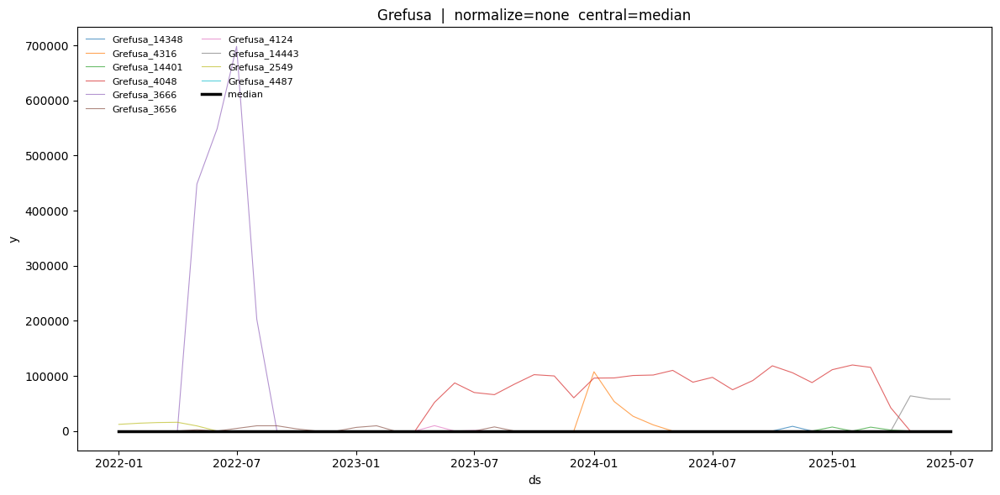

In [13]:
## 10 SERIES ALEATORIAS DE <cliente>, SIN NORMALIZAR Y CON LEYENDA:
plot_series(dfs_ready['Grefusa'][0], 'Grefusa', dfs_ready['Grefusa'][1],
            n=10, normalize='none', show_legend=True)

# Resumen / Overview adaptado a tu pipeline actual

- Lo he ajsutado para usar directamente dfs_ready (que es el diccionario que sale del Script 1).
- Corrige el typo zero_sare -> zero_share.
- Mantiene el cálculo de gaps en función de la freq.

In [14]:
import pandas as pd

# Usa el diccionario final del Script 1
dfs_trimmed = dfs_ready   # si prefieres otro nombre, puedes mantener dfs_ready

def summarize_filled(df: pd.DataFrame, freq: str = "MS"):
    dfx = df[['unique_id','ds','y']].copy()
    dfx['ds'] = pd.to_datetime(dfx['ds'], errors='coerce')
    dfx['y']  = pd.to_numeric(dfx['y'], errors='coerce')

    g = (dfx.groupby('unique_id', as_index=False)
            .agg(start=('ds','min'),
                 end=('ds','max'),
                 n_obs=('ds','size'),
                 sum_y=('y','sum'),
                 mean_y=('y','mean'),
                 zeros=('y', lambda s: (s==0).sum()))
        )
    if freq == "W-MON":
        g['expected'] = ((g['end'] - g['start']).dt.days // 7) + 1
    else:  # mensual
        g['expected'] = ((g['end'].dt.year - g['start'].dt.year)*12
                         + (g['end'].dt.month - g['start'].dt.month) + 1)
    g['gaps'] = g['expected'] - g['n_obs']
    g['zero_share'] = (g['zeros'] / g['n_obs']).astype('float64')

    global_summary = pd.DataFrame({
        'n_series':        [g.shape[0]],
        'rows':            [len(dfx)],
        'date_min':        [dfx['ds'].min()],
        'date_max':        [dfx['ds'].max()],
        'mean_len':        [g['n_obs'].mean()],
        'median_len':      [g['n_obs'].median()],
        'series_with_gaps':[int((g['gaps']>0).sum())],
        'mean_zero_share': [g['zero_share'].mean()],
        'sum_y_total':     [g['sum_y'].sum()],
    })
    return g, global_summary

# Ejecutar resumen para todos y recoger resultados
per_series_profiles = {}
dataset_overview = []

for name, (dff, freq) in dfs_trimmed.items():
    g, glob = summarize_filled(dff, freq)
    per_series_profiles[name] = g
    glob.insert(0, 'dataset', name)
    dataset_overview.append(glob)

dataset_overview = pd.concat(dataset_overview, ignore_index=True)

display_cols = ['dataset','n_series','rows','date_min','date_max',
                'mean_len','median_len','series_with_gaps','mean_zero_share','sum_y_total']
print(dataset_overview[display_cols].sort_values(['date_max','dataset']).to_string(index=False))

# Ejemplos:
# per_series_profiles['Frias'].sort_values('gaps', ascending=False).head()
# per_series_profiles['Cuatrogasa'].sort_values('gaps', ascending=False).head()

    dataset  n_series   rows   date_min   date_max   mean_len  median_len  series_with_gaps  mean_zero_share  sum_y_total
     Almond       681 141476 2020-07-06 2025-06-30 207.747430       261.0                 0         0.977226 4.698217e+06
        Amc      3592 217551 2020-07-01 2025-07-01  60.565423        61.0                 0         0.662543 3.278283e+09
     Amrest      2526 114475 2021-01-01 2025-07-01  45.318686        53.0                 0         0.602331 2.465340e+08
      Calvo      2430 102149 2020-07-01 2025-07-01  42.036626        51.0                 0         0.505270 5.297055e+07
      Chovi       561  23056 2020-07-01 2025-07-01  41.098039        52.0                 0         0.472564 2.922931e+07
 Cuatrogasa      1308  45724 2020-07-01 2025-07-01  34.957187        43.0                 0         0.367184 7.831633e+06
      Damel      2579  90557 2021-01-01 2025-07-01  35.113222        42.0                 0         0.511109 5.479219e+08
   Fiorucci       446  1

In [ ]:
# import pandas as pd

# # --- Diccionario con tus DF rellenados y recortados ---
# dfs_trimmed = {                                        # volver a dfs_filled si hay errores
#     "Almond":      (df_Almond_filled,      "W-MON"),
#     "Amc":         (df_Amc_filled,         "MS"),
#     "Amrest":      (df_Amrest_filled,      "MS"),
#     "Calvo":       (df_Calvo_filled,       "MS"),
#     "Chovi":       (df_Chovi_filled,       "MS"),
#     "Cuatrogasa":  (df_Cuatrogasa_filled,  "MS"),
#     "Damel":       (df_Damel_filled,       "MS"),
#     "Fiorucci":    (df_Fiorucci_filled,    "MS"),
#     "Frescobaldi": (df_Frescobaldi_filled, "MS"),
#     "Frias":       (df_Frias_filled,       "MS"),
#     "Grefusa":     (df_Grefusa_filled,     "MS"),
#     "Lladro":      (df_Lladro_filled,      "MS"),
#     "Noel":        (df_Noel_filled,        "MS"),
#     "Pescanova":   (df_Pescanova_filled,   "MS"),
#     "Varma":       (df_Varma_filled,       "MS"),
# }

# def summarize_filled(df: pd.DataFrame, freq: str = "MS"):
#     dfx = df[['unique_id','ds','y']].copy()
#     dfx['ds'] = pd.to_datetime(dfx['ds'], errors='coerce')
#     dfx['y']  = pd.to_numeric(dfx['y'], errors='coerce')

#     # Perfil por serie
#     g = (dfx
#          .groupby('unique_id', as_index=False)
#          .agg(start=('ds','min'),
#               end=('ds','max'),
#               n_obs=('ds','size'),
#               sum_y=('y','sum'),
#               mean_y=('y','mean'),
#               zeros=('y', lambda s: (s==0).sum()))
#         )
#     if freq == "W-MON":
#         g['expected'] = ((g['end'] - g['start']).dt.days // 7) + 1
#     else:  # mensual
#         g['expected'] = ((g['end'].dt.year - g['start'].dt.year)*12
#                          + (g['end'].dt.month - g['start'].dt.month) + 1)

#     g['gaps'] = g['expected'] - g['n_obs']
#     g['zero_share'] = (g['zeros'] / g['n_obs']).astype('float64')

#     # Resumen global del dataframe
#     global_summary = pd.DataFrame({
#         'n_series':        [g.shape[0]],
#         'rows':            [len(dfx)],
#         'date_min':        [dfx['ds'].min()],
#         'date_max':        [dfx['ds'].max()],
#         'mean_len':        [g['n_obs'].mean()],
#         'median_len':      [g['n_obs'].median()],
#         'series_with_gaps':[int((g['gaps']>0).sum())],
#         'mean_zero_share': [g['zero_share'].mean()],
#         'sum_y_total':     [g['sum_y'].sum()],
#     })
#     return g, global_summary

# # Ejecutar resumen para todos y recoger resultados
# per_series_profiles = {}   # dict[name] -> DataFrame por serie
# dataset_overview   = []    # lista de filas globales

# for name, (dff, freq) in dfs_trimmed.items():
#     g, glob = summarize_filled(dff, freq)
#     per_series_profiles[name] = g
#     glob.insert(0, 'dataset', name)
#     dataset_overview.append(glob)

# dataset_overview = pd.concat(dataset_overview, ignore_index=True)

# # Mostrar resumen global ordenado por date_max y n_series
# display_cols = ['dataset','n_series','rows','date_min','date_max',
#                 'mean_len','median_len','series_with_gaps','mean_zero_share','sum_y_total']
# print(dataset_overview[display_cols].sort_values(['date_max','dataset']).to_string(index=False))

# # Ejemplos: ver las 5 series con más huecos en Frias y Cuatrogasa
# # per_series_profiles['Frias'].sort_values('gaps', ascending=False).head()
# # per_series_profiles['Cuatrogasa'].sort_values('gaps', ascending=False).head()


- dataset: nombre del DF.
- n_series: nº de unique_id distintos (series).
- rows: nº de filas tras el relleno (una por periodo y serie).
- date_min / date_max: primer y último ds presente.
- mean_len / median_len: media y mediana de longitud (nº de periodos) por serie.
- series_with_gaps: Cuántas series aún tienen huecos (nº de periodos) por serie.
- mean_zero_share: media, por serie, del % de ceros (0.0) en y. Valores altos => demanda intermitente.
- sum_y_total:  suma total de y en el DF.

Zero-share alto (≈0.65–0.75): bastante intermitencia.

In [15]:
import pandas as pd

# === OVERVIEW / REPORT (usa SIEMPRE dfs_ready) ===============================
# Alias opcional para mayor claridad (NO se redefine nada)
dfs_sets = dfs_ready # viene del Script 1


def series_profile(df: pd.DataFrame, freq: str):
    """Tabla por unique_id con métricas básicas."""
    dfx = df[['unique_id', 'ds', 'y']].copy()
    dfx['ds'] = pd.to_datetime(dfx['ds'], errors = 'coerce')
    dfx['y']  = pd.to_numeric(dfx['y'], errors = 'coerce')

    prof = (dfx.groupby('unique_id', as_index = False)
              .agg(start      = ('ds',  'min'),
                   end        = ('ds',  'max'),
                   n_obs      = ('ds', 'size'),
                   sum_y      = ('y',   'sum'),
                   mean_y     = ('y',  'mean'),
                   zeros      = ('y', lambda s: (s == 0).sum()),
                   zero_share = ('y', lambda s: (s == 0).mean())))

    # nº de periodos esperados segun freq
    if freq == "W-MON":
        prof['expected'] = ((prof['end'] - prof['start']).dt.days // 7) + 1
    else:
        prof['expected'] = ((prof['end'].dt.year - prof['start'].dt.year) * 12
                            + (prof['end'].dt.month - prof['start'].dt.month) + 1)
    prof['gaps'] = prof['expected'] - prof['n_obs']
    return prof

def dataset_overview(df: pd.DataFrame, freq: str):
    """Resumen global del DF."""
    dfx = df[['unique_id', 'ds', 'y']].copy()
    dfx['ds'] = pd.to_datetime(dfx['ds'], errors = 'coerce')
    dfx['y']  = pd.to_numeric(dfx['y'],  errors = 'coerce')

    prof = series_profile(dfx, freq)

    out = pd.DataFrame({
        'n_series':        [prof.shape[0]],
        'rows':            [len(dfx)],
        'date_min':        [dfx['ds'].min()],
        'date_max':        [dfx['ds'].max()],
        'mean_len':        [prof['n_obs'].mean()],
        'median_len':      [prof['n_obs'].median()],
        'series_with_gaps':[int((prof['gaps'] > 0).sum())],
        'mean_zero_share': [prof['zero_share'].mean()],
        'sum_y_total':     [prof['sum_y'].sum()],
    })
    return out, prof

def print_full_report(name: str, df: pd.DataFrame, freq: str):
    """Imprime un informe compacto/útil por dataset."""
    overview, prof = dataset_overview(df, freq)

    print("=" * 80)
    print(f"DATASET: {name}")
    print(overview.to_string(index = False))

    # Estadísticos de y a nivel fila
    y_desc = (df['y'].apply(pd.to_numeric, errors = 'coerce')
                     .describe(percentiles = [.01, .05, .25, .5, .75, .95, .99]))
    print("\n[ y (fila a fila) - describe ]")
    print(y_desc.to_string())

    # Estadísticos por serie
    print("\n[ n_obs por serie - describe ]")
    print(prof['n_obs'].describe().to_string())

    print("\n[ zero_share por serie - describe ]")
    print(prof['zero_share'].describe().to_string())

    print("\n[ sum_y por serie - describe ]")
    print(prof['sum_y'].describe(percentiles = [.5, .9, .95, .99]).to_string())

    # Top 10 series por sum_y
    top10 = prof.nlargest(10, 'sum_y')[['unique_id', 'sum_y', 'n_obs', 'zero_share']]
    print("\n[ Top 10 series por sum_y ]")
    print(top10.to_string(index = False))

# === USO 1: ver un dataset concreto ===
print_full_report("Noel", *dfs_sets["Noel"])

# === USO 2: iterar por todos (cuidado: imprime bastante) ===
# for name, (dfx, freq) in dfs_filled.items():
#     print_full_report(name, dfx, freq)


DATASET: Noel
 n_series   rows   date_min   date_max  mean_len  median_len  series_with_gaps  mean_zero_share  sum_y_total
     3126 136335 2020-07-01 2025-07-01 43.613244        49.0                 0         0.546817 1.056926e+09

[ y (fila a fila) - describe ]
count    136335.000000
mean       7752.419816
std       32879.763206
min           0.000000
1%            0.000000
5%            0.000000
25%           0.000000
50%           0.000000
75%        2268.000000
95%       35363.700000
99%      153039.800000
max      912016.000000

[ n_obs por serie - describe ]
count    3126.000000
mean       43.613244
std        18.639428
min         1.000000
25%        31.000000
50%        49.000000
75%        61.000000
max        61.000000

[ zero_share por serie - describe ]
count    3126.000000
mean        0.546817
std         0.367607
min         0.000000
25%         0.166667
50%         0.639672
75%         0.894737
max         0.983607

[ sum_y por serie - describe ]
count    3.126000e+03
m

---

# B2: CARACTERIZACIÓN DE LA DEMANDA
## Clasificación Syntetos-Boylan: Manual y pyInterDemand (PID)

In [39]:
# # ADI - AVERAGE DEMAND INTERVAL (MANUAL)
# def calculate_adi(ts: pd.Series) -> float:
#     n_tot = len(ts)
#     n_nonzero = (ts > 0).sum()
#     return n_tot / n_nonzero if n_nonzero > 0 else np.inf

#     # ADI = total_periodos / número_periodos_con_demanda
#     # Si nunca hay demanda: ADI = infinito -> Comportamiento constante nulo.

In [40]:
# # CV2 - SQUARED COEFFICIENT OF VARIATION (MANUAL)
# def calculate_cv2(ts:pd.Series) -> float:
#     v = ts[ts > 0]
#     mu = v.mean()
#     sigma = v.std(ddof = 0) # Poblacional ddof = 0; Muestral ddof = 1 ¡¡¡OJO CUIDAO!!!
#     return (sigma / mu)**2 if mu != 0 else np.nan

#     # CV2 = (Desviación estándar / media)^2
#     # Se clacula sólo con valores positivos.
#     # Cuando mayor es CV2, más variable es la serie.

In [41]:
# # CLASIFICACIÓN MANUAL
# # Función characterize_series()
# # Recorre cada unique_id (SKU), extrae su serie temporal ordenada y calcula:
# # - Estadísticas
# # - Clasificación según SB(2005)

# def characterize_series(df, ds_col: str = 'ds', id_col: str = 'unique_id', y_col: str = 'y') -> pd.DataFrame:
#     # ¿Cuántas series tenemos? (SKU únicos)
#     unique_ids = df[id_col].unique()
#     print(f"✔️ Encontradas {len(unique_ids)} series distintas (IDs).")

#     records = []
#     for uid in unique_ids:
#         grp = df[df[id_col] == uid]
#         ts = grp.set_index(ds_col)[y_col].sort_index()

#         # ADI y CV2
#         adi = calculate_adi(ts)
#         cv2 = calculate_cv2(ts)

#         # Estadísticas descriptivas de 'y'
#         desc = ts.describe() # count, mean, std, min, 25%, 50%, 75%, max

#         # Proporción de ceros
#         pZeros = (ts == 0).mean()

#         # Categoría final (mismo criterio interno)
#         if   (adi >= 1.32 and cv2 <= 0.49): cat = 'Intermittent'
#         elif (adi >= 1.32 and cv2 >= 0.49): cat = 'Lumpy'
#         elif (adi <= 1.32 and cv2 >= 0.49): cat = 'Erratic'
#         else:                                cat = 'Smooth'

#         # No se incluye explícitamente la categoría 'Continuous' pero, como estamos trabajando con series intermitentes, 
#         # todas tendrán algún cero.

#         records.append({
#             id_col: uid,
#             'mean'      : desc['mean'],
#             'std'       : desc['std'],
#             'min'       : desc['min'],
#             '25%'       : desc['25%'],
#             'median'    : desc['50%'],
#             '75%'       : desc['75%'],
#             'max'       : desc['max'],
#             'first_date': ts.index.min(),
#             'last_date' : ts.index.max(),
#             'length'    : len(ts),
#             'pZeros'    : pz
#             'ADI'       : adi,
#             'CV2'       : cv2,
#             'Cat'       : cat
#         })
    
#     summary_df = pd.DataFrame.from_records(records)

#     # Asegurar el orden de columnas
#     cols = [id_col, 'mean', 'std', 'min', '25%', 'median', '75%', 'max', 'first_date', 'last_date', 'length', 'pZeros', 'Cat', 'ADI', 'CV2']
#     return summary_df.loc[:, cols].reset_index(drop = True)
#     #      ^---------------- seleccionamos 'todas las filas' y luego las columnas
#     # Con esto se tiene un dataframe de series caracterizadas, donde cada fila representa una serie (unique_id - SKU) y contiene:
#     # - Sus estadísticas agregadas.
#     # - Su nivel de intermitencia.
#     # - Su categoría (Smooth (STS), Erratic (ETS), Intermittent (ITS), Lumpy (LTS))
#     #
#     # Esto es clave para los siguientes pasos:
#     # - Dividir por tipo de serie y horizonte posible.
#     # - Aplicar modelos adaptados a cada grupo.


In [42]:
# # CLASIFICACIÓN PID
# # Función v_q_values()
# def v_q_values(ts):
#     v = ts[ts < 0]
#     q = []
#     count = 0
#     for i, val in enumerate(ts):
#         count = count + 1
#         if (val > 0):
#             q.append(count)
#             count = 0
#         return v, np.asarray(q)

# # Función classification()
# def classification(ts):
#     v, q = v_q_values(ts)
#     adi_PID = len(ts) / len(ts[ts > 0]) if len(ts[ts > 0]) > 0 else float('inf')
#     cv_PID = (sum(((v - ts.mean())**2) / len(ts) / ts.mean()))
#     f_type = 'Smooth'
    
#     if (adi_PID > 1.32 and cv_PID < 0.49):
#         f_type = 'Intermittent'
#     elif (adi_PID > 1.32 and cv_PID > 0.49):
#         f_type = 'Lumpy'
#     elif (adi_PID < 1.32 and cv_PID > 0.49):
#         f_type = 'Erratic'
    
#     print('ADI: ', round(adi_PID, 3), ',CV: ', round(cv_PID, 3), ', Type:', f_type)
#     return adi_PID, cvcv_PID_squared

# NUEVA VERSIÓN DE CLASIFICACIÓN SB-2005

Continuas vs. intermitentes

- Serie continua: hay demanda casi todos los períodos (o todos). La línea rara vez toca cero.
- Serie intermitente: hay muchos períodos con cero y, de vez en cuando, aparece un pico.

Cómo distinguirlas de forma objetiva

La forma estándar (Syntetos-Boylan) usa dos métricas calculadas por serie:
1. ADI (Average Inter-Demand Interval)
   "Cada cuántos periodos, en media, aparece una demanda distinta de cero."
   ADI = T / N_+
   donde: T = nº de periodos totales
          N_+ = nº de periodos con demanda > 0.
   Relación con la proporción de ceros p_0:
   ADI = 1 / (1 - p_0) (porque 1 - p_0 = N_+ / T).
   Umbral típico:
    - ADI <  1.32 -> Demanda no intermitente (bastante continua).
    - ADI >= 1.32 -> Demanda intermitente

2. CV^2 (Coeficiente de variación al cuadrado) de los tamaños de demanda.
    Mide la variabilidad de los tamaños solo cuando hay demanda (se usa la muestra de valores > 0):
    CV*2 = (\sigma_z / \mu_z)^2, z = tamaños de demanda positivos
    Umbral típico:
     - CV^2 < 0.49 (baja variabilidad) vs. > 0.49 (alta).

Con esos dos umbrales se obtienen cuatro clases (Syntetos-Boylan, muy usadas en supply chain):

|                | CV² < 0.49 (baja var.)                                          | CV² ≥ 0.49 (alta var.)                           |
| -------------- | --------------------------------------------------------------- | ------------------------------------------------ |
| **ADI < 1.32** | **Smooth** (continua y estable)                                 | **Erratic** (continua pero muy variable)         |
| **ADI ≥ 1.32** | **Intermittent** (muchos ceros, tamaños relativamente estables) | **Lumpy** (muchos ceros y tamaños muy variables) |

Por qué importa (modelado)
- Continuas (smooth/erratic): funcionan bien ETS/ARIMA/auto-ARIMA, TBATS, etc.
- Intermitentes (intermittent, lumpy): mejor separar "llegadas" y "tamaños" (Croston, SBA, TSB, IMAPA/MAPA).
  La predicción suele ser y_pred = p_pred x z_pred (probabilidad de demanda x tamaño medio)

In [16]:
# === CLASIFICACIÓN Y MÉTRICAS (usa SIEMPRE dfs_ready) =======================
# --- MÉTRICAS MANUALES (SB-2005) ------------------------------------

def calculate_adi(ts: pd.Series) -> float:
    """Average Demand Interval: total_periodos / nº periodos con demanda > 0."""
    n_tot = len(ts)
    n_nonzero = (ts > 0).sum()
    return n_tot / n_nonzero if n_nonzero > 0 else np.inf

def calculate_cv2(ts: pd.Series) -> float:
    """
    CV^2 sobre valores positivos.
    Poblacional: std(ddof = 0). x/n
    Muestra:     std(ddof = 1). x/(n-1)
    """
    v = ts[ts > 0]
    mu = v.mean()
    if mu == 0 or v.empty:
        return np.nan
    sigma = v.std(ddof = 0) # Varianza Poblacional (ddof = 1) para Muestral.
    return (sigma / mu) ** 2

def sb_classify(adi: float, cv2: float) -> str:
    """Clasificación Syntetos-Boylan (2005). Umbrales: 1.32 y 0.49.
       Incluye clase AllZero si no hay demanda positiva."""
    if np.isinf(adi): # n_nonzero = 0 -> ADI = ∞
        # Sin demanda en todo el horizonte → "Intermittent"/"Constant zero"; puedes personalizar
        return 'AllZero'
    if   (adi >= 1.32 and (pd.isna(cv2) or cv2 <= 0.49)): return 'Intermittent'
    elif (adi >= 1.32 and cv2 >  0.49):                   return 'Lumpy'
    elif (adi <  1.32 and cv2 >  0.49):                   return 'Erratic'
    else:                                                 return 'Smooth'


# --- UTILIDADES PID (pyInterDemand-like) ------------------------------------

def v_q_values(ts:pd.Series):
    """
    v: valores de demanda positiva
    q: longitudes de intervalos entre positivos (incluye el periodo con demanda)
        p.ej. ts = [0, 2, 0, 0, 5, 0, 1] → posiciones positivas [1, 4, 6] → q = [2, 3, 2]
    """
    arr = np.asarray(ts)
    pos_idx = np.where(arr > 0)[0]
    v = arr[pos_idx]
    q = []
    if pos_idx.size > 0:
        # Distancia desde el inicio hasta la 1ª demanda positiva
        q.append(pos_idx[0] + 1)
        # Distancias entre demandas positivas consecutivas
        if pos_idx.size > 1:
            q.extend(np.diff(pos_idx).tolist())
    return v, np.asarray(q, dtype = int)

def pid_metrics(ts: pd.Series):
    """
    ADI_PID: idéntico a ADI (T/Nz).
    CV2_PID: CV^2 Calculado sobre v (positivos), poblacional (ddof = 0).
             Si tu pyInterDemand usa ddof = 1, cambia esa línea.
    """
    adi_pid = calculate_adi(ts)
    v, _q = v_q_values(ts)
    if v.size == 0:
        return adi_pid, np.nan
    mu = v.mean()
    if mu == 0:
        return adi_pid, np.nan
    sigma = v.std(ddof = 0) # Varianza Poblacional (ddof = 1) para Muestral.
    cv2_pid = (sigma / mu) ** 2
    return adi_pid, cv2_pid

def pid_classify(adi_pid: float, cv2_pid: float) -> str:
    # Mantiene la misma lógica; AllZero cuando ADI_PID = ∞
    return sb_classify(adi_pid, cv2_pid)


# --- FUNCIÓN PRINCIPAL: RESUMEN UNIFICADO ------------------------------------
def characterize_series_unified(
    df: pd.DataFrame,
    ds_col: str = 'ds',
    id_col: str = 'unique_id',
    y_col:  str = 'y'
) -> pd.DataFrame:
    """
    Devuelve una tabla resumen por serie con:
    - Estadísticos agregados
    - Proporción de ceros
    - ADI, CV2, Cat (Manual SB-2005)
    - ADI_PID, CV2_PID, Cat_PID (versión PID)
    """
    # Asegura orden temporal y tipos
    df = df.copy()
    df[ds_col] = pd.to_datetime(df[ds_col], errors = 'coerce')
    df = df.sort_values([id_col, ds_col])

    records = []
    for uid, grp in df.groupby(id_col, sort = False):
        ts = grp.set_index(ds_col)[y_col].sort_index()

        # Estadísticos básicos (sobre toda la serie, incluidos ceros)
        desc = ts.describe(percentiles = [0.25, 0.5, 0.75])
        pZeros = float((ts == 0).mean())

        # ---- Manual
        adi = calculate_adi(ts)
        cv2 = calculate_cv2(ts)
        cat = sb_classify(adi, cv2)

        # ---- PID (compatible pyInterDemand)
        adi_pid, cv2_pid = pid_metrics(ts)
        cat_pid = pid_classify(adi_pid, cv2_pid)

        records.append({
            id_col      : uid,
            'mean'      : desc.get('mean', np.nan),
            'std'       : desc.get('std',  np.nan),
            'min'       : desc.get('min',  np.nan),
            '25%'       : desc.get('25%',  np.nan),
            'median'    : desc.get('50%',  np.nan),
            '75%'       : desc.get('75%',  np.nan),
            'max'       : desc.get('max',  np.nan),
            'first_date': ts.index.min(),
            'last_date' : ts.index.max(),
            'length'    : int(ts.shape[0]),
            'pZeros'    : pZeros,
            # Manual
            'ADI'       : float(adi),
            'CV2'       : float(cv2) if pd.notna(cv2) else np.nan,
            'Cat'       : cat,
            # PIS
            'ADI_PID'   : float(adi_pid),
            'CV2_PID'   : float(cv2_pid) if pd.notna(cv2_pid) else np.nan,
            'Cat_PID'   : cat_pid
        })
    
    cols = [
        id_col, 'mean', 'std', 'min', '25%', 'median', '75%', 'max',
        'first_date', 'last_date', 'length', 'pZeros',
        'Cat', 'ADI', 'CV2',            # Manual
        'Cat_PID', 'ADI_PID', 'CV2_PID' # PID
    ]
    out = pd.DataFrame.from_records(records)
    return out.loc[:, cols].reset_index(drop = True)

In [17]:
# === VISUALIZACIÓN ===========================================================
# Incluye AllZero y evitar problemas con inf/NaN en el scatter
def plot_demand_by_category(summary_df,
                            cat_col = 'Cat',
                            cv2_col = 'CV2',
                            adi_col = 'ADI',
                            title = 'Perfil de Demanda: CV² vs ADI'):
    """
    Scatter CV² vs ADI por categoría.
    cat_col: 'Cat' (manual) o 'Cat_PID'
    cv2_col: 'CV2' (manual) o 'CV2_PID'
    adi_col: 'ADI' (manual) o 'ADI_PID'
    """
    for col in [cat_col, cv2_col, adi_col]:
        if col not in summary_df.columns:
            raise KeyError(f"Columna '{col}' no encontrada en summary_df.")

    siglas = {'AllZero':'AZ',
              'Intermittent':'ITS', 
              'Smooth':'STS', 
              'Erratic':'ETS', 
              'Lumpy':'LTS'}

    ordered_cats = ['Smooth', 'Erratic', 'Intermittent', 'Lumpy', 'AllZero']

    fig, ax = plt.subplots(figsize = (10, 8))

    for cat in ordered_cats:
        df_cat = summary_df[summary_df[cat_col] == cat]
        if df_cat.empty:
            continue
        # Para el scatter: quita inf/NaN (AllZero no se puede ubicar en el plano)
        df_plot = df_cat.replace([np.inf, -np.inf], np.nan).dropna(subset = [cv2_col, adi_col])
        if df_plot.empty:
            # Nada que dibujar (p.ej., AllZero); omitimos del scatter
            continue
        abbr = siglas.get(cat, cat)
        ax.scatter(df_plot[cv2_col], df_plot[adi_col],
                   label = f"{abbr} ({len(df_cat)})",
                   alpha = 0.6)
    
    # Umbrales SB
    ax.axvline(x = 0.49, linewidth = 1.2)
    ax.axhline(y = 1.32, linewidth = 1.2)
    ax.set_xlabel(r'CV$^2$ (Variabilidad relativa)')
    ax.set_ylabel('ADI (Intervalo medio de demanda)')
    ax.set_title(title)
    ax.legend(title = 'Categoría (nº series)') # el conteo incluye AllZero
    ax.grid(alpha = 0.3)
    plt.tight_layout()
    plt.show()

# --- TABLA RESUMEN: incluir siglas AZ para AllZero ---
def category_summary_table(summary_df, cat_col = 'Cat'):
    # Tabla resumen de la clasificación y composición de los datasets
    """
    Conteo y % por categoría. cat_col: 'Cat' o 'Cat_PID'.
    """
    if cat_col not in summary_df.columns:
        raise KeyError(f"Columna '{cat_col}' no encontrada en summary_df.")
    
    # Conteo (Absoluto y Relativo) y porcentaje por categoría
    vc  = summary_df[cat_col].value_counts(dropna = False).rename('count')
    pct = (vc / vc.sum() * 100).round(1).rename('percent')
    table = (pd.concat([vc, pct], axis = 1)
               .rename_axis('Cat')
               .reset_index())
    
    # Añade columna de siglas (Mapea categorías para etiquetación)
    siglas = {'Intermittent':'ITS',
              'Smooth':'STS',
              'Erratic':'ETS',
              'Lumpy':'LTS',
              'AllZero':'AZ'}
    table['abbr'] = table['Cat'].map(siglas).fillna(table['Cat'])

    return table[['Cat', 'abbr', 'count', 'percent']] # Reorden de columnas

In [18]:
# === API PRINCIPAL PARA CUALQUIER DATAFRAME ==================================

def demand_profile(
    df: pd.DataFrame, *,
    ds:        str = 'ds',
    id:        str = 'unique_id',
    y:         str = 'y',
    name:      str | None = None,
    plots:     bool = True,
    tables:    bool = True,
    save_dir:  str | None = None,
    show_head: int = 10
):
    """
    Ejecuta toda la canalización sobre 'df' con nombres de columnas parametrizables.
    El nombre del dataframe NO se usa dentro; sólo se pasa en la llamada.

    Retorna un dict con:
      - summary (DataFrame con métricas y clasificación)
      - table_manual (composición por Cat)
      - table_pid (composición por Cat_PID)
    """
    summary = characterize_series_unified(df, ds_col = ds, id_col = id, y_col = y)

    # Mostrar una vista rápida
    try:
        from IPython.display import display
        header = f"=== {name}: Summary ({len(summary)} series) ===" if name else f"=== Summary ({len(summary)} series) ==="
        print(header)
        display(summary.head(show_head))
    except Exception:
        print(summary.head(show_head).to_string(index=False))

    # Tablas de composición
    table_manual = category_summary_table(summary, cat_col = 'Cat')
    table_pid    = category_summary_table(summary, cat_col = 'Cat_PID')

    if tables:
        try:
            from IPython.display import display
            if name: print(f"\nComposición por categorías (Manual) — {name}")
            else:    print("\nComposición por categorías (Manual)")
            display(table_manual)

            if name: print(f"\nComposición por categorías (PID) — {name}")
            else:    print("\nComposición por categorías (PID)")
            display(table_pid)
        except Exception:
            print("\nComposición (Manual)\n", table_manual.to_string(index = False))
            print("\nComposición (PID)\n", table_pid.to_string(index = False))

    # Gráficos
    if plots:
        title_suffix = f" — {name}" if name else ""
        plot_demand_by_category(summary, 'Cat', 'CV2', 'ADI',
                                f'Perfil de Demanda (Manual): CV² vs ADI{title_suffix}')
        plot_demand_by_category(summary, 'Cat_PID', 'CV2_PID', 'ADI_PID',
                                f'Perfil de Demanda (PID): CV² vs ADI{title_suffix}')

    # Guardados opcionales
    if save_dir:
        summary.to_csv(f"{save_dir.rstrip('/')}/{name or 'dataset'}_summary.csv", index = False, encoding = 'utf-8')
        table_manual.to_csv(f"{save_dir.rstrip('/')}/{name or 'dataset'}_composition_manual.csv", index = False, encoding = 'utf-8')
        table_pid.to_csv(f"{save_dir.rstrip('/')}/{name or 'dataset'}_composition_pid.csv", index = False, encoding = 'utf-8')

    return {'summary': summary, 'table_manual': table_manual, 'table_pid': table_pid}

=== Almond: Summary (681 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Almond_1000,0.915709,5.943369,0.0,0.0,0.0,0.0,54.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.316924,Intermittent,32.625000,0.316924
1,Almond_1001,1.145594,7.458724,0.0,0.0,0.0,0.0,78.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.324996,Intermittent,32.625000,0.324996
2,Almond_1002,2.616858,17.791494,0.0,0.0,0.0,0.0,198.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.442040,Intermittent,32.625000,0.442040
3,Almond_1003,1.781609,13.718958,0.0,0.0,0.0,0.0,135.0,2020-07-06,2025-06-30,261,0.973180,Lumpy,37.285714,0.611012,Lumpy,37.285714,0.611012
4,Almond_1005,0.103448,1.671258,0.0,0.0,0.0,0.0,27.0,2020-07-06,2025-06-30,261,0.996169,Intermittent,261.000000,0.000000,Intermittent,261.000000,0.000000
5,Almond_1006,0.019157,0.222781,0.0,0.0,0.0,0.0,3.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.040000,Intermittent,130.500000,0.040000
6,Almond_1007,0.019157,0.222781,0.0,0.0,0.0,0.0,3.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.040000,Intermittent,130.500000,0.040000
7,Almond_1008,0.049808,0.582938,0.0,0.0,0.0,0.0,8.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.053254,Intermittent,130.500000,0.053254
8,Almond_1009,0.252874,2.967329,0.0,0.0,0.0,0.0,41.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.058770,Intermittent,130.500000,0.058770
9,Almond_1010,0.099617,1.149264,0.0,0.0,0.0,0.0,15.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.023669,Intermittent,130.500000,0.023669


=== Amc: Summary (3592 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,AMC_1,14545.180328,38450.845507,0.0,0.0,0.0,0.0,153696.0,2020-07-01,2025-07-01,61,0.852459,Intermittent,6.777778,0.161704,Intermittent,6.777778,0.161704
1,AMC_10,410.229508,1908.256939,0.0,0.0,0.0,0.0,11336.0,2020-07-01,2025-07-01,61,0.950820,Intermittent,20.333333,0.095906,Intermittent,20.333333,0.095906
2,AMC_100,2911.672131,1412.860983,0.0,1872.0,2808.0,3744.0,7488.0,2020-07-01,2025-07-01,61,0.032787,Smooth,1.033898,0.191218,Smooth,1.033898,0.191218
3,AMC_1000,1780.983607,6935.495585,0.0,0.0,0.0,0.0,36960.0,2020-07-01,2025-07-01,61,0.918033,Intermittent,12.200000,0.304602,Intermittent,12.200000,0.304602
4,AMC_1004,766.327869,1919.924414,0.0,0.0,0.0,0.0,11664.0,2020-07-01,2025-07-01,61,0.754098,Lumpy,4.066667,0.764077,Lumpy,4.066667,0.764077
5,AMC_1005,48771.540984,61824.196851,0.0,0.0,28272.0,77496.0,303280.0,2020-07-01,2025-07-01,61,0.491803,Intermittent,1.967742,0.311422,Intermittent,1.967742,0.311422
6,AMC_1006,137.704918,1075.509791,0.0,0.0,0.0,0.0,8400.0,2020-07-01,2025-07-01,61,0.983607,Intermittent,61.000000,0.000000,Intermittent,61.000000,0.000000
7,AMC_1008,6954.098361,15004.005840,0.0,0.0,0.0,0.0,61600.0,2020-07-01,2025-07-01,61,0.770492,Intermittent,4.357143,0.280386,Intermittent,4.357143,0.280386
8,AMC_1009,18067.081967,23721.279801,0.0,0.0,0.0,32340.0,85800.0,2020-07-01,2025-07-01,61,0.508197,Intermittent,2.033333,0.325701,Intermittent,2.033333,0.325701
9,AMC_101,972.721311,1599.742897,0.0,0.0,0.0,2280.0,5184.0,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.380146,Intermittent,2.652174,0.380146


=== Amrest: Summary (2526 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Amrest_10,44.418182,68.520527,0.0,0.0,15.0,61.50,301.0,2021-01-01,2025-07-01,55,0.472727,Lumpy,1.896552,0.759203,Lumpy,1.896552,0.759203
1,Amrest_100,121.678182,35.265489,56.0,98.0,114.0,146.00,229.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.082472,Smooth,1.000000,0.082472
2,Amrest_1000,1.333333,6.605783,0.0,0.0,0.0,0.00,40.0,2021-11-01,2025-07-01,45,0.955556,Intermittent,22.500000,0.111111,Intermittent,22.500000,0.111111
3,Amrest_1001,2.666667,10.954451,0.0,0.0,0.0,0.00,60.0,2021-11-01,2025-07-01,45,0.933333,Intermittent,15.000000,0.166667,Intermittent,15.000000,0.166667
4,Amrest_1002,14.945455,11.579705,0.0,7.5,15.0,20.00,57.0,2021-01-01,2025-07-01,55,0.218182,Smooth,1.279070,0.242619,Smooth,1.279070,0.242619
5,Amrest_1003,0.434783,2.948839,0.0,0.0,0.0,0.00,20.0,2021-10-01,2025-07-01,46,0.978261,Intermittent,46.000000,0.000000,Intermittent,46.000000,0.000000
6,Amrest_1004,0.452830,2.308563,0.0,0.0,0.0,0.00,12.0,2021-03-01,2025-07-01,53,0.962264,Intermittent,26.500000,0.000000,Intermittent,26.500000,0.000000
7,Amrest_1005,14.711538,34.940474,0.0,0.0,0.0,10.25,190.0,2021-04-01,2025-07-01,52,0.538462,Lumpy,2.166667,2.014922,Lumpy,2.166667,2.014922
8,Amrest_1006,9.133333,22.411036,0.0,0.0,1.0,6.00,119.0,2021-11-01,2025-07-01,45,0.466667,Lumpy,1.875000,2.673149,Lumpy,1.875000,2.673149
9,Amrest_1007,0.434783,2.948839,0.0,0.0,0.0,0.00,20.0,2021-10-01,2025-07-01,46,0.978261,Intermittent,46.000000,0.000000,Intermittent,46.000000,0.000000


=== Calvo: Summary (2430 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Calvo_10797,144.666667,200.751920,0.000,0.0000,0.000,246.5000,540.000,2024-08-01,2025-07-01,12,0.583333,Intermittent,2.400000,0.152167,Intermittent,2.400000,0.152167
1,Calvo_1080,2593.885246,4969.458334,0.000,0.0000,0.000,2225.0000,18793.000,2020-07-01,2025-07-01,61,0.606557,Lumpy,2.541667,0.813871,Lumpy,2.541667,0.813871
2,Calvo_10826,85.500000,100.109486,0.000,0.0000,39.000,156.0000,258.000,2024-08-01,2025-07-01,12,0.500000,Intermittent,2.000000,0.128347,Intermittent,2.000000,0.128347
3,Calvo_10829,60.083333,111.567720,0.000,0.0000,0.000,75.2500,360.000,2024-08-01,2025-07-01,12,0.666667,Intermittent,3.000000,0.386893,Intermittent,3.000000,0.386893
4,Calvo_10857,41.272727,136.886150,0.000,0.0000,0.000,0.0000,454.000,2024-09-01,2025-07-01,11,0.909091,Intermittent,11.000000,0.000000,Intermittent,11.000000,0.000000
5,Calvo_10858,91.070909,71.831293,25.250,41.7715,73.083,103.0845,268.075,2024-09-01,2025-07-01,11,0.000000,Erratic,1.000000,0.565556,Erratic,1.000000,0.565556
6,Calvo_10861,241.454545,145.473272,0.000,140.0000,260.000,364.0000,404.000,2024-09-01,2025-07-01,11,0.090909,Smooth,1.100000,0.209083,Smooth,1.100000,0.209083
7,Calvo_10864,126.000000,160.847754,0.000,0.0000,84.000,210.0000,336.000,2025-04-01,2025-07-01,4,0.500000,Intermittent,2.000000,0.111111,Intermittent,2.000000,0.111111
8,Calvo_10866,443.000000,189.267007,217.000,300.0000,438.000,600.0000,660.000,2025-03-01,2025-07-01,5,0.000000,Smooth,1.000000,0.146027,Smooth,1.000000,0.146027
9,Calvo_10876,105.238727,81.882914,6.167,57.2300,78.874,118.1870,256.957,2024-09-01,2025-07-01,11,0.000000,Erratic,1.000000,0.550355,Erratic,1.000000,0.550355


=== Chovi: Summary (561 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Chovi_1,215.754098,515.601806,0.0,0.00,0.0,0.00,2259.0,2020-07-01,2025-07-01,61,0.836066,Intermittent,6.100000,0.084813,Intermittent,6.100000,0.084813
1,Chovi_10,670.885246,952.977529,0.0,0.00,0.0,1819.00,2940.0,2020-07-01,2025-07-01,61,0.655738,Intermittent,2.904762,0.027512,Intermittent,2.904762,0.027512
2,Chovi_100,269.868852,170.600066,0.0,160.00,291.0,341.00,839.0,2020-07-01,2025-07-01,61,0.098361,Smooth,1.109091,0.256050,Smooth,1.109091,0.256050
3,Chovi_1000,4103.357143,990.912943,1315.0,3469.00,4192.5,4960.50,5366.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.056234,Smooth,1.000000,0.056234
4,Chovi_1001,1146.535714,976.077201,39.0,567.75,694.0,1543.00,4561.0,2023-04-01,2025-07-01,28,0.000000,Erratic,1.000000,0.698874,Erratic,1.000000,0.698874
5,Chovi_1002,1858.428571,563.682432,926.0,1463.75,1835.0,2232.50,3029.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.088712,Smooth,1.000000,0.088712
6,Chovi_1003,717.714286,275.018768,3.0,594.75,689.5,938.75,1171.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.141588,Smooth,1.000000,0.141588
7,Chovi_1004,3696.571429,768.234022,1884.0,3234.00,3630.0,4313.25,5142.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.041648,Smooth,1.000000,0.041648
8,Chovi_1005,41.035714,85.563700,0.0,0.00,0.0,10.00,357.0,2023-04-01,2025-07-01,28,0.714286,Intermittent,3.500000,0.483538,Intermittent,3.500000,0.483538
9,Chovi_1008,273.148148,635.303059,0.0,0.00,0.0,306.00,3057.0,2023-05-01,2025-07-01,27,0.666667,Lumpy,3.000000,1.069749,Lumpy,3.000000,1.069749


=== Cuatrogasa: Summary (1308 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,CuatroGasa_1,42.857143,48.818515,0.00,0.00,22.0,80.00,180.0,2022-02-01,2025-07-01,42,0.404762,Intermittent,1.680000,0.349198,Intermittent,1.680000,0.349198
1,CuatroGasa_100,2619.370909,617.863785,1497.11,2229.75,2611.0,2837.25,4664.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.054376,Smooth,1.000000,0.054376
2,CuatroGasa_101,442.863636,160.182395,151.00,333.25,417.5,525.75,864.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.127851,Smooth,1.000000,0.127851
3,CuatroGasa_1014,1.391304,6.672461,0.00,0.00,0.0,0.00,32.0,2023-09-01,2025-07-01,23,0.956522,Intermittent,23.000000,0.000000,Intermittent,23.000000,0.000000
4,CuatroGasa_102,286.250000,178.716890,32.00,151.50,222.5,373.75,779.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.380939,Smooth,1.000000,0.380939
5,CuatroGasa_1020,0.476190,3.086067,0.00,0.00,0.0,0.00,20.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.000000,0.000000,Intermittent,42.000000,0.000000
6,CuatroGasa_103,8.352941,36.633221,0.00,0.00,0.0,0.00,199.0,2022-10-01,2025-07-01,34,0.911765,Lumpy,11.333333,0.735444,Lumpy,11.333333,0.735444
7,CuatroGasa_1039,32.297297,63.613793,0.00,0.00,0.0,0.00,192.0,2022-07-01,2025-07-01,37,0.756757,Intermittent,4.111111,0.161389,Intermittent,4.111111,0.161389
8,CuatroGasa_104,18.750000,79.328908,0.00,0.00,0.0,0.00,500.0,2021-12-01,2025-07-01,44,0.840909,Lumpy,6.285714,1.942144,Lumpy,6.285714,1.942144
9,CuatroGasa_1064,1.116279,7.319931,0.00,0.00,0.0,0.00,48.0,2022-01-01,2025-07-01,43,0.976744,Intermittent,43.000000,0.000000,Intermittent,43.000000,0.000000


=== Damel: Summary (2579 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Damel_3535,3216.181818,5241.885663,0.0,0.0,570.0,5227.5,24150.0,2021-01-01,2025-07-01,55,0.327273,Lumpy,1.486486,1.427270,Lumpy,1.486486,1.427270
1,Damel_3536,76.363636,335.040703,0.0,0.0,0.0,0.0,1980.0,2021-01-01,2025-07-01,55,0.927273,Intermittent,13.750000,0.447245,Intermittent,13.750000,0.447245
2,Damel_3537,81.634615,588.675583,0.0,0.0,0.0,0.0,4245.0,2021-04-01,2025-07-01,52,0.980769,Intermittent,52.000000,0.000000,Intermittent,52.000000,0.000000
3,Damel_3538,11808.381818,7172.575101,1176.0,6564.0,9660.0,16272.0,33648.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.362243,Smooth,1.000000,0.362243
4,Damel_3539,2156.000000,2731.289712,0.0,0.0,1848.0,3696.0,14784.0,2021-08-01,2025-07-01,48,0.437500,Intermittent,1.777778,0.446429,Intermittent,1.777778,0.446429
5,Damel_3540,1049.408163,1247.930669,0.0,180.0,612.0,1188.0,4656.0,2021-07-01,2025-07-01,49,0.061224,Erratic,1.065217,1.239241,Erratic,1.065217,1.239241
6,Damel_3541,3610.250000,4051.889386,0.0,0.0,3696.0,5544.0,16632.0,2021-08-01,2025-07-01,48,0.395833,Intermittent,1.655172,0.349334,Intermittent,1.655172,0.349334
7,Damel_3550,1691.454545,999.299121,336.0,935.0,1581.0,2114.0,4943.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.342690,Smooth,1.000000,0.342690
8,Damel_3552,2672.301887,6432.020276,0.0,0.0,0.0,4224.0,36960.0,2021-03-01,2025-07-01,53,0.735849,Lumpy,3.785714,0.765575,Lumpy,3.785714,0.765575
9,Damel_3554,1812.363636,1587.448411,0.0,1120.0,1120.0,2240.0,6720.0,2021-01-01,2025-07-01,55,0.218182,Smooth,1.279070,0.370723,Smooth,1.279070,0.370723


=== Fiorucci: Summary (446 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Fiorucci_1,2393.144186,707.810253,1431.800,1933.2000,2160.000,2779.2000,4456.800,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.085443,Smooth,1.000000,0.085443
1,Fiorucci_10,15039.289535,3589.909623,7508.180,13038.0140,14578.870,17507.6990,25124.490,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.055654,Smooth,1.000000,0.055654
2,Fiorucci_100,1880.715302,499.043723,809.528,1592.7740,1944.249,2170.6390,3313.680,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.068772,Smooth,1.000000,0.068772
3,Fiorucci_102,16834.141651,5496.986425,5235.615,11633.3135,17121.625,19880.4535,28422.732,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.104147,Smooth,1.000000,0.104147
4,Fiorucci_103,9059.359512,2253.574589,5563.808,7380.7690,8440.014,10325.9560,14185.006,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.060441,Smooth,1.000000,0.060441
5,Fiorucci_104,7055.913953,2148.616827,3823.406,5183.2475,6916.354,8728.3940,11759.046,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.090572,Smooth,1.000000,0.090572
6,Fiorucci_105,20259.347558,4310.305542,14231.172,16766.2215,18860.466,23463.6485,31184.449,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.044213,Smooth,1.000000,0.044213
7,Fiorucci_106,15568.853116,3456.647949,10078.102,12909.7805,14934.448,17845.9240,23305.892,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.048148,Smooth,1.000000,0.048148
8,Fiorucci_108,9176.625767,5596.680452,1563.084,5236.6600,7549.430,12781.1070,25470.039,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.363309,Smooth,1.000000,0.363309
9,Fiorucci_109,400.091744,677.431775,0.000,205.8945,322.916,408.3675,4551.412,2022-01-01,2025-07-01,43,0.186047,Erratic,1.228571,2.093206,Erratic,1.228571,2.093206


=== Frescobaldi: Summary (3453 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,FrescoBaldi_10000,0.344828,1.856953,0.0,0.0,0.0,0.0,10.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
1,FrescoBaldi_10005,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
2,FrescoBaldi_10009,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
3,FrescoBaldi_10012,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
4,FrescoBaldi_10015,0.344828,1.856953,0.0,0.0,0.0,0.0,10.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
5,FrescoBaldi_10019,1.724138,9.284767,0.0,0.0,0.0,0.0,50.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
6,FrescoBaldi_10020,1.190476,7.715167,0.0,0.0,0.0,0.0,50.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.0,0.0,Intermittent,42.0,0.0
7,FrescoBaldi_10023,5.172414,27.854301,0.0,0.0,0.0,0.0,150.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
8,FrescoBaldi_10025,2.380952,15.430335,0.0,0.0,0.0,0.0,100.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.0,0.0,Intermittent,42.0,0.0
9,FrescoBaldi_10027,3.448276,18.569534,0.0,0.0,0.0,0.0,100.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0


=== Frias: Summary (842 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Frias_1,16800.000000,37928.551251,0.0,0.0,0.0,2400.0,105600.0,2024-07-01,2025-07-01,13,0.692308,Lumpy,3.2500,0.755359,Lumpy,3.2500,0.755359
1,Frias_10,12314.222222,6552.112926,0.0,9000.0,12750.0,17250.0,24000.0,2021-02-01,2025-07-01,54,0.111111,Smooth,1.1250,0.135878,Smooth,1.1250,0.135878
2,Frias_100,8538.461538,17297.593207,0.0,0.0,0.0,2250.0,56250.0,2024-07-01,2025-07-01,13,0.615385,Lumpy,2.6000,0.841673,Lumpy,2.6000,0.841673
3,Frias_101,8092.105263,2379.324318,3000.0,6750.0,8250.0,10125.0,12000.0,2024-01-01,2025-07-01,19,0.000000,Smooth,1.0000,0.081904,Smooth,1.0000,0.081904
4,Frias_1010,63000.000000,NaN,63000.0,63000.0,63000.0,63000.0,63000.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
5,Frias_1011,114000.000000,NaN,114000.0,114000.0,114000.0,114000.0,114000.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
6,Frias_1012,86700.000000,NaN,86700.0,86700.0,86700.0,86700.0,86700.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
7,Frias_1013,162600.000000,NaN,162600.0,162600.0,162600.0,162600.0,162600.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
8,Frias_1016,239415.000000,189667.251918,105300.0,172357.5,239415.0,306472.5,373530.0,2025-06-01,2025-07-01,2,0.000000,Smooth,1.0000,0.313799,Smooth,1.0000,0.313799
9,Frias_102,2817.529412,2429.035048,0.0,750.0,3000.0,3750.0,10500.0,2024-03-01,2025-07-01,17,0.058824,Erratic,1.0625,0.599551,Erratic,1.0625,0.599551


=== Grefusa: Summary (1317 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Grefusa_10298,3888.372093,11673.499481,0.0,0.0,0.0,0.0,43620.0,2022-01-01,2025-07-01,43,0.883721,Intermittent,8.600000,0.139923,Intermittent,8.600000,0.139923
1,Grefusa_10300,67575.581395,23667.729014,12660.0,49985.0,75410.0,83690.0,120000.0,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.119816,Smooth,1.000000,0.119816
2,Grefusa_10425,6135.000000,17237.524371,0.0,0.0,0.0,720.0,69555.0,2022-01-01,2025-07-01,43,0.674419,Lumpy,3.071429,1.836086,Lumpy,3.071429,1.836086
3,Grefusa_10426,3122.790698,7491.648390,0.0,0.0,0.0,2100.0,31485.0,2022-01-01,2025-07-01,43,0.651163,Lumpy,2.866667,1.309815,Lumpy,2.866667,1.309815
4,Grefusa_10554,95534.418605,32764.562252,66380.0,77830.0,90760.0,98990.0,265960.0,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.114887,Smooth,1.000000,0.114887
5,Grefusa_10687,3770.883721,10144.463839,0.0,0.0,0.0,0.0,40047.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.125895,Intermittent,7.166667,0.125895
6,Grefusa_10688,10378.395349,27558.246456,0.0,0.0,0.0,0.0,110754.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.100497,Intermittent,7.166667,0.100497
7,Grefusa_10763,7661.720930,10646.226611,0.0,0.0,0.0,19926.0,26964.0,2022-01-01,2025-07-01,43,0.627907,Intermittent,2.687500,0.073825,Intermittent,2.687500,0.073825
8,Grefusa_11017,1113.488372,3429.036991,0.0,0.0,0.0,0.0,14685.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.432053,Intermittent,7.166667,0.432053
9,Grefusa_11135,18877.023256,27074.621342,0.0,0.0,0.0,47424.0,73008.0,2022-01-01,2025-07-01,43,0.651163,Intermittent,2.866667,0.049746,Intermittent,2.866667,0.049746


=== Lladro: Summary (5123 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Lladro_1000,12.327869,10.686005,0.0,3.0,10.0,20.0,38.0,2020-07-01,2025-07-01,61,0.081967,Erratic,1.089286,0.596509,Erratic,1.089286,0.596509
1,Lladro_10003,0.089286,0.345190,0.0,0.0,0.0,0.0,2.0,2020-12-01,2025-07-01,56,0.928571,Intermittent,14.000000,0.120000,Intermittent,14.000000,0.120000
2,Lladro_10008,0.022222,0.149071,0.0,0.0,0.0,0.0,1.0,2021-11-01,2025-07-01,45,0.977778,Intermittent,45.000000,0.000000,Intermittent,45.000000,0.000000
3,Lladro_1001,88.409836,46.429293,0.0,63.0,74.0,123.0,226.0,2020-07-01,2025-07-01,61,0.016393,Smooth,1.016667,0.250431,Smooth,1.016667,0.250431
4,Lladro_10012,0.106383,0.729325,0.0,0.0,0.0,0.0,5.0,2021-09-01,2025-07-01,47,0.978723,Intermittent,47.000000,0.000000,Intermittent,47.000000,0.000000
5,Lladro_10013,0.038462,0.196116,0.0,0.0,0.0,0.0,1.0,2023-06-01,2025-07-01,26,0.961538,Intermittent,26.000000,0.000000,Intermittent,26.000000,0.000000
6,Lladro_1002,25.836066,13.455086,0.0,16.0,23.0,34.0,66.0,2020-07-01,2025-07-01,61,0.016393,Smooth,1.016667,0.246006,Smooth,1.016667,0.246006
7,Lladro_1003,9.360656,10.861296,0.0,4.0,8.0,10.0,81.0,2020-07-01,2025-07-01,61,0.049180,Erratic,1.051724,1.209949,Erratic,1.051724,1.209949
8,Lladro_10031,8.163934,20.540351,0.0,1.0,3.0,5.0,125.0,2020-07-01,2025-07-01,61,0.180328,Erratic,1.220000,4.923292,Erratic,1.220000,4.923292
9,Lladro_10032,9.016393,21.815508,0.0,1.0,2.0,8.0,130.0,2020-07-01,2025-07-01,61,0.196721,Erratic,1.244898,4.428714,Erratic,1.244898,4.428714


=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621


=== Pescanova: Summary (15809 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Pescanova_1000,8.000000,33.941125,0.0,0.0,0.0,0.0,144.00,2024-02-01,2025-07-01,18,0.944444,Intermittent,18.00,0.000000e+00,Intermittent,18.00,0.000000e+00
1,Pescanova_1001,0.588235,2.425356,0.0,0.0,0.0,0.0,10.00,2024-03-01,2025-07-01,17,0.941176,Intermittent,17.00,0.000000e+00,Intermittent,17.00,0.000000e+00
2,Pescanova_1052,6.480357,23.794016,0.0,0.0,0.0,0.0,90.73,2023-04-01,2025-07-01,28,0.928571,Intermittent,14.00,3.037289e-09,Intermittent,14.00,3.037289e-09
3,Pescanova_1065,4.082250,25.818416,0.0,0.0,0.0,0.0,163.29,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.00,0.000000e+00,Intermittent,40.00,0.000000e+00
4,Pescanova_1071,111.887500,377.849657,0.0,0.0,0.0,0.0,1578.52,2022-08-01,2025-07-01,36,0.888889,Intermittent,9.00,3.430749e-01,Intermittent,9.00,3.430749e-01
5,Pescanova_1092,326.124872,1166.280576,0.0,0.0,0.0,0.0,6513.64,2022-05-01,2025-07-01,39,0.897436,Intermittent,9.75,3.806281e-01,Intermittent,9.75,3.806281e-01
6,Pescanova_1105,18.900000,106.238347,0.0,0.0,0.0,0.0,637.20,2022-08-01,2025-07-01,36,0.944444,Lumpy,18.00,7.621567e-01,Lumpy,18.00,7.621567e-01
7,Pescanova_1114,6.256207,33.690705,0.0,0.0,0.0,0.0,181.43,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.00,0.000000e+00,Intermittent,29.00,0.000000e+00
8,Pescanova_1268,1.251379,6.738884,0.0,0.0,0.0,0.0,36.29,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.00,0.000000e+00,Intermittent,29.00,0.000000e+00
9,Pescanova_1269,6.891892,36.605846,0.0,0.0,0.0,0.0,221.00,2022-07-01,2025-07-01,37,0.945946,Lumpy,18.50,5.377778e-01,Lumpy,18.50,5.377778e-01


=== Varma: Summary (358 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Varma_0102300062,5.548387,10.732625,0.0,0.0,0.0,3.0,30.0,2023-01-01,2025-07-01,31,0.612903,Lumpy,2.583333,0.788805,Lumpy,2.583333,0.788805
1,Varma_0102300068,29.500000,36.561329,0.0,0.0,9.0,52.5,94.0,2024-06-01,2025-07-01,14,0.500000,Intermittent,2.000000,0.213157,Intermittent,2.000000,0.213157
2,Varma_0102300535,16.482759,27.712324,0.0,0.0,0.0,24.0,96.0,2023-03-01,2025-07-01,29,0.586207,Lumpy,2.416667,0.543145,Lumpy,2.416667,0.543145
3,Varma_0102300537,39.000000,62.222475,0.0,0.0,6.0,40.5,180.0,2024-08-01,2025-07-01,12,0.500000,Lumpy,2.000000,0.666667,Lumpy,2.000000,0.666667
4,Varma_0102300548,109.090909,217.690356,0.0,0.0,0.0,60.0,600.0,2024-09-01,2025-07-01,11,0.727273,Intermittent,3.666667,0.260000,Intermittent,3.666667,0.260000
5,Varma_0102300549,1.500000,2.713602,0.0,0.0,0.0,1.5,6.0,2024-08-01,2025-07-01,12,0.750000,Intermittent,4.000000,0.000000,Intermittent,4.000000,0.000000
6,Varma_0102300551,27.333333,59.177699,0.0,0.0,0.0,24.0,180.0,2024-11-01,2025-07-01,9,0.666667,Lumpy,3.000000,0.722189,Lumpy,3.000000,0.722189
7,Varma_0102301216,2.055556,6.637436,0.0,0.0,0.0,0.0,28.0,2024-02-01,2025-07-01,18,0.833333,Lumpy,6.000000,0.807889,Lumpy,6.000000,0.807889
8,Varma_0102390035,0.285714,1.069045,0.0,0.0,0.0,0.0,4.0,2024-06-01,2025-07-01,14,0.928571,Intermittent,14.000000,0.000000,Intermittent,14.000000,0.000000
9,Varma_0103300017,13.230769,26.451698,0.0,0.0,0.0,0.0,76.0,2024-07-01,2025-07-01,13,0.769231,Intermittent,4.333333,0.082207,Intermittent,4.333333,0.082207


=== Composición por categorías (Manual, % por dataset) ===
abbr          ETS   ITS   LTS   STS
dataset                            
Almond        0.0  61.2  38.8   0.0
Amc           1.1  75.9  10.0  13.0
Amrest        3.6  54.0  20.9  21.5
Calvo        14.0  35.9  30.9  19.1
Chovi         5.5  47.8  17.1  29.6
Cuatrogasa    9.9  40.2   8.6  41.4
Damel         9.4  56.3  14.7  19.5
Fiorucci      9.2  15.9  13.2  61.7
Frescobaldi   3.9  72.9  19.2   4.0
Frias         4.5  42.8  11.9  40.9
Grefusa       2.3  59.0  17.2  21.5
Lladro        8.2  60.4  20.0  11.3
Noel          2.3  59.7  12.2  25.8
Pescanova     4.7  55.6  33.4   6.3
Varma         0.0  49.4  50.6   0.0

=== Composición por categorías (PID, % por dataset) ===
abbr          ETS   ITS   LTS   STS
dataset                            
Almond        0.0  61.2  38.8   0.0
Amc           1.1  75.9  10.0  13.0
Amrest        3.6  54.0  20.9  21.5
Calvo        14.0  35.9  30.9  19.1
Chovi         5.5  47.8  17.1  29.6
Cuatrogasa    9.9  4

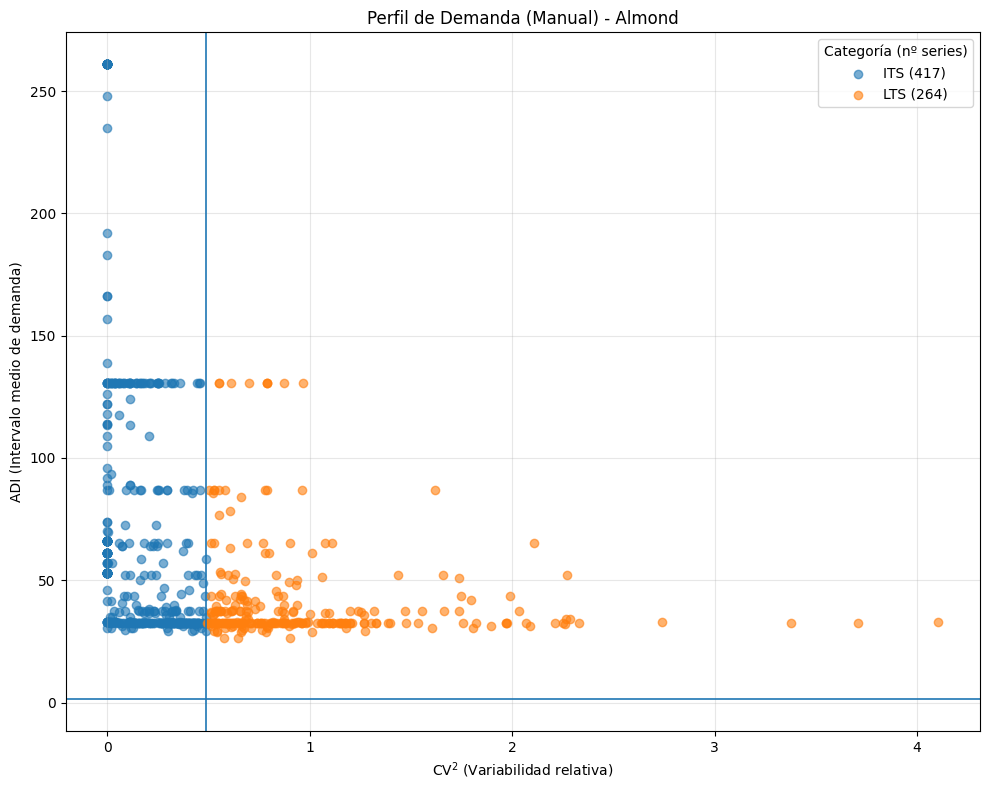

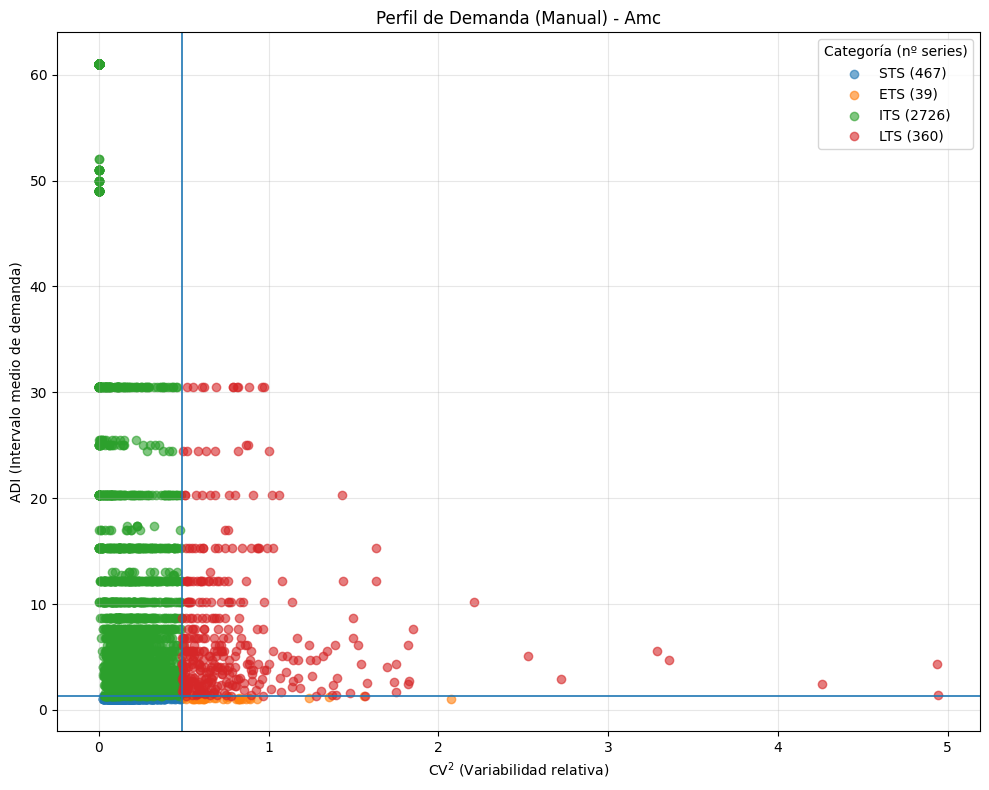

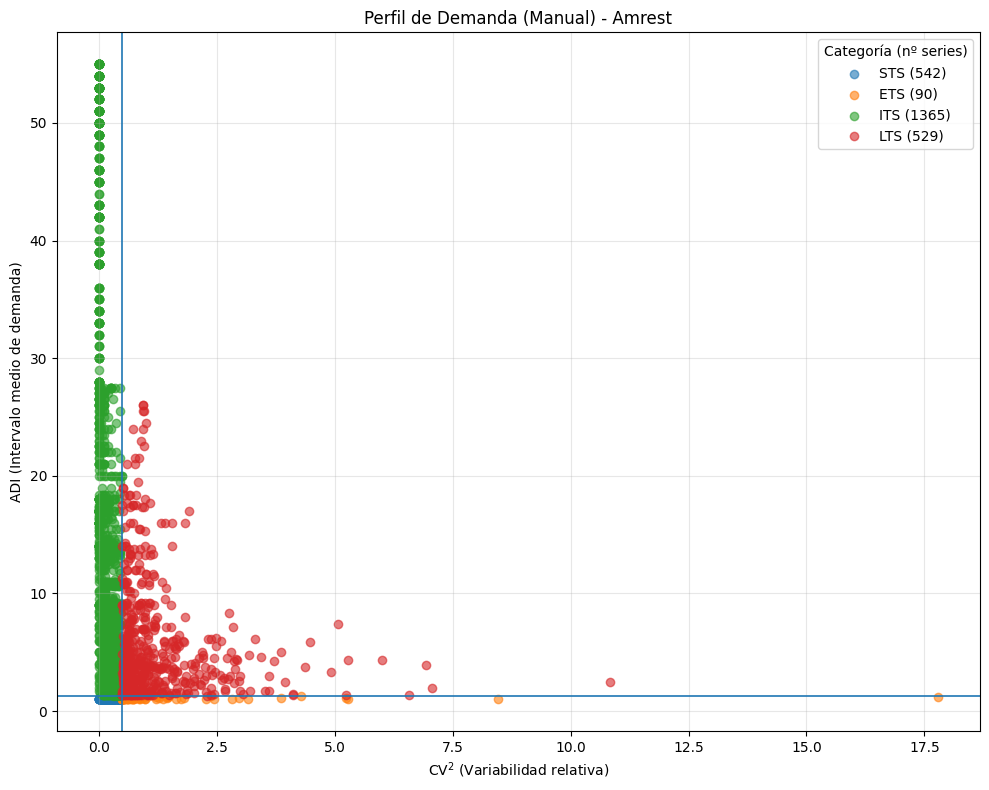

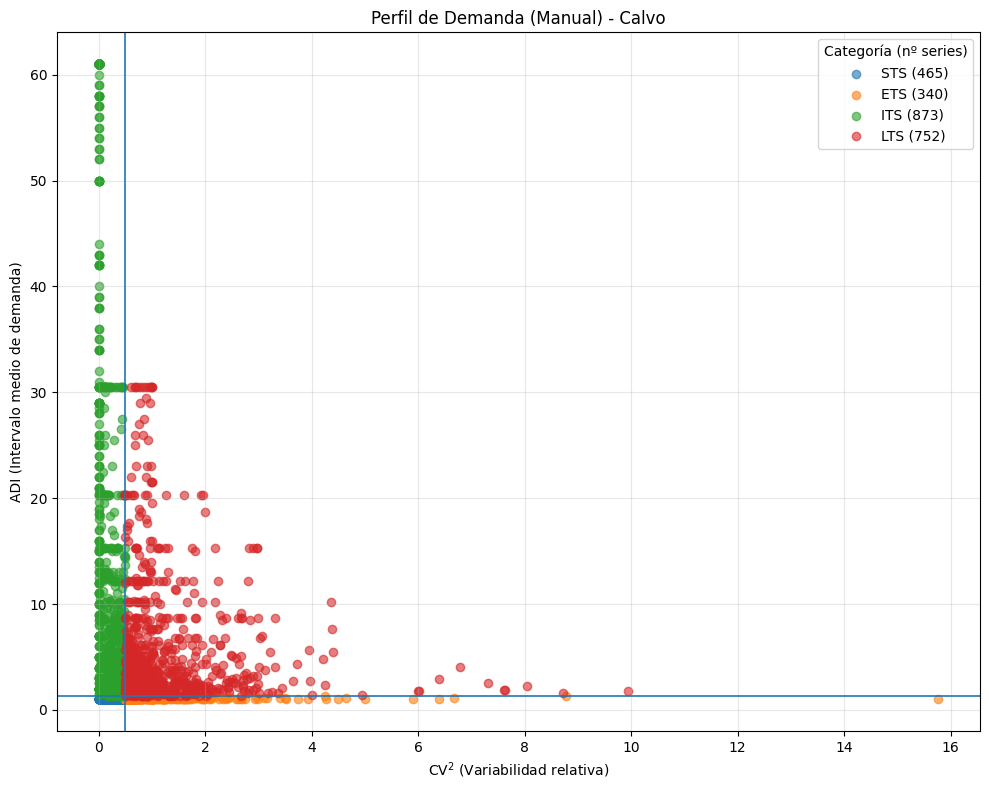

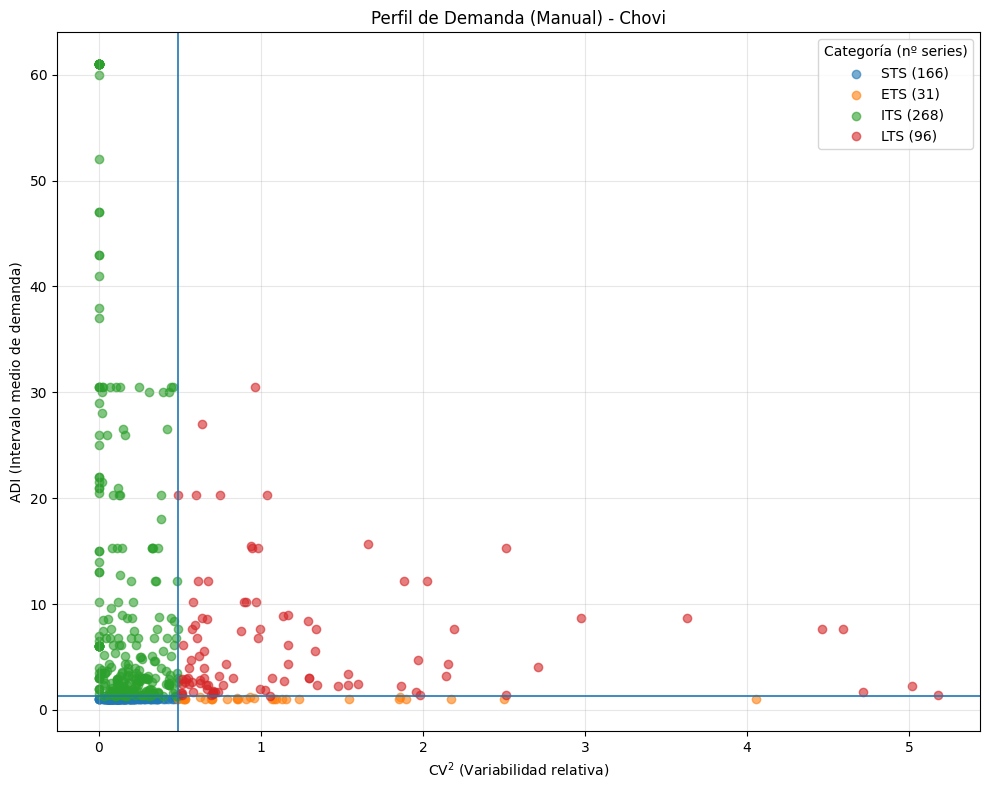

...

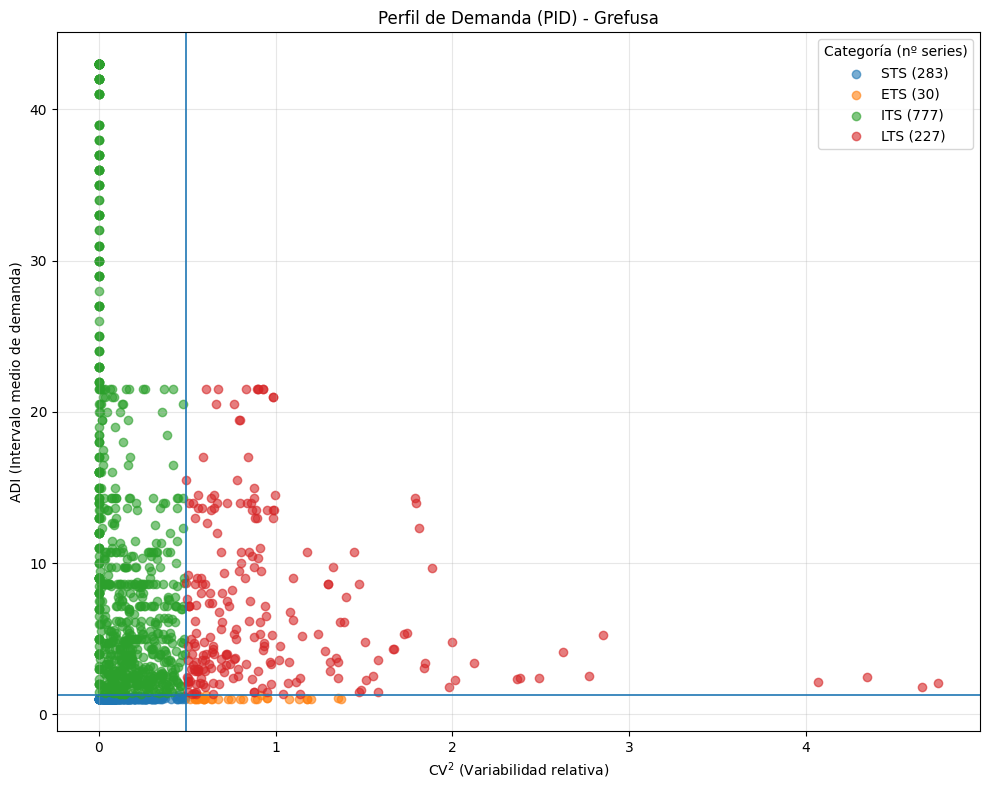

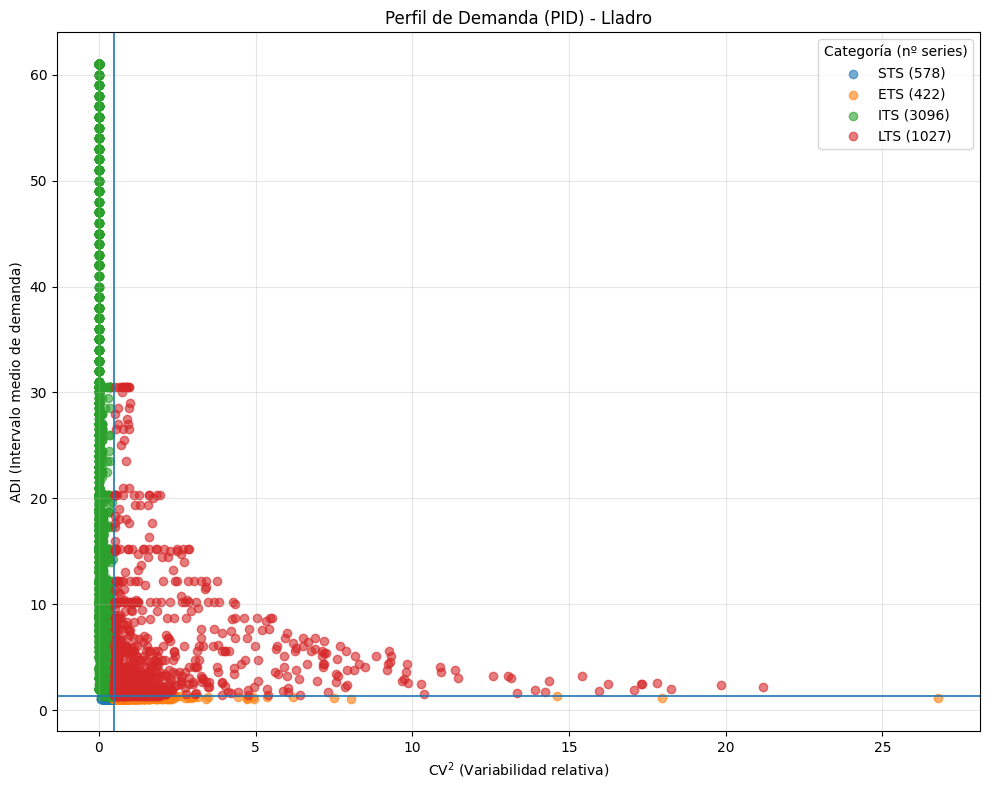

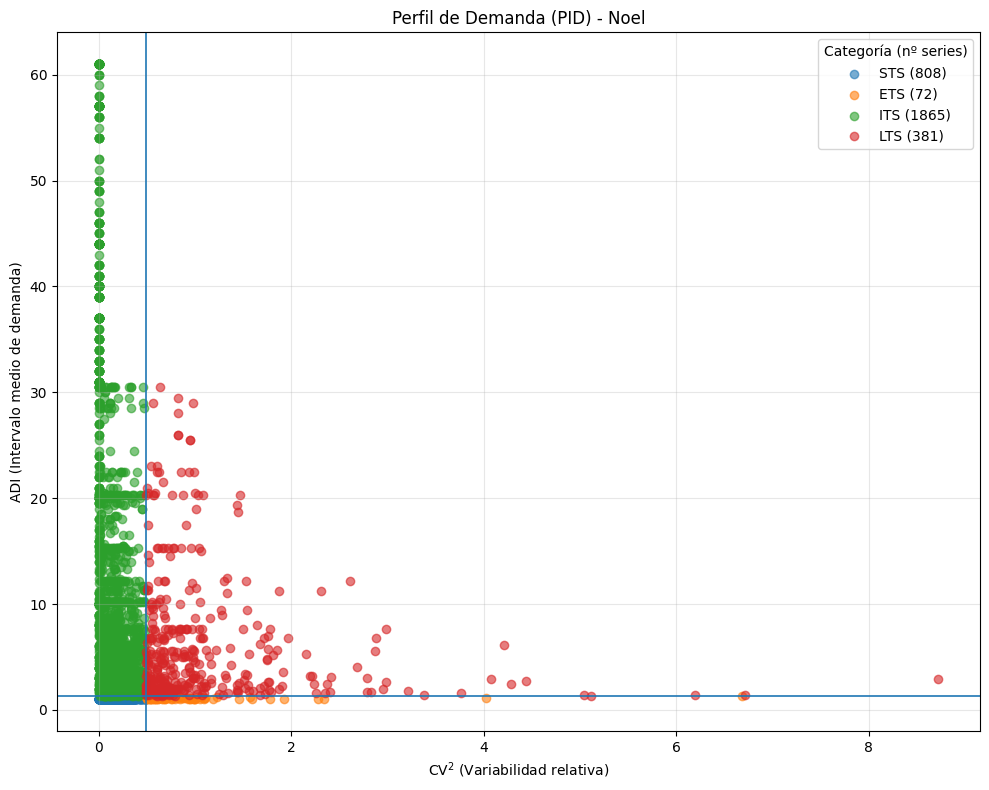

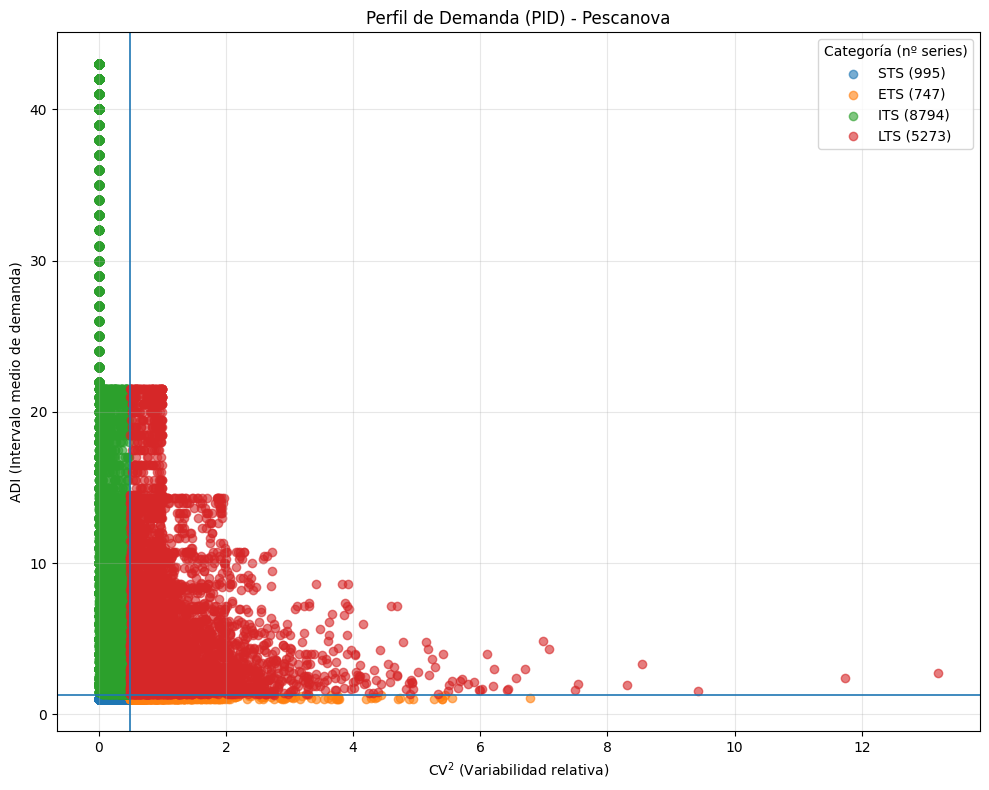

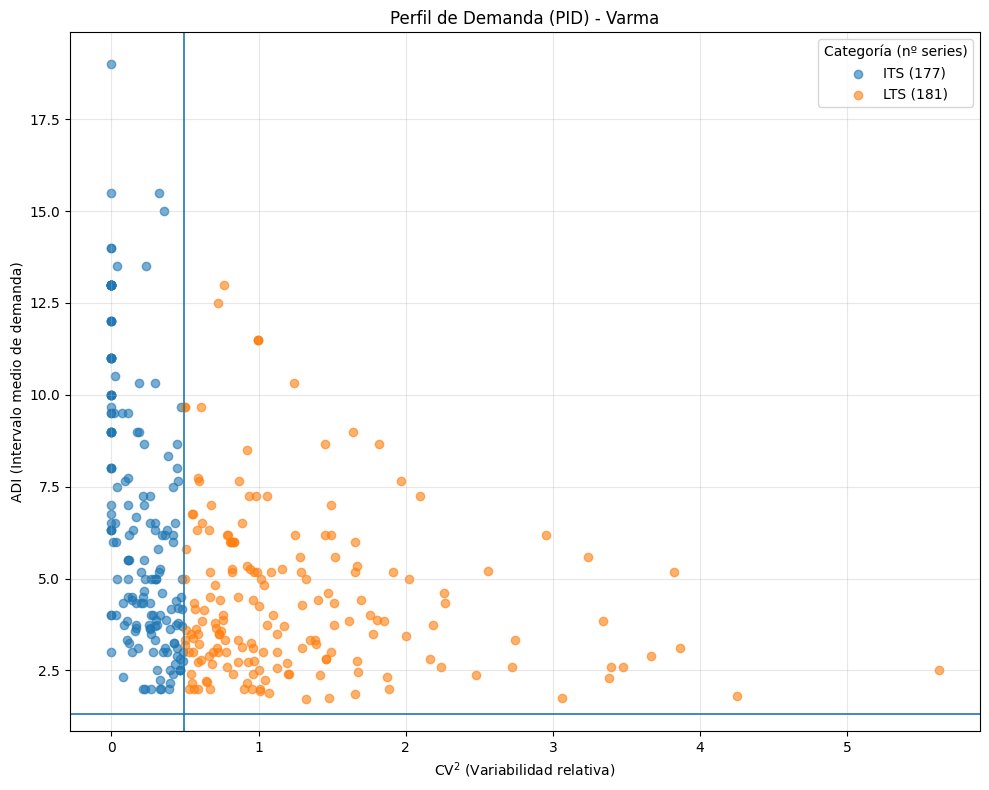

In [19]:
# === RUNNER (consumiendo dfs_ready; NO se reconstituye nada) =================
# Ejecutar pipeline en todos (sin plots para no saturar la salida)
results       = {}
tables_manual = []
tables_pid    = []
summaries     = []

for name, (dfx, freq) in dfs_trimmed.items(): # <- clave: usar dfs_ready
    out = demand_profile(dfx, name = name, plots = False, tables = False)
    results[name] = out

    # guarda el summary por serie con etiqueta del dataset
    s = out['summary'].copy()
    s.insert(0, 'dataset', name)
    summaries.append(s)

    # guarda composiciones por dataset
    tables_manual.append(out['table_manual'].assign(dataset = name))
    tables_pid.append(out['table_pid'].assign(dataset = name))

# Tablas consolidadas
summary_all = pd.concat(summaries, ignore_index = True)
comp_manual = (pd.concat(tables_manual, ignore_index = True)
                 .pivot(index = 'dataset', columns = 'abbr', values = 'percent')
                 .fillna(0).round(1))
comp_pid    = (pd.concat(tables_pid, ignore_index = True)
                 .pivot(index = 'dataset', columns = 'abbr', values = 'percent')
                 .fillna(0).round(1))

print("=== Composición por categorías (Manual, % por dataset) ===")
print(comp_manual.to_string())
print("\n=== Composición por categorías (PID, % por dataset) ===")
print(comp_pid.to_string())

# (Opcional) ver conteos totales por categoría en TODOS los datasets
totals_manual = summary_all['Cat'].value_counts().rename('count')
total_pid = summary_all['Cat_PID'].value_counts().rename('count')
print("\n=== Totales globales (Manual) ===")
print(totals_manual.to_string())
print("\n=== Totales globales (PID) ===")

# (Opcional) Graficar CV² vs. ADI de un dataset concreto
#plot_demand_by_category(results['Noel']['summary'], cat_col = 'Cat', cv2_col = 'CV2', adi_col = 'ADI', title = 'Perfil de Demanda (Manual) - Noel')

# Graficar CV² vs ADI para **todos** los datasets (Manual)
for name, out in results.items():
    plot_demand_by_category(
        out['summary'],
        cat_col = 'Cat', cv2_col = 'CV2', adi_col = 'ADI',
        title = f'Perfil de Demanda (Manual) - {name}'
    )

# (Opcional) también todos en versión PID
for name, out in results.items():
    plot_demand_by_category(
        out['summary'],
        cat_col = 'Cat_PID', cv2_col = 'CV2_PID', adi_col = 'ADI_PID',
        title = f'Perfil de Demanda (PID) - {name}'
    )


----

## MATRIZ DE CONFUSIÓN MANUAL vs PID + EXACTITUD

In [20]:
# --- MATRIZ DE CONFUSIÓN + EXACTITUDES
# Orden canónico de clases para garantizar que las tablas siempre 
# muestren las mismas filas/columnas aunque alguna categoría no aparezca.
CATS_ORDER = ['Smooth', 'Erratic', 'Intermittent', 'Lumpy', 'AllZero']

def classification_confusion(summary_df: pd.DataFrame):
    """
    Calcula y devuelve:
      - cm_counts : matriz de confusión (conteos absolutos) con orden fijo de clases
      - cm_row_pct: matriz de confusión normalizada por FILAS (%), interpretada como:
                    distribución de la etiqueta PID dado el “Manual”
      - acc_overall: exactitud global (proporción de series donde Manual == PID)
      - acc_no_az  : exactitud excluyendo casos relacionados con AllZero en ambas etiquetas
                     (útil para no inflar la exactitud por coincidencias triviales en "todo ceros").
    Notas:
      * Row-normalization (por filas) responde a: “si Manual dice X, ¿cómo clasifica PID?”.
      * Se fuerza el orden de clases para que no desaparezcan filas/columnas cuando no hay casos.
    """
    s = summary_df.copy()

    # Se fuerza las variables de clase a categóricas con un orden fijo:
    # esto asegura la presencia de todas las categorías y evita reordenamientos implícitos.
    s['Cat']     = pd.Categorical(s['Cat'],     categories = CATS_ORDER, ordered = False)
    s['Cat_PID'] = pd.Categorical(s['Cat_PID'], categories = CATS_ORDER, ordered = False)

    # Matriz de confusión de conteos (Manual vs PID).
    cm_counts = pd.crosstab(s['Cat'], s['Cat_PID'], dropna = False)

    # Reindex para incluir categorías ausentes (queden como 0) y fijar siempre el mismo layout.
    cm_counts = cm_counts.reindex(index = CATS_ORDER, columns = CATS_ORDER, fill_value = 0)

    # Normalización por filas (%): probabilidad condicional PID | Manual
    # replace(0, 1) evita división por cero en filas sin soporte (se quedan como 0s).
    cm_row_pct = cm_counts.div(cm_counts.sum(axis = 1).replace(0, 1), axis = 0).round(3)

    # Exactitud global: proporción de series con la misma etiqueta Manual y PID.
    acc_overall = (s['Cat'] == s['Cat_PID']).mean()

    # Exactitud "sin AZ": filtramos cualquier fila donde alguna etiqueta sea AllZero.
    # Esto evita que casos triviales (series todo-cero) inflen artificialmente la exactitud.
    mask_no_az = (s['Cat'] != 'AllZero') & (s['Cat_PID'] != 'AllZero')
    acc_no_az = (
        (s.loc[mask_no_az, 'Cat'] == s.loc[mask_no_az, 'Cat_PID']).mean()
        if mask_no_az.any() else float('nan')
    )

    return cm_counts, cm_row_pct, acc_overall, acc_no_az

In [21]:
# 1) No se recrea df_*_trimmed ni dfs_trimmed a mano:
dfs_trimmed = dfs_ready # alias opcional, no copia

# =========================================================
# 3) USO RÁPIDO: Noel con *_trimmed
#    (Requiere demand_profile y classification_confusion ya definidas)
# =========================================================
# USO RÁPIDO
# Se obtiene el 'summary' sin gráficos/tabla para acelerar; contiene Cat, Cat_PID, ADI, CV2, etc.
out_Noel_2 = demand_profile(dfs_ready['Noel'][0], name = 'Noel', plots = False, tables = False)

# Se calcula métricas de concordancia Manual vs PID.
cm_cnt, cm_pct, acc, acc_wo_az = classification_confusion(out_Noel_2['summary'])

# Report cort:
# - Exactitud global: sensibilidad general de coincidencia Manual/PID
# - Exactitud sin AZ: evita el sesgo de series AllZero
print(f"Exactitud Noel (global): {acc:.3%} | (sin AZ): {acc_wo_az:.3%}")

# Se muestra:
# - Matriz de conteos: volumen bruto por par de clases
# - Matriz % por fila: distribución PID dado Manual (fácil de leer desviaciones sistemáticas)
from IPython.display import display
display(cm_cnt)
display(cm_pct)


=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621


Exactitud Noel (global): 100.000% | (sin AZ): 100.000%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,808,0,0,0,0
Erratic,0,72,0,0,0
Intermittent,0,0,1865,0,0
Lumpy,0,0,0,381,0
AllZero,0,0,0,0,0


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,1.0,0.0,0.0,0.0,0.0
Erratic,0.0,1.0,0.0,0.0,0.0
Intermittent,0.0,0.0,1.0,0.0,0.0
Lumpy,0.0,0.0,0.0,1.0,0.0
AllZero,0.0,0.0,0.0,0.0,0.0


**Resumen Noel (3612 series):**

- **Concordancia Manual vs PID: 100%** (también sin AllZero). Implementaciones alineadas.
- **Distribución:** Intermittent \~61.5% (2221), Smooth \~22.4% (809), Lumpy \~13.6% (492), Erratic \~2.4% (86), AllZero \~0.1% (4).
- Los ejemplos del *head* muestran **pZeros altos y ADI grande** → ventas muy espaciadas; CV²≈0 con un solo positivo sigue siendo *Intermittent* (no *Lumpy*).
- **Acción operativa:**
    - ITS: Croston/TSB/SBA.
    - LTS: revisar picos (promos, lotes), posible agregación por familias.
    - STS: modelos clásicos con estacionalidad.
    - AZ/one-offs: excluir o canal alternativa (no aportan señal).

In [22]:
# =========================================================
# RECORRIDO POR TODOS LOS DATASETS: MATRIZ DE CONFUSIÓN + ACC
# =========================================================
# Recorre el dict `results` (nombre -> {'summary': DataFrame de métricas})
# Calcula y muestra:
#   - acc: exactitud global (Cat == Cat_PID)
#   - acc(sin AZ): exactitud excluyendo AllZero en ambas etiquetas
#   - cm_cnt: matriz de confusión (conteos) con orden fijo de clases
for name, out in results.items():
    cm_cnt, cm_pct, acc, acc_wo_az = classification_confusion(out['summary'])
    print(f"\n{name}: acc = {acc:.2%} | acc(sin AZ) = {acc_wo_az:.2%}")
    display(cm_cnt)  # matriz de conteos; usa cm_pct si quieres % por fila


Almond: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,0,0,0,0,0
Erratic,0,0,0,0,0
Intermittent,0,0,417,0,0
Lumpy,0,0,0,264,0
AllZero,0,0,0,0,0



Amc: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,467,0,0,0,0
Erratic,0,39,0,0,0
Intermittent,0,0,2726,0,0
Lumpy,0,0,0,360,0
AllZero,0,0,0,0,0



Amrest: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,542,0,0,0,0
Erratic,0,90,0,0,0
Intermittent,0,0,1365,0,0
Lumpy,0,0,0,529,0
AllZero,0,0,0,0,0



Calvo: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,465,0,0,0,0
Erratic,0,340,0,0,0
Intermittent,0,0,873,0,0
Lumpy,0,0,0,752,0
AllZero,0,0,0,0,0



Chovi: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,166,0,0,0,0
Erratic,0,31,0,0,0
Intermittent,0,0,268,0,0
Lumpy,0,0,0,96,0
AllZero,0,0,0,0,0



Cuatrogasa: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,541,0,0,0,0
Erratic,0,129,0,0,0
Intermittent,0,0,526,0,0
Lumpy,0,0,0,112,0
AllZero,0,0,0,0,0



Damel: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,504,0,0,0,0
Erratic,0,243,0,0,0
Intermittent,0,0,1452,0,0
Lumpy,0,0,0,380,0
AllZero,0,0,0,0,0



Fiorucci: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,275,0,0,0,0
Erratic,0,41,0,0,0
Intermittent,0,0,71,0,0
Lumpy,0,0,0,59,0
AllZero,0,0,0,0,0



Frescobaldi: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,138,0,0,0,0
Erratic,0,135,0,0,0
Intermittent,0,0,2517,0,0
Lumpy,0,0,0,663,0
AllZero,0,0,0,0,0



Frias: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,344,0,0,0,0
Erratic,0,38,0,0,0
Intermittent,0,0,360,0,0
Lumpy,0,0,0,100,0
AllZero,0,0,0,0,0



Grefusa: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,283,0,0,0,0
Erratic,0,30,0,0,0
Intermittent,0,0,777,0,0
Lumpy,0,0,0,227,0
AllZero,0,0,0,0,0



Lladro: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,578,0,0,0,0
Erratic,0,422,0,0,0
Intermittent,0,0,3096,0,0
Lumpy,0,0,0,1027,0
AllZero,0,0,0,0,0



Noel: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,808,0,0,0,0
Erratic,0,72,0,0,0
Intermittent,0,0,1865,0,0
Lumpy,0,0,0,381,0
AllZero,0,0,0,0,0



Pescanova: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,995,0,0,0,0
Erratic,0,747,0,0,0
Intermittent,0,0,8794,0,0
Lumpy,0,0,0,5273,0
AllZero,0,0,0,0,0



Varma: acc = 100.00% | acc(sin AZ) = 100.00%


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,0,0,0,0,0
Erratic,0,0,0,0,0
Intermittent,0,0,177,0,0
Lumpy,0,0,0,181,0
AllZero,0,0,0,0,0


---

## LISTADO DE DISCREPANCIAS (Series donde difieren las clasificaciones)

## SCATTER COMPARATIVO MANUAL vs PID (Superpuesto)

Este gráfico no altera nada: dibuja cada serie dos veces, una marca para Manual y otra para PID, y si difieren, une ambas con una línea.

In [23]:
def list_mismatches(summary_df: pd.DataFrame, top: int = 20, include_allzero: bool = False):
    """
    Series con Cat != Cat_PID. Si include_allzero = False, 
    excluye casos donde alguna etiqueta es AllZero.
    Ordena por diferencia combinada de ADI/CV2.
    """
    df = summary_df.copy()

    # Filtro principal: discrepancias entre las dos clasificaciones
    mask = df['Cat'] != df['Cat_PID']

    # (Opcional) Excluir casos donde alguna etiqueta sea AllZero (poco informativos)
    if not include_allzero:
        mask &= (df['Cat'] != 'AllZero') & (df['Cat_PID'] != 'AllZero')

    mis = df.loc[mask].copy()
    if mis.empty:
        return mis # no hay discrepancias
    
    # Función auxiliar: resta absoluta segura (coacciona a numérico y elimina inf/NaN)
    def safe_absdiff(a, b):
        a = pd.to_numeric(a, errors = 'coerce').replace([np.inf, -np.inf], np.nan)
        b = pd.to_numeric(b, errors = 'coerce').replace([np.inf, -np.inf], np.nan)
        return (a - b).abs()
    
    # Magnitud de la discrepancia en ambas métricas
    mis['ADI_absdiff'] = safe_absdiff(mis['ADI'], mis['ADI_PID']).fillna(0.0)
    mis['CV2_absdiff'] = safe_absdiff(mis['CV2'], mis['CV2_PID']).fillna(0.0)

    # Ranking combinado: mayor diferencia en ADI y/o CV2 -> más arriba
    # (se suma los rangos descendentes de ambas diferencias)
    mis['score'] = mis['ADI_absdiff'].rank(ascending = False, method = 'average') \
                 + mis['CV2_absdiff'].rank(ascending = False, method = 'average')
    
    # Columnas a mostrar (solo las que existan en el DF)
    cols_show = [c for c in ['unique_id','Cat','Cat_PID','ADI','ADI_PID','CV2','CV2_PID',
                              'pZeros','length','first_date','last_date',
                              'ADI_absdiff','CV2_absdiff'] if c in mis.columns]
    
    # Orden: primero por score (menor = más relevante), desempata por ADI_absdiff desc, luego CV2_absdiff asc
    return mis.sort_values(['score', 'ADI_absdiff', 'CV2_absdiff'],
                           ascending = [True, False, True]).head(top)[cols_show]

In [24]:
# === SCATTER SUPERPUESTO MANUAL vs PID (maneja NaN/inf y traza “cables” entre puntos discrepantes)
def plot_overlay_manual_vs_pid(summary_df: pd.DataFrame,
                               title = 'Manual vs PID: CV²–ADI (superpuesto)'):
    df = summary_df.copy()

    # Máscara de puntos finitos (evita crasheos y ejes deformados por inf/NaN)
    m_fin = np.isfinite(df['CV2'])     & np.isfinite(df['ADI'])
    p_fin = np.isfinite(df['CV2_PID']) & np.isfinite(df['ADI_PID'])

    fig, ax = plt.subplots(figsize = (10, 8))

    # Conectar con una línea los pares (Manual, PID) cuando ambos son finitos
    both_fin = m_fin & p_fin
    for _, r in df.loc[both_fin].iterrows():
        ax.plot([r['CV2'], r['CV2_PID']], [r['ADI'], r['ADI_PID']],
                linewidth = 0.6, alpha = 0.3)
    
    # Nube Manual (o) y PID (x); en la leyenda se indica cuántos puntos se pintan
    ax.scatter(df.loc[m_fin, 'CV2'],     df.loc[m_fin, 'ADI'],
               s = 22, alpha = 0.6, label = f"Manual (n = {m_fin.sum()})", marker = 'o')
    ax.scatter(df.loc[p_fin, 'CV2_PID'], df.loc[p_fin, 'ADI_PID'],
               s = 22, alpha = 0.6, label = f"PID (n = {p_fin.sum()})",   marker = 'x')
    
    # Líneas de corte SB-2005
    ax.axvline(x = 0.49, linewidth = 1.0)
    ax.axhline(y = 1.32, linewidth = 1.0)
    
    # Rotulación y estilo
    ax.set_xlabel(r'CV$^2$')
    ax.set_ylabel('ADI')
    ax.set_title(title)
    ax.legend()
    ax.grid(alpha = 0.3)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

Con esto:
- La confusión siempre muestra AllZero y se puede ver el % por fila y exactitud sin AZ.
- El listado no se rompe si hay NaN/inf y se puede excluir AZ si se quiere poner el foco en discrepancias "reales".
- El scatter no intenta pintar infinitos/NaN (que es lo que suele "romper" o aplastar el gráfico).

In [25]:
# ===============================================================
# RUNNER FLEXIBLE (Confusión, Discrepancias, Scatter por Dataset)
# ===============================================================
from IPython.display import display

def evaluate_dataset(name: str,
                     df_filled: pd.DataFrame,
                     *,
                     plots:           bool = True,
                     show_confusion:  bool = True,
                     top_mismatches:  int  = 15,
                     include_allzero: bool = False):
    """
    Evalúa un dataset (ya 'filled' y ordenado) extremo a extremo:
      1) Ejecuta demand_profile(...) para calcular métricas y clasificación.
      2) Construye matriz de confusión y exactitudes (global y sin AllZero).
      3) Lista discrepancias TOP-K entre Cat y Cat_PID.
      4) Dibuja scatter superpuesto Manual vs PID (opcional).

    Parámetros:
      - name: nombre legible del dataset (solo para impresión/títulos).
      - df_filled: dataframe largo con columnas [unique_id, ds, y, ...].
      - plots: si True, dibuja el scatter Manual vs PID.
      - show_confusion: si True, muestra matrices de confusión (conteos y % fila).
      - top_mismatches: cuántas series con mayor discrepancia listar.
      - include_allzero: si True, incluye AllZero en discrepancias.
    """

    # 1) Cálculo de métricas y clasificación (sin tablas/plots para no duplicar salidas)
    out = demand_profile(df_filled, name = name, plots = False, tables = False)
    summ = out['summary']

    # 2) Matriz de confusión + exactitudes
    cm_cnt, cm_pct, acc, acc_wo_az = classification_confusion(summ)

    print(f"\n=== {name} ===")
    print(f"Exactitud global: {acc:.2%} | Exactitud sin AllZero: {acc_wo_az:.2%}")
    if show_confusion:
        print("\n[Confusión (conteos)]")
        display(cm_cnt)
        print("\n[Confusión (% fila)]")
        display(cm_pct)
    
    # 3) Discrepancias TOP-K (ordenadas por magnitud combinada en ADI y CV2)
    mism = list_mismatches(summ, top = top_mismatches, include_allzero = include_allzero)
    print(f"\nDiscrepancias top {top_mismatches}"
          f"{' (incluyendo AllZero)' if include_allzero else ''}):")
    display(mism if not mism.empty else pd.DataFrame({"msg":["Sin discrepancias"]}))

    # 4) Visual: posición Manual vs PID y "cables" entre pares discrepantes
    if plots:
        plot_overlay_manual_vs_pid(summ, title = f"Manual vs PID - {name}")
    
    # Devuelve KPIs compactos para agregación/seguimiento
    return {
        "name": name, 
        "acc": acc,
        "acc_wo_az": acc_wo_az,
        "n_series": len(summ),
        "n_mismatches": int((summ['Cat'] != summ['Cat_PID']).sum())
    }

In [26]:
# =========================================================
# RUNNER PARA TODOS LOS DATASETS (usa tu dict dfs_filled)
# =========================================================
def evaluate_all_datasets(dfs_ready:       dict, *,
                          plots:           bool = False,
                          show_confusion:  bool = False,
                          top_mismatches:  int  = 10,
                          include_allzero: bool = False):
    """
    Recorre todos los datasets en `dfs_filled` y aplica evaluate_dataset().
    Espera un dict con forma: { "Nombre": (df_filled, freq), ... }

    Parámetros:
      - plots/show_confusion: por defecto False para no saturar la salida.
      - top_mismatches/include_allzero: se pasan a evaluate_dataset().
    """
    rows = []
    for name, (df_filled, _freq) in dfs_ready.items():
        res = evaluate_dataset(name, df_filled,
                               plots = plots,
                               show_confusion = show_confusion,
                               top_mismatches = top_mismatches,
                               include_allzero = include_allzero)
        rows.append(res)

    # Resumen compacto de exactitudes por dataset (tabla final)
    summary_acc = (pd.DataFrame(rows)
                     .loc[:, ["name", "n_series", "acc", "acc_wo_az", "n_mismatches"]]
                     .sort_values("name")
                     .reset_index(drop = True))
    print("\n=== Resumen de exactitudes por dataset ===")
    display(summary_acc)
    return summary_acc


=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621



=== Noel ===
Exactitud global: 100.00% | Exactitud sin AllZero: 100.00%

[Confusión (conteos)]


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,808,0,0,0,0
Erratic,0,72,0,0,0
Intermittent,0,0,1865,0,0
Lumpy,0,0,0,381,0
AllZero,0,0,0,0,0



[Confusión (% fila)]


Cat_PID,Smooth,Erratic,Intermittent,Lumpy,AllZero
Cat,,,,,
Smooth,1.0,0.0,0.0,0.0,0.0
Erratic,0.0,1.0,0.0,0.0,0.0
Intermittent,0.0,0.0,1.0,0.0,0.0
Lumpy,0.0,0.0,0.0,1.0,0.0
AllZero,0.0,0.0,0.0,0.0,0.0



Discrepancias top 15):


,msg
0,Sin discrepancias


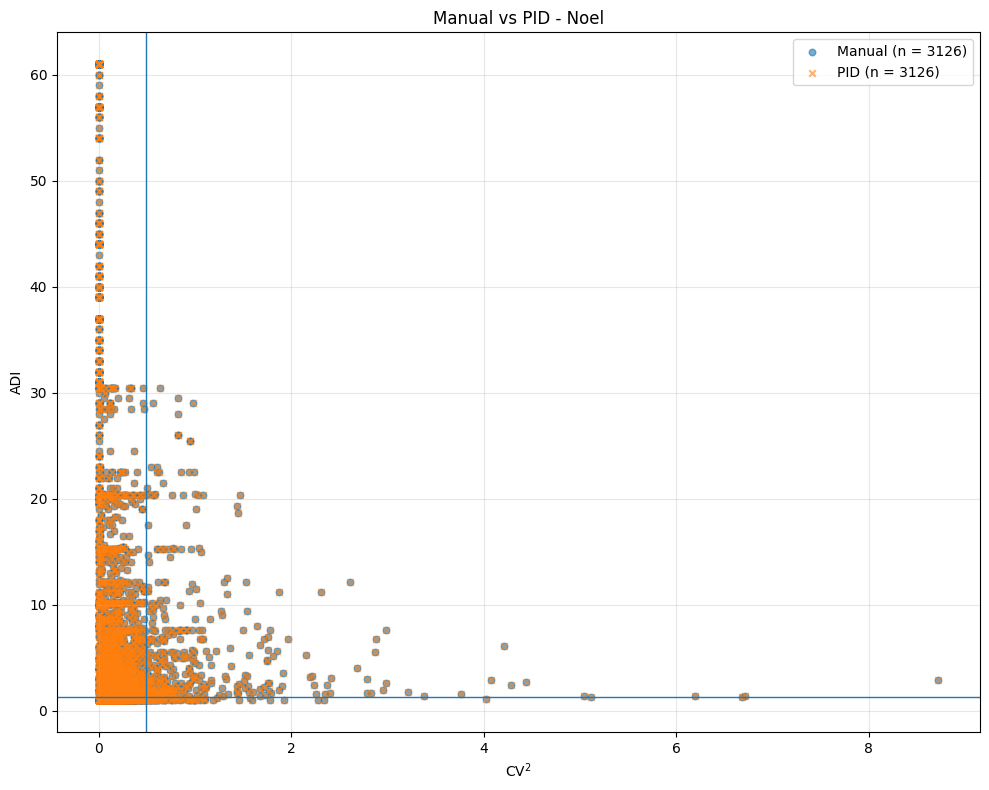

{'name': 'Noel',
 'acc': np.float64(1.0),
 'acc_wo_az': np.float64(1.0),
 'n_series': 3126,
 'n_mismatches': 0}

In [27]:
# ===================== USO =====================
# 1) Evaluar un dataset concreto (ej.: Noel)
evaluate_dataset("Noel", dfs_ready['Noel'][0],
                 plots          = True,
                 show_confusion = True,
                 top_mismatches = 15)

# # 2) Evaluar TODOS (usa tu diccionario dfs_filled ya creado)
# #    a) Modo silencioso (sin gráficos ni matrices)
# evaluate_all_datasets(dfs_ready,
#                       plots          = False,
#                       show_confusion = False,
#                       top_mismatches = 10)

# #    b) Modo detallado (con gráficos y matrices) — cuidado: salida larga
# evaluate_all_datasets(dfs_ready,
#                       plots          = True,
#                       show_confusion = True,
#                       top_mismatches = 5)

Brebe interpretación de **Noel**:

* **Consistencia total**: Manual vs PID coincide al 100% (matriz de confusión totalmente diagonal). No hay discrepancias; la canalización y los umbrales se están aplicando de forma coherente.
* **Composición** (3612 series):

  * Intermittent ≈ **61.5%** (2221)
  * Smooth ≈ **22.4%** (809)
  * Lumpy ≈ **13.6%** (492)
  * Erratic ≈ **2.4%** (86)
  * AllZero ≈ **0.1%** (4)
* **Patrón métrico**: En el scatter, la masa está **por encima de ADI=1.32** y **a la izquierda de CV²=0.49** → dominio claro de demanda intermitente con baja variabilidad en tamaños cuando aparece (ITS). Hay una **cola lumpy** (CV² más altos) pero minoritaria.
* **Ejemplos**: Varias series con **ADI muy alto** (p.ej., 80, 76) y **CV²=0** ⇒ uno o poquísimos positivos en todo el horizonte; tratar como muy esparsas/one-off.
* **Implicación operativa**:

  * Foco en métodos para intermitente (Croston/TSB/SBA; ajuste de prob. de ocurrencia).
  * Revisar Lumpy para picos (promos, eventos) y considerar pooling por familias.
  * Mantener **AllZero** aparte (posibles obsolescencias/datos residuales).


In [28]:
# AUDITOR DE DUPLICADOS ANTES DE PIVOTAR
# Objetivo: detectar pares (ds, unique_id) repetidos en el formato "largo".
# Si hay duplicados, el pivot tendrá que agregarlos (sum/mean/...).

def audit_duplicates_long(df, ds_col = 'ds', id_col = 'unique_id', y_col = 'y'):
    """
    Revisa duplicados por (ds, unique_id).
    Devuelve un DataFrame con (ds, unique_id, n) donde n > 1.
    """
    # Se cuenta cuántas filas hay por cada combinación (ds, unique_id).
    # Se usa reset_index(name = 'n') para obtener una columna 'n' con los conteos.
    dups = (df.groupby([ds_col, id_col]).size().reset_index(name = 'n'))

    # Se queda sólo con las combinaciones que aparecen más de una vez.
    dups = dups[dups['n'] > 1].sort_values('n', ascending = False)

    # Mensaje informativo para la auditoría rápida.
    if not dups.empty:
        print(
            f"⚠️ Encontrados {len(dups)} pares (ds, {id_col}) con duplicados. "
            f"En el pivot se agregará con el 'aggfunc' elegido.")
    else:
        print("✅ Sin duplicados por (ds, unique_id).")
    return dups

# USO (ejemplo)
_ = audit_duplicates_long(dfs_ready['Noel'][0])

✅ Sin duplicados por (ds, unique_id).


## top_series_by_metric robusto (NaN/inf + filtro por clase)

In [29]:
# TOP-N SERIES POR MÉTRICA (Versión robusta)
# Objetivo: listar las series extremas según una métrica (ADI, CV2, ...),
# filtrando opcionalmente clases (p.ej., AllZero) y valores no numéricos.
def top_series_by_metric_safe(summary_df:      pd.DataFrame,
                              metric:          str   = 'ADI',
                              top:             int   = 15,
                              ascending:       bool  = False,
                              exclude_classes: tuple = ('AllZero',),
                              dropna:          bool  = True):
    """
    Devuelve las top-N series ordenadas por 'metric'.
    metric ∈ {'ADI','CV2','ADI_PID','CV2_PID','pZeros','length',...}
    - exclude_classes: categorías a excluir (p.ej. series AllZero).
    - dropna: elimina NaN/Inf en la métrica seleccionada.
    """
    # 1) Validación de la métrica solicitada
    if metric not in summary_df.columns:
        raise KeyError(f"Métrica '{metric}' no existe en summary_df.")
    
    df = summary_df.copy()
    
    # 2) (Opcional) Excluir clases no informativas para el ranking.
    if exclude_classes and 'Cat' in df.columns:
        df = df[~df['Cat'].isin(exclude_classes)]

    # 3) Asegurar que la métrica es numérica y filtrar NaN/Inf si procede
    if dropna:
        df_metric = pd.to_numeric(df[metric], errors = 'coerce')
        df = df[np.isfinite(df_metric)]

    # 4) Columas útiles para inspección rápida del resultado
    cols = [
        c for c in [
            'unique_id', 'Cat', 'Cat_PID', 'ADI', 'ADI_PID',
            'CV2', 'CV2_PID', 'pZeros', 'length', 'first_date', 'last_date'
        ] if c in df.columns
    ]

    # 5) Ordenar por la métrica y devolver el top-N
    return df.sort_values(metric, ascending = ascending).head(top)[cols]

# USO (ejemplos)
out_Noel = demand_profile(dfs_ready['Noel'][0], name = 'Noel', plots = False, tables = False)
# - Más intermitentes (ADI alto, manual)
display(top_series_by_metric_safe(out_Noel['summary'], metric = 'ADI', top = 5, ascending = False))
# - Más variables (CV2 alto, manual)
display(top_series_by_metric_safe(out_Noel['summary'], metric = 'CV2', top = 5, ascending = False))


=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621


,unique_id,Cat,Cat_PID,ADI,ADI_PID,CV2,CV2_PID,pZeros,length,first_date,last_date
18,Noel_1051,Intermittent,Intermittent,61.0,61.0,0.0,0.0,0.983607,61,2020-07-01,2025-07-01
11,Noel_10420,Intermittent,Intermittent,61.0,61.0,0.0,0.0,0.983607,61,2020-07-01,2025-07-01
554,Noel_2151,Intermittent,Intermittent,61.0,61.0,0.0,0.0,0.983607,61,2020-07-01,2025-07-01
611,Noel_2220,Intermittent,Intermittent,61.0,61.0,0.0,0.0,0.983607,61,2020-07-01,2025-07-01
608,Noel_2217,Intermittent,Intermittent,61.0,61.0,0.0,0.0,0.983607,61,2020-07-01,2025-07-01


,unique_id,Cat,Cat_PID,ADI,ADI_PID,CV2,CV2_PID,pZeros,length,first_date,last_date
2236,Noel_424,Lumpy,Lumpy,2.904762,2.904762,8.720192,8.720192,0.655738,61,2020-07-01,2025-07-01
855,Noel_2669,Lumpy,Lumpy,1.419355,1.419355,6.716882,6.716882,0.295455,44,2021-12-01,2025-07-01
955,Noel_2827,Erratic,Erratic,1.312500,1.312500,6.678330,6.678330,0.238095,21,2023-11-01,2025-07-01
2792,Noel_4901,Lumpy,Lumpy,1.400000,1.400000,6.199455,6.199455,0.285714,42,2022-02-01,2025-07-01
1960,Noel_3933,Lumpy,Lumpy,1.355556,1.355556,5.117731,5.117731,0.262295,61,2020-07-01,2025-07-01


---

## PIVOT "AMIGABLE CON MEMORIA" (float32/sparse)

**Notas rápidas** (Criterio Práctico)
* `fill_value = None` (dejar `NaN`) es preferible si luego se calculan correlaciones, PCA o modelos que distinguen huecos de ceros reales. Usar `0` cuando se quiera trabajar con demanda "censurada" a cero (p.ej., heatmaps visuales o algoritmos que no admitan NaN).
* `dtype = 'float32'` suele ser suficiente para EDA; ahorra ~50% de memoria respecto a `float64`.
* `sparse = True`brilla si hay miles de series con muchos huecos (NaN/0); si la matriz es relativamente densa, puede no compensar.

In [30]:
# PIVOT "AMIGABLE CON MEMORIA"
# Convierte el formato largo (ds, unique_id, y) a una matriz temporal:
#   - Filas   = fechas (ds)
#   - Columnas= series (unique_id)
#   - Valores = y (demanda)
# Pensado para EDA multiserie (correlaciones, PCA, clustering) y para no
# disparar memoria (float32 y opción de tipo disperso).

def pivot_to_wide_plus(df,
                       ds_col     = 'ds',
                       id_col     = 'unique_id',
                       y_col      = 'y',
                       aggfunc    = 'sum',     # cómo se agrega si hay duplicados por (ds, id)
                       fill_value = None,      # None => deja NaN; 0 => imputa ceros
                       sort_index = True,      # orden cronológico del índice
                       dtype      = 'float32', # reduce memoria frente a float64
                       sparse     = False):    # DataFrame disperso (útil si hay muchos NaN/0)
    """
    Crea matriz temporal (filas = fechas, columnas = IDs).
    - Usa pivot_table para tolerar duplicados (se agregan con 'aggfunc').
    - 'fill_value = None' => deja NaN (recomendado p/estadística que distinga huecos).
    - 'dtype' controla el tipo final (float32 ~ mitad de memoria que float64).
    - 'sparse = True' convierte a SparseDtype (beneficia datasets muy dispersos).
    """
    # 1) Subconjunto mínimo y tipos básicos
    dfx = df[[ds_col, id_col, y_col]].copy()
    dfx[ds_col] = pd.to_datetime(dfx[ds_col], errors = 'coerce')
    if sort_index:
        dfx = dfx.sort_values([ds_col, id_col])

    # 2) Pivot tolerante a duplicados (se agregan con 'aggfunc')
    wide = pd.pivot_table(dfx, 
                          index = ds_col, 
                          columns = id_col, 
                          values = y_col, 
                          aggfunc = aggfunc)
    
    # 3) Imputación opcional (NaN o 0, según el objetivo analítico/modelo)
    if fill_value is not None:
        wide = wide.fillna(fill_value)

    # 4) Orden cronológico y conversión de tipos
    if sort_index:
        wide = wide.sort_index()
    if dtype:
        wide = wide.astype(dtype)
    
    # 5) Opción dispersa: útil si hay muchas celdas vacías/cero
    #    (ahorra memoria a costa de algo de CPU)
    if sparse:
        wide = wide.astype(pd.SparseDtype(dtype or 'float32', np.nan))

    return wide

# Para heatmaps y PCA, suele ir bien dtype = 'float32'.
# En datasets muy anchos (p.ej., Pescanova), 'sparse = True' suele ayudar mucho.


In [31]:
# USO CON dfs_trimmed
# (antes debe ejecutarse: recorte -> df_*_trimmed -> definición de funciones)

# Audita antes (opcional)
_ = audit_duplicates_long(dfs_ready['Pescanova'][0])

# Pivot con trimmed (ejemplos)
wide_Noel      = pivot_to_wide_plus(dfs_ready['Noel'][0], aggfunc = 'sum', fill_value = None, dtype = 'float32', sparse = False)
wide_Pescanova = pivot_to_wide_plus(dfs_ready['Pescanova'][0], aggfunc = 'sum', fill_value = None, dtype = 'float32', sparse = False)

✅ Sin duplicados por (ds, unique_id).


---

## Histogramas de ADI y CV²

Se visualiza la **distribución** de dos métricas clave de intermitencia y variabilidad:
- **ADI** (Average Demand Interval): mayor => más intermitente.
- **CV²** (Coeficiente de Variación Cuadrático): mayor => más errática/variable.
    (sobre valores positivos)

Para entender el **perfil global** del dataset y verificar si los umbrales SB-2005 (1.32 para ADI y 0.49 para CV²) segmentan razonablemente. Permite comparar **Manual** vs **PID** (mismas fórmulas, distinta ruta de cálculo).

- **Entrada**: `summary_df` devuelto por `charaterize_series_unified(...)`.
- **Salida**: 2 histogramas (ADI, CV²) con líneas de corte.

Tip: Usar `use_pid = True` para ver la misma distribución calculada por el camino PID.

In [32]:
# ---
# HISTOGRAMAS DE ADI y CV²
# Visualiza la distribución de intermitencia (ADI) y variabilidad (CV²)
# y marca los umbrales SB-2005: ADI=1.32 y CV²=0.49.
# Permite comparar el cálculo "Manual" vs "PID" (misma lógica, distinta ruta).

def plot_adi_cv2_histograms(summary_df, dataset_name = 'Dataset', use_pid = True, bins = 30):
    """
    Muestra histogramas de ADI y CV².
    - use_pid = False -> columnas Manuales: ADI, CV2
    - use_pid = True  -> columnas PID:      ADI_PID, CV2_PID
    """
    # 1) Elegir columnas según origen
    adi_col = 'ADI_PID' if use_pid else 'ADI'
    cv2_col = 'CV2_PID' if use_pid else 'CV2'

    # 2) Comprobación de presencia de columnas
    for c in (adi_col, cv2_col):
        if c not in summary_df.columns:
            raise KeyError(f"Columna requerida no encontrada en summary_df: '{c}'")

    # 3) Filtrar valores válidos (sin NaN/Inf) para no sesgar ni romper el plot
    df = summary_df.copy()
    df = df[np.isfinite(df[adi_col]) & np.isfinite(df[cv2_col])]

    print(f'[{dataset_name}] Series totales: {len(summary_df)}')
    print(f'[{dataset_name}] Series válidas: {len(df)} ({"PID" if use_pid else "Manual"})')

    if df.empty:
        print("[!] No hay datos válidos para graficar (todo NaN/Inf tras el filtrado).")
        return

    # 4) Dos histogramas lado a lado
    fig, axes = plt.subplots(1, 2, figsize = (14, 5))

    # ADI
    axes[0].hist(df[adi_col], bins = bins, alpha = 0.7)
    axes[0].axvline(1.32, linestyle = '--')  # umbral SB
    axes[0].set_title(f'Histograma ADI - {dataset_name} ({"PID" if use_pid else "Manual"})')
    axes[0].set_xlabel('ADI')
    axes[0].set_ylabel('Frecuencia')

    # CV²
    axes[1].hist(df[cv2_col], bins = bins, alpha = 0.7)
    axes[1].axvline(0.49, linestyle = '--')  # umbral SB
    axes[1].set_title(f'Histograma CV² - {dataset_name} ({"PID" if use_pid else "Manual"})')
    axes[1].set_xlabel('CV²')
    axes[1].set_ylabel('Frecuencia')

    plt.tight_layout()
    plt.show()


[Chovi] Series totales: 561
[Chovi] Series válidas: 561 (PID)


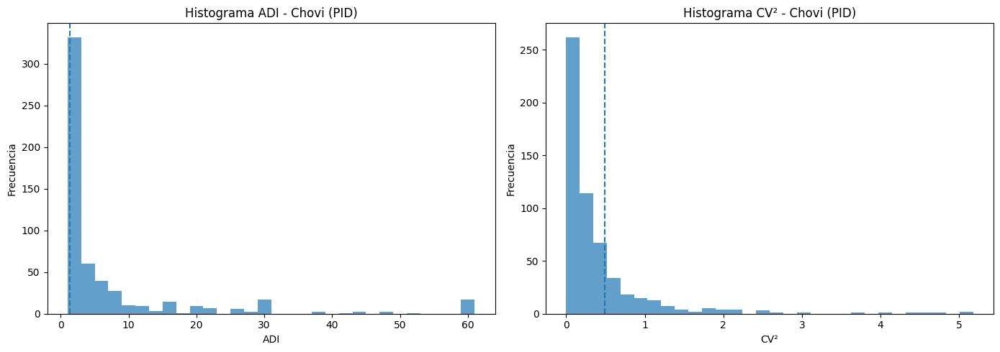

[Noel] Series totales: 3126
[Noel] Series válidas: 3126 (PID)


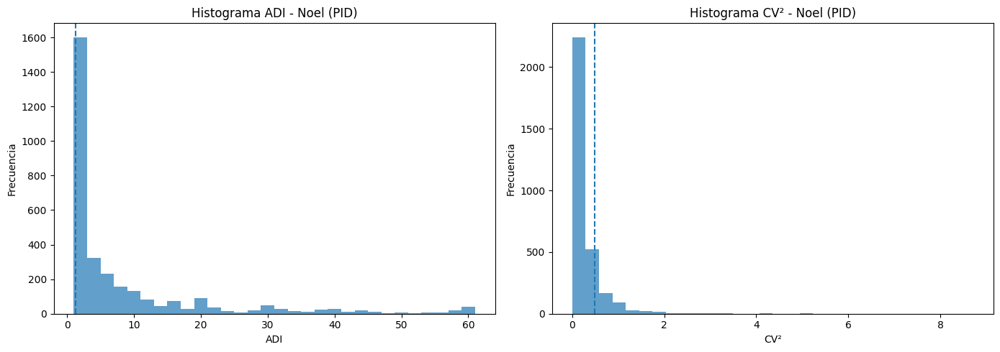

[Varma] Series totales: 358
[Varma] Series válidas: 358 (PID)


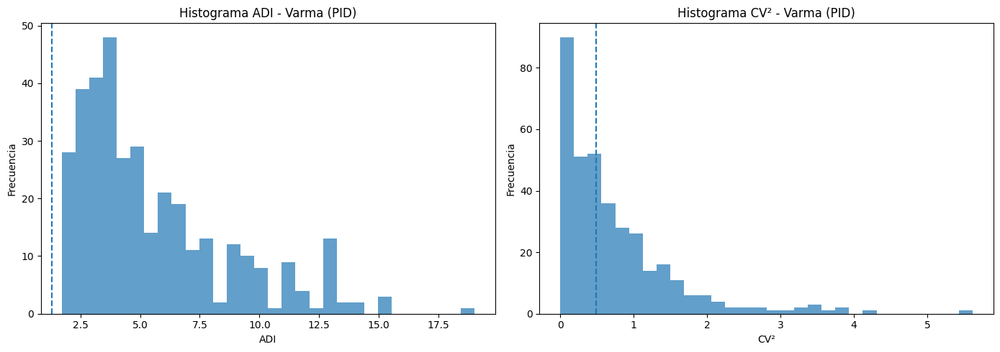

In [33]:
# Uso típico (asumiendo que ya tienes los summaries):
# Summaries sobre TRIMMED (correctos por dataset)
df_Almond_summary      = characterize_series_unified(dfs_ready['Almond'][0],      ds_col='ds', id_col='unique_id', y_col='y')
df_Amc_summary         = characterize_series_unified(dfs_ready['Amc'][0],         ds_col='ds', id_col='unique_id', y_col='y')
df_Amrest_summary      = characterize_series_unified(dfs_ready['Amrest'][0],      ds_col='ds', id_col='unique_id', y_col='y')
df_Calvo_summary       = characterize_series_unified(dfs_ready['Calvo'][0],       ds_col='ds', id_col='unique_id', y_col='y')
df_Chovi_summary       = characterize_series_unified(dfs_ready['Chovi'][0],       ds_col='ds', id_col='unique_id', y_col='y')
df_Cuatrogasa_summary  = characterize_series_unified(dfs_ready['Cuatrogasa'][0],  ds_col='ds', id_col='unique_id', y_col='y')
df_Damel_summary       = characterize_series_unified(dfs_ready['Damel'][0],       ds_col='ds', id_col='unique_id', y_col='y')
df_Fiorucci_summary    = characterize_series_unified(dfs_ready['Fiorucci'][0],    ds_col='ds', id_col='unique_id', y_col='y')
df_Frescobaldi_summary = characterize_series_unified(dfs_ready['Frescobaldi'][0], ds_col='ds', id_col='unique_id', y_col='y')
df_Frias_summary       = characterize_series_unified(dfs_ready['Frias'][0],       ds_col='ds', id_col='unique_id', y_col='y')
df_Grefusa_summary     = characterize_series_unified(dfs_ready['Grefusa'][0],     ds_col='ds', id_col='unique_id', y_col='y')
df_Lladro_summary      = characterize_series_unified(dfs_ready['Lladro'][0],      ds_col='ds', id_col='unique_id', y_col='y')
df_Noel_summary        = characterize_series_unified(dfs_ready['Noel'][0],        ds_col='ds', id_col='unique_id', y_col='y')
df_Pescanova_summary   = characterize_series_unified(dfs_ready['Pescanova'][0],   ds_col='ds', id_col='unique_id', y_col='y')
df_Varma_summary       = characterize_series_unified(dfs_ready['Varma'][0],       ds_col='ds', id_col='unique_id', y_col='y')


# Visualizaciones
# Manual
# plot_adi_cv2_histograms(df_Chovi_summary, 'Chovi', use_pid=False)
# plot_adi_cv2_histograms(df_Noel_summary,  'Noel',  use_pid=False)
# plot_adi_cv2_histograms(df_Varma_summary, 'Varma', use_pid=False)

# PID (si quieres comparar)
plot_adi_cv2_histograms(df_Chovi_summary, 'Chovi', use_pid=True)
plot_adi_cv2_histograms(df_Noel_summary,  'Noel',  use_pid=True)
plot_adi_cv2_histograms(df_Varma_summary, 'Varma', use_pid=True)

## Graficar Series Individuales representativas

In [34]:
# =============================================
# Graficar series representativas por categoría
# =============================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime

def plot_examples_by_category(df_trimmed: pd.DataFrame,
                              summary_df: pd.DataFrame,
                              *,
                              ds_col:          str = 'ds', 
                              id_col:          str = 'unique_id',
                              y_col:           str = 'y',
                              n_per_cat:       int = 3,
                              random_state:    int = 42,
                              dataset_name:    str = 'Dataset',
                              save_fig:        bool = False,
                              include_allzero: bool = False,           # <- nuevo: pintar o no las series AllZero
                              categories:      list[str] | None = None # <- opcional: pasar lista personalizada de categorías
                              ):
    """
    Dibuja n_per_cat ejemplos por categoría SB-2005 para inspección visual rápida.

    Decisiones de diseño:
    - La categoría *efectiva* prioriza 'Cat_PID' (si no existe, cae a 'Cat') para
      alinear la inspección con la “verdad operativa”.
    - Por defecto no se dibujan 'AllZero' porque no aportan patrón temporal útil.
      (activar con include_allzero=True si quieres verlos).
    - Selección aleatoria reproducible (random_state) para evitar sesgo sistemático
      hacia IDs concretos.

    Entradas:
    - df_filled  : datos ya rellenados y equiespaciados (incluye ceros).
    - summary_df : tabla de métricas/etiquetas por 'unique_id'.

    Salida:
    - Grid de líneas (categorías en filas, hasta n_per_cat series por categoría).
    """
    # 0) Elegir columna de categoría (Cat_PID > Cat)
    if 'Cat_PID' in summary_df.columns:
        cat_eff_col = 'Cat_PID'
    elif 'Cat' in summary_df.columns:
        cat_eff_col = 'Cat'
    else:
        raise KeyError("summary_df debe contener 'Cat' o 'Cat_PID'.")

    # 1) Definir qué categorías queremos mostrar
    if categories is None:
        categories = ['Smooth', 'Erratic', 'Intermittent', 'Lumpy']
        if include_allzero:
            categories = categories + ['AllZero']
    
    # 2) Filtrar únicamente categorías presentes en summary_df (evita filas vacías)
    valid_cats = [c for c in categories if (summary_df[cat_eff_col] == c).any()]
    n_rows = len(valid_cats)
    if n_rows == 0:
        print('[!] No hay categorías con datos para graficar.')
        return
    
    # 3) Preparar figura/axes y asegurar estructura 2D (evita edge cases 1xN / Nx1)
    fig, axes = plt.subplots(
        n_rows, n_per_cat,
        figsize = (5 * n_per_cat, 3 * n_rows),
        sharex = True
    )
    if n_rows == 1:
        axes = np.array([axes])
    if n_per_cat == 1:
        axes = axes.reshape((n_rows, 1))
    
    # 4) Semilla para reproducibilidad en la selección de IDs
    rng = np.random.default_rng(random_state)

    # 5) Tipos base correctos (fecha y numéricos) para evitar sorpresas en el plot
    dff = df_trimmed[[ds_col, id_col, y_col]].copy()
    dff[ds_col] = pd.to_datetime(dff[ds_col], errors = 'coerce')
    dff[y_col]  = pd.to_numeric(dff[y_col], errors = 'coerce')

    # 6) Bucle por categoría: muestrea IDs y dibuja cada serie temporal
    for i, cat in enumerate(valid_cats):
        ids = summary_df.loc[summary_df[cat_eff_col] == cat, id_col].unique()
        if len(ids) == 0:
            # Seguridad extra (no debería ocurrir tras valid_cats)
            for j in range(n_per_cat): axes[i, j].axis('off')
            continue

        sample_size = min(n_per_cat, len(ids))
        sample_ids  = rng.choice(ids, size = sample_size, replace = False)

        for j, uid in enumerate(sample_ids):
            ts = (dff[dff[id_col] == uid]
                  .sort_values(ds_col, kind = 'mergesort'))  # orden estable
            ax = axes[i, j]
            ax.plot(ts[ds_col], ts[y_col], marker = 'x', linestyle = '-')
            ax.set_title(f'{cat} — ID: {uid}')
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis = 'x', rotation = 45)
            ax.grid(alpha = 0.3)
        
        # Celdas sobrantes (cuando hay menos IDs que n_per_cat)
        for j in range(sample_size, n_per_cat):
            axes[i, j].axis('off')
    
    plt.tight_layout()

    if save_fig:
        filename = f"ejemplos_series_{dataset_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
        plt.savefig(filename, dpi = 300)
        print(f'📁 Figura guardada como: {filename}')
    
    plt.show()

---

## Graficar Métricas por Categoría (Boxplots)

El **objetivo** es usar `summary_df` para graficar métricas descriptivas de las series, como `mean`, `std`, `CV2`, `ADI`, etc., agrupadas por `Cat`, **pero solo si hay datos en esa categoría**.

In [35]:
# ============================================
# Boxplots de métricas por categoría
# ============================================
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplots_by_category(
    summary_df: pd.DataFrame,
    *,
    metrics: tuple[str, ...] = ('mean', 'std', 'CV2', 'ADI'),
    dataset_name: str = 'Dataset',
    cat_col: str = 'Cat_PID',                # 'Cat' o 'Cat_PID'
    order: tuple[str, ...] = ('Smooth', 'Erratic', 'Intermittent', 'Lumpy'),
    save_fig: bool = False,
    showfliers: bool = True,                 # mostrar puntos fuera de bigotes
    whis: float | tuple[float, float] = 1.5, # bigotes=1.5*IQR o percentiles (p.ej., (5,95))
    logy_for: tuple[str, ...] = ()           # p.ej. ('CV2',) si hay colas pesadas
):
    """
    Compara la distribución de métricas por categoría SB-2005 mediante boxplots.

    Decisiones de diseño:
    - 'cat_col' permite elegir Manual vs PID según tu “verdad operativa”.
    - Para métricas con colas largas (CV2, std), es útil activar 'logy_for'.
    - El orden fijo de categorías mejora la comparabilidad entre datasets.

    Notas:
    - Filtramos NaN y mostramos solo categorías presentes para evitar
      boxplots vacíos.
    """

    if cat_col not in summary_df.columns:
        raise KeyError(f"{cat_col} no existe en summary_df.")
    
    for metric in metrics:
        if metric not in summary_df.columns:
            print(f"[!] Columnas no encontranda: {metric}")
            continue

        # 1) Dataset para esta métrica (sin NaN)
        df_metric = summary_df[[cat_col, metric]].dropna()
        if df_metric.empty:
            print(f"[!] No hay datos válidos para '{metric}'")
            continue

        # 2) Mantener orden deseado, pero solo con categorías presentes
        present = [c for c in order if c in df_metric[cat_col].unique()]
        if not present:
            print(f"[!] No hay categorías válidas para '{metric}'")
            continue

        plt.figure(figsize = (8, 5))
        ax = sns.boxplot(data = df_metric[df_metric[cat_col].isin(present)],
                         x = cat_col,
                         y = metric,
                         order = present,
                         palette = 'Set2',
                         showfliers = showfliers,
                         whis = whis)
        
        # 3) Escala log opcional (útil para CV2 y std si hay outliers fuertes)
        # if metric in logy_for:
        #     ax.set_yscale('log')
        
        ax.set_title(f'Boxplot de {metric} por Categoría - {dataset_name} ({cat_col})')
        ax.set_xlabel('Categoría')
        ax.set_ylabel(metric)
        ax.grid(alpha = 0.3)
        plt.tight_layout()

        if save_fig:
            filename = f"boxplot_{metric}_{dataset_name}_{cat_col}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
            plt.savefig(filename, dpi = 300)
            print(f"📁 Figura guardada como: {filename}")
        
        plt.show()

# Se ha añadido logy_for = ('CV2', ...) porque CV2 suele ser muy asimétrico, cajas más informativas.
# El order fijo ayuda a comparar datasets entre sí.
# Si se quiere ver outliers con más detalle, se puede añadir:
# - whis = (5, 95), o
# - showfliers = True/False

In [36]:
# ============================================================
# Runners para (1) un dataset concreto y (2) todos los datasets
# ============================================================

# Helper: aceptar tanto dict[name] -> df como dict[name] -> (df, freq)
def _unwrap_df(df_or_tuple):
    if isinstance(df_or_tuple, tuple) and len (df_or_tuple) >= 1:
        return df_or_tuple[0]
    return df_or_tuple

def run_plots_for_dataset(
    name:            str,
    df_trimmed:       pd.DataFrame,
    *,
    summary_df:      pd.DataFrame | None = None,
    cat_col:         str = 'Cat_PID',           # 'Cat' o 'Cat_PID'
    # --- ejemplos por categoría ---
    n_per_cat:       int = 3,
    include_allzero: bool = False,
    random_state:    int = 42,
    # --- boxplots ---
    metrics:         tuple[str, ...] = ('mean', 'std', 'CV2', 'ADI'),
    showfliers:      bool = True,
    whis:            float | tuple[float, float] = 1.5,
    logy_for:        tuple[str, ...] = (),     # p.ej. ('CV2',)
    # --- control ---
    draw_examples:   bool = True,
    draw_boxplots:   bool = True,
    save_fig:        bool = True
):
    """
    Lanza los dos tipos de gráficos para UN dataset:
      1) Ejemplos de series por categoría (muestra n_per_cat)
      2) Boxplots de métricas por categoría
    Si no pasas 'summary_df', lo calcula con characterize_series_unified(...)
    """
    # 1) Preparar summary si hace falta
    if summary_df is None:
        summary_df = characterize_series_unified(
            df_trimmed, ds_col = 'ds', id_col = 'unique_id', y_col = 'y'
        )

    # 2) Chequeo de columna de categoría
    if cat_col not in summary_df.columns:
        raise KeyError(f"'{cat_col}' no está en summary_df. Columns: {summary_df.columns.tolist()}")

    print(f"\n▶️ Dataset: {name} | series = {summary_df.shape[0]}")

    # 3) Dibujar ejemplos por categoría
    if draw_examples:
        print("   · Gráficos de series representativas por categoría…")
        plot_examples_by_category(
            df_trimmed, summary_df,
            ds_col = 'ds', id_col = 'unique_id', y_col = 'y',
            n_per_cat = n_per_cat, random_state = random_state,
            dataset_name = name, save_fig = save_fig,
            include_allzero = include_allzero
        )

    # 4) Boxplots de métricas
    if draw_boxplots:
        print("   · Boxplots de métricas por categoría…")
        plot_boxplots_by_category(
            summary_df,
            metrics = metrics,
            dataset_name = name,
            cat_col = cat_col,
            order = ('Smooth', 'Erratic', 'Intermittent', 'Lumpy'),
            save_fig = save_fig,
            showfliers = showfliers,
            whis = whis,
            logy_for = logy_for
        )

    return summary_df  # por comodidad, lo devolvemos por si lo quieres reutilizar


def run_plots_for_all(
    dfs_dict:        dict[str, pd.DataFrame | tuple],
    *,
    summaries:       dict[str, pd.DataFrame] | None = None,  # opcional: reusar summaries ya calculados
    only:            list[str] | None = None,                # si quieres filtrar algunos datasets
    cat_col:         str = 'Cat_PID',
    # --- ejemplos por categoría ---
    n_per_cat:       int = 3,
    include_allzero: bool = False,
    random_state:    int = 42,
    # --- boxplots ---
    metrics:         tuple[str, ...] = ('mean', 'std', 'CV2', 'ADI'),
    showfliers:      bool = True,
    whis:            float | tuple[float, float] = 1.5,
    logy_for:        tuple[str, ...] = (),
    # --- control ---
    draw_examples:   bool = True,
    draw_boxplots:   bool = False,
    save_fig:        bool = True,
    verbose:         bool = True
):
    """
    Recorre TODOS los datasets en dfs_filled y lanza:
      - ejemplos por categoría
      - boxplots de métricas
    Opciones:
      - 'only' para evaluar solo algunos por nombre.
      - 'summaries' para evitar recomputar characterize_series_unified.
    """
    names = list(dfs_dict.keys())
    if only:
        names = [n for n in names if n in only]
        if verbose:
            print(f"(Filtrado) Evaluando: {names}")

    for name in names:
        try:
            df_trimmed = _unwrap_df(dfs_dict[name])
            summ = summaries.get(name) if summaries else None

            run_plots_for_dataset(
                name, df_trimmed,
                summary_df      = summ,
                cat_col         = cat_col,
                n_per_cat       = n_per_cat,
                include_allzero = include_allzero,
                random_state    = random_state,
                metrics         = metrics,
                showfliers      = showfliers,
                whis            = whis,
                logy_for        = logy_for,
                draw_examples   = draw_examples,
                draw_boxplots   = draw_boxplots,
                save_fig        = save_fig
            )
        except Exception as e:
            # seguimos con el resto aunque uno falle
            print(f"⚠️ {name}: error al generar gráficos -> {e}")


▶️ Dataset: Noel | series = 3126
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Noel_20250926_104633.png


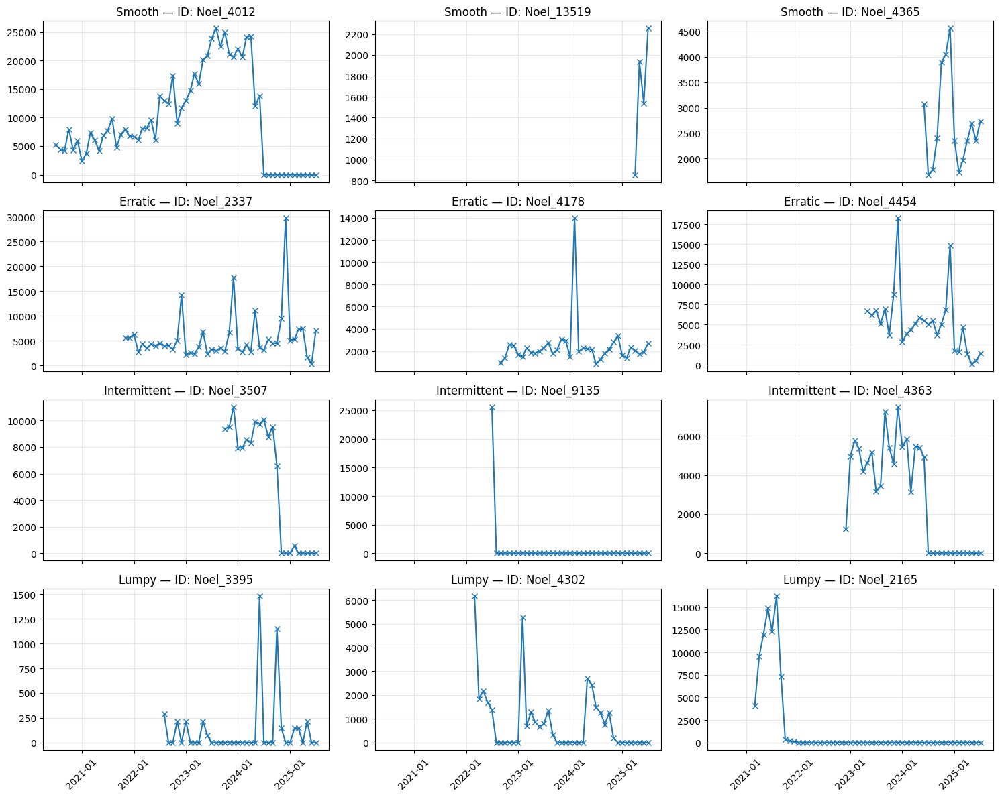

   · Boxplots de métricas por categoría…
📁 Figura guardada como: boxplot_mean_Noel_Cat_PID_20250926_104634.png


C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\3063113527.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data = df_metric[df_metric[cat_col].isin(present)],


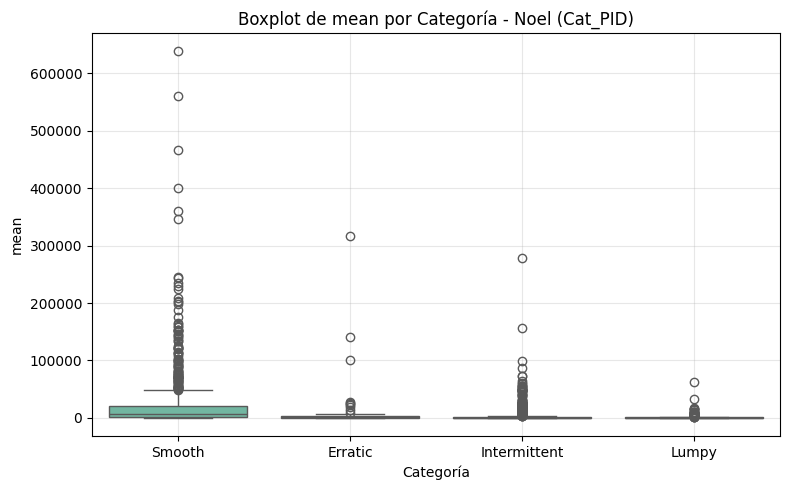

C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\3063113527.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data = df_metric[df_metric[cat_col].isin(present)],


📁 Figura guardada como: boxplot_std_Noel_Cat_PID_20250926_104635.png


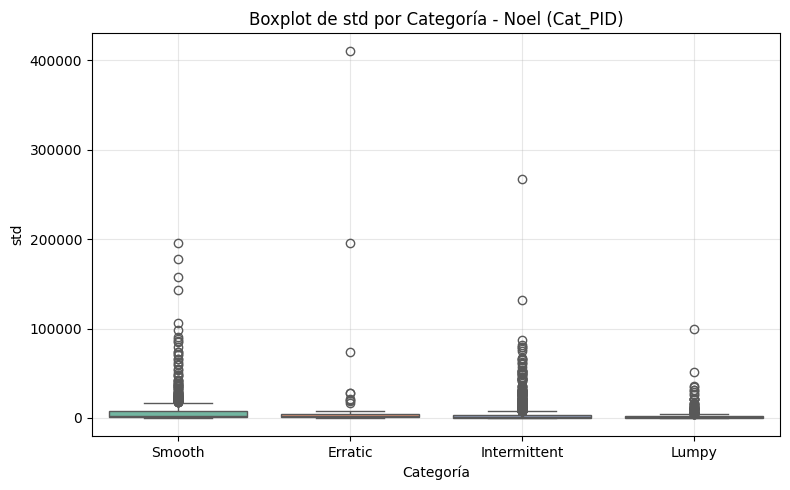

C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\3063113527.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data = df_metric[df_metric[cat_col].isin(present)],


📁 Figura guardada como: boxplot_CV2_Noel_Cat_PID_20250926_104635.png


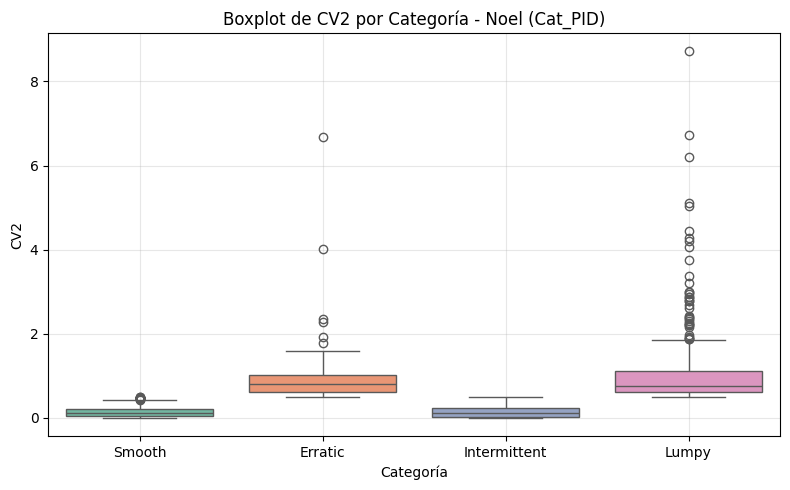

C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_11088\3063113527.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data = df_metric[df_metric[cat_col].isin(present)],


📁 Figura guardada como: boxplot_ADI_Noel_Cat_PID_20250926_104635.png


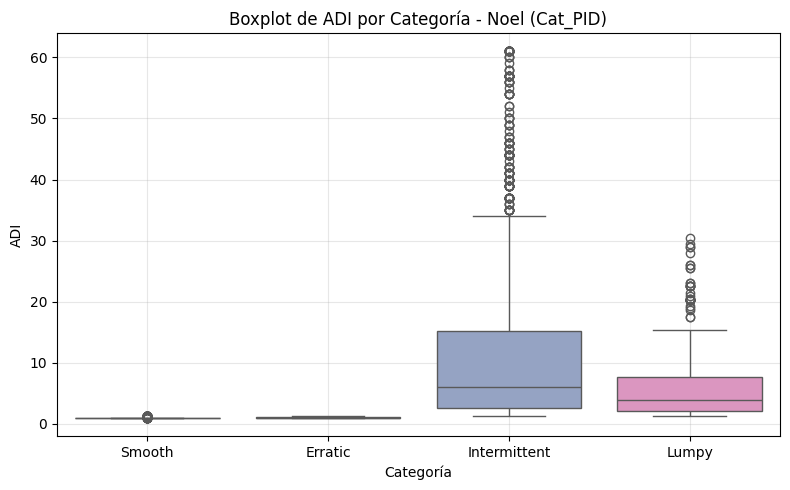


▶️ Dataset: Almond | series = 681
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Almond_20250926_104636.png


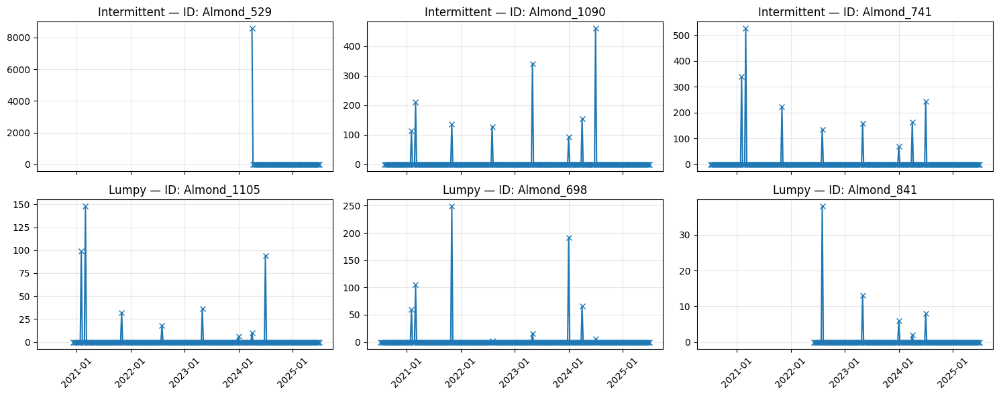


▶️ Dataset: Amc | series = 3592
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Amc_20250926_104641.png


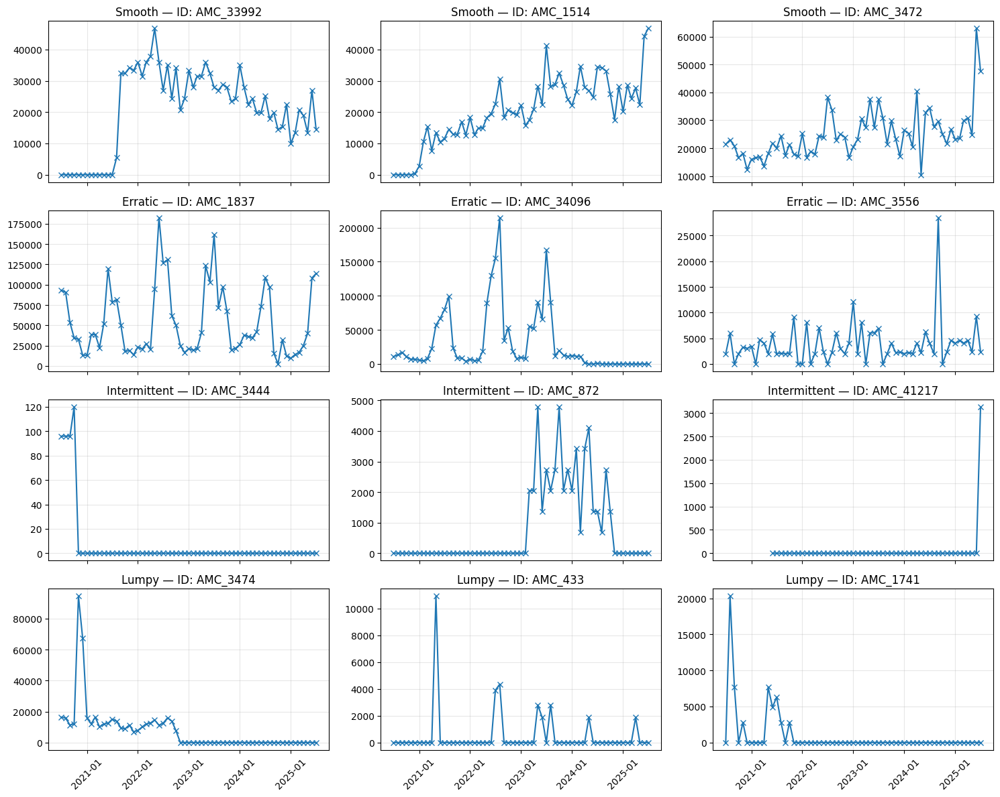


▶️ Dataset: Amrest | series = 2526
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Amrest_20250926_104646.png


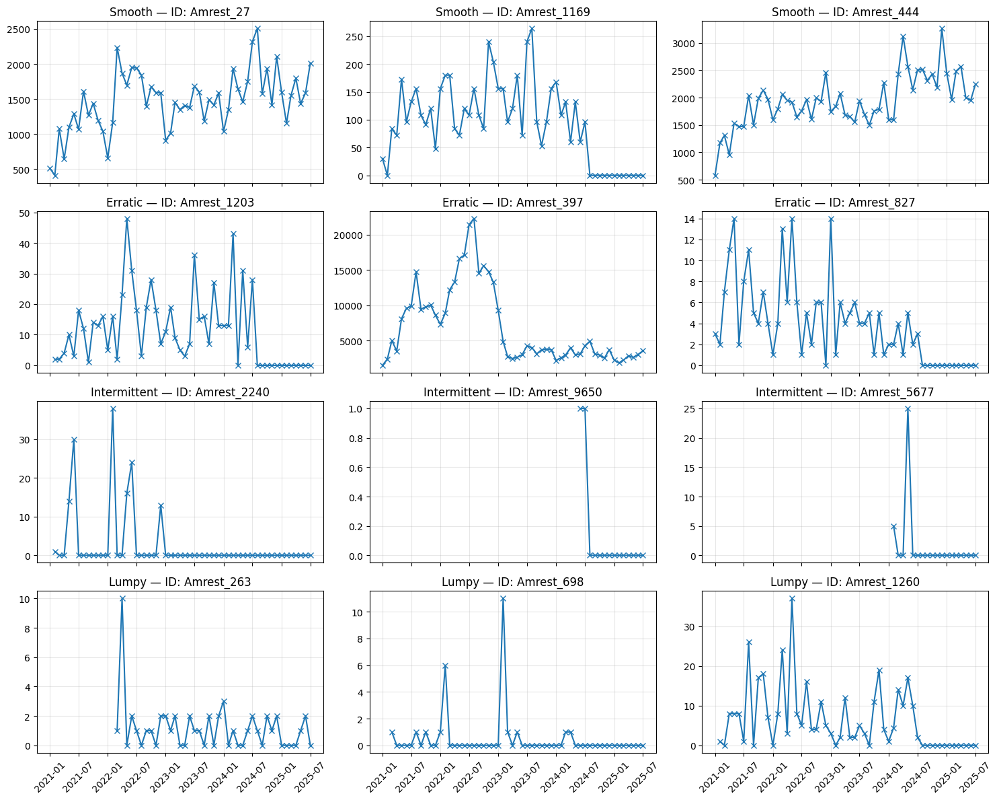


▶️ Dataset: Calvo | series = 2430
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Calvo_20250926_104651.png


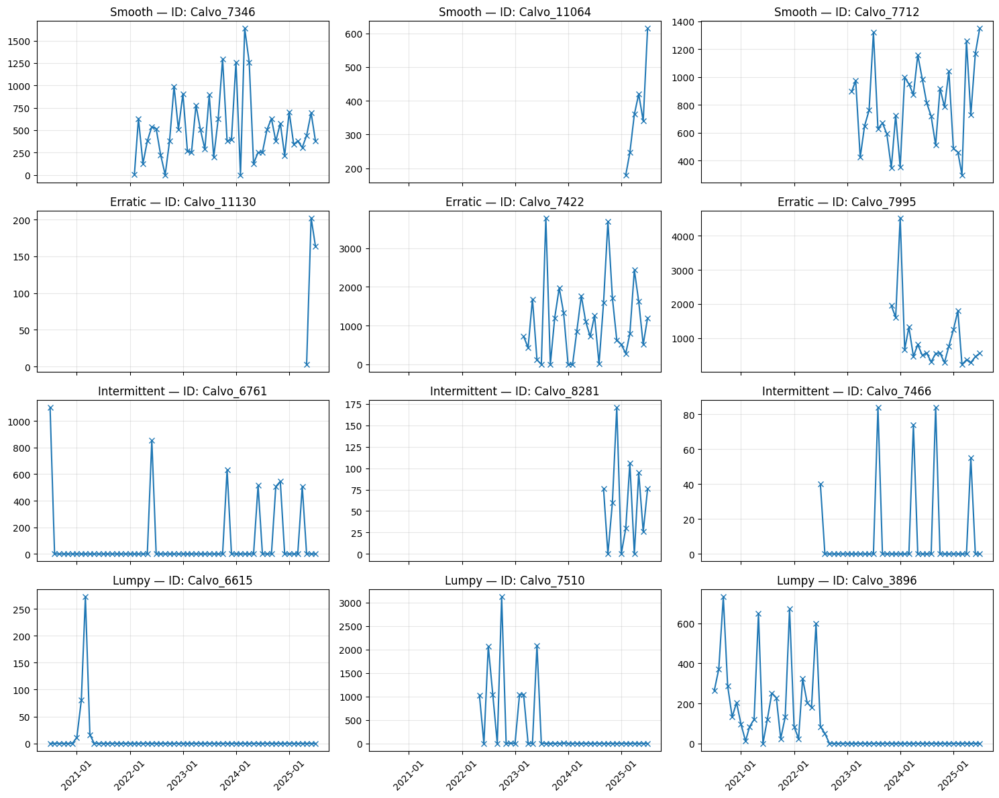


▶️ Dataset: Chovi | series = 561
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Chovi_20250926_104653.png


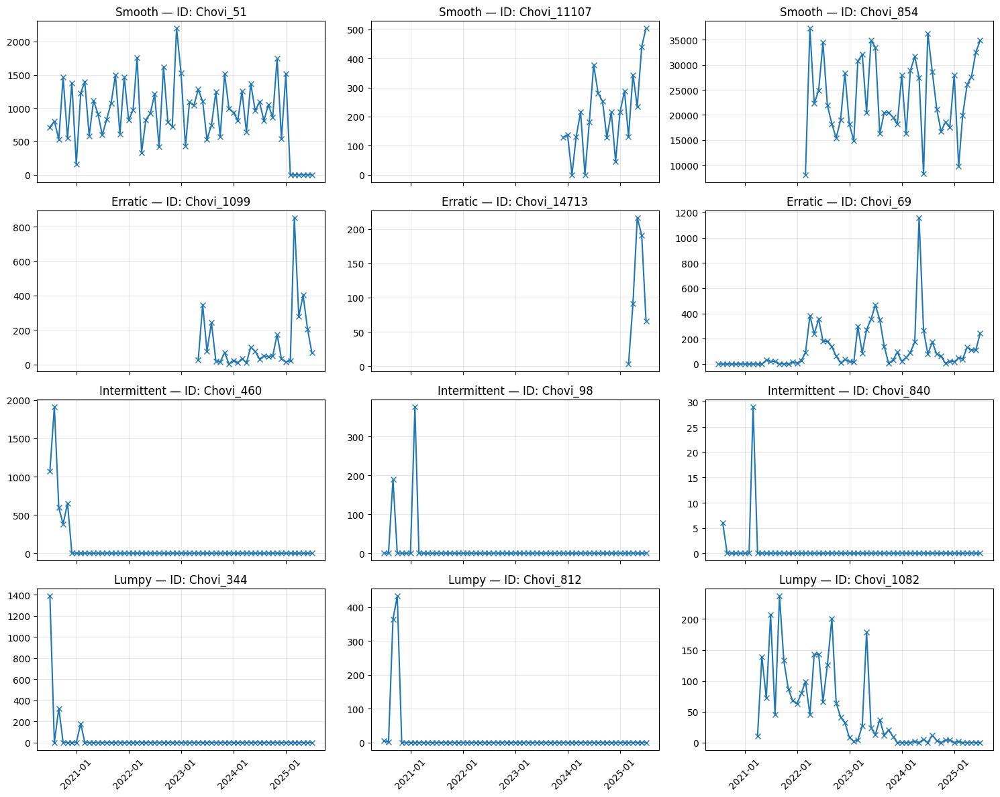


▶️ Dataset: Cuatrogasa | series = 1308
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Cuatrogasa_20250926_104656.png


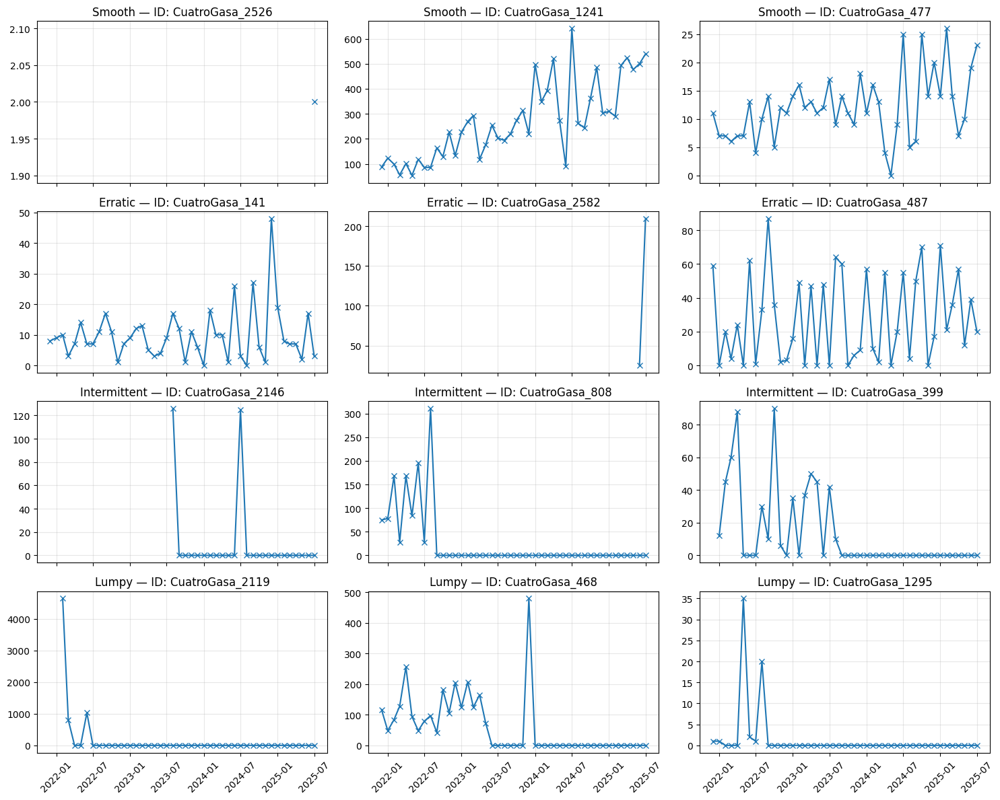


▶️ Dataset: Damel | series = 2579
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Damel_20250926_104701.png


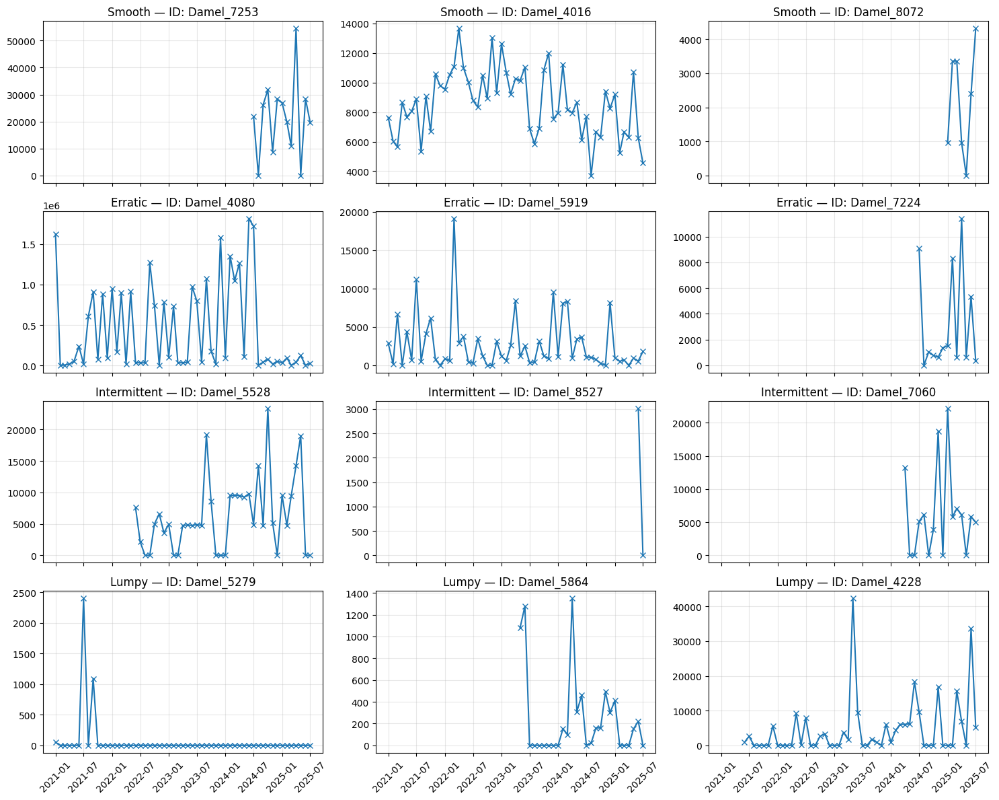


▶️ Dataset: Fiorucci | series = 446
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Fiorucci_20250926_104704.png


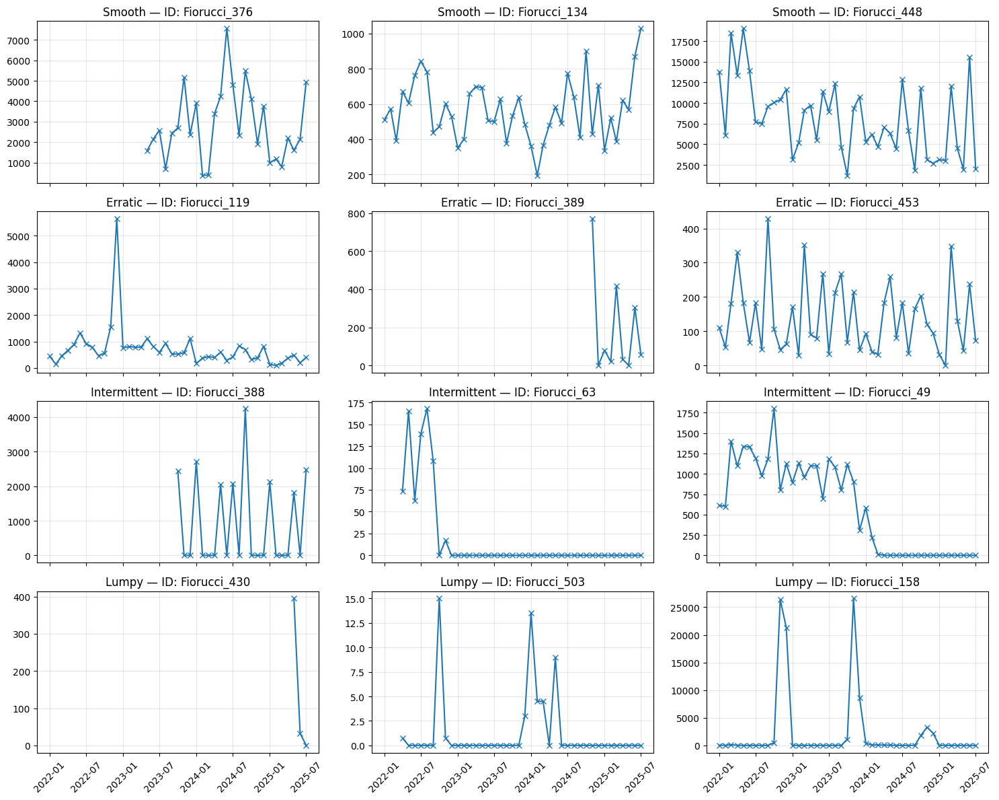


▶️ Dataset: Frescobaldi | series = 3453
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Frescobaldi_20250926_104710.png


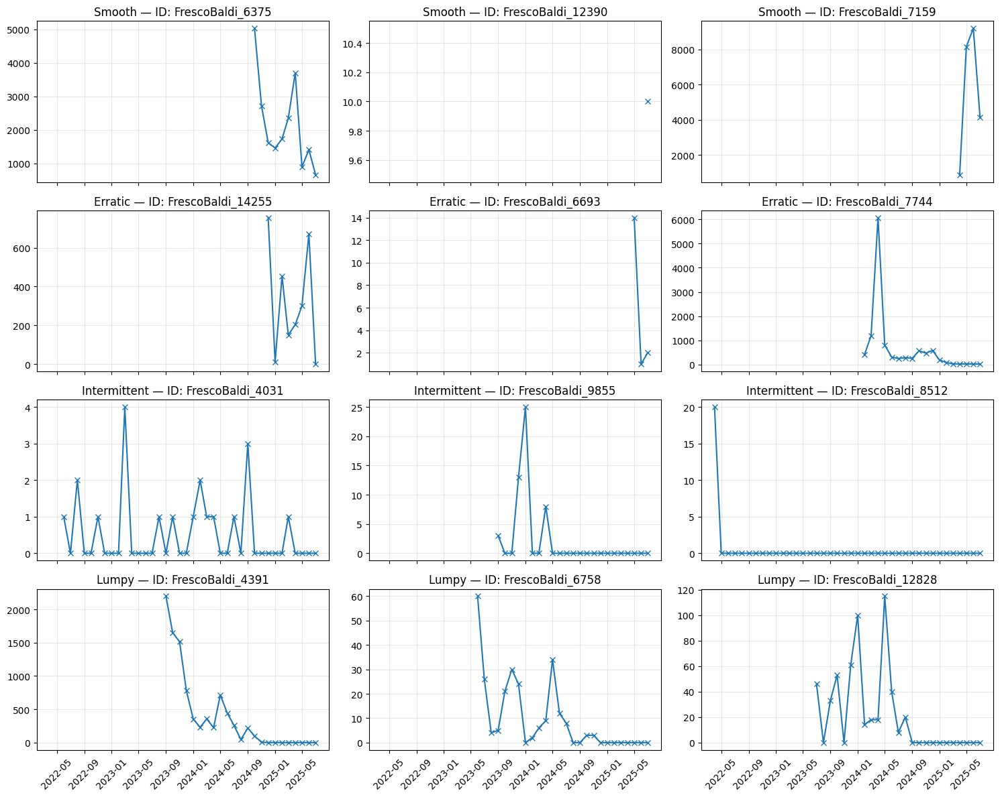


▶️ Dataset: Frias | series = 842
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Frias_20250926_104713.png


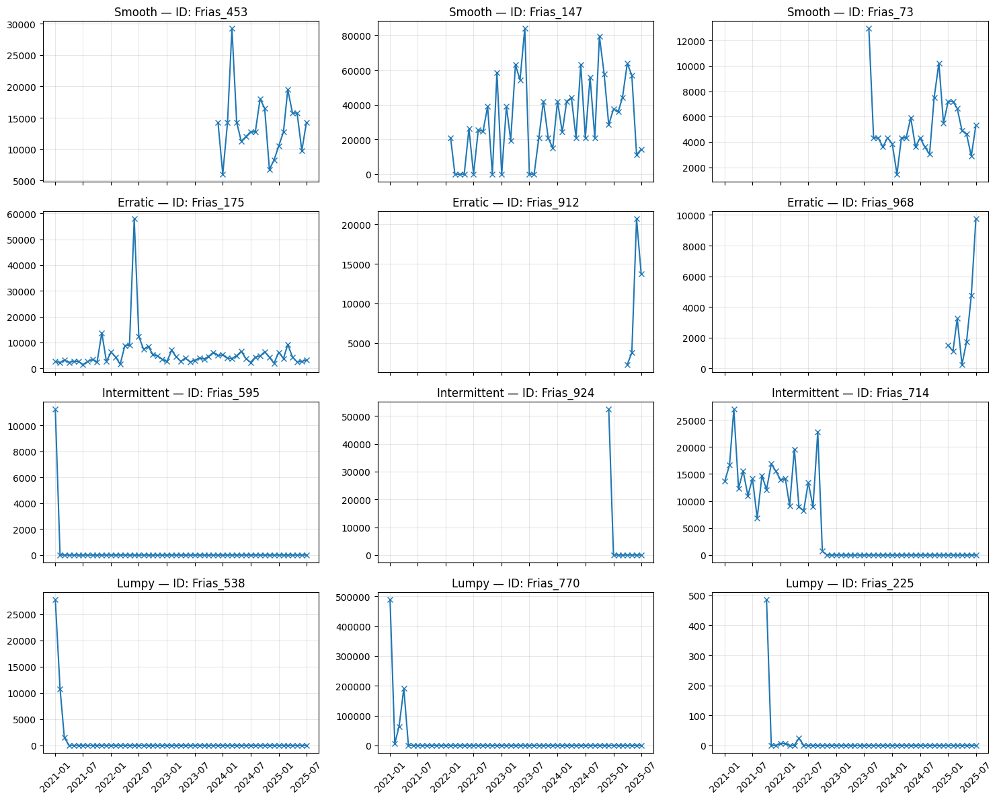


▶️ Dataset: Grefusa | series = 1317
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Grefusa_20250926_104717.png


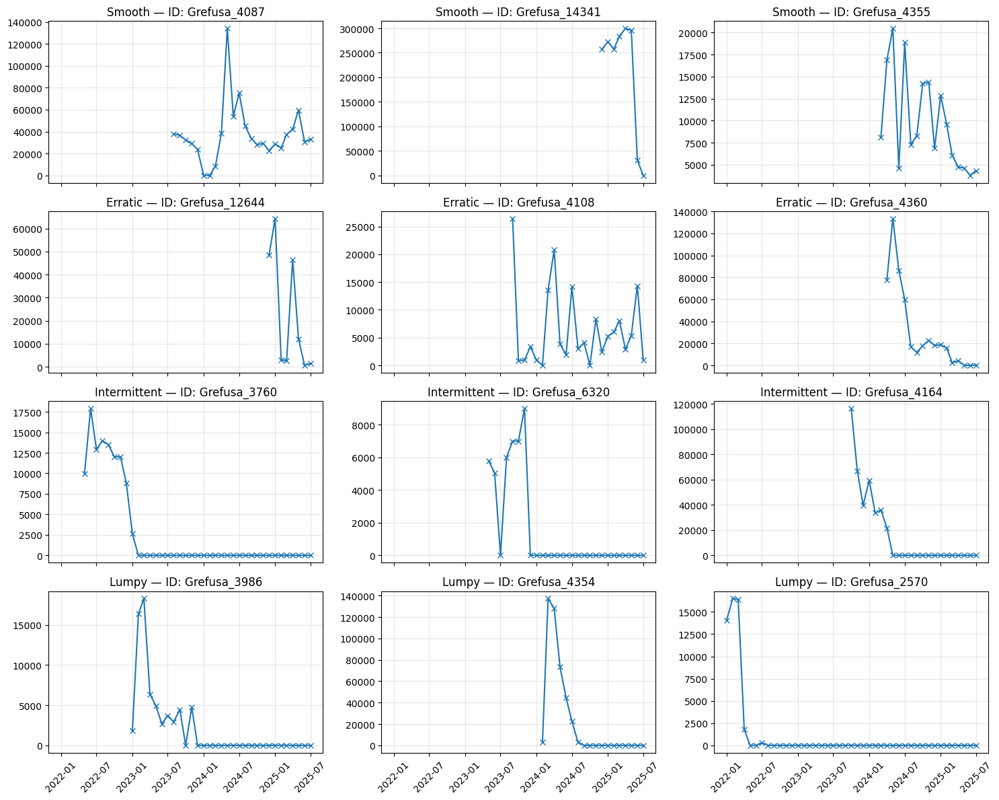


▶️ Dataset: Lladro | series = 5123
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Lladro_20250926_104724.png


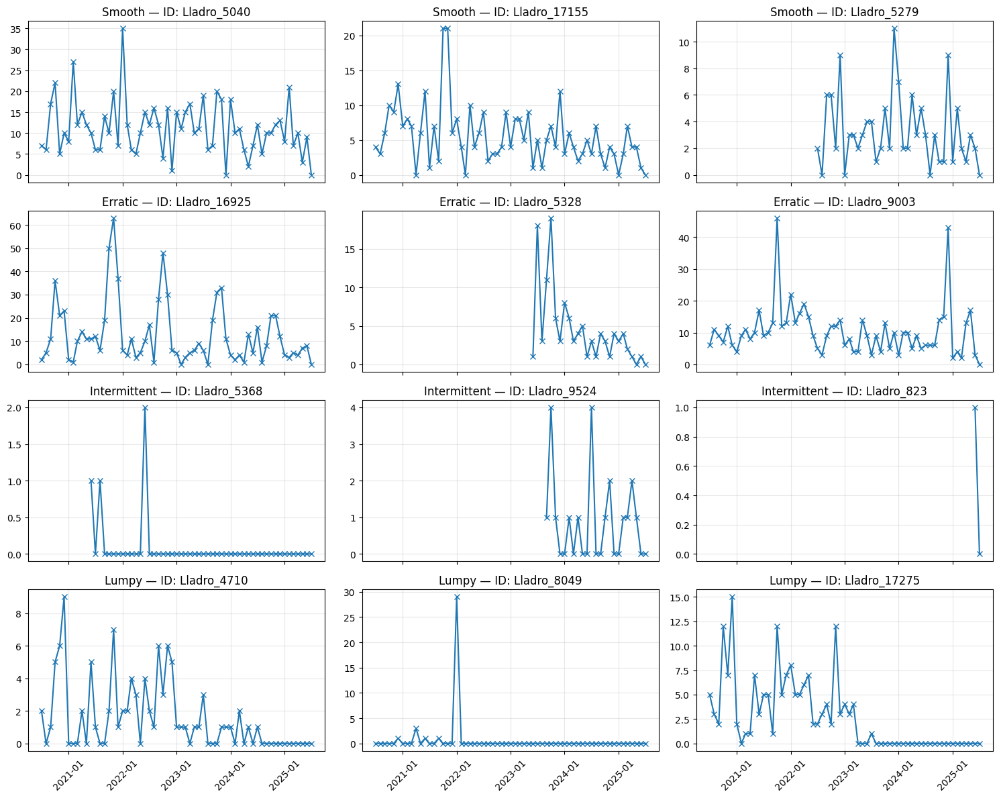


▶️ Dataset: Noel | series = 3126
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Noel_20250926_104729.png


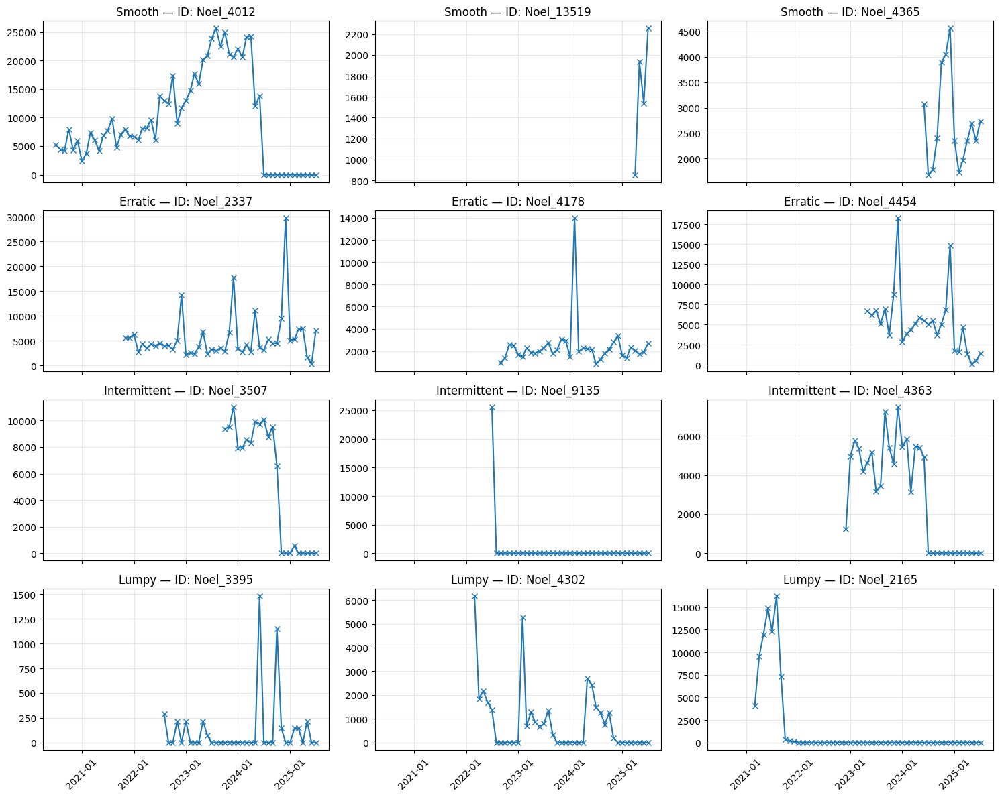


▶️ Dataset: Pescanova | series = 15809
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Pescanova_20250926_104748.png


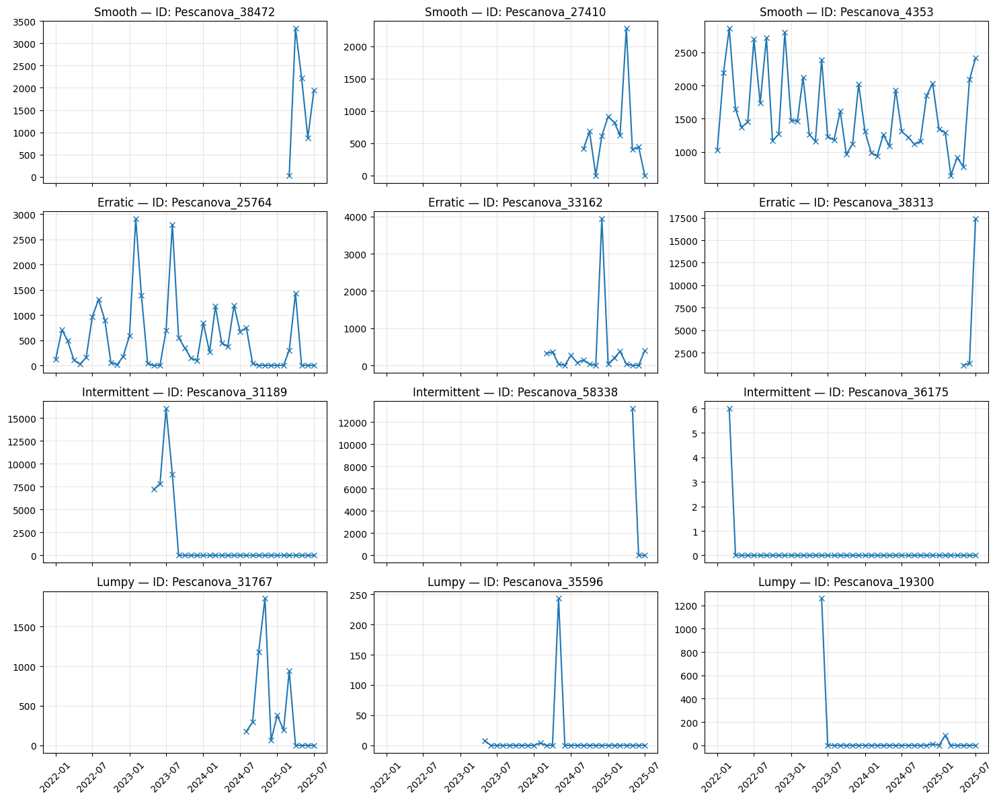


▶️ Dataset: Varma | series = 358
   · Gráficos de series representativas por categoría…
📁 Figura guardada como: ejemplos_series_Varma_20250926_104750.png


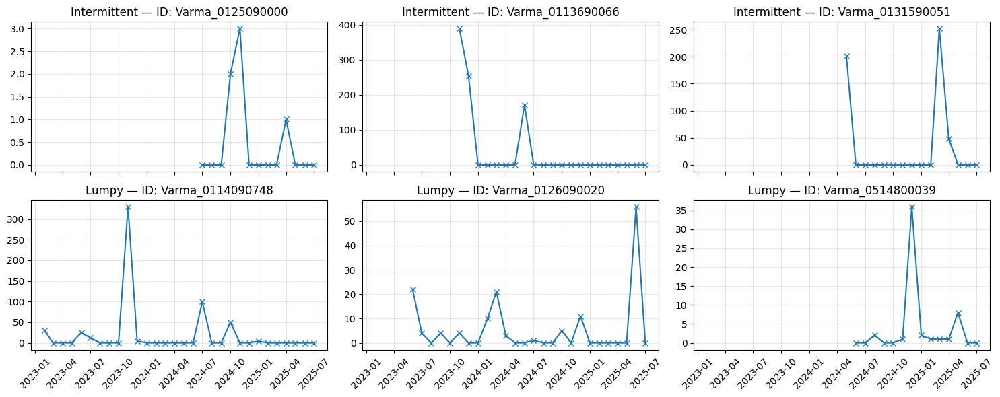

In [38]:
# Ejemplos de uso con *_trimmed
# 1) Un dataset concreto (Noel), usando dfs_ready
#    (si no pasas summary_df, se calcula automáticamente con df_Noel_trimmed)
run_plots_for_dataset("Noel",
                      dfs_ready['Noel'][0],
                      summary_df      = None, # o results['Noel']['summary'] si ya está
                      cat_col         = "Cat_PID",
                      n_per_cat       = 3,
                      include_allzero = False,
                      metrics         = ('mean', 'std', 'CV2', 'ADI'),
                    #   logy_for        = ('CV2',), # NO activado; el bloque está comentado
                      save_fig        = True
                      )

# 2) Todos los datasets TRIMMED (sin boxplots para salida ligera)

# Si ya se ha ejecutado el runner de clasificación y se tiene 'results', se puede reutilizar los summaries y ahorrar recomputo:
summares_map = {name: results[name]['summary'] for name in dfs_ready}
run_plots_for_all(dfs_ready,
                  summaries = None, # o {n: results[n]['summary'] for n in dfs_ready} para reutilizar
                  cat_col = 'Cat_PID',
                  draw_examples = True,
                  draw_boxplots = False, # True si se quieren también los boxplots
                  save_fig = True,
                  verbose = True
                  )

---

### Clasificación del Estado de las Series

**Propuesta de Estados**

- **Obsoleta**: Sin positivs últimos L meses (y opcionalmente sin señal en la ventana estacional).
- **Insuficiente**: Longitud < `min_largo` (según objetivo de modelado).
- **One-Off**: Exactamente 1 positivo (o 1 mes con ventas).
- **Ultra-esparsa**: 2-3 positivos o `pZeros ≥ umbral` (p.ej. 0.95) y `ADI` alto (p.ej. ≥ 6).
- **Válida**: Resto.

Esto permite **no descartar** automáticamente series críticas pero tratarlas con **otra ruta** (agregación por familia, simulación de intervalos + tamaños, previsión de probabilidad de ocurrencia, etc.).

In [39]:
# -----------------------------------------------------------------------------
# CLASIFICACIÓN DE ESTADO DE SERIES (TRIMMED)
# -----------------------------------------------------------------------------
# Objetivo:
#   Etiquetar cada serie en un estado operativo útil para decidir su ruta
#   de modelado/limpieza: Obsoleta, Insuficiente, One-Off, Ultra-esparsa, Válida.
#
# Supuestos:
#   - df_*_filled está equiespaciado (mensual o semanal) y ordenable por 'ds'.
#   - La ventana 'n_obsoleta' se interpreta en PERÍODOS (meses si mensual,
#     semanas si semanal). Esto evita confusiones entre datasets de distinta
#     frecuencia.
#
# Precedencia (importante):
#   Obsoleta > Insuficiente > One-Off > Ultra-esparsa > Válida
#   (solo se asigna un estado, y el primero que cumpla la condición gana).
# -----------------------------------------------------------------------------
   
def clasificar_estado_series(
        df,
        id_col            = 'unique_id',
        ds_col            = 'ds',
        y_col             = 'y',
        n_obsoleta        = 13,   # nº de PERÍODOS al final con cero para marcar Obsoleta
        min_largo         = 12,   # longitud mínima para considerar la serie "apta"
        one_off           = True, # habilita estado "One-Off" (=1 positivo en toda la serie)
        ultra_esparsa     = True, # habilita estado "Ultra-esparsa"
        ultra_nonzero_max = 3,    # umbral de nº de positivos para Ultra-esparsa
        pzeros_umbral     = 0.95, # o bien proporción de ceros muy alta...
        adi_umbral        = 6,    # ... y ADI alto (intervalo medio entre positivos)
        logging           = True
):
    """
    Estados posibles:
      - 'Obsoleta'     : últimos n_obsoleta períodos sin positivos (y longitud suficiente)
      - 'Insuficiente' : longitud total < min_largo
      - 'One-Off'      : exactamente 1 positivo en toda la serie
      - 'Ultra-esparsa': ≤ ultra_nonzero_max positivos, o (pZeros ≥ pzeros_umbral y ADI ≥ adi_umbral)
      - 'Valida'       : el resto

    Notas:
      - Trabaja con df *_trimmed (equiespaciado y recortado).
      - 'n_obsoleta' se interpreta en períodos (meses o semanas, según el dataset).
      - Si la serie es muy corta (< min_largo) cae en 'Insuficiente' salvo que cumpla
        primero 'Obsoleta' (si n ≥ n_obsoleta y todos ceros en la ventana final).
    """

    # --- Dependencia blanda: calculate_adi (ya definida previamente). Si falta, avisa.
    # --- Salvaguarda: define calculate_adi si no existe en el entorno ---
    try:
        calculate_adi # noqa: F821
    except NameError:
        def calculate_adi(ts: pd.Series) -> float:
            ts = pd.to_numeric(ts, errors = 'coerce').fillna(0)
            n_tot = len(ts)
            n_nonzero = (ts > 0).sum()
            return n_tot / n_nonzero if n_nonzero > 0 else np.inf

    estados = []

    # Aseguramos tipos base
    dfx = df[[id_col, ds_col, y_col]].copy()
    dfx[ds_col] = pd.to_datetime(dfx[ds_col], errors = 'coerce')
    dfx[y_col]  = pd.to_numeric(dfx[y_col],   errors = 'coerce')

    for uid, g in dfx.groupby(id_col, sort = False):
        g = g.sort_values(ds_col)
        y = g[y_col].to_numpy(dtype = 'float64', copy = False)

        n   = len(y)                 # longitud total en períodos
        pos = int((y > 0).sum())     # nº de períodos con demanda > 0

        estado, motivo = None, None

        #################### REGLAS Y UMBRALES DE CRITERIOS DE ESTADO ####################
        ##################################################################################
        # 1) Obsoleta: ventana final de n_obsoleta períodos sin positivos
        #    Requiere tener al menos n_obsoleta observaciones.
        if n >= n_obsoleta and (y[-n_obsoleta:] > 0).sum() == 0:
            estado = 'Obsoleta'
            motivo = f'Últimos {n_obsoleta} períodos con cero'

        # 2) Insuficiente: la serie es demasiado corta para el horizonte/modelo objetivo
        elif n < min_largo:
            estado = 'Insuficiente'
            motivo = f'Longitud < {min_largo} períodos'

        # 3) One-Off: una sola venta en toda la historia
        elif one_off and pos == 1:
            estado = 'One-Off'
            motivo = 'Exactamente 1 positivo'

        # 4) Ultra-esparsa: poquísimos positivos o ceros dominantes + gran separación media
        else:
            ultra_flag = False
            if ultra_esparsa:
                pzeros = float((y == 0).mean())
                adi    = calculate_adi(pd.Series(y))
                ultra_flag = (pos <= ultra_nonzero_max) or (pzeros >= pzeros_umbral and adi >= adi_umbral)

            if ultra_flag:
                estado = 'Ultra-esparsa'
                motivo = f'{pos} positivos / pZeros={pzeros:.2f} / ADI≈{adi:.1f}'
            else:
                estado = 'Valida'
                motivo = '✔'

        estados.append((uid, estado, motivo))

    estado_df = pd.DataFrame(estados, columns=[id_col, 'Estado', 'Motivo'])

    if logging:
        print('📋 Resumen de estados:')
        print(estado_df['Estado'].value_counts(dropna = False), '\n')

    return estado_df

In [40]:
# ---------------------------
# Parámetros por dataset
# ---------------------------
STATE_PARAMS = {
    'default': {'n_obsoleta': 12, 'min_largo': 18}, # mensual por defecto
    'Almond': {'n_obsoleta':  52, 'min_largo': 18}, # semanal
}

def _params_for(name: str) -> dict:
    p = STATE_PARAMS.get('default', {}).copy()
    p.update(STATE_PARAMS.get(name, {}))
    return p


# ---------------------------
# Helper: summary sobre TRIMMED (si no existe)
# ---------------------------
def ensure_trimmed_summary(df_trimmed: pd.DataFrame,
                           existing:   pd.DataFrame | None = None) -> pd.DataFrame:
    if existing is not None:
        return existing
    return characterize_series_unified(df_trimmed, ds_col = 'ds', id_col = 'unique_id', y_col = 'y')


# ---------------------------
# 1) Un dataset (TRIMMED)
# ---------------------------
def classify_one_dataset(name:            str,
                         df_trimmed:      pd.DataFrame,
                         summary_trimmed: pd.DataFrame | None = None,
                         merge:           bool = True,
                         verbose:         bool = True):
    params = _params_for(name)
    estados = clasificar_estado_series(df_trimmed, logging = verbose, **params)
    summary_out = ensure_trimmed_summary(df_trimmed, summary_trimmed)
    if merge:
        summary_out = summary_out.merge(estados, on = 'unique_id', how = 'left')
    return estados, summary_out


# ---------------------------
# 2) Todos los datasets (READY)
# Espera un dict: {name: (df_ready, freq)} o {name: df_ready}
# ---------------------------
def classify_all_datasets(dfs_dict:          dict,
                          summaries_trimmed: dict | None = None,
                          merge:             bool = True,
                          verbose:           bool = True):
    estados_by_name = {}
    summaries_with_state = {}

    for name, df_or_tuple in dfs_dict.items():
        df_trimmed = df_or_tuple[0] if isinstance(df_or_tuple, tuple) else df_or_tuple
        s0 = summaries_trimmed.get(name) if summaries_trimmed and name in summaries_trimmed else None
        
        est, summ = classify_one_dataset(name, df_trimmed, s0, merge = merge, verbose = verbose)
        estados_by_name[name] = est
        summaries_with_state[name] = summ

        # Opcional: Si se quiere dejar copia en globals, evitar "trimmed" para no confundir:
        globals()[f'df_{name}_summary'] = summ
    
    return estados_by_name, summaries_with_state

In [41]:
# EJEMPLOS DE USO (UNO)
# Noel (ready)
# Asegurate de tener df_Noel_ready en memoria
estado_Noel, df_Noel_summary = classify_one_dataset('Noel', dfs_ready['Noel'][0])

# Mira el reparto de estados y el summary con la columna 'Estado'
display(estado_Noel['Estado'].value_counts())
display(df_Noel_summary.head())

📋 Resumen de estados:
Estado
Obsoleta         1643
Valida           1022
Insuficiente      427
Ultra-esparsa      34
Name: count, dtype: int64 



Estado
Obsoleta         1643
Valida           1022
Insuficiente      427
Ultra-esparsa      34
Name: count, dtype: int64

,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID,Estado,Motivo
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480,Obsoleta,Últimos 12 períodos con cero
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865,Obsoleta,Últimos 12 períodos con cero
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688,Obsoleta,Últimos 12 períodos con cero
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000,Obsoleta,Últimos 12 períodos con cero
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500,Obsoleta,Últimos 12 períodos con cero


In [42]:
# EJEMPLOS DE USO (TODOS)
# Usando direcatamente el diccionario canónico:
estados_all, summaries_all = classify_all_datasets(dfs_ready, summaries_trimmed = None, merge = True)

# # Si ya se ha calculado 'results' con 'demand_profile', se puede reutilizar 'summaries':
# summaries_map = {name: results[name]['summary'] for name in dfs_ready}
# estados_all, summaries_all = classify_all_datasets(dfs_ready, summaries_trimmed = summaries_map, merge = True)

# Ejemplo: ver conteo de estados por dataset
for name, est in estados_all.items():
    print(f"\n{name}")
    print(est['Estado'].value_counts().to_string())

📋 Resumen de estados:
Estado
Obsoleta    681
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Valida           1713
Obsoleta         1673
Ultra-esparsa     133
One-Off            73
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Obsoleta         1816
Valida            613
Insuficiente       89
Ultra-esparsa       8
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Obsoleta         1003
Valida            917
Insuficiente      494
Ultra-esparsa      14
One-Off             2
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Obsoleta        264
Valida          154
Insuficiente    143
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Valida           778
Obsoleta         307
Insuficiente     206
Ultra-esparsa     17
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Valida           1151
Obsoleta          704
Insuficiente      689
Ultra-esparsa      35
Name: count, dtype: int64 

📋 Resumen de estados:
Estado
Valida           336
Obsoleta         

**Comentarios clave (criterio de DS)**

- **Obsoleta** usa una ventana de *períodos* al final (no "meses" fijo) -> si el dataset es semana, `n_obsoleta = 12` serán 12 semanas. Para mensual, 12 meses. Así se evita errores al mezclar frecuencias.
- **Insuficiente** asegura que no entren series demasiado cortas en el modelado "estándar".
- **One-Off** separa las series de evento único (normal tratarlas con otro enfoque).
- **Ultra-esparsa** captura tanto "muy pocos positivos" como perfiles dominados por ceros con intervalos largos (ADI alto).
- **Precedencia** impide estados contradictorios.

Lectura rápida, en clave operativa:

* **Conjunto con mucha “Obsoleta”** (cola larga / surtido en retirada):
  **Pescanova**, **Amrest**, **Calvo**, **Frescobaldi**, **Noel**, **Chovi**, **Grefusa** (y **Amc** también alto). En estos, gran parte de las series no tienen positivos en la ventana final ⇒ revisa si es **obsolescencia real** (descatalogados) o **ceros por roturas**. Si es mensual y `n_obsoleta=12`, valora 18–24 si los ciclos de vida son largos.

* **Perfil más “sano / mixto”** (buen peso de “Válida”):
  **Cuatrogasa**, **Damel**, **Fiorucci**, **Lladro**. En Lladro hay **mucho válida** pero **también mucho obsoleta** ⇒ rotación fuerte del portafolio (altas/bajas frecuentes). Útil separar familias para políticas distintas.

* **Datasets con mucha “Insuficiente”** (series demasiado cortas):
  **Pescanova**, **Frescobaldi**, **Calvo**, **Noel**, **Damel**, **Chovi**, **Grefusa**. Aquí decidir: o **agregar** (SKU→familia/canal), o **excluir** de modelos estándar, o **ajustar `min_largo`** si el horizonte de forecast es corto.

* **“Ultra-esparsa”/“One-Off”** reseñables:
  **Varma** (50 ultra-esparsas) y **Lladro** (118), **Amc** (133) y **Pescanova** (198). Requieren rutas tipo **Croston/TSB/SBA**, o **modelos de ocurrencia + tamaño**. “One-Off” es minoritario (picos puntuales), destacando **Almond** (25) y **Varma** (1).

* **Caso semanal (Almond, 52 semanas):**
  Muy **equilibrado** entre **Obsoleta (543)** y **Válida (506)**, con poca “Insuficiente”. Señal de **portafolio dinámico** a nivel semanal. Si quieres ser menos estricto semana a semana, considera `n_obsoleta` ≈ **26–52** semanas según tu negocio.

**Siguientes pasos sugeridos (breves):**

1. Validar si “Obsoleta” está inflada por **stock-outs** (si hay inventario, únelos al pipeline).
2. Para “Insuficiente”: **agregación** o **backtesting** con horizontes más cortos.
3. “Ultra-esparsa/One-Off”: ruta específica (Croston/TSB/SBA u ocurrencia+tamaño).
4. Recalibrar `n_obsoleta` por **frecuencia** y `min_largo` por **horizonte** para alinear con el uso final del forecast.

### Pequeño report para cruzar Estado x Categoría

Mini-report cruzando **Estado x Cat** (por defecto `Cat_PID`) con:
 - tabla de **conteos**
 - **% por fila** (dado un Estado, cómo se distribuyen las categorías)
 - **% por columna** (dada una Categoría, como se reparten los estados)
 - **% sobre el total**
 - un **heatmap** rápido (porcentaje por fila) para ver focos de "Ultra-esparsa", "Obsoleta", etc.

Todo es modular y sirve para cualquier `summary_df` al que se le haya hecho el merge de `Estado`.

In [43]:
# === Reporte cruzado Estado x Categoría (robusto y comentado) =================
def category_status_report(summary_df:     pd.DataFrame,
                           cat_col:        str = 'Cat_PID', # o 'Cat'
                           estado_col:     str = 'Estado',
                           dataset_name:   str = 'Dataset',
                           save_fig:       bool = False,
                           *,
                           # Opcionales de calidad de vida:
                           exclude_cats:   tuple | None = None, # p.ej. ('AllZero',)
                           exclude_states: tuple | None = None, # p.ej. ('Insuficiente',)
                           order_cats:     tuple | None = ('Smooth', 'Erratic', 'Intermittent', 'Lumpy', 'AllZero'),
                           order_states:   tuple | None = ('Valida', 'Ultra-esparsa', 'One-Off', 'Insuficiente', 'Obsoleta'),
                           save_csv_dir:   str   | None =  None # si no es None, exporta CSVs
                           ):
    """
    Reporte cruzado Estado x Categoría (por defecto Cat_PID).
    Devuelve un dict con tablas:
      - 'count'    : conteos brutos
      - 'row_pct'  : % por fila (dado Estado, distribución por Categoría)
      - 'col_pct'  : % por columna (dada Categoría, distribución por Estado)
      - 'total_pct': % respecto al total

    Parámetros extra:
      - exclude_cats / exclude_states : filtra clases no deseadas (p.ej., 'AllZero').
      - order_cats / order_states     : orden fijo para facilitar comparabilidad.
      - save_csv_dir                  : carpeta donde guardar CSVs con las tablas.
    """
    import seaborn as sns
    from datetime import datetime
    from pathlib import Path

    # --------- Comprobaciones de esquema mínimo
    for c in (cat_col, estado_col):
        if c not in summary_df.columns:
            raise KeyError(f"Columna requerida no encontrada en summary_df: '{c}'")
    
    # --------- Copia defensiva + filtros opcionales
    df = summary_df[[cat_col, estado_col]].copy()

    if exclude_cats:
        df = df[~df[cat_col].isin(exclude_cats)]
    if exclude_states:
        df = df[~df[estado_col].isin(exclude_states)]
    
    # Si tras filtrar no queda nada, avisa y sal
    if df.empty:
        print(f"[{dataset_name}] No hay filas tras aplicar filtros (estado/categoría).")
        return {'count': pd.DataFrame(), 'row_pct': pd.DataFrame(),
                'col_pct': pd.DataFrame(), 'total_pct': pd.DataFrame()}
    
    # --------- Tabla base de conteos
    ct = pd.crosstab(df[estado_col], df[cat_col], dropna = False)

    # Reindexa para imponer orden fijo si se ha proporcionado
    if order_states: ct = ct.reindex([s for s in order_states if s in ct.index])
    if order_cats:   ct = ct.reindex(columns = [c for c in order_cats if c in ct.columns])
    
    # Si todo eran clases filtradas (o ausentes), ct puede quedar vacío
    if ct.empty:
        print(f"[{dataset_name}] La tabla de conteos quedó vacía (clases no presentes).")
        return {'count': ct, 'row_pct': ct, 'col_pct': ct, 'total_pct': ct}
    
    # --------- Derivadas: % por fila / % por columna / % total
    row_pct   = (ct.div(ct.sum(axis = 1).replace(0, np.nan), axis = 0) * 100).round(2)
    col_pct   = (ct.div(ct.sum(axis = 0).replace(0, np.nan), axis = 1) * 100).round(2)
    total     = ct.values.sum()
    total_pct = (ct / total * 100).round(2) if total > 0 else ct.copy()

    # --------- Mostrar tablas en notebook (Display)
    try:
        from IPython.display import display
        print(f"\n[{dataset_name}] Estado x {cat_col} — Conteos");     display(ct)
        print(f"\n[{dataset_name}] % por fila (dado Estado)");         display(row_pct)
        print(f"\n[{dataset_name}] % por columna (dada Categoría)");   display(col_pct)
        print(f"\n[{dataset_name}] % sobre el total");                 display(total_pct)
    except Exception:
        # Fallback plano si no hay entorno rich-display
        print(f"\n[{dataset_name}] Conteos\n{ct}")
        print(f"\n[{dataset_name}] % por fila\n{row_pct}")
        print(f"\n[{dataset_name}] % por columna\n{col_pct}")
        print(f"\n[{dataset_name}] % total\n{total_pct}")
        #print(ct, row_pct, col_pct, total_pct, sep = "\n\n")

    # --------- Heatmap de % por fila (para localizar focos rápidamente)
    plt.figure(figsize = (6 + 1.2 * len(ct.columns), 1.2 * len(ct.index) + 2))
    ax = sns.heatmap(row_pct, annot = True, fmt = '.1f', cmap = 'Blues', cbar_kws = {'label': '% por fila'})
    ax.set_title(f"{dataset_name}: Estado x {cat_col} (% por fila)")
    ax.set_xlabel(cat_col)
    ax.set_ylabel(estado_col)
    plt.tight_layout()

    if save_fig:
        fname = f"estado_{cat_col}_heatmap_{dataset_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
        plt.savefig(fname, dpi = 300)
        print(f"📁 Figura guardada como: {fname}")
    plt.show()

    # --------- Exportación opcional de tablas a CSV
    if save_csv_dir:
        p = Path(save_csv_dir)
        p.mkdir(parents = True, exist_ok = True)
        ts = datetime.now().strftime('%Y%m%d_%H%M%S')
        ct.to_csv(p / f"{dataset_name}_estado_{cat_col}_count_{ts}.csv",           encoding = 'utf-8') # index = True
        row_pct.to_csv(p / f"{dataset_name}_estado_{cat_col}_rowpct_{ts}.csv",     encoding = 'utf-8') # index = True
        col_pct.to_csv(p / f"{dataset_name}_estado_{cat_col}_colpct_{ts}.csv",     encoding = 'utf-8') # index = True
        total_pct.to_csv(p / f"{dataset_name}_estado_{cat_col}_totalpct_{ts}.csv", encoding = 'utf-8') # index = True
        print(f"📁 Tablas exportadas en: {p.resolve()}")

    return {'count': ct, 'row_pct': row_pct, 'col_pct': col_pct, 'total_pct': total_pct}

In [44]:
# ================== RUNNERS: Estado × Categoría ==============================

def run_category_status_report_for_dataset(
    name:           str,
    df_ready:       pd.DataFrame,
    *,
    # Si ya tienes summary calculado y con 'Estado', pásalo; si no, se calcula y/o enriquece.
    summary_df:     pd.DataFrame | None = None,
    # Columna de categoría a usar en el cruce
    cat_col:        str = 'Cat_PID',     # o 'Cat'
    estado_col:     str = 'Estado',
    # Si falta 'Estado', se calcula con estos hiperparámetros:
    ensure_estado:  bool = True,
    n_obsoleta:     int | None = None,
    min_largo:      int | None = None,
    # Opciones del reporte (se pasan a estado_categoria_report)
    exclude_cats:   tuple | None = None, # p.ej. ('AllZero',)
    exclude_states: tuple | None = None, # p.ej. ('Insuficiente',)
    order_cats:     tuple | None = ('Smooth','Erratic','Intermittent','Lumpy','AllZero'),
    order_states:   tuple | None = ('Valida','Ultra-esparsa','One-Off','Insuficiente','Obsoleta'),
    save_fig:       bool = False,
    save_csv_dir:   str | None = None,
):
    """
    Lanza el reporte Estado × Categoría para un dataset.
    - Calcula summary si no se pasa.
    - Añade/mergea 'Estado' si falta (clasificar_estado_series) con parámetros dados.
    - Devuelve (summary_usado, dict_de_tablas).
    """
    print(f"\n▶️ Dataset: {name}")

    # 1) Asegurar summary
    if summary_df is None:
        # Calcula summary sin gráficos/tablas para ir rápido
        out = demand_profile(df_ready, name = name, plots = False, tables = False)
        summary_df = out['summary'].copy()
    else:
        summary_df = summary_df.copy()

    # 2) Asegurar columna Estado con parámetros por dataset (mensual/semanal)
    if ensure_estado and estado_col not in summary_df.columns:
        params_ds = _params_for(name)
        n_obs = n_obsoleta if n_obsoleta is not None else params_ds.get('n_obsoleta', 12)
        min_len = min_largo if min_largo is not None else params_ds.get('min_argo', 18)
        est = clasificar_estado_series(
            df_ready,
            id_col = 'unique_id', ds_col = 'ds', y_col = 'y',
            n_obsoleta = n_obs, min_largo = min_len, logging = False
        )
        summary_df = summary_df.merge(est, on = 'unique_id', how = 'left')
    
    # 3) Comprobaciones mínimas
    missing = [c for c in (cat_col, estado_col) if c not in summary_df.columns]
    if missing:
        raise KeyError(f'Faltan columnas en summary: {missing}')
    
    # 4) Reporte cruzado
    rep = category_status_report(summary_df,
                                 cat_col        = cat_col,
                                 estado_col     = estado_col,
                                 dataset_name   = name,
                                 save_fig       = save_fig,
                                 exclude_cats   = exclude_cats,
                                 exclude_states = exclude_states,
                                 order_cats     = order_cats,
                                 order_states   = order_states,
                                 save_csv_dir   = save_csv_dir)
    return summary_df, rep


def run_category_status_report_for_all(
    dfs_dict:       dict, # usa dfs_ready
    *,
    summaries:      dict | None = None,   # {'Noel': df_Noel_summary, ...} opcional
    cat_col:        str = 'Cat_PID',
    estado_col:     str = 'Estado',
    ensure_estado:  bool = True,
    # si None, cada dataset coge sus valores de _params_for(name)
    n_obsoleta:     int | None = None,
    min_largo:      int | None = None,
    exclude_cats:   tuple | None = None,
    exclude_states: tuple | None = None,
    order_cats:     tuple | None = ('Smooth', 'Erratic', 'Intermittent', 'Lumpy', 'AllZero'),
    order_states:   tuple | None = ('Valida', 'Ultra-esparsa', 'One-Off', 'Insuficiente', 'Obsoleta'),
    save_fig:       bool = False,
    save_csv_dir:   str | None = None,
):
    """
    Recorre todos los datasets (en dfs_filled) y lanza el reporte Estado × Categoría.
    - dfs_filled puede mapear a DataFrames o a tu forma (df, freq). Se detecta automáticamente.
    - summaries opcional para reutilizar summary precalculado por dataset.
    Devuelve un dict: { nombre_dataset: {'summary': ..., 'report': ...}, ... }
    """
    results = {}
    for name, value in dfs_trimmed.items():
        # Admite dos formatos: name -> df o name -> (df, freq)
        df_ready = value[0] if isinstance(value, (tuple, list)) else value
        try:
            summ_pre = None if summaries is None else summaries.get(name)
            summ_used, rep = run_category_status_report_for_dataset(name,
                                                                    df_ready,
                                                                    summary_df     = summ_pre,
                                                                    cat_col        = cat_col,
                                                                    estado_col     = estado_col,
                                                                    ensure_estado  = ensure_estado,
                                                                    n_obsoleta     = n_obsoleta,
                                                                    min_largo      = min_largo,
                                                                    exclude_cats   = exclude_cats,
                                                                    exclude_states = exclude_states,
                                                                    order_cats     = order_cats,
                                                                    order_states   = order_states,
                                                                    save_fig       = save_fig,
                                                                    save_csv_dir   = save_csv_dir)
            results[name] = {'summary': summ_used, 'report': rep}
        except Exception as e:
            print(f"⚠️ {name}: error al generar el reporte — {e}")
    print("\n✅ Reporte Estado × Categoría ejecutado para todos los datasets.")
    return results


▶️ Dataset: Noel
=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621



[Noel] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,566,64,279,113
Ultra-esparsa,0,0,30,4
Insuficiente,224,8,174,21
Obsoleta,18,0,1382,243



[Noel] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,55.38,6.26,27.30,11.06
Ultra-esparsa,0.00,0.00,88.24,11.76
Insuficiente,52.46,1.87,40.75,4.92
Obsoleta,1.10,0.00,84.11,14.79



[Noel] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,70.05,88.89,14.96,29.66
Ultra-esparsa,0.00,0.00,1.61,1.05
Insuficiente,27.72,11.11,9.33,5.51
Obsoleta,2.23,0.00,74.10,63.78



[Noel] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,18.11,2.05,8.93,3.61
Ultra-esparsa,0.00,0.00,0.96,0.13
Insuficiente,7.17,0.26,5.57,0.67
Obsoleta,0.58,0.00,44.21,7.77


📁 Figura guardada como: estado_Cat_PID_heatmap_Noel_20250926_122440.png


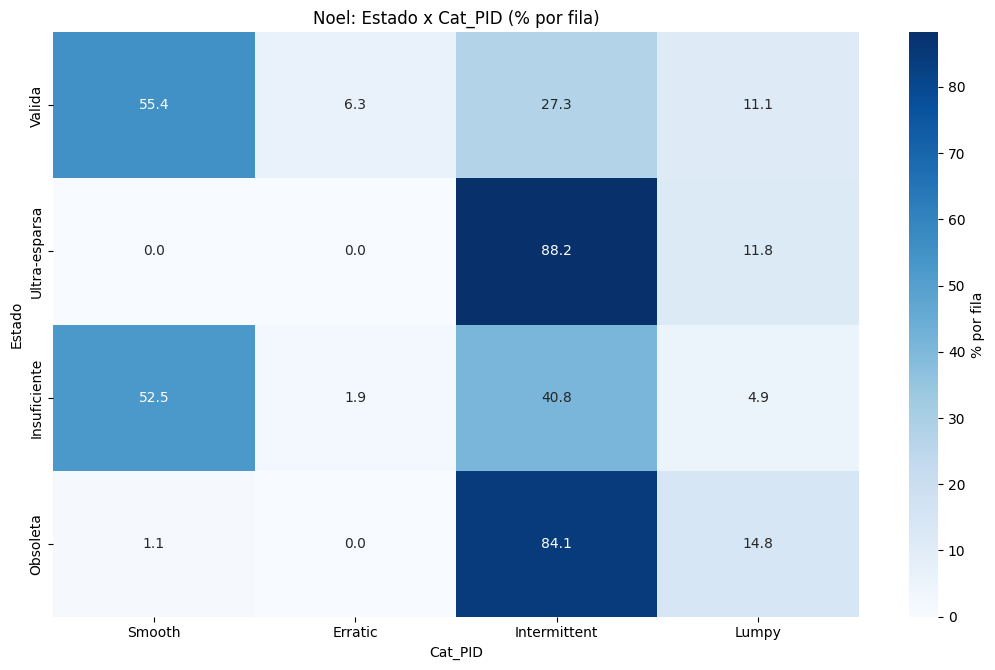

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Almond
=== Almond: Summary (681 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Almond_1000,0.915709,5.943369,0.0,0.0,0.0,0.0,54.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.316924,Intermittent,32.625000,0.316924
1,Almond_1001,1.145594,7.458724,0.0,0.0,0.0,0.0,78.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.324996,Intermittent,32.625000,0.324996
2,Almond_1002,2.616858,17.791494,0.0,0.0,0.0,0.0,198.0,2020-07-06,2025-06-30,261,0.969349,Intermittent,32.625000,0.442040,Intermittent,32.625000,0.442040
3,Almond_1003,1.781609,13.718958,0.0,0.0,0.0,0.0,135.0,2020-07-06,2025-06-30,261,0.973180,Lumpy,37.285714,0.611012,Lumpy,37.285714,0.611012
4,Almond_1005,0.103448,1.671258,0.0,0.0,0.0,0.0,27.0,2020-07-06,2025-06-30,261,0.996169,Intermittent,261.000000,0.000000,Intermittent,261.000000,0.000000
5,Almond_1006,0.019157,0.222781,0.0,0.0,0.0,0.0,3.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.040000,Intermittent,130.500000,0.040000
6,Almond_1007,0.019157,0.222781,0.0,0.0,0.0,0.0,3.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.040000,Intermittent,130.500000,0.040000
7,Almond_1008,0.049808,0.582938,0.0,0.0,0.0,0.0,8.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.053254,Intermittent,130.500000,0.053254
8,Almond_1009,0.252874,2.967329,0.0,0.0,0.0,0.0,41.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.058770,Intermittent,130.500000,0.058770
9,Almond_1010,0.099617,1.149264,0.0,0.0,0.0,0.0,15.0,2020-07-06,2025-06-30,261,0.992337,Intermittent,130.500000,0.023669,Intermittent,130.500000,0.023669



[Almond] Estado x Cat_PID — Conteos


Cat_PID,Intermittent,Lumpy
Estado,,
Obsoleta,417,264



[Almond] % por fila (dado Estado)


Cat_PID,Intermittent,Lumpy
Estado,,
Obsoleta,61.23,38.77



[Almond] % por columna (dada Categoría)


Cat_PID,Intermittent,Lumpy
Estado,,
Obsoleta,100.0,100.0



[Almond] % sobre el total


Cat_PID,Intermittent,Lumpy
Estado,,
Obsoleta,61.23,38.77


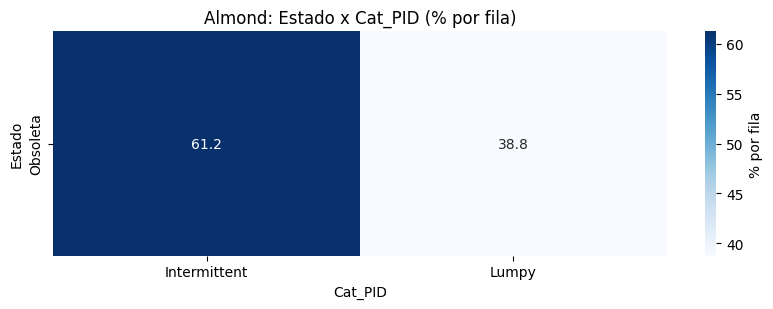

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Amc
=== Amc: Summary (3592 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,AMC_1,14545.180328,38450.845507,0.0,0.0,0.0,0.0,153696.0,2020-07-01,2025-07-01,61,0.852459,Intermittent,6.777778,0.161704,Intermittent,6.777778,0.161704
1,AMC_10,410.229508,1908.256939,0.0,0.0,0.0,0.0,11336.0,2020-07-01,2025-07-01,61,0.950820,Intermittent,20.333333,0.095906,Intermittent,20.333333,0.095906
2,AMC_100,2911.672131,1412.860983,0.0,1872.0,2808.0,3744.0,7488.0,2020-07-01,2025-07-01,61,0.032787,Smooth,1.033898,0.191218,Smooth,1.033898,0.191218
3,AMC_1000,1780.983607,6935.495585,0.0,0.0,0.0,0.0,36960.0,2020-07-01,2025-07-01,61,0.918033,Intermittent,12.200000,0.304602,Intermittent,12.200000,0.304602
4,AMC_1004,766.327869,1919.924414,0.0,0.0,0.0,0.0,11664.0,2020-07-01,2025-07-01,61,0.754098,Lumpy,4.066667,0.764077,Lumpy,4.066667,0.764077
5,AMC_1005,48771.540984,61824.196851,0.0,0.0,28272.0,77496.0,303280.0,2020-07-01,2025-07-01,61,0.491803,Intermittent,1.967742,0.311422,Intermittent,1.967742,0.311422
6,AMC_1006,137.704918,1075.509791,0.0,0.0,0.0,0.0,8400.0,2020-07-01,2025-07-01,61,0.983607,Intermittent,61.000000,0.000000,Intermittent,61.000000,0.000000
7,AMC_1008,6954.098361,15004.005840,0.0,0.0,0.0,0.0,61600.0,2020-07-01,2025-07-01,61,0.770492,Intermittent,4.357143,0.280386,Intermittent,4.357143,0.280386
8,AMC_1009,18067.081967,23721.279801,0.0,0.0,0.0,32340.0,85800.0,2020-07-01,2025-07-01,61,0.508197,Intermittent,2.033333,0.325701,Intermittent,2.033333,0.325701
9,AMC_101,972.721311,1599.742897,0.0,0.0,0.0,2280.0,5184.0,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.380146,Intermittent,2.652174,0.380146



[Amc] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,448,36,1068,161
Ultra-esparsa,0,0,114,19
One-Off,0,0,73,0
Obsoleta,19,3,1471,180



[Amc] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,26.15,2.10,62.35,9.40
Ultra-esparsa,0.00,0.00,85.71,14.29
One-Off,0.00,0.00,100.00,0.00
Obsoleta,1.14,0.18,87.93,10.76



[Amc] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,95.93,92.31,39.18,44.72
Ultra-esparsa,0.00,0.00,4.18,5.28
One-Off,0.00,0.00,2.68,0.00
Obsoleta,4.07,7.69,53.96,50.00



[Amc] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,12.47,1.00,29.73,4.48
Ultra-esparsa,0.00,0.00,3.17,0.53
One-Off,0.00,0.00,2.03,0.00
Obsoleta,0.53,0.08,40.95,5.01


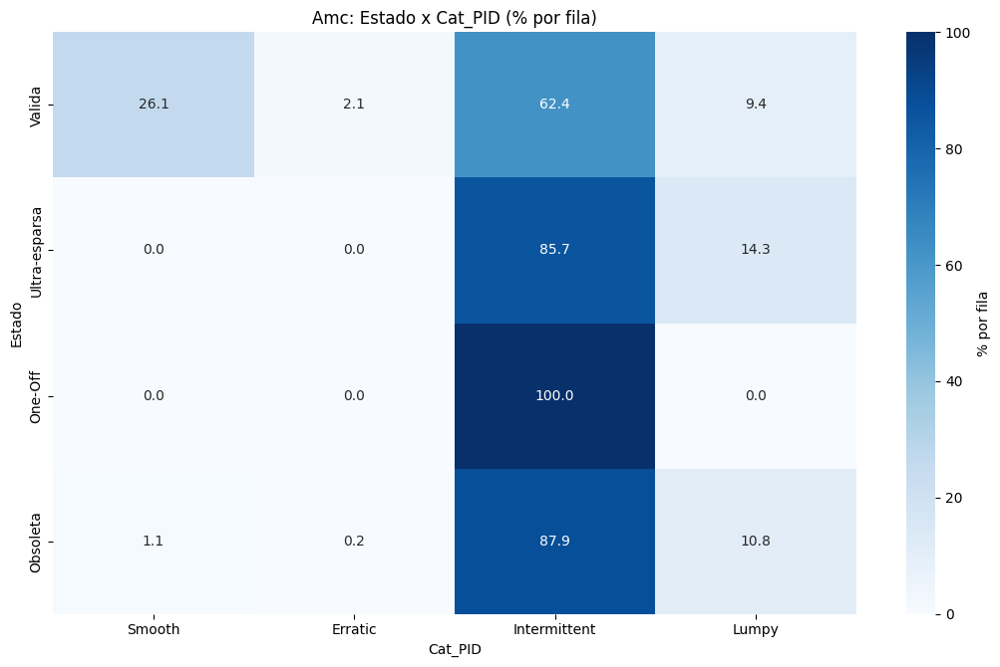

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Amrest
=== Amrest: Summary (2526 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Amrest_10,44.418182,68.520527,0.0,0.0,15.0,61.50,301.0,2021-01-01,2025-07-01,55,0.472727,Lumpy,1.896552,0.759203,Lumpy,1.896552,0.759203
1,Amrest_100,121.678182,35.265489,56.0,98.0,114.0,146.00,229.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.082472,Smooth,1.000000,0.082472
2,Amrest_1000,1.333333,6.605783,0.0,0.0,0.0,0.00,40.0,2021-11-01,2025-07-01,45,0.955556,Intermittent,22.500000,0.111111,Intermittent,22.500000,0.111111
3,Amrest_1001,2.666667,10.954451,0.0,0.0,0.0,0.00,60.0,2021-11-01,2025-07-01,45,0.933333,Intermittent,15.000000,0.166667,Intermittent,15.000000,0.166667
4,Amrest_1002,14.945455,11.579705,0.0,7.5,15.0,20.00,57.0,2021-01-01,2025-07-01,55,0.218182,Smooth,1.279070,0.242619,Smooth,1.279070,0.242619
5,Amrest_1003,0.434783,2.948839,0.0,0.0,0.0,0.00,20.0,2021-10-01,2025-07-01,46,0.978261,Intermittent,46.000000,0.000000,Intermittent,46.000000,0.000000
6,Amrest_1004,0.452830,2.308563,0.0,0.0,0.0,0.00,12.0,2021-03-01,2025-07-01,53,0.962264,Intermittent,26.500000,0.000000,Intermittent,26.500000,0.000000
7,Amrest_1005,14.711538,34.940474,0.0,0.0,0.0,10.25,190.0,2021-04-01,2025-07-01,52,0.538462,Lumpy,2.166667,2.014922,Lumpy,2.166667,2.014922
8,Amrest_1006,9.133333,22.411036,0.0,0.0,1.0,6.00,119.0,2021-11-01,2025-07-01,45,0.466667,Lumpy,1.875000,2.673149,Lumpy,1.875000,2.673149
9,Amrest_1007,0.434783,2.948839,0.0,0.0,0.0,0.00,20.0,2021-10-01,2025-07-01,46,0.978261,Intermittent,46.000000,0.000000,Intermittent,46.000000,0.000000



[Amrest] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,427,57,67,62
Ultra-esparsa,0,0,6,2
Insuficiente,44,15,27,3
Obsoleta,71,18,1265,462



[Amrest] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,69.66,9.30,10.93,10.11
Ultra-esparsa,0.00,0.00,75.00,25.00
Insuficiente,49.44,16.85,30.34,3.37
Obsoleta,3.91,0.99,69.66,25.44



[Amrest] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,78.78,63.33,4.91,11.72
Ultra-esparsa,0.00,0.00,0.44,0.38
Insuficiente,8.12,16.67,1.98,0.57
Obsoleta,13.10,20.00,92.67,87.33



[Amrest] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,16.90,2.26,2.65,2.45
Ultra-esparsa,0.00,0.00,0.24,0.08
Insuficiente,1.74,0.59,1.07,0.12
Obsoleta,2.81,0.71,50.08,18.29


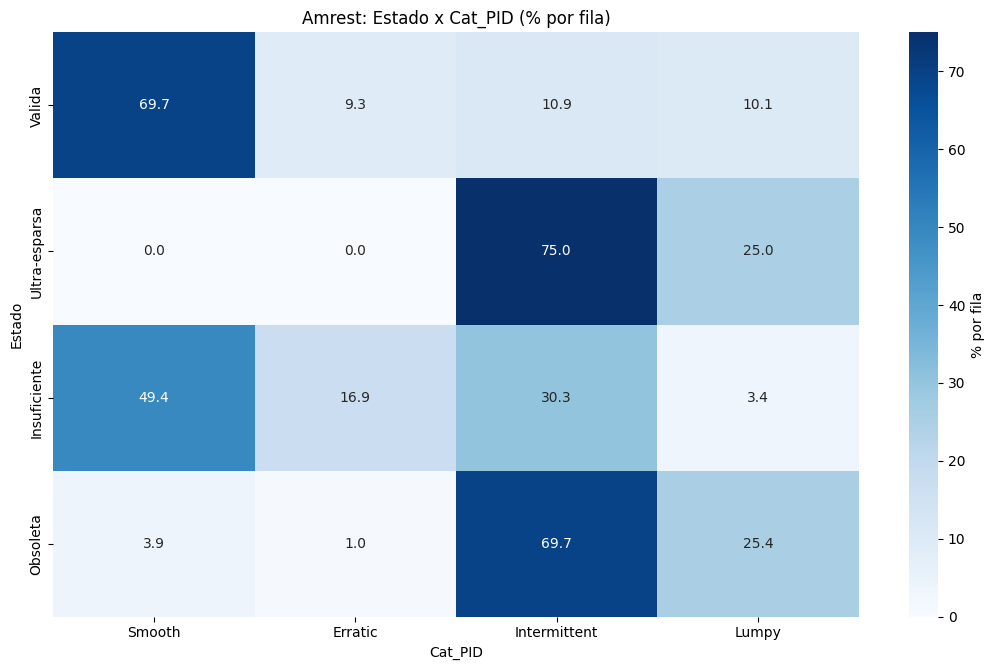

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Calvo
=== Calvo: Summary (2430 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Calvo_10797,144.666667,200.751920,0.000,0.0000,0.000,246.5000,540.000,2024-08-01,2025-07-01,12,0.583333,Intermittent,2.400000,0.152167,Intermittent,2.400000,0.152167
1,Calvo_1080,2593.885246,4969.458334,0.000,0.0000,0.000,2225.0000,18793.000,2020-07-01,2025-07-01,61,0.606557,Lumpy,2.541667,0.813871,Lumpy,2.541667,0.813871
2,Calvo_10826,85.500000,100.109486,0.000,0.0000,39.000,156.0000,258.000,2024-08-01,2025-07-01,12,0.500000,Intermittent,2.000000,0.128347,Intermittent,2.000000,0.128347
3,Calvo_10829,60.083333,111.567720,0.000,0.0000,0.000,75.2500,360.000,2024-08-01,2025-07-01,12,0.666667,Intermittent,3.000000,0.386893,Intermittent,3.000000,0.386893
4,Calvo_10857,41.272727,136.886150,0.000,0.0000,0.000,0.0000,454.000,2024-09-01,2025-07-01,11,0.909091,Intermittent,11.000000,0.000000,Intermittent,11.000000,0.000000
5,Calvo_10858,91.070909,71.831293,25.250,41.7715,73.083,103.0845,268.075,2024-09-01,2025-07-01,11,0.000000,Erratic,1.000000,0.565556,Erratic,1.000000,0.565556
6,Calvo_10861,241.454545,145.473272,0.000,140.0000,260.000,364.0000,404.000,2024-09-01,2025-07-01,11,0.090909,Smooth,1.100000,0.209083,Smooth,1.100000,0.209083
7,Calvo_10864,126.000000,160.847754,0.000,0.0000,84.000,210.0000,336.000,2025-04-01,2025-07-01,4,0.500000,Intermittent,2.000000,0.111111,Intermittent,2.000000,0.111111
8,Calvo_10866,443.000000,189.267007,217.000,300.0000,438.000,600.0000,660.000,2025-03-01,2025-07-01,5,0.000000,Smooth,1.000000,0.146027,Smooth,1.000000,0.146027
9,Calvo_10876,105.238727,81.882914,6.167,57.2300,78.874,118.1870,256.957,2024-09-01,2025-07-01,11,0.000000,Erratic,1.000000,0.550355,Erratic,1.000000,0.550355



[Calvo] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,311,243,135,228
Ultra-esparsa,0,0,7,7
One-Off,0,0,2,0
Insuficiente,152,95,166,81
Obsoleta,2,2,563,436



[Calvo] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,33.91,26.50,14.72,24.86
Ultra-esparsa,0.00,0.00,50.00,50.00
One-Off,0.00,0.00,100.00,0.00
Insuficiente,30.77,19.23,33.60,16.40
Obsoleta,0.20,0.20,56.13,43.47



[Calvo] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,66.88,71.47,15.46,30.32
Ultra-esparsa,0.00,0.00,0.80,0.93
One-Off,0.00,0.00,0.23,0.00
Insuficiente,32.69,27.94,19.01,10.77
Obsoleta,0.43,0.59,64.49,57.98



[Calvo] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,12.80,10.00,5.56,9.38
Ultra-esparsa,0.00,0.00,0.29,0.29
One-Off,0.00,0.00,0.08,0.00
Insuficiente,6.26,3.91,6.83,3.33
Obsoleta,0.08,0.08,23.17,17.94


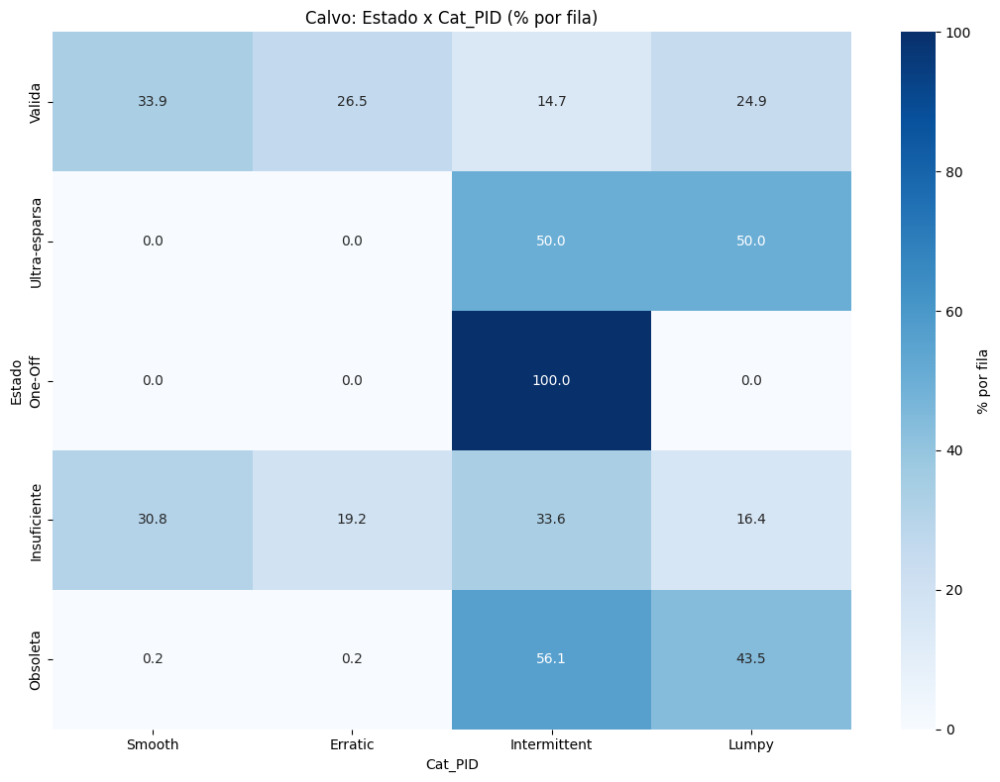

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Chovi
=== Chovi: Summary (561 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Chovi_1,215.754098,515.601806,0.0,0.00,0.0,0.00,2259.0,2020-07-01,2025-07-01,61,0.836066,Intermittent,6.100000,0.084813,Intermittent,6.100000,0.084813
1,Chovi_10,670.885246,952.977529,0.0,0.00,0.0,1819.00,2940.0,2020-07-01,2025-07-01,61,0.655738,Intermittent,2.904762,0.027512,Intermittent,2.904762,0.027512
2,Chovi_100,269.868852,170.600066,0.0,160.00,291.0,341.00,839.0,2020-07-01,2025-07-01,61,0.098361,Smooth,1.109091,0.256050,Smooth,1.109091,0.256050
3,Chovi_1000,4103.357143,990.912943,1315.0,3469.00,4192.5,4960.50,5366.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.056234,Smooth,1.000000,0.056234
4,Chovi_1001,1146.535714,976.077201,39.0,567.75,694.0,1543.00,4561.0,2023-04-01,2025-07-01,28,0.000000,Erratic,1.000000,0.698874,Erratic,1.000000,0.698874
5,Chovi_1002,1858.428571,563.682432,926.0,1463.75,1835.0,2232.50,3029.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.088712,Smooth,1.000000,0.088712
6,Chovi_1003,717.714286,275.018768,3.0,594.75,689.5,938.75,1171.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.141588,Smooth,1.000000,0.141588
7,Chovi_1004,3696.571429,768.234022,1884.0,3234.00,3630.0,4313.25,5142.0,2023-04-01,2025-07-01,28,0.000000,Smooth,1.000000,0.041648,Smooth,1.000000,0.041648
8,Chovi_1005,41.035714,85.563700,0.0,0.00,0.0,10.00,357.0,2023-04-01,2025-07-01,28,0.714286,Intermittent,3.500000,0.483538,Intermittent,3.500000,0.483538
9,Chovi_1008,273.148148,635.303059,0.0,0.00,0.0,306.00,3057.0,2023-05-01,2025-07-01,27,0.666667,Lumpy,3.000000,1.069749,Lumpy,3.000000,1.069749



[Chovi] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,111,15,15,13
Insuficiente,53,16,57,17
Obsoleta,2,0,196,66



[Chovi] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,72.08,9.74,9.74,8.44
Insuficiente,37.06,11.19,39.86,11.89
Obsoleta,0.76,0.00,74.24,25.00



[Chovi] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,66.87,48.39,5.60,13.54
Insuficiente,31.93,51.61,21.27,17.71
Obsoleta,1.20,0.00,73.13,68.75



[Chovi] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,19.79,2.67,2.67,2.32
Insuficiente,9.45,2.85,10.16,3.03
Obsoleta,0.36,0.00,34.94,11.76


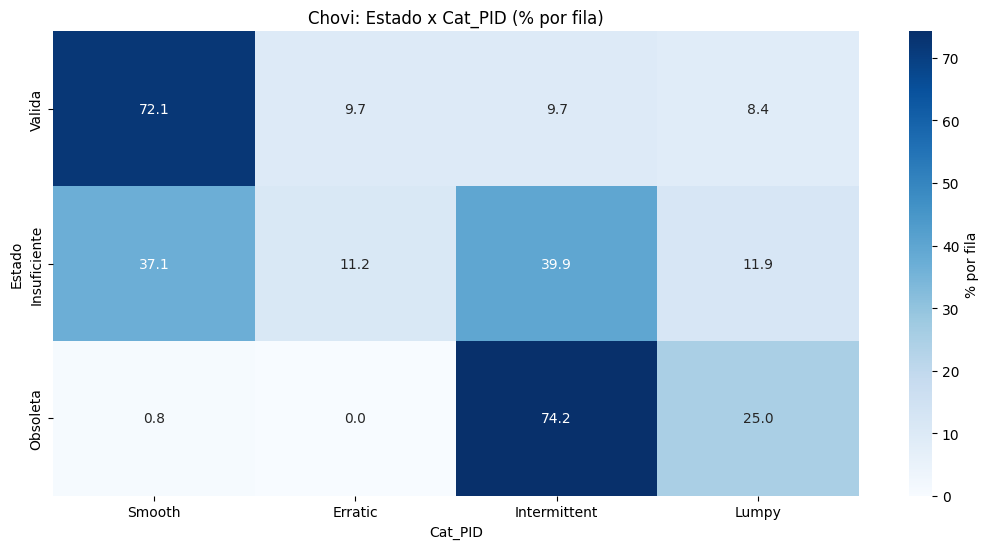

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Cuatrogasa
=== Cuatrogasa: Summary (1308 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,CuatroGasa_1,42.857143,48.818515,0.00,0.00,22.0,80.00,180.0,2022-02-01,2025-07-01,42,0.404762,Intermittent,1.680000,0.349198,Intermittent,1.680000,0.349198
1,CuatroGasa_100,2619.370909,617.863785,1497.11,2229.75,2611.0,2837.25,4664.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.054376,Smooth,1.000000,0.054376
2,CuatroGasa_101,442.863636,160.182395,151.00,333.25,417.5,525.75,864.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.127851,Smooth,1.000000,0.127851
3,CuatroGasa_1014,1.391304,6.672461,0.00,0.00,0.0,0.00,32.0,2023-09-01,2025-07-01,23,0.956522,Intermittent,23.000000,0.000000,Intermittent,23.000000,0.000000
4,CuatroGasa_102,286.250000,178.716890,32.00,151.50,222.5,373.75,779.0,2021-12-01,2025-07-01,44,0.000000,Smooth,1.000000,0.380939,Smooth,1.000000,0.380939
5,CuatroGasa_1020,0.476190,3.086067,0.00,0.00,0.0,0.00,20.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.000000,0.000000,Intermittent,42.000000,0.000000
6,CuatroGasa_103,8.352941,36.633221,0.00,0.00,0.0,0.00,199.0,2022-10-01,2025-07-01,34,0.911765,Lumpy,11.333333,0.735444,Lumpy,11.333333,0.735444
7,CuatroGasa_1039,32.297297,63.613793,0.00,0.00,0.0,0.00,192.0,2022-07-01,2025-07-01,37,0.756757,Intermittent,4.111111,0.161389,Intermittent,4.111111,0.161389
8,CuatroGasa_104,18.750000,79.328908,0.00,0.00,0.0,0.00,500.0,2021-12-01,2025-07-01,44,0.840909,Lumpy,6.285714,1.942144,Lumpy,6.285714,1.942144
9,CuatroGasa_1064,1.116279,7.319931,0.00,0.00,0.0,0.00,48.0,2022-01-01,2025-07-01,43,0.976744,Intermittent,43.000000,0.000000,Intermittent,43.000000,0.000000



[Cuatrogasa] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,455,98,167,58
Ultra-esparsa,0,0,16,1
Insuficiente,86,31,82,7
Obsoleta,0,0,261,46



[Cuatrogasa] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,58.48,12.60,21.47,7.46
Ultra-esparsa,0.00,0.00,94.12,5.88
Insuficiente,41.75,15.05,39.81,3.40
Obsoleta,0.00,0.00,85.02,14.98



[Cuatrogasa] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,84.1,75.97,31.75,51.79
Ultra-esparsa,0.0,0.00,3.04,0.89
Insuficiente,15.9,24.03,15.59,6.25
Obsoleta,0.0,0.00,49.62,41.07



[Cuatrogasa] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,34.79,7.49,12.77,4.43
Ultra-esparsa,0.00,0.00,1.22,0.08
Insuficiente,6.57,2.37,6.27,0.54
Obsoleta,0.00,0.00,19.95,3.52


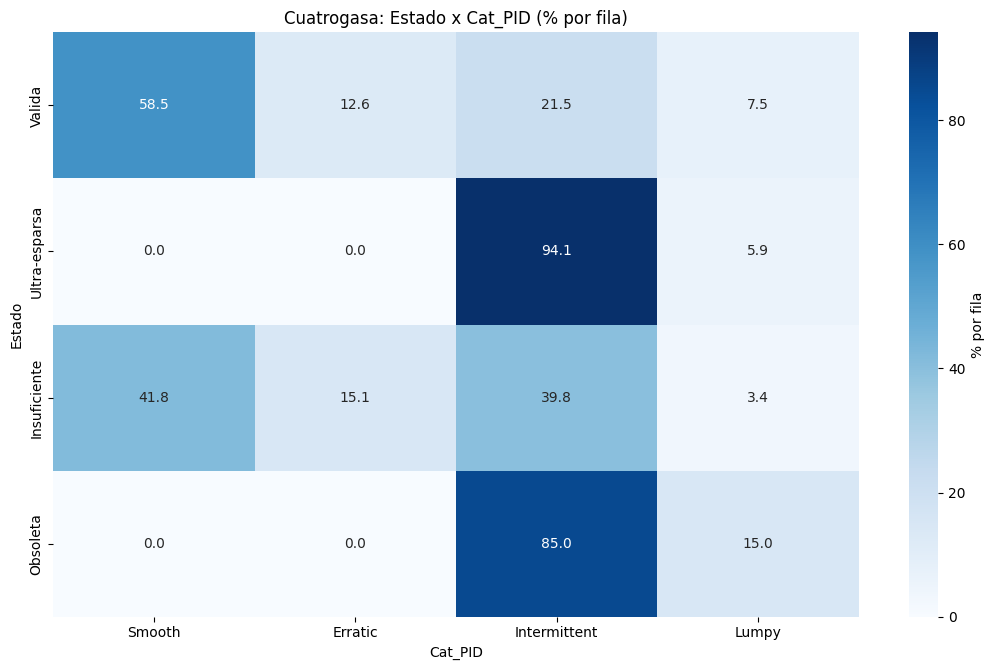

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Damel
=== Damel: Summary (2579 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Damel_3535,3216.181818,5241.885663,0.0,0.0,570.0,5227.5,24150.0,2021-01-01,2025-07-01,55,0.327273,Lumpy,1.486486,1.427270,Lumpy,1.486486,1.427270
1,Damel_3536,76.363636,335.040703,0.0,0.0,0.0,0.0,1980.0,2021-01-01,2025-07-01,55,0.927273,Intermittent,13.750000,0.447245,Intermittent,13.750000,0.447245
2,Damel_3537,81.634615,588.675583,0.0,0.0,0.0,0.0,4245.0,2021-04-01,2025-07-01,52,0.980769,Intermittent,52.000000,0.000000,Intermittent,52.000000,0.000000
3,Damel_3538,11808.381818,7172.575101,1176.0,6564.0,9660.0,16272.0,33648.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.362243,Smooth,1.000000,0.362243
4,Damel_3539,2156.000000,2731.289712,0.0,0.0,1848.0,3696.0,14784.0,2021-08-01,2025-07-01,48,0.437500,Intermittent,1.777778,0.446429,Intermittent,1.777778,0.446429
5,Damel_3540,1049.408163,1247.930669,0.0,180.0,612.0,1188.0,4656.0,2021-07-01,2025-07-01,49,0.061224,Erratic,1.065217,1.239241,Erratic,1.065217,1.239241
6,Damel_3541,3610.250000,4051.889386,0.0,0.0,3696.0,5544.0,16632.0,2021-08-01,2025-07-01,48,0.395833,Intermittent,1.655172,0.349334,Intermittent,1.655172,0.349334
7,Damel_3550,1691.454545,999.299121,336.0,935.0,1581.0,2114.0,4943.0,2021-01-01,2025-07-01,55,0.000000,Smooth,1.000000,0.342690,Smooth,1.000000,0.342690
8,Damel_3552,2672.301887,6432.020276,0.0,0.0,0.0,4224.0,36960.0,2021-03-01,2025-07-01,53,0.735849,Lumpy,3.785714,0.765575,Lumpy,3.785714,0.765575
9,Damel_3554,1812.363636,1587.448411,0.0,1120.0,1120.0,2240.0,6720.0,2021-01-01,2025-07-01,55,0.218182,Smooth,1.279070,0.370723,Smooth,1.279070,0.370723



[Damel] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,310,189,471,181
Ultra-esparsa,0,0,32,3
Insuficiente,192,52,414,31
Obsoleta,2,2,535,165



[Damel] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,26.93,16.42,40.92,15.73
Ultra-esparsa,0.00,0.00,91.43,8.57
Insuficiente,27.87,7.55,60.09,4.50
Obsoleta,0.28,0.28,75.99,23.44



[Damel] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,61.51,77.78,32.44,47.63
Ultra-esparsa,0.00,0.00,2.20,0.79
Insuficiente,38.10,21.40,28.51,8.16
Obsoleta,0.40,0.82,36.85,43.42



[Damel] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,12.02,7.33,18.26,7.02
Ultra-esparsa,0.00,0.00,1.24,0.12
Insuficiente,7.44,2.02,16.05,1.20
Obsoleta,0.08,0.08,20.74,6.40


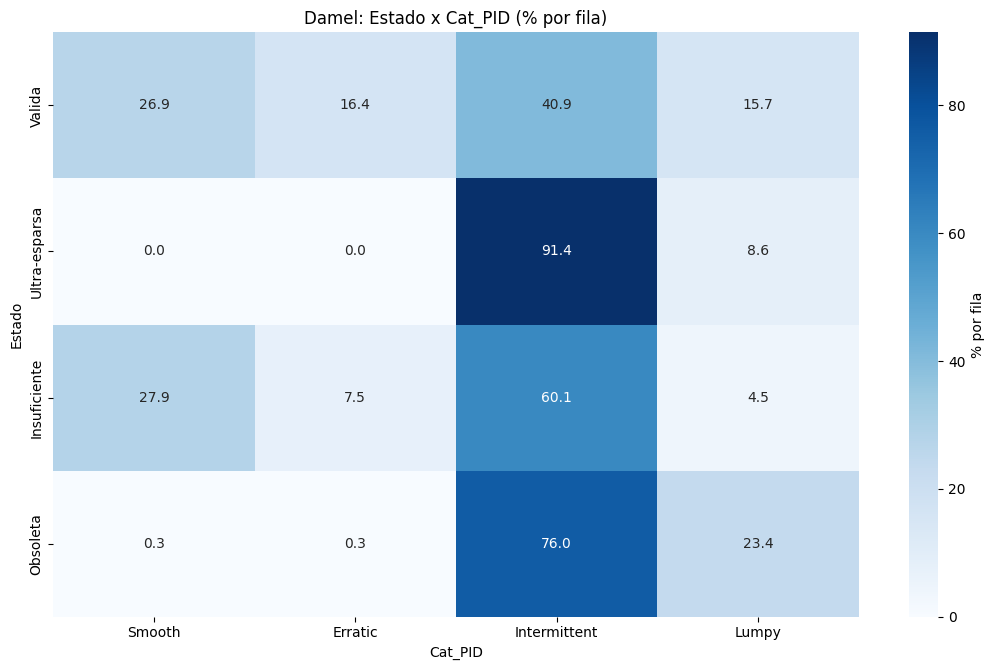

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Fiorucci
=== Fiorucci: Summary (446 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Fiorucci_1,2393.144186,707.810253,1431.800,1933.2000,2160.000,2779.2000,4456.800,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.085443,Smooth,1.000000,0.085443
1,Fiorucci_10,15039.289535,3589.909623,7508.180,13038.0140,14578.870,17507.6990,25124.490,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.055654,Smooth,1.000000,0.055654
2,Fiorucci_100,1880.715302,499.043723,809.528,1592.7740,1944.249,2170.6390,3313.680,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.068772,Smooth,1.000000,0.068772
3,Fiorucci_102,16834.141651,5496.986425,5235.615,11633.3135,17121.625,19880.4535,28422.732,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.104147,Smooth,1.000000,0.104147
4,Fiorucci_103,9059.359512,2253.574589,5563.808,7380.7690,8440.014,10325.9560,14185.006,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.060441,Smooth,1.000000,0.060441
5,Fiorucci_104,7055.913953,2148.616827,3823.406,5183.2475,6916.354,8728.3940,11759.046,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.090572,Smooth,1.000000,0.090572
6,Fiorucci_105,20259.347558,4310.305542,14231.172,16766.2215,18860.466,23463.6485,31184.449,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.044213,Smooth,1.000000,0.044213
7,Fiorucci_106,15568.853116,3456.647949,10078.102,12909.7805,14934.448,17845.9240,23305.892,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.048148,Smooth,1.000000,0.048148
8,Fiorucci_108,9176.625767,5596.680452,1563.084,5236.6600,7549.430,12781.1070,25470.039,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.363309,Smooth,1.000000,0.363309
9,Fiorucci_109,400.091744,677.431775,0.000,205.8945,322.916,408.3675,4551.412,2022-01-01,2025-07-01,43,0.186047,Erratic,1.228571,2.093206,Erratic,1.228571,2.093206



[Fiorucci] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,255,36,12,33
Ultra-esparsa,0,0,4,1
Insuficiente,20,5,15,3
Obsoleta,0,0,40,22



[Fiorucci] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,75.89,10.71,3.57,9.82
Ultra-esparsa,0.00,0.00,80.00,20.00
Insuficiente,46.51,11.63,34.88,6.98
Obsoleta,0.00,0.00,64.52,35.48



[Fiorucci] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,92.73,87.8,16.90,55.93
Ultra-esparsa,0.00,0.0,5.63,1.69
Insuficiente,7.27,12.2,21.13,5.08
Obsoleta,0.00,0.0,56.34,37.29



[Fiorucci] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,57.17,8.07,2.69,7.40
Ultra-esparsa,0.00,0.00,0.90,0.22
Insuficiente,4.48,1.12,3.36,0.67
Obsoleta,0.00,0.00,8.97,4.93


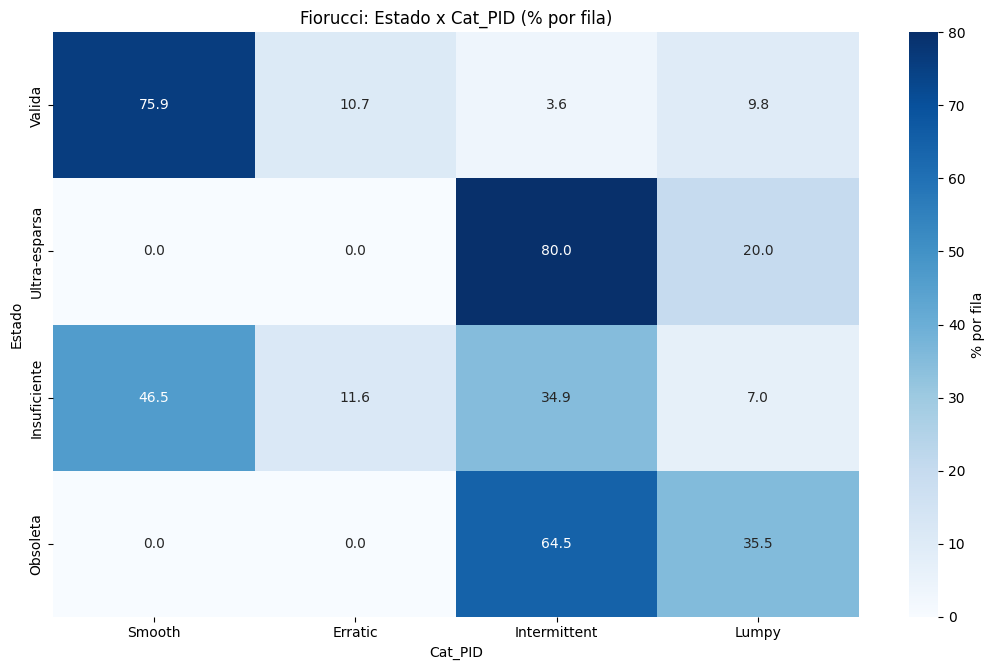

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Frescobaldi
=== Frescobaldi: Summary (3453 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,FrescoBaldi_10000,0.344828,1.856953,0.0,0.0,0.0,0.0,10.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
1,FrescoBaldi_10005,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
2,FrescoBaldi_10009,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
3,FrescoBaldi_10012,0.172414,0.928477,0.0,0.0,0.0,0.0,5.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
4,FrescoBaldi_10015,0.344828,1.856953,0.0,0.0,0.0,0.0,10.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
5,FrescoBaldi_10019,1.724138,9.284767,0.0,0.0,0.0,0.0,50.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
6,FrescoBaldi_10020,1.190476,7.715167,0.0,0.0,0.0,0.0,50.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.0,0.0,Intermittent,42.0,0.0
7,FrescoBaldi_10023,5.172414,27.854301,0.0,0.0,0.0,0.0,150.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0
8,FrescoBaldi_10025,2.380952,15.430335,0.0,0.0,0.0,0.0,100.0,2022-02-01,2025-07-01,42,0.976190,Intermittent,42.0,0.0,Intermittent,42.0,0.0
9,FrescoBaldi_10027,3.448276,18.569534,0.0,0.0,0.0,0.0,100.0,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.0,0.0,Intermittent,29.0,0.0



[Frescobaldi] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,23,47,100,177
Ultra-esparsa,0,0,46,7
Insuficiente,115,88,686,89
Obsoleta,0,0,1685,390



[Frescobaldi] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,6.63,13.54,28.82,51.01
Ultra-esparsa,0.00,0.00,86.79,13.21
Insuficiente,11.76,9.00,70.14,9.10
Obsoleta,0.00,0.00,81.20,18.80



[Frescobaldi] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,16.67,34.81,3.97,26.70
Ultra-esparsa,0.00,0.00,1.83,1.06
Insuficiente,83.33,65.19,27.25,13.42
Obsoleta,0.00,0.00,66.94,58.82



[Frescobaldi] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,0.67,1.36,2.90,5.13
Ultra-esparsa,0.00,0.00,1.33,0.20
Insuficiente,3.33,2.55,19.87,2.58
Obsoleta,0.00,0.00,48.80,11.29


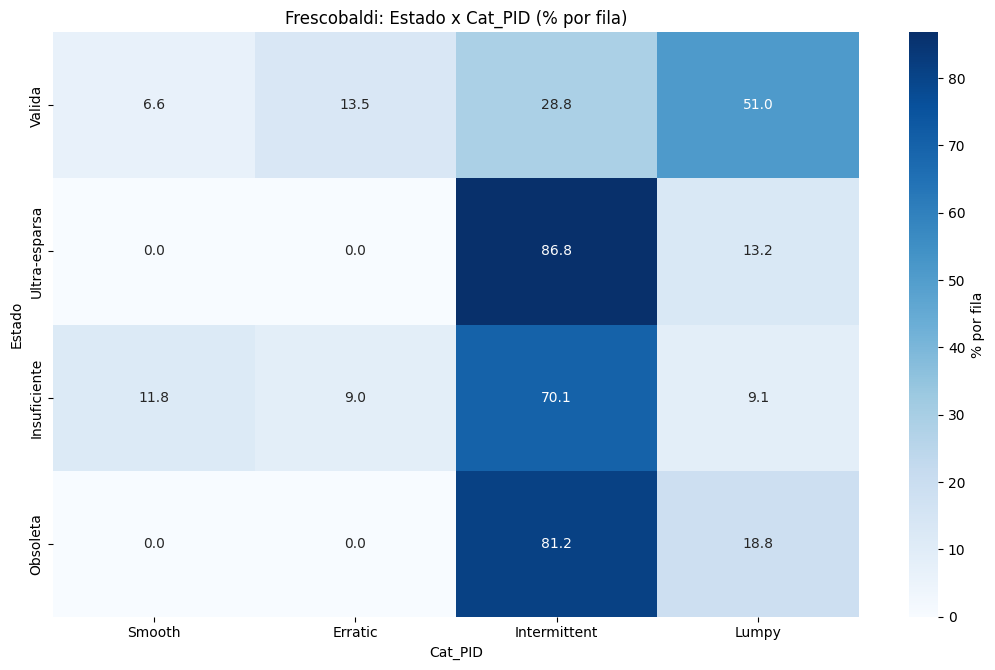

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Frias
=== Frias: Summary (842 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Frias_1,16800.000000,37928.551251,0.0,0.0,0.0,2400.0,105600.0,2024-07-01,2025-07-01,13,0.692308,Lumpy,3.2500,0.755359,Lumpy,3.2500,0.755359
1,Frias_10,12314.222222,6552.112926,0.0,9000.0,12750.0,17250.0,24000.0,2021-02-01,2025-07-01,54,0.111111,Smooth,1.1250,0.135878,Smooth,1.1250,0.135878
2,Frias_100,8538.461538,17297.593207,0.0,0.0,0.0,2250.0,56250.0,2024-07-01,2025-07-01,13,0.615385,Lumpy,2.6000,0.841673,Lumpy,2.6000,0.841673
3,Frias_101,8092.105263,2379.324318,3000.0,6750.0,8250.0,10125.0,12000.0,2024-01-01,2025-07-01,19,0.000000,Smooth,1.0000,0.081904,Smooth,1.0000,0.081904
4,Frias_1010,63000.000000,NaN,63000.0,63000.0,63000.0,63000.0,63000.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
5,Frias_1011,114000.000000,NaN,114000.0,114000.0,114000.0,114000.0,114000.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
6,Frias_1012,86700.000000,NaN,86700.0,86700.0,86700.0,86700.0,86700.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
7,Frias_1013,162600.000000,NaN,162600.0,162600.0,162600.0,162600.0,162600.0,2025-07-01,2025-07-01,1,0.000000,Smooth,1.0000,0.000000,Smooth,1.0000,0.000000
8,Frias_1016,239415.000000,189667.251918,105300.0,172357.5,239415.0,306472.5,373530.0,2025-06-01,2025-07-01,2,0.000000,Smooth,1.0000,0.313799,Smooth,1.0000,0.313799
9,Frias_102,2817.529412,2429.035048,0.0,750.0,3000.0,3750.0,10500.0,2024-03-01,2025-07-01,17,0.058824,Erratic,1.0625,0.599551,Erratic,1.0625,0.599551



[Frias] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,259,17,53,12
Ultra-esparsa,0,0,4,0
Insuficiente,84,21,30,16
Obsoleta,1,0,273,72



[Frias] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,75.95,4.99,15.54,3.52
Ultra-esparsa,0.00,0.00,100.00,0.00
Insuficiente,55.63,13.91,19.87,10.60
Obsoleta,0.29,0.00,78.90,20.81



[Frias] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,75.29,44.74,14.72,12.0
Ultra-esparsa,0.00,0.00,1.11,0.0
Insuficiente,24.42,55.26,8.33,16.0
Obsoleta,0.29,0.00,75.83,72.0



[Frias] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,30.76,2.02,6.29,1.43
Ultra-esparsa,0.00,0.00,0.48,0.00
Insuficiente,9.98,2.49,3.56,1.90
Obsoleta,0.12,0.00,32.42,8.55


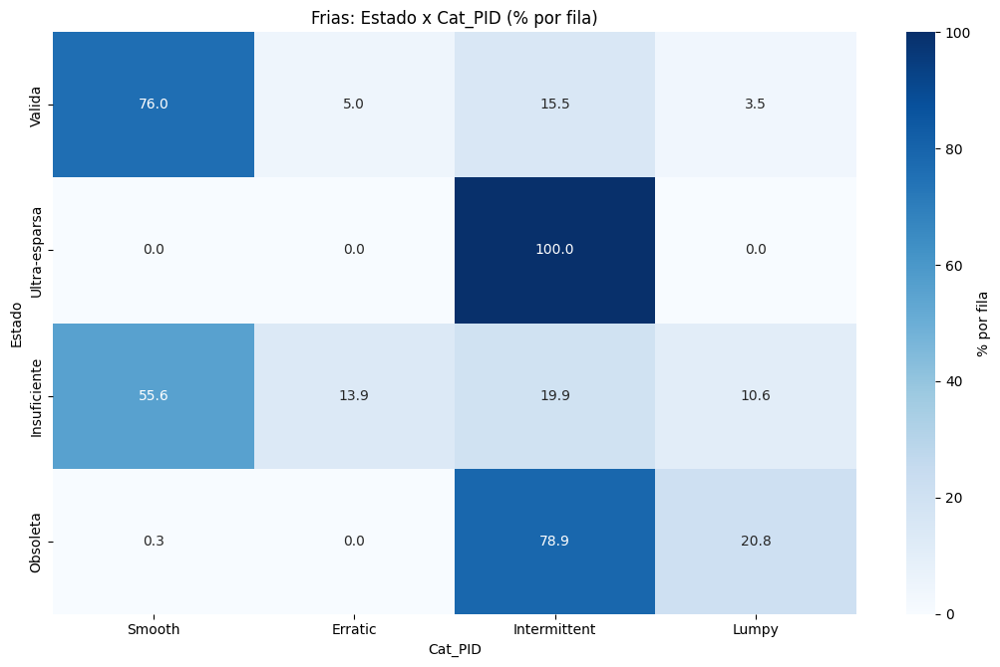

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Grefusa
=== Grefusa: Summary (1317 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Grefusa_10298,3888.372093,11673.499481,0.0,0.0,0.0,0.0,43620.0,2022-01-01,2025-07-01,43,0.883721,Intermittent,8.600000,0.139923,Intermittent,8.600000,0.139923
1,Grefusa_10300,67575.581395,23667.729014,12660.0,49985.0,75410.0,83690.0,120000.0,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.119816,Smooth,1.000000,0.119816
2,Grefusa_10425,6135.000000,17237.524371,0.0,0.0,0.0,720.0,69555.0,2022-01-01,2025-07-01,43,0.674419,Lumpy,3.071429,1.836086,Lumpy,3.071429,1.836086
3,Grefusa_10426,3122.790698,7491.648390,0.0,0.0,0.0,2100.0,31485.0,2022-01-01,2025-07-01,43,0.651163,Lumpy,2.866667,1.309815,Lumpy,2.866667,1.309815
4,Grefusa_10554,95534.418605,32764.562252,66380.0,77830.0,90760.0,98990.0,265960.0,2022-01-01,2025-07-01,43,0.000000,Smooth,1.000000,0.114887,Smooth,1.000000,0.114887
5,Grefusa_10687,3770.883721,10144.463839,0.0,0.0,0.0,0.0,40047.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.125895,Intermittent,7.166667,0.125895
6,Grefusa_10688,10378.395349,27558.246456,0.0,0.0,0.0,0.0,110754.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.100497,Intermittent,7.166667,0.100497
7,Grefusa_10763,7661.720930,10646.226611,0.0,0.0,0.0,19926.0,26964.0,2022-01-01,2025-07-01,43,0.627907,Intermittent,2.687500,0.073825,Intermittent,2.687500,0.073825
8,Grefusa_11017,1113.488372,3429.036991,0.0,0.0,0.0,0.0,14685.0,2022-01-01,2025-07-01,43,0.860465,Intermittent,7.166667,0.432053,Intermittent,7.166667,0.432053
9,Grefusa_11135,18877.023256,27074.621342,0.0,0.0,0.0,47424.0,73008.0,2022-01-01,2025-07-01,43,0.651163,Intermittent,2.866667,0.049746,Intermittent,2.866667,0.049746



[Grefusa] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,163,11,57,26
Ultra-esparsa,0,0,4,3
Insuficiente,120,19,111,27
Obsoleta,0,0,605,171



[Grefusa] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,63.42,4.28,22.18,10.12
Ultra-esparsa,0.00,0.00,57.14,42.86
Insuficiente,43.32,6.86,40.07,9.75
Obsoleta,0.00,0.00,77.96,22.04



[Grefusa] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,57.6,36.67,7.34,11.45
Ultra-esparsa,0.0,0.00,0.51,1.32
Insuficiente,42.4,63.33,14.29,11.89
Obsoleta,0.0,0.00,77.86,75.33



[Grefusa] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,12.38,0.84,4.33,1.97
Ultra-esparsa,0.00,0.00,0.30,0.23
Insuficiente,9.11,1.44,8.43,2.05
Obsoleta,0.00,0.00,45.94,12.98


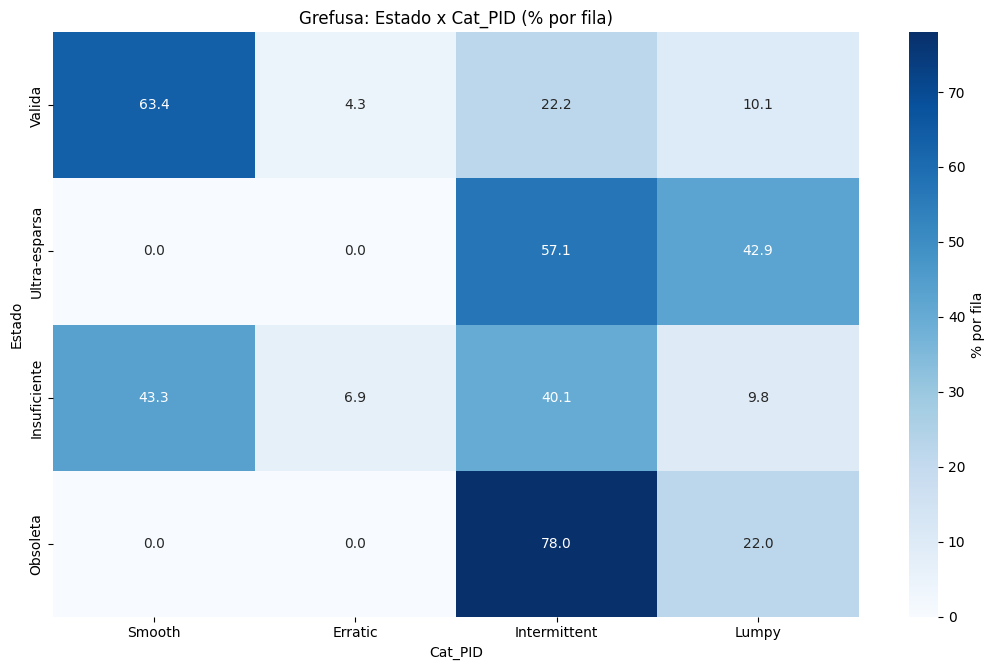

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Lladro
=== Lladro: Summary (5123 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Lladro_1000,12.327869,10.686005,0.0,3.0,10.0,20.0,38.0,2020-07-01,2025-07-01,61,0.081967,Erratic,1.089286,0.596509,Erratic,1.089286,0.596509
1,Lladro_10003,0.089286,0.345190,0.0,0.0,0.0,0.0,2.0,2020-12-01,2025-07-01,56,0.928571,Intermittent,14.000000,0.120000,Intermittent,14.000000,0.120000
2,Lladro_10008,0.022222,0.149071,0.0,0.0,0.0,0.0,1.0,2021-11-01,2025-07-01,45,0.977778,Intermittent,45.000000,0.000000,Intermittent,45.000000,0.000000
3,Lladro_1001,88.409836,46.429293,0.0,63.0,74.0,123.0,226.0,2020-07-01,2025-07-01,61,0.016393,Smooth,1.016667,0.250431,Smooth,1.016667,0.250431
4,Lladro_10012,0.106383,0.729325,0.0,0.0,0.0,0.0,5.0,2021-09-01,2025-07-01,47,0.978723,Intermittent,47.000000,0.000000,Intermittent,47.000000,0.000000
5,Lladro_10013,0.038462,0.196116,0.0,0.0,0.0,0.0,1.0,2023-06-01,2025-07-01,26,0.961538,Intermittent,26.000000,0.000000,Intermittent,26.000000,0.000000
6,Lladro_1002,25.836066,13.455086,0.0,16.0,23.0,34.0,66.0,2020-07-01,2025-07-01,61,0.016393,Smooth,1.016667,0.246006,Smooth,1.016667,0.246006
7,Lladro_1003,9.360656,10.861296,0.0,4.0,8.0,10.0,81.0,2020-07-01,2025-07-01,61,0.049180,Erratic,1.051724,1.209949,Erratic,1.051724,1.209949
8,Lladro_10031,8.163934,20.540351,0.0,1.0,3.0,5.0,125.0,2020-07-01,2025-07-01,61,0.180328,Erratic,1.220000,4.923292,Erratic,1.220000,4.923292
9,Lladro_10032,9.016393,21.815508,0.0,1.0,2.0,8.0,130.0,2020-07-01,2025-07-01,61,0.196721,Erratic,1.244898,4.428714,Erratic,1.244898,4.428714



[Lladro] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,551,404,912,654
Ultra-esparsa,0,0,117,10
One-Off,0,0,8,0
Insuficiente,27,18,196,14
Obsoleta,0,0,1863,349



[Lladro] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,21.86,16.03,36.18,25.94
Ultra-esparsa,0.00,0.00,92.13,7.87
One-Off,0.00,0.00,100.00,0.00
Insuficiente,10.59,7.06,76.86,5.49
Obsoleta,0.00,0.00,84.22,15.78



[Lladro] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,95.33,95.73,29.46,63.68
Ultra-esparsa,0.00,0.00,3.78,0.97
One-Off,0.00,0.00,0.26,0.00
Insuficiente,4.67,4.27,6.33,1.36
Obsoleta,0.00,0.00,60.17,33.98



[Lladro] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,10.76,7.89,17.80,12.77
Ultra-esparsa,0.00,0.00,2.28,0.20
One-Off,0.00,0.00,0.16,0.00
Insuficiente,0.53,0.35,3.83,0.27
Obsoleta,0.00,0.00,36.37,6.81


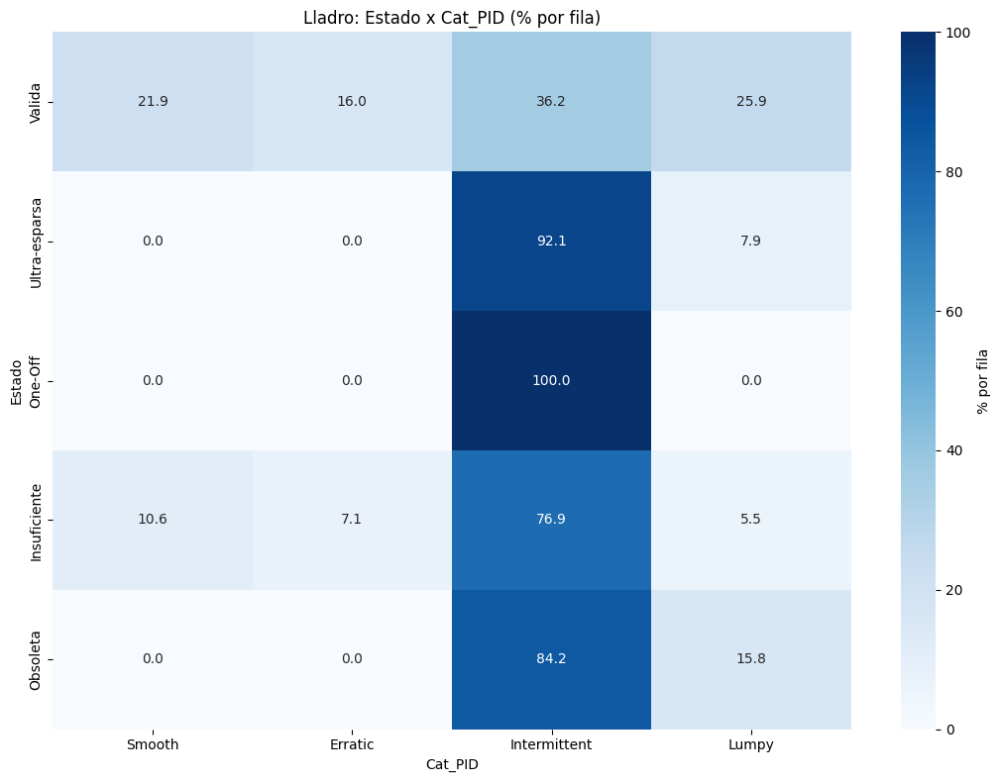

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Noel
=== Noel: Summary (3126 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Noel_1009,800.409836,1092.061237,0.0,0.0,0.0,1260.000000,4095.000000,2020-07-01,2025-07-01,61,0.540984,Intermittent,2.178571,0.299480,Intermittent,2.178571,0.299480
1,Noel_101,139.635629,166.450248,0.0,0.0,0.0,281.182266,486.995074,2020-07-01,2025-07-01,61,0.524590,Intermittent,2.103448,0.139865,Intermittent,2.103448,0.139865
2,Noel_1010,82.622951,151.086638,0.0,0.0,0.0,0.000000,630.000000,2020-07-01,2025-07-01,61,0.754098,Intermittent,4.066667,0.054688,Intermittent,4.066667,0.054688
3,Noel_10114,10.000000,63.245553,0.0,0.0,0.0,0.000000,400.000000,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.000000,0.000000,Intermittent,40.000000,0.000000
4,Noel_1013,20.655738,30.909214,0.0,0.0,0.0,31.500000,94.500000,2020-07-01,2025-07-01,61,0.622951,Intermittent,2.652174,0.207500,Intermittent,2.652174,0.207500
5,Noel_10157,11.378378,69.211974,0.0,0.0,0.0,0.000000,421.000000,2022-07-01,2025-07-01,37,0.972973,Intermittent,37.000000,0.000000,Intermittent,37.000000,0.000000
6,Noel_10175,17.437500,76.976785,0.0,0.0,0.0,0.000000,349.500000,2022-04-01,2025-07-01,40,0.950000,Intermittent,20.000000,0.000005,Intermittent,20.000000,0.000005
7,Noel_10180,0.341463,2.186433,0.0,0.0,0.0,0.000000,14.000000,2022-03-01,2025-07-01,41,0.975610,Intermittent,41.000000,0.000000,Intermittent,41.000000,0.000000
8,Noel_1027,6484.098361,10788.088073,0.0,0.0,0.0,16692.000000,33480.000000,2020-07-01,2025-07-01,61,0.721311,Intermittent,3.588235,0.037494,Intermittent,3.588235,0.037494
9,Noel_1034,180.819672,286.410516,0.0,0.0,0.0,300.000000,1500.000000,2020-07-01,2025-07-01,61,0.524590,Lumpy,2.103448,0.648621,Lumpy,2.103448,0.648621



[Noel] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,566,64,279,113
Ultra-esparsa,0,0,30,4
Insuficiente,224,8,174,21
Obsoleta,18,0,1382,243



[Noel] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,55.38,6.26,27.30,11.06
Ultra-esparsa,0.00,0.00,88.24,11.76
Insuficiente,52.46,1.87,40.75,4.92
Obsoleta,1.10,0.00,84.11,14.79



[Noel] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,70.05,88.89,14.96,29.66
Ultra-esparsa,0.00,0.00,1.61,1.05
Insuficiente,27.72,11.11,9.33,5.51
Obsoleta,2.23,0.00,74.10,63.78



[Noel] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,18.11,2.05,8.93,3.61
Ultra-esparsa,0.00,0.00,0.96,0.13
Insuficiente,7.17,0.26,5.57,0.67
Obsoleta,0.58,0.00,44.21,7.77


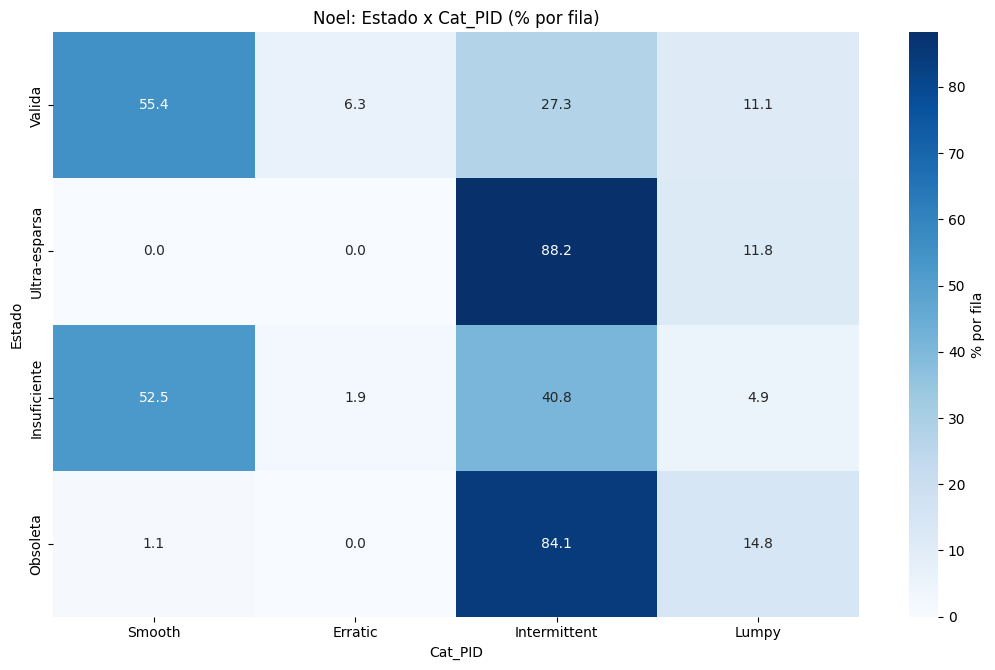

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Pescanova
=== Pescanova: Summary (15809 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Pescanova_1000,8.000000,33.941125,0.0,0.0,0.0,0.0,144.00,2024-02-01,2025-07-01,18,0.944444,Intermittent,18.00,0.000000e+00,Intermittent,18.00,0.000000e+00
1,Pescanova_1001,0.588235,2.425356,0.0,0.0,0.0,0.0,10.00,2024-03-01,2025-07-01,17,0.941176,Intermittent,17.00,0.000000e+00,Intermittent,17.00,0.000000e+00
2,Pescanova_1052,6.480357,23.794016,0.0,0.0,0.0,0.0,90.73,2023-04-01,2025-07-01,28,0.928571,Intermittent,14.00,3.037289e-09,Intermittent,14.00,3.037289e-09
3,Pescanova_1065,4.082250,25.818416,0.0,0.0,0.0,0.0,163.29,2022-04-01,2025-07-01,40,0.975000,Intermittent,40.00,0.000000e+00,Intermittent,40.00,0.000000e+00
4,Pescanova_1071,111.887500,377.849657,0.0,0.0,0.0,0.0,1578.52,2022-08-01,2025-07-01,36,0.888889,Intermittent,9.00,3.430749e-01,Intermittent,9.00,3.430749e-01
5,Pescanova_1092,326.124872,1166.280576,0.0,0.0,0.0,0.0,6513.64,2022-05-01,2025-07-01,39,0.897436,Intermittent,9.75,3.806281e-01,Intermittent,9.75,3.806281e-01
6,Pescanova_1105,18.900000,106.238347,0.0,0.0,0.0,0.0,637.20,2022-08-01,2025-07-01,36,0.944444,Lumpy,18.00,7.621567e-01,Lumpy,18.00,7.621567e-01
7,Pescanova_1114,6.256207,33.690705,0.0,0.0,0.0,0.0,181.43,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.00,0.000000e+00,Intermittent,29.00,0.000000e+00
8,Pescanova_1268,1.251379,6.738884,0.0,0.0,0.0,0.0,36.29,2023-03-01,2025-07-01,29,0.965517,Intermittent,29.00,0.000000e+00,Intermittent,29.00,0.000000e+00
9,Pescanova_1269,6.891892,36.605846,0.0,0.0,0.0,0.0,221.00,2022-07-01,2025-07-01,37,0.945946,Lumpy,18.50,5.377778e-01,Lumpy,18.50,5.377778e-01



[Pescanova] Estado x Cat_PID — Conteos


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,484,490,643,1790
Ultra-esparsa,0,0,86,105
One-Off,0,0,1,0
Insuficiente,511,257,2449,761
Obsoleta,0,0,5615,2617



[Pescanova] % por fila (dado Estado)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,14.21,14.38,18.87,52.54
Ultra-esparsa,0.00,0.00,45.03,54.97
One-Off,0.00,0.00,100.00,0.00
Insuficiente,12.85,6.46,61.56,19.13
Obsoleta,0.00,0.00,68.21,31.79



[Pescanova] % por columna (dada Categoría)


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,48.64,65.6,7.31,33.95
Ultra-esparsa,0.00,0.0,0.98,1.99
One-Off,0.00,0.0,0.01,0.00
Insuficiente,51.36,34.4,27.85,14.43
Obsoleta,0.00,0.0,63.85,49.63



[Pescanova] % sobre el total


Cat_PID,Smooth,Erratic,Intermittent,Lumpy
Estado,,,,
Valida,3.06,3.10,4.07,11.32
Ultra-esparsa,0.00,0.00,0.54,0.66
One-Off,0.00,0.00,0.01,0.00
Insuficiente,3.23,1.63,15.49,4.81
Obsoleta,0.00,0.00,35.52,16.55


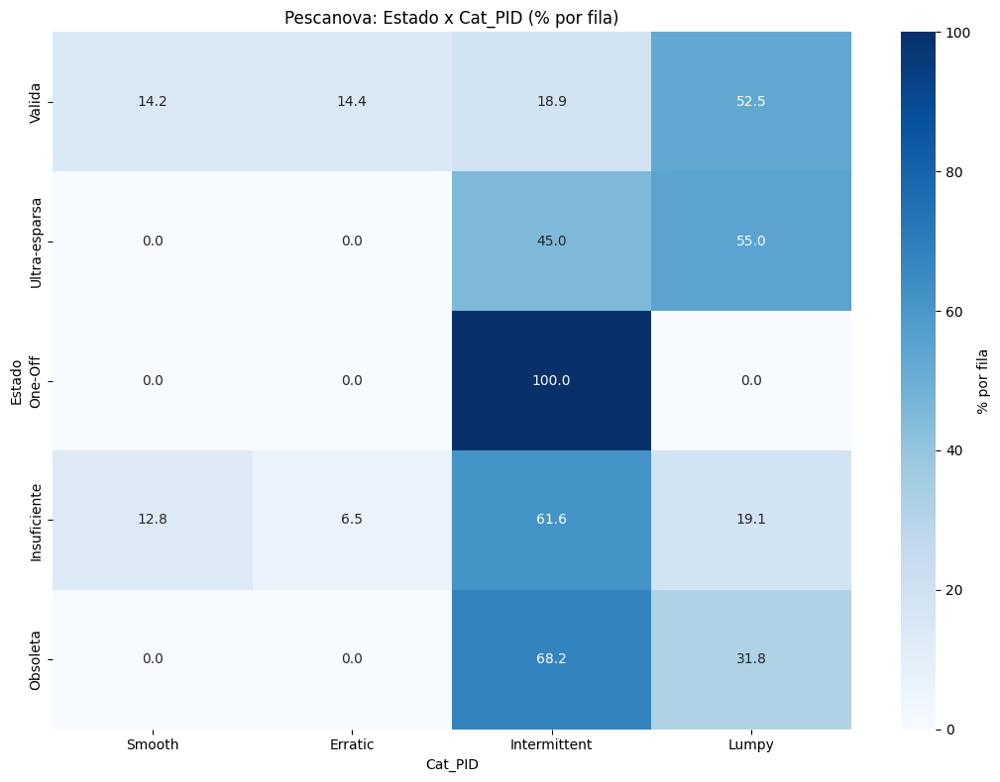

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

▶️ Dataset: Varma
=== Varma: Summary (358 series) ===


,unique_id,mean,std,min,25%,median,75%,max,first_date,last_date,length,pZeros,Cat,ADI,CV2,Cat_PID,ADI_PID,CV2_PID
0,Varma_0102300062,5.548387,10.732625,0.0,0.0,0.0,3.0,30.0,2023-01-01,2025-07-01,31,0.612903,Lumpy,2.583333,0.788805,Lumpy,2.583333,0.788805
1,Varma_0102300068,29.500000,36.561329,0.0,0.0,9.0,52.5,94.0,2024-06-01,2025-07-01,14,0.500000,Intermittent,2.000000,0.213157,Intermittent,2.000000,0.213157
2,Varma_0102300535,16.482759,27.712324,0.0,0.0,0.0,24.0,96.0,2023-03-01,2025-07-01,29,0.586207,Lumpy,2.416667,0.543145,Lumpy,2.416667,0.543145
3,Varma_0102300537,39.000000,62.222475,0.0,0.0,6.0,40.5,180.0,2024-08-01,2025-07-01,12,0.500000,Lumpy,2.000000,0.666667,Lumpy,2.000000,0.666667
4,Varma_0102300548,109.090909,217.690356,0.0,0.0,0.0,60.0,600.0,2024-09-01,2025-07-01,11,0.727273,Intermittent,3.666667,0.260000,Intermittent,3.666667,0.260000
5,Varma_0102300549,1.500000,2.713602,0.0,0.0,0.0,1.5,6.0,2024-08-01,2025-07-01,12,0.750000,Intermittent,4.000000,0.000000,Intermittent,4.000000,0.000000
6,Varma_0102300551,27.333333,59.177699,0.0,0.0,0.0,24.0,180.0,2024-11-01,2025-07-01,9,0.666667,Lumpy,3.000000,0.722189,Lumpy,3.000000,0.722189
7,Varma_0102301216,2.055556,6.637436,0.0,0.0,0.0,0.0,28.0,2024-02-01,2025-07-01,18,0.833333,Lumpy,6.000000,0.807889,Lumpy,6.000000,0.807889
8,Varma_0102390035,0.285714,1.069045,0.0,0.0,0.0,0.0,4.0,2024-06-01,2025-07-01,14,0.928571,Intermittent,14.000000,0.000000,Intermittent,14.000000,0.000000
9,Varma_0103300017,13.230769,26.451698,0.0,0.0,0.0,0.0,76.0,2024-07-01,2025-07-01,13,0.769231,Intermittent,4.333333,0.082207,Intermittent,4.333333,0.082207



[Varma] Estado x Cat_PID — Conteos


Cat_PID,Intermittent,Lumpy
Estado,,
Valida,59,104
Ultra-esparsa,32,16
One-Off,1,0
Insuficiente,67,53
Obsoleta,18,8



[Varma] % por fila (dado Estado)


Cat_PID,Intermittent,Lumpy
Estado,,
Valida,36.20,63.80
Ultra-esparsa,66.67,33.33
One-Off,100.00,0.00
Insuficiente,55.83,44.17
Obsoleta,69.23,30.77



[Varma] % por columna (dada Categoría)


Cat_PID,Intermittent,Lumpy
Estado,,
Valida,33.33,57.46
Ultra-esparsa,18.08,8.84
One-Off,0.56,0.00
Insuficiente,37.85,29.28
Obsoleta,10.17,4.42



[Varma] % sobre el total


Cat_PID,Intermittent,Lumpy
Estado,,
Valida,16.48,29.05
Ultra-esparsa,8.94,4.47
One-Off,0.28,0.00
Insuficiente,18.72,14.80
Obsoleta,5.03,2.23


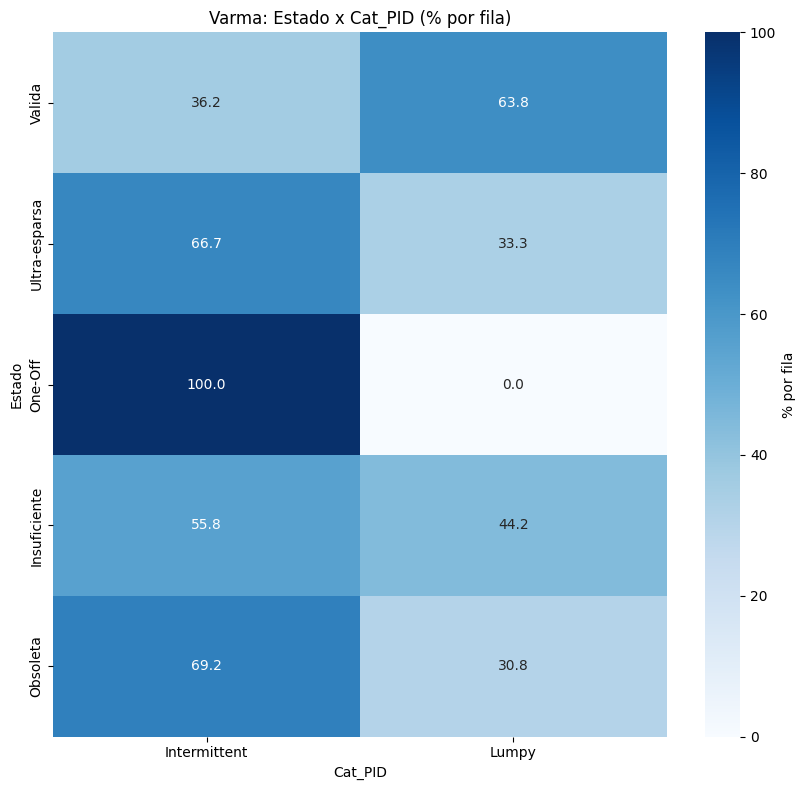

📁 Tablas exportadas en: C:\Projects\MLForecast\scripts\reports_estado_cat

✅ Reporte Estado × Categoría ejecutado para todos los datasets.


In [45]:
# ================== EJEMPLOS DE USO (con dfs_ready) ==================

# 1) Un dataset concreto: Noel
#    Si ya tienes summaries precalculados por dataset, pásalos como 'summaries_all'.
#    Si no, deja summaries_all = None y el runner calculará el summary al vuelo.
summaries_all = None  # o un dict como {'Noel': df_Noel_summary, ...}

summary_Noel, rep_Noel = run_category_status_report_for_dataset(
    "Noel",
    dfs_ready["Noel"][0], # DataFrame listo (capado+relleno+recorte+filtro+prefijo)
    summary_df    = (summaries_all.get("Noel") if summaries_all else None),
    cat_col       = "Cat_PID",
    ensure_estado = True, # añade Estado si falta (con umbrales por dataset)
    save_fig      = True,
    save_csv_dir  = "./reports_estado_cat"
)

# 2) Todos los datasets con dfs_ready
all_reports = run_category_status_report_for_all(
    dfs_ready,                     # dict {name: (df, freq)}
    summaries     = summaries_all, # opcional
    cat_col       = "Cat_PID",
    ensure_estado = True,
    save_fig      = False,
    save_csv_dir  = "./reports_estado_cat"
)

---

ORDEN RECOMENDADO (Dependencias -> Análisis -> Runners)
1. Imports + Utilidades
    - import numpy as np, pandas as pd, matplotlib, seaborn
    - from IPython.display import display
    - pivot_to_wide_plus (de tu bloque previo; debe existir antes)
    - zscore_wide, sample_columns

2. Correlaciones
    - corr_heatmap(...)
    - run_corr_for_dataset(...)
    - run_corr_for_all(...)

3. PCA + KMeans
    - pca_embed(...) (una sola vez)
    - choose_k_by_silhouette(...) (una sola vez)
    - kmeans_on_embedding(...) (una sola vez)
    - plot_embedding_2d(...) (una sola vez)
    - run_pca_kmeans_for_dataset(...) (una sola vez, la versión “completa” con estado_filter y cat_col)
    - run_pca_kmeans_for_all(...)

4. Estacionalidad Mensual
    - month_of_year_profiles(...)
    - cluster_seasonality(...)
    - plot_seasonality_prototypes(...)
    - describe_season_clusters(...)
    - run_seasonality_for_dataset(...)

5. Runner Maestro (Opcional)
    - run_all_multiseries_analysis(...)
    
6. Celdas de uso
    - Llamadas para un dataset concreto (p. ej., Noel).
    - Llamadas "para todos".
    
## CORRELACIONES + HEATMAP CON SEABORN (Pearson / Spearman)

## 1) IMPORTS + UTILIDADES

In [72]:
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# from sklearn.decomposition import PCA
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# # Estandarización por columna (serie) a lo largo del tiempo
# def zscore_wide(wide: pd.DataFrame,
#                 with_mean: bool = True,
#                 with_std:  bool = True,
#                 fillna:    float | None = None) -> pd.DataFrame:
#     """
#     Centra y/o escala cada columna (serie). Útil para comparar formas sin sesgo por escala.
#     """
#     w = wide.astype('float64').copy()
#     if with_mean:
#         w = w.subtract(w.mean(axis=0), axis=1)
#     if with_std:
#         std = w.std(axis=0, ddof=0).replace(0, np.nan)
#         w = w.divide(std, axis=1)
#     if fillna is not None:
#         w = w.fillna(fillna)
#     return w


## 2) CORRELACIÓN (Spearman/Pearson) CON FILTROS

In [73]:
# def corr_heatmap(df_filled: pd.DataFrame,
#                  *,
#                  summary_df:    pd.DataFrame | None = None,
#                  estado_filter: tuple | None = ("Valida",),
#                  ds_col:  str = "ds",
#                  id_col:  str = "unique_id",
#                  y_col:   str = "y",
#                  title:   str = "Dataset",
#                  method:  str = "spearman",
#                  mode:    str = "values",      # 'values' o 'occurrence' (y>0)
#                  sample_n:int = 300,
#                  zscore:  bool = True,
#                  cluster: bool = True,
#                  figsize  = (10,8),
#                  cmap     = "coolwarm"):
#     """
#     1) (opcional) filtra IDs por estado (p.ej., solo 'Valida').
#     2) pivota a matriz wide (fechas x series) y aplica filtros mínimos.
#     3) calcula correlación (en valores o en ocurrencia de venta).
#     4) dibuja heatmap (con clustermap para revelar bloques).
#     """
#     # Filtrado por estado
#     dfx = df_filled.copy()
#     if summary_df is not None and estado_filter is not None:
#         valid_ids = set(summary_df.loc[summary_df["Estado"].isin(estado_filter), id_col])
#         dfx = dfx[dfx[id_col].isin(valid_ids)]

#     # Wide + filtros mínimos (evitar columnas casi vacías)
#     wide = pivot_to_wide_plus(dfx, ds_col=ds_col, id_col=id_col, y_col=y_col, dtype="float32")
#     n_notna = wide.notna().sum()
#     n_pos   = (wide.fillna(0) > 0).sum()
#     keep    = (n_notna >= 12) & (n_pos >= 3)
#     wide    = wide.loc[:, keep]
#     if wide.shape[1] < 3:
#         print(f"[{title}] Muy pocas series tras filtros. Nada que correlacionar.")
#         return None

#     # Submuestreo para legibilidad
#     if wide.shape[1] > sample_n:
#         rng = np.random.default_rng(42)
#         cols = rng.choice(wide.columns.to_numpy(), size=sample_n, replace=False)
#         wide = wide.loc[:, cols]

#     # Modo de correlación
#     if mode == "occurrence":
#         W = (wide.fillna(0) > 0).astype("float32")  # co-ocurrencia venta/no venta
#         zscore_here = False
#         tag = "ocurrencia"
#     else:
#         W = wide.copy()
#         zscore_here = zscore
#         tag = "valores"

#     if zscore_here:
#         W = zscore_wide(W, fillna=0.0)

#     C = W.corr(method=method, min_periods=2)

#     # Visualización
#     if cluster:
#         g = sns.clustermap(C, cmap=cmap, center=0, figsize=figsize, xticklabels=False, yticklabels=False)
#         g.fig.suptitle(f"{title} — correlación ({tag}, {method}), n={W.shape[1]}", y=1.02)
#         plt.show()
#     else:
#         plt.figure(figsize=figsize)
#         sns.heatmap(C, cmap=cmap, center=0, xticklabels=False, yticklabels=False)
#         plt.title(f"{title} — correlación ({tag}, {method}), n={W.shape[1]}")
#         plt.tight_layout(); plt.show()

#     return C


### RUNNER DE CORRELACIÓN

In [74]:
# def run_corr_for_dataset(name: str, df_filled: pd.DataFrame, **kwargs):
#     print(f"\n▶️ Correlaciones — {name}")
#     return corr_heatmap(df_filled, title=name, **kwargs)

# def run_corr_for_all(dfs_filled: dict, **kwargs):
#     outs = {}
#     for name, obj in dfs_filled.items():
#         df_filled = obj[0] if isinstance(obj, (tuple, list)) else obj
#         try:
#             outs[name] = corr_heatmap(df_filled, title=name, **kwargs)
#         except Exception as e:
#             print(f"⚠️ {name}: error en correlaciones — {e}")
#     return outs


## 3) PCA -> ELECCIÓN DE k -> KMeans -> Scatter coloreado

In [75]:
# def pca_embed(wide: pd.DataFrame, n_components=10, random_state=42, plot_evr=True):
#     """
#     PCA sobre series estandarizadas (z-score por columna), salida: embedding PC1..PCn por serie.
#     """
#     Z = zscore_wide(wide, fillna=0.0).T  # (n_series, n_time)
#     pca = PCA(n_components=n_components, random_state=random_state)
#     emb = pca.fit_transform(Z)
#     emb_df = pd.DataFrame(emb, index=wide.columns.astype(str),
#                           columns=[f'PC{i+1}' for i in range(n_components)])
#     if plot_evr:
#         evr = pca.explained_variance_ratio_.cumsum()
#         plt.figure(figsize=(6,3))
#         plt.plot(range(1, n_components+1), evr, marker='o')
#         plt.xlabel('n componentes'); plt.ylabel('var. explicada acumulada')
#         plt.title('PCA — Varianza explicada'); plt.grid(alpha=0.3)
#         plt.tight_layout(); plt.show()
#     return emb_df, pca

# def choose_k_by_silhouette(emb_df: pd.DataFrame, k_list=(3,4,5,6,8,10), random_state=42):
#     """
#     Explora varios k y devuelve la tabla silhouette + el k con mejor puntuación.
#     """
#     X, rows = emb_df.values, []
#     for k in k_list:
#         km = KMeans(n_clusters=k, n_init=10, random_state=random_state)
#         lab = km.fit_predict(X)
#         sil = silhouette_score(X, lab) if len(set(lab)) > 1 else np.nan
#         rows.append((k, sil))
#     dfk = pd.DataFrame(rows, columns=['k','silhouette'])
#     plt.figure(figsize=(5,3))
#     plt.plot(dfk['k'], dfk['silhouette'], marker='o')
#     plt.title('Búsqueda de k (silhouette)'); plt.xlabel('k'); plt.ylabel('silhouette')
#     plt.grid(alpha=0.3); plt.tight_layout(); plt.show()
#     k_best = int(dfk.sort_values('silhouette', ascending=False).iloc[0]['k'])
#     print(f"→ k_best (silhouette): {k_best}")
#     return dfk, k_best

# def kmeans_on_embedding(emb_df: pd.DataFrame, k=8, random_state=42):
#     km = KMeans(n_clusters=k, n_init=10, random_state=random_state)
#     labels = km.fit_predict(emb_df.values)
#     return pd.Series(labels, index=emb_df.index, name='cluster'), km

# def plot_embedding_2d(emb_df: pd.DataFrame, hue: pd.Series | None = None, title='Embedding (PC1–PC2)'):
#     """
#     Dispersión PC1–PC2. Si pasas hue (p.ej., Cat_PID o clusters), colorea y pone leyenda limpia.
#     """
#     dfp = emb_df[['PC1','PC2']].copy()
#     if hue is not None:
#         dfp['hue'] = hue.reindex(emb_df.index).astype(str)
#         ax = sns.scatterplot(data=dfp, x='PC1', y='PC2', hue='hue', s=14, alpha=0.7, linewidth=0)
#         ax.legend(title=hue.name or 'grupo', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
#     else:
#         ax = sns.scatterplot(data=dfp, x='PC1', y='PC2', s=14, alpha=0.7, linewidth=0)
#     ax.set_title(title); ax.grid(alpha=0.3); plt.tight_layout(); plt.show()


### RUNNER PCA/KMeans (1 Dataset)

In [76]:
# def run_pca_kmeans_for_dataset(name: str,
#                                df_filled: pd.DataFrame,
#                                *,
#                                summary_df:   pd.DataFrame | None = None,
#                                estado_filter:tuple | None = ("Valida",),
#                                cat_col:      str = "Cat_PID",
#                                ds_col='ds', id_col='unique_id', y_col='y',
#                                min_notna=24, min_pos=6,
#                                n_components=10, k_list=(4,6,8,10),
#                                force_k: int | None = None,
#                                random_state=42):
#     print(f"\n▶️ PCA/KMeans — {name}")

#     # (a) filtra por estado
#     dfx = df_filled.copy()
#     if summary_df is not None and estado_filter is not None:
#         valid_ids = set(summary_df.loc[summary_df["Estado"].isin(estado_filter), id_col])
#         dfx = dfx[dfx[id_col].isin(valid_ids)]

#     # (b) wide + filtros mínimos
#     wide = pivot_to_wide_plus(dfx, ds_col=ds_col, id_col=id_col, y_col=y_col, dtype="float32")
#     keep = (wide.notna().sum() >= min_notna) & ((wide.fillna(0) > 0).sum() >= min_pos)
#     wide = wide.loc[:, keep]
#     if wide.shape[1] < 3:
#         print("Muy pocas series tras filtros para PCA/KMeans."); return None

#     # (c) PCA
#     emb, _ = pca_embed(wide, n_components=n_components, random_state=random_state, plot_evr=True)

#     # (d) scatter coloreado por clase (si la hay)
#     hue = None
#     if summary_df is not None and cat_col in summary_df.columns:
#         hue = summary_df.set_index(id_col)[cat_col].reindex(emb.index).fillna("Unknown")
#         hue.name = cat_col
#         plot_embedding_2d(emb, hue=hue, title=f"{name} — PCA coloreado por {cat_col}")

#     # (e) elegir k y clusterizar
#     if force_k is None:
#         _, k_best = choose_k_by_silhouette(emb, k_list=k_list, random_state=random_state)
#     else:
#         k_best = int(force_k); print(f"→ k forzado: {k_best}")
#     lab, _ = kmeans_on_embedding(emb, k=k_best, random_state=random_state)
#     plot_embedding_2d(emb, hue=lab.astype(str), title=f"{name} — PCA + KMeans (k={k_best})")

#     # (f) cruce cluster × clase
#     if hue is not None:
#         print(pd.crosstab(lab, hue))

#     return {"embedding": emb, "labels": lab, "k": k_best, "wide_used": wide}


### RUNNER PCA/KMeans (Todos los Datasets)

In [77]:
# def run_pca_kmeans_for_all(dfs_filled: dict,
#                            *,
#                            summaries: dict[str, pd.DataFrame] | None = None,
#                            **kwargs):
#     outs = {}
#     for name, obj in dfs_filled.items():
#         df_filled = obj[0] if isinstance(obj, (tuple, list)) else obj
#         try:
#             outs[name] = run_pca_kmeans_for_dataset(
#                 name, df_filled,
#                 summary_df = None if summaries is None else summaries.get(name),
#                 **kwargs
#             )
#         except Exception as e:
#             print(f"⚠️ {name}: error en PCA/KMeans — {e}")
#     return outs


## 4) (OPCIONAL) CLUSTERING DE ESTACIONALIDAD (12-D) + DESCRIPCIÓN

In [78]:
# def month_of_year_profiles(df_filled, id_col='unique_id', ds_col='ds', y_col='y', norm='mean'):
#     """
#     Perfil mensual por serie (matriz n_series x 12), normalizado por media o suma de la serie.
#     """
#     dfx = df_filled[[id_col, ds_col, y_col]].copy()
#     dfx[ds_col] = pd.to_datetime(dfx[ds_col], errors='coerce')
#     dfx['moy'] = dfx[ds_col].dt.month
#     M = dfx.groupby([id_col, 'moy'])[y_col].mean().unstack('moy').reindex(columns=range(1, 13))
#     if norm == 'mean':
#         M = M.divide(M.mean(axis=1).replace(0, np.nan), axis=0)
#     elif norm == 'sum':
#         M = M.divide(M.sum(axis=1).replace(0, np.nan), axis=0)
#     return M

# def cluster_seasonality(moy_matrix: pd.DataFrame, k=8, random_state=42):
#     km = KMeans(n_clusters=k, n_init=10, random_state=random_state)
#     labels = km.fit_predict(moy_matrix.fillna(0.0).values)
#     return pd.Series(labels, index=moy_matrix.index, name='season_cluster'), km

# def plot_seasonality_prototypes(moy_matrix: pd.DataFrame, labels: pd.Series, title='Prototipos estacionales'):
#     """
#     Prototipos = media por cluster del perfil 12-D. Devuelve el dataframe de prototipos.
#     """
#     prof = (moy_matrix.assign(cluster=labels).groupby('cluster').mean())
#     plt.figure(figsize=(9,5))
#     for c, row in prof.iterrows():
#         plt.plot(range(1, 13), row.values, marker='o', label=f'Cluster {c}')
#     plt.xticks(range(1, 13)); plt.xlabel('Mes'); plt.ylabel('Índice (relativo)')
#     plt.title(title); plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()
#     return prof

# def describe_season_clusters(prototypes: pd.DataFrame) -> pd.DataFrame:
#     """
#     Tabla interpretativa: meses pico (top-2), valores pico y razón pico/media por cluster.
#     """
#     rows = []
#     for cid, row in prototypes.iterrows():
#         order = row.sort_values(ascending=False)
#         top2  = order.head(2)
#         rows.append({
#             "cluster": cid,
#             "peak_months": list(top2.index.astype(int)),
#             "peak_values": [round(v, 2) for v in top2.values],
#             "mean_index": round(float(row.mean()), 2),
#             "peak_vs_mean": round(float(top2.iloc[0] / (row.mean() if row.mean()!=0 else np.nan)), 2)
#         })
#     return pd.DataFrame(rows).sort_values("cluster")

# def run_seasonality_for_dataset(name: str,
#                                 df_filled: pd.DataFrame,
#                                 *,
#                                 summary_df:   pd.DataFrame | None = None,
#                                 estado_filter:tuple | None = ("Valida",),
#                                 cat_col:      str = "Cat_PID",
#                                 k: int = 8,
#                                 norm='mean',
#                                 id_col='unique_id'):
#     print(f"\n▶️ Estacionalidad — {name}")

#     dfx = df_filled.copy()
#     if summary_df is not None and estado_filter is not None:
#         valid_ids = set(summary_df.loc[summary_df["Estado"].isin(estado_filter), id_col])
#         dfx = dfx[dfx[id_col].isin(valid_ids)]

#     M = month_of_year_profiles(dfx, norm=norm)
#     if M.empty:
#         print("Sin datos suficientes para perfiles mensuales."); return None

#     labs, _ = cluster_seasonality(M, k=k)
#     protos  = plot_seasonality_prototypes(M, labs, title=f"{name} — prototipos estacionales (k={k})")

#     if summary_df is not None and cat_col in summary_df.columns:
#         cat_map = summary_df.set_index(id_col)[cat_col].reindex(labs.index)
#         print(pd.crosstab(labs, cat_map))

#     desc = describe_season_clusters(protos)
#     try:
#         from IPython.display import display
#         display(desc)
#     except Exception:
#         print(desc)
#     return {"moy_matrix": M, "labels": labs, "prototypes": protos, "description": desc}


### RUNNER ESTACIONALIDAD (TODOS)

In [79]:
# def run_seasonality_for_all(dfs_filled: dict,
#                             *,
#                             summaries: dict[str, pd.DataFrame] | None = None,
#                             **kwargs):
#     outs = {}
#     for name, obj in dfs_filled.items():
#         df_filled = obj[0] if isinstance(obj, (tuple, list)) else obj
#         try:
#             outs[name] = run_seasonality_for_dataset(
#                 name, df_filled,
#                 summary_df = None if summaries is None else summaries.get(name),
#                 **kwargs
#             )
#         except Exception as e:
#             print(f"⚠️ {name}: error en estacionalidad — {e}")
#     return outs


## 5) BLOQUE DE EJECUCIÓN CONTROLADO POR FLAGS

In [80]:
# RUN_EXAMPLE = True
# RUN_ALL     = False

# # —— ejemplo rápido sobre 1 dataset (p.ej., Noel)
# if RUN_EXAMPLE:
#     _ = run_corr_for_dataset(
#         "Noel", df_Noel_filled,
#         summary_df=df_Noel_summary, estado_filter=("Valida",),
#         method="spearman", mode="values", cluster=True, sample_n=300
#     )

#     _ = run_pca_kmeans_for_dataset(
#         "Noel", df_Noel_filled,
#         summary_df=df_Noel_summary, estado_filter=("Valida",),
#         cat_col="Cat_PID", k_list=(4,6,8,10)  # o force_k=6 si quieres fijarlo
#     )

#     _ = run_seasonality_for_dataset(
#         "Noel", df_Noel_filled,
#         summary_df=df_Noel_summary, estado_filter=("Valida",),
#         cat_col="Cat_PID", k=8
#     )

# # —— ejecución en bloque para todos los datasets cargados en dfs_filled
# if RUN_ALL:
#     _ = run_corr_for_all(
#         dfs_filled,
#         summary_df=None,            # usa solo si tu corr_heatmap lo espera; aquí no es necesario
#         estado_filter=("Valida",),
#         method="spearman", mode="values", cluster=True, sample_n=300
#     )

#     _ = run_pca_kmeans_for_all(
#         dfs_filled,
#         summaries=all_summaries_dict,    # dict: nombre -> summary_df
#         estado_filter=("Valida",),
#         cat_col="Cat_PID",
#         k_list=(4,6,8,10)
#     )

#     _ = run_seasonality_for_all(
#         dfs_filled,
#         summaries=all_summaries_dict,
#         estado_filter=("Valida",),
#         cat_col="Cat_PID",
#         k=8
#     )


Esta fase del EDA 'temporal' tiene sentido en el pipeline ya que:

- **Las Correlaciones (Spearman / Pearson)**: Permiten detectar *familias* de serie con co-movimiento (promos comunes, canales, mercados, etc.) y validar hipótesis de *pooling*. Spearman, al basarse en rangos, aguanta mejor picos y escalas diferentes.

- **PCA + KMeans**: Reduce formas temporales a 2-10 ejes interpretables (tendencia, pico navideño, caída veraniega...) y agrupa series semejantes en dinámica, útil para *templates* de pronóstico, features por clúster y selección de modelos por grupo.

- **Estacionalidad 12-D**: Abstrae la *firma mensual* y destila prototipos (p.ej., "pico Q4", "pico verano", "plano"). Cruces con SB-2005 o Estado ayudan a definir rutas (ITS con patrón estacional ≠ ITS sin patrón).

---


# GENERACIÓN DE SPLITS

Adaptado para trabajar directamente con 'dfs_ready' como fuente única. Incluye:
- Helpers de frecuencia y requisitos.
- Generación de splits por cliente (categoría / categoría + horizonte / resto).
- Generación de splits globales (ALL).
- Preparación automática de summaries con Estado (si falta) a partir de dfs_ready.
- Un runner compacto para ejecutar todo sin tocar si sobrescribir dfs_ready.

Requisitos previos ya definidos:
'characterize_series_unified(...)' y 'clasificar_estado_series(...)'

In [50]:
# ============================================
# SPLITS basados en dfs_ready (canónico)
# ============================================
from typing import Dict, Tuple
import numpy as np
import pandas as pd

# ------------------------------------------------------------------
# 0) Comprobación suave de dependencias (definidas en tu pipeline)
# ------------------------------------------------------------------
for _fn in ("characterize_series_unified", "clasificar_estado_series"):
    if _fn not in globals():
        raise NameError(f"Falta '{_fn}' en el entorno. Cárgala antes de este bloque.")
    
# ==================================
# 1) Helpers de frecuencia/requisitos
# ==================================
def _freq_marker(freq: str | None) -> str:
    """'m' mensual, 'w' semanal. Soporta 'MS','M','W-*'. Por defecto 'm'."""
    """Devuelve 'm' para mensual, 'w' para semanal. Soporta 'MS', 'M', 'W-*'."""
    if not freq:
        return 'm'
    f = str(freq).upper()
    return 'w' if f.startswith('W') else 'm'

def _min_total_required(freq_mark: str, H: int) -> int:
    """
    Longitud mínima TOTAL (hist+H) para elegibilidad de horizonte.
    Devuelve la longitud mínima TOTAL (histórico + horizonte) según reglas:
    Mensual: H=3 -> 15; H=6 -> 24; H=12 -> 36; (otros H -> 4*H por defecto)
    Semanal: total = 3*H
    """
    if freq_mark == 'm':
        if H == 3:   return 15
        if H == 6:   return 24
        if H == 12:  return 36
        return 4 * H          # fallback mensual (conservador)
    else:
        return 3 * H          # semanal: total = 3*H

# Mapa categorías -> Abreviaturas
SB_SIGLAS = [
    ('Intermittent', 'ITS'),
    ('Lumpy',        'LTS'),
    ('Smooth',       'STS'),
    ('Erratic',      'ETS'),
]

# =========================================
# 2) Preparar summaries a partir de dfs_ready
# =========================================
def prepare_summaries_from_dfs_ready(
    dfs_ready: Dict[str, Tuple[pd.DataFrame, str]],
    *,
    cat_col: str = 'Cat_PID',
    id_col:  str = 'unique_id',
    ds_col:  str = 'ds',
    y_col:   str = 'y',
    verbose: bool = True
) -> Dict[str, pd.DataFrame]:
    """
    Devuelve {dataset: summary_con_Estado} calculado sobre cada df de dfs_ready.
    - Si 'Estado' no existe, lo calcula con parámetros coherentes con la frecuencia:
      mensual -> n_obsoleta=12,  min_largo=15
      semanal -> n_obsoleta=52,  min_largo=12
    """
    out = {}
    for name, (dfx, freq) in dfs_ready.items():
        if verbose:
            print(f"▶ {name}: preparando summary (freq={freq})...")
        # 1) Summary (métricas + Cat/Cat_PID)
        summ = characterize_series_unified(dfx, ds_col=ds_col, id_col=id_col, y_col=y_col)
        # 2) Estado (si falta)
        if 'Estado' not in summ.columns:
            fmark = _freq_marker(freq)
            n_obsoleta = 52 if fmark == 'w' else 12
            min_largo  = 12 if fmark == 'w' else 15
            est = clasificar_estado_series(
                dfx, id_col=id_col, ds_col=ds_col, y_col=y_col,
                n_obsoleta=n_obsoleta, min_largo=min_largo, logging=False
            )
            summ = summ.merge(est, on=id_col, how='left')
        # 3) Sanity mínimo
        req = {id_col, 'length', 'Estado', cat_col}
        faltan = req - set(summ.columns)
        if faltan:
            raise KeyError(f"[{name}] Summary incompleto; faltan columnas: {faltan}")
        out[name] = summ
    return out

# =========================================
# 3) Splits por cliente (usa dfs_ready)
# =========================================
def generate_client_splits(
    name:           str,
    df_summary:     pd.DataFrame,
    df_ready:       pd.DataFrame, *,
    freq:           str  = 'MS',
    horizons_m           = (3, 6, 12),
    horizons_w           = (4, 8, 12),
    cat_col:        str  = 'Cat_PID',
    estado_col:     str  = 'Estado',
    id_col:         str  = 'unique_id',
    ds_col:         str  = 'ds',
    y_col:          str  = 'y',
    allowed_states       = ('Valida',),
    inject_globals: bool = False,
    logging:        bool = True
) -> Dict[str, pd.DataFrame]:
    """
    Genera DataFrames por categoría (ITS/LTS/STS/ETS),
    por categoría+horizonte (mH/wH) y el resto (no elegibles a ningún H).
    """
    # Validaciones mínimas
    for c in (id_col, 'length', estado_col, cat_col):
        if c not in df_summary.columns:
            raise KeyError(f"[{name}] df_summary requiere '{c}'")
    for c in (id_col, ds_col, y_col):
        if c not in df_ready.columns:
            raise KeyError(f"[{name}] df_ready requiere '{c}'")

    summ = df_summary.copy()
    dff  = df_ready.copy()
    dff[ds_col] = pd.to_datetime(dff[ds_col], errors='coerce')
    dff[y_col]  = pd.to_numeric(dff[y_col],   errors='coerce')

    fmark = _freq_marker(freq)
    Hs    = horizons_m if fmark == 'm' else horizons_w

    out = {}
    manifest_rows = []

    # Filtra categorías presentes (tras allowed_states)
    cats_presentes = set(summ.loc[summ[estado_col].isin(allowed_states), cat_col].dropna().unique())
    siglas = [(c, a) for (c, a) in SB_SIGLAS if c in cats_presentes]

    for cat, abbr in siglas:
        base_ids = summ.loc[
            (summ[estado_col].isin(allowed_states)) & (summ[cat_col] == cat),
            id_col
        ]

        # (1) Sin horizonte
        name_cat = f"df_{name}_{abbr}"
        df_cat = (dff[dff[id_col].isin(base_ids)]
                  .sort_values([id_col, ds_col])
                  .reset_index(drop=True))
        if len(df_cat) > 0:
            out[name_cat] = df_cat
            if inject_globals: globals()[name_cat] = df_cat
            if logging:
                print(f"✅ {name_cat}: {base_ids.nunique()} series, {len(df_cat)} filas")
            manifest_rows.append({
                'subset': name_cat, 'dataset': name, 'abbr': abbr, 'H': None,
                'n_series': int(base_ids.nunique()), 'n_rows': int(len(df_cat)),
                'start': df_cat[ds_col].min(), 'end': df_cat[ds_col].max(), 'freq': fmark
            })
        else:
            if logging: print(f"- {name_cat}: 0 series (omitido)")

        # (2) Por horizonte
        elig_any = pd.Series(False, index=base_ids.index)
        for H in Hs:
            min_total = _min_total_required(fmark, H)
            valid_ids = summ.loc[
                (summ[id_col].isin(base_ids)) & (pd.to_numeric(summ['length'], errors='coerce') >= min_total),
                id_col
            ].unique()

            suff  = f"{fmark}{H}"
            name_h = f"df_{name}_{abbr}_{suff}"
            df_h = (dff[dff[id_col].isin(valid_ids)]
                    .sort_values([id_col, ds_col])
                    .reset_index(drop=True))
            if len(df_h) > 0:
                out[name_h] = df_h
                if inject_globals: globals()[name_h] = df_h
                if logging:
                    print(f" ↳ {name_h}: {len(np.unique(valid_ids))} series, {len(df_h)} filas (min_total={min_total})")
                manifest_rows.append({
                    'subset':   name_h, 'dataset':  name, 'abbr': abbr, 'H': H,
                    'n_series': int(len(np.unique(valid_ids))), 'n_rows': int(len(df_h)),
                    'start':    df_h[ds_col].min(), 'end': df_h[ds_col].max(), 'freq': fmark
                })
                elig_any |= base_ids.isin(valid_ids)
            else:
                if logging: print(f"   ↳ {name_h}: 0 series (omitido)")

        # (3) Resto
        ids_resto = base_ids[~elig_any]
        name_rest = f"df_{name}_{abbr}_resto"
        df_rest = (dff[dff[id_col].isin(ids_resto)]
                   .sort_values([id_col, ds_col])
                   .reset_index(drop=True))
        if len(df_rest) > 0:
            out[name_rest] = df_rest
            if inject_globals: globals()[name_rest] = df_rest
            if logging:
                print(f"   ↳ {name_rest}: {ids_resto.nunique()} series, {len(df_rest)} filas")
            manifest_rows.append({
                'subset':   name_rest, 'dataset': name, 'abbr': abbr, 'H': None,
                'n_series': int(ids_resto.nunique()), 'n_rows': int(len(df_rest)),
                'start':    df_rest[ds_col].min(), 'end': df_rest[ds_col].max(), 'freq': fmark
            })

    # --- manifest robusto (spoporta caso vacío) ---
    if not manifest_rows:
        manifest = pd.DataFrame(
            columns = ['subset', 'dataset', 'abbr', 'H', 'n_series', 'n_rows', 'start', 'end', 'freq']
        )
        if logging:
            print(f"– {name}: no se generaron splits (0 series elegibles).")
    else:
        manifest = (pd.DataFrame(manifest_rows)
                    .sort_values(['dataset', 'abbr', 'freq', 'H'], na_position = 'first')
                    .reset_index(drop = True))
    return out, manifest

# ===================================================
# 4) Splits GLOBAL (ALL) directamente con dfs_ready
# ===================================================
def build_global_splits_from_ready(
    dfs_ready: Dict[str, Tuple[pd.DataFrame, str]],
    per_client_summ: Dict[str, pd.DataFrame], *,
    id_col='unique_id', ds_col='ds', y_col='y',
    cat_col='Cat_PID', estado_col='Estado',
    allowed_states=('Valida',),
    horizons_m=(3,6,12), horizons_w=(4,8,12),
    inject_globals: bool=False,
    logging: bool=True
):
    """Ensamblado ALL_* a partir de dfs_ready + summaries preparados."""
    def _norm_freq_flag(freq_raw: str | None, ds_name: str) -> str:
        if isinstance(freq_raw, str):
            f = freq_raw.strip().upper()
            if f.startswith('W'): return 'w'
            if f.startswith('M'): return 'm'
        return 'w' if ds_name.lower() == 'almond' else 'm'

    def _min_total_months(H: int) -> int:
        return {3:15, 6:24, 12:36}.get(H, 4*H)

    def _min_total_weeks(H: int) -> int:
        return 3*H

    # Catálogo real presente
    cats_all = set()
    for ds_name, summ in per_client_summ.items():
        need = {id_col, 'length', estado_col, cat_col}
        missing = need - set(summ.columns)
        if missing:
            raise KeyError(f"Faltan {missing} en summary[{ds_name}]")
        cats_all |= set(summ[cat_col].dropna().unique())

    cat_abbr = [(c,a) for (c,a) in SB_SIGLAS if c in cats_all]
    if not cat_abbr:
        raise ValueError("No hay categorías SB presentes en los summaries.")

    outs_all: Dict[str, pd.DataFrame] = {}
    manifest_rows = []

    # A) ALL por categoría (sin horizonte)
    for cat, abbr in cat_abbr:
        frames = []
        for ds_name, (df_trim, freq) in dfs_ready.items():
            summ = per_client_summ.get(ds_name)
            if summ is None: 
                if logging: print(f"⚠️ {ds_name}: sin summary, se omite en ALL_{abbr}.")
                continue
            freq_flag = _norm_freq_flag(freq, ds_name)

            ids = summ.loc[
                (summ[estado_col].isin(allowed_states)) & (summ[cat_col] == cat),
                id_col
            ].dropna().unique()
            if ids.size == 0: 
                continue

            _check = {id_col, ds_col, y_col} - set(df_trim.columns)
            if _check:
                raise KeyError(f"Faltan {_check} en df[{ds_name}]")

            dff = (df_trim[df_trim[id_col].isin(ids)]
                    .copy()
                    .sort_values([id_col, ds_col]))
            if dff.empty: 
                continue

            dff['dataset']   = ds_name
            dff['freq']      = freq_flag
            dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
            frames.append(dff)

        if frames:
            big = pd.concat(frames, ignore_index=True)
            name = f"df_ALL_{abbr}"
            outs_all[name] = big
            if inject_globals: globals()[name] = big
            if logging:
                print(f"✅ {name}: {big[id_col].nunique()} series (id locales), {len(big):,} filas")
            manifest_rows.append({
                'subset': name, 'abbr': abbr, 'level': 'ALL',
                'n_rows': len(big),
                'n_series_local':  int(big[id_col].nunique()),
                'n_series_global': int(big['global_id'].nunique()),
                'start': big[ds_col].min(), 'end': big[ds_col].max()
            })
        else:
            if logging: print(f"– df_ALL_{abbr}: 0 series (omitido)")

    # B) ALL por categoría + horizonte + frecuencia
    # Mensual
    for cat, abbr in cat_abbr:
        for H in horizons_m:
            frames_m = []
            min_total = _min_total_months(H)
            for ds_name, (df_trim, freq) in dfs_ready.items():
                if _freq_marker(freq) != 'm': 
                    continue
                summ = per_client_summ.get(ds_name)
                if summ is None: 
                    continue

                ids = summ.loc[
                    (summ[estado_col].isin(allowed_states)) &
                    (summ[cat_col] == cat) &
                    (pd.to_numeric(summ['length'], errors='coerce') >= min_total),
                    id_col
                ].dropna().unique()
                if ids.size == 0: 
                    continue

                dff = (df_trim[df_trim[id_col].isin(ids)]
                       .copy()
                       .sort_values([id_col, ds_col]))
                if dff.empty: 
                    continue
                dff['dataset']   = ds_name
                dff['freq']      = 'm'
                dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
                frames_m.append(dff)

            if frames_m:
                bigm = pd.concat(frames_m, ignore_index=True)
                name = f"df_ALL_{abbr}_m{H}"
                outs_all[name] = bigm
                if inject_globals: globals()[name] = bigm
                if logging:
                    print(f"✅ {name}: {bigm[id_col].nunique()} series (id locales), {len(bigm):,} filas")
                manifest_rows.append({
                    'subset': name, 'abbr': abbr, 'level': 'ALL_m', 'H': H,
                    'min_total': min_total,
                    'n_rows': len(bigm),
                    'n_series_local':  int(bigm[id_col].nunique()),
                    'n_series_global': int(bigm['global_id'].nunique()),
                    'start': bigm[ds_col].min(), 'end': bigm[ds_col].max()
                })
            else:
                if logging: print(f"– df_ALL_{abbr}_m{H}: 0 series (omitido)")

    # Semanal
    for cat, abbr in cat_abbr:
        for H in horizons_w:
            frames_w = []
            min_total = 3*H
            for ds_name, (df_trim, freq) in dfs_ready.items():
                if _freq_marker(freq) != 'w': 
                    continue
                summ = per_client_summ.get(ds_name)
                if summ is None: 
                    continue

                ids = summ.loc[
                    (summ[estado_col].isin(allowed_states)) &
                    (summ[cat_col] == cat) &
                    (pd.to_numeric(summ['length'], errors='coerce') >= min_total),
                    id_col
                ].dropna().unique()
                if ids.size == 0: 
                    continue

                dff = (df_trim[df_trim[id_col].isin(ids)]
                       .copy()
                       .sort_values([id_col, ds_col]))
                if dff.empty: 
                    continue
                dff['dataset']   = ds_name
                dff['freq']      = 'w'
                dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
                frames_w.append(dff)

            if frames_w:
                bigw = pd.concat(frames_w, ignore_index=True)
                name = f"df_ALL_{abbr}_w{H}"
                outs_all[name] = bigw
                if inject_globals: globals()[name] = bigw
                if logging:
                    print(f"✅ {name}: {bigw[id_col].nunique()} series (id locales), {len(bigw):,} filas")
                manifest_rows.append({
                    'subset': name, 'abbr': abbr, 'level': 'ALL_w', 'H': H,
                    'min_total': min_total,
                    'n_rows': len(bigw),
                    'n_series_local':  int(bigw[id_col].nunique()),
                    'n_series_global': int(bigw['global_id'].nunique()),
                    'start': bigw[ds_col].min(), 'end': bigw[ds_col].max()
                })
            else:
                if logging: print(f"– df_ALL_{abbr}_w{H}: 0 series (omitido)")

    # --- manifest robusto (soporta caso vacío) ---
    if not manifest_rows:
        manifest = pd.DataFrame(
            columns = ['subset', 'abbr', 'level', 'H', 'min_total', 'n_rows', 'n_series_local', 'n_series_global', 'start', 'end']
        )
        if logging:
            print("– ALL: no se generaron splits globales (0 series elegibles).")
    else:
        manifest = (pd.DataFrame(manifest_rows)
                    .sort_values(['abbr', 'level', 'H'], na_position = 'first')
                    .reset_index(drop = True))
    return outs_all, manifest


# =========================================
# 5) Runner principal sobre dfs_ready
# =========================================
def run_splits_from_dfs_ready(
    dfs_ready: Dict[str, Tuple[pd.DataFrame, str]],
    *,
    summaries: Dict[str, pd.DataFrame] | None = None,
    cat_col: str = 'Cat_PID',
    allowed_states=('Valida',),
    inject_globals=False,
    logging=True
):
    """
    Ejecuta:
      - preparación de summaries (si no se pasan),
      - splits por cliente,
      - splits ALL.
    Devuelve:
      client_outs:     {name: {subset_name: df, ...}}
      client_manifests:{name: manifest_df}
      all_outs:        {subset_name: df}
      all_manifest:    DataFrame
    """
    # 1) Summaries (con Estado) sobre dfs_ready si no se pasan
    per_client_summ = summaries or prepare_summaries_from_dfs_ready(
        dfs_ready, cat_col=cat_col, verbose=logging
    )

    # 2) Splits por cliente
    client_outs, client_manifests = {}, {}
    for name, (dfx, freq) in dfs_ready.items():
        outs, mani = generate_client_splits(
            name, per_client_summ[name], dfx,
            freq=freq, cat_col=cat_col, allowed_states=allowed_states,
            inject_globals=inject_globals, logging=logging
        )
        client_outs[name]      = outs
        client_manifests[name] = mani

    # 3) Splits ALL
    all_outs, all_manifest = build_global_splits_from_ready(
        dfs_ready, per_client_summ,
        cat_col=cat_col, allowed_states=allowed_states,
        inject_globals=inject_globals, logging=logging
    )
    return client_outs, client_manifests, all_outs, all_manifest

# =========================================
# 6) Ejemplo de uso con dfs_ready
# =========================================
# - dfs_ready debe venir del Script 1 (capado + densificado + recorte + prefijo + filtro nulas)
# client_outs, client_manifests, all_outs, all_manifest = run_splits_from_dfs_ready(
#     dfs_ready,
#     summaries=None,          # o pasa un dict ya precomputado si lo tienes
#     cat_col='Cat_PID',       # usa 'Cat' si prefieres la clasificación manual
#     allowed_states=('Valida',),
#     inject_globals=False,    # True si quieres variables df_<...> en el workspace
#     logging=True
# )
# all_manifest.head()
##################################################################################################################

# # ==============================
# # Núcleo: Generación por cliente
# # ==============================

# def generate_client_splits(name:           str,
#                            df_summary:     pd.DataFrame,
#                            df_trimmed:     pd.DataFrame, *,
#                            freq:           str  = 'MS',       # 'MS' mensual, 'W-MON' semanal...
#                            horizons_m           = (3, 6, 12), # horizontes mensuales
#                            horizons_w           = (4, 8, 12), # horizontes semanales
#                            cat_col:        str  = 'Cat_PID',
#                            estado_col:     str  = 'Estado',
#                            id_col:         str  = 'unique_id',
#                            ds_col:         str  = 'ds',
#                            y_col:          str  = 'y',
#                            allowed_states       = ('Valida',),
#                            inject_globals: bool = False,
#                            logging:        bool = True) -> Dict[str, pd.DataFrame]:
#     """
#     Genera:
#       - df_<Cliente>_<Cat_PID>              (por categoría, sin horizonte)
#       - df_<Cliente>_<Cat_PID>_m<H> / _w<H> (por categoría + horizonte)
#       - df_<Cliente>_<Cat_PID>_resto        (no elegibles a ningún horizonte)
#     """
#     # Validaciones mínimas
#     for c in (id_col, 'length', estado_col, cat_col):
#         if c not in df_summary.columns:
#             raise KeyError(f"[{name}] df_summary requiere '{c}'")
        
#     for c in (id_col, ds_col, y_col):
#         if c not in df_trimmed.columns:
#             raise KeyError(f"[{name}] df_trimmed requiere '{c}'")
    
#     # Copias y tipos base
#     summ = df_summary.copy()
#     dff  = df_trimmed.copy()
#     dff[ds_col] = pd.to_datetime(dff[ds_col], errors = 'coerce')
#     dff[y_col]  = pd.to_numeric(dff[y_col],   errors = 'coerce')

#     # Frecuencia y horizontes aplicables
#     fmark = _freq_marker(freq)
#     Hs    = horizons_m if fmark == 'm' else horizons_w

#     out = {}
#     manifest_rows = []

#     # Categorías presentes en el summary (tras filtro de estados)
#     cats_presentes = set(summ.loc[summ[estado_col].isin(allowed_states), cat_col].dropna().unique())
#     siglas = [(c, a) for (c, a) in SB_SIGLAS if c in cats_presentes]

#     for cat, abbr in siglas:
#         # Base: IDs válidos por estado + categoría
#         base_ids = summ.loc[
#             (summ[estado_col].isin(allowed_states)) & (summ[cat_col] == cat), 
#             id_col
#         ]

#         # --------------------------------------
#         # (1) Sin horizonte: df_<Cliente>_<ABBR>
#         # --------------------------------------
#         name_cat = f"df_{name}_{abbr}"
#         df_cat = (dff[dff[id_col].isin(base_ids)]
#                   .sort_values([id_col, ds_col])
#                   .reset_index(drop = True))
#         if len(df_cat) > 0:
#             out[name_cat] = df_cat
#             if inject_globals:
#                 globals()[name_cat] = df_cat
#             if logging:
#                 print(f"✅ {name_cat}: {base_ids.nunique()} series, {len(df_cat)} filas")
#             manifest_rows.append({
#                 'subset': name_cat, 'dataset': name, 'abbr': abbr, 'H': None,
#                 'n_series': int(base_ids.nunique()), 'n_rows': int(len(df_cat)),
#                 'start': df_cat[ds_col].min(), 'end': df_cat[ds_col].max(), 'freq': fmark
#             })
#         else:
#             if logging:
#                 print(f"- {name_cat}: 0 series (omitido)")
        
#         # ---------------------------------------------------
#         # (2) Por horizonte: df_<Cliente>_<ABBR>_m<H> / _w<H>
#         # ---------------------------------------------------
#         elig_any = pd.Series(False, index = base_ids.index) # para "resto"

#         for H in Hs:
#             min_total = _min_total_required(fmark, H)
#             # Elegibles por longitud total mínima
#             valid_ids = summ.loc[
#                 (summ[id_col].isin(base_ids)) & (summ['length'] >= min_total),
#                 id_col
#             ].unique()

#             suff = f"{fmark}{H}"
#             name_h = f"df_{name}_{abbr}_{suff}"

#             df_h = (dff[dff[id_col].isin(valid_ids)]
#                     .sort_values([id_col, ds_col])
#                     .reset_index(drop = True))
#             if len(df_h) > 0:
#                 out[name_h] = df_h
#                 if inject_globals:
#                     globals()[name_h] = df_h
#                 if logging:
#                     print(f" ↳ {name_h}: {len(np.unique(valid_ids))} series, {len(df_h)} filas (min_total = {min_total})")
#                 manifest_rows.append({
#                     'subset':   name_h,
#                     'dataset':  name,
#                     'abbr':     abbr,
#                     'H':        H,
#                     'n_series': int(len(np.unique(valid_ids))),
#                     'n_rows':   int(len(df_h)),
#                     'start':    df_h[ds_col].min(),
#                     'end':      df_h[ds_col].max(),
#                     'freq':     fmark
#                 })
#                 # Marca elegibles a algún horizonte
#                 elig_any |= base_ids.isin(valid_ids)
#             else:
#                 if logging:
#                     print(f"   ↳ {name_h}: 0 series (omitido)")
        
#         # ------------------------------------
#         # (3) Resto: df_<Cliente>_<ABBR>_resto
#         # ------------------------------------
#         # "Resto" = pertenecen a la categoría + estado permitido, pero no cumple NINGÚN horizonte
#         ids_resto = base_ids[~elig_any]
#         name_rest = f"df_{name}_{abbr}_resto"
#         df_rest = (dff[dff[id_col].isin(ids_resto)]
#                    .sort_values([id_col, ds_col])
#                    .reset_index(drop = True))
#         if len(df_rest) > 0:
#             out[name_rest] = df_rest
#             if inject_globals:
#                 globals()[name_rest] = df_rest
#             if logging:
#                 print(f"   ↳ {name_rest}: {ids_resto.nunique()} series, {len(df_rest)} filas")
#             manifest_rows.append({
#                 'subset':   name_rest,
#                 'dataset':  name,
#                 'abbr':     abbr,
#                 'H':        None,
#                 'n_series': int(ids_resto.nunique()),
#                 'n_rows':   int(len(df_rest)),
#                 'start':    df_rest[ds_col].min(),
#                 'end':      df_rest[ds_col].max(),
#                 'freq':     fmark
#             })
    
#     manifest = (pd.DataFrame(manifest_rows)
#                 .sort_values(['dataset', 'abbr', 'freq', 'H'], na_position = 'first')
#                 .reset_index(drop = True))
#     return out, manifest

# # =================================================
# # Agregación GLOBAL (ALL) por categoría y horizonte
# # =================================================

# def build_global_splits(
#         per_client_dict: Dict[str, Tuple[pd.DataFrame, str]] | Dict[str, pd.DataFrame],
#         per_client_summ: Dict[str, pd.DataFrame], *,
#         id_col               = 'unique_id',
#         ds_col               = 'ds',
#         y_col                = 'y',
#         cat_col              = 'Cat_PID',
#         estado_col           = 'Estado',
#         allowed_states       = ('Valida',),
#         horizons_m           = (3, 6, 12),
#         horizons_w           = (4, 8, 12),
#         inject_globals: bool = False,
#         logging:        bool = True
# ):
#     """
#     Genera:
#       - df_ALL_<ABBR>                            (categoría, sin horizonte)
#       - df_ALL_<ABBR>_m<H> / df_ALL_<ABBR>_w<H>  (categoría + horizonte + frecuencia)
#     Añade columnas de trazabilidad: 'dataset' y 'freq' ('m' | 'w') y 'global_id'.

#     per_client_dict: {dataset: (df_trimmed, freq)} o {dataset: df_trimmed}
#       - freq esperado: 'MS' (mensual) o 'W...' (semanal). Se mapea a 'm' / 'w'.
#       - Si no se pasa freq, se asume mensual salvo 'Almond' (semanal).

#     per_client_summ: {dataset: df_summary} con columnas mínimas:
#       ['unique_id','length', estado_col, cat_col]
#     """
#     # --- Helpers locales ---
#     def _cat_siglas():
#         return[
#             ('Intermittent', 'ITS'),
#             ('Lumpy',        'LTS'),
#             ('Smooth',       'STS'),
#             ('Erratic',      'ETS'),
#         ]
    
#     def _norm_freq_flag(freq_raw: str | None, dataset_name: str) -> str:
#         """Devuelve 'm' o 'w'."""
#         if isinstance(freq_raw, str):
#             f = freq_raw.strip().upper()
#             if f.startswith('W'):
#                 return 'w'
#             if f.startswith('M'):
#                 return 'm'
#         # fallback heurístico
#         return 'w' if dataset_name.lower() == 'almond' else 'm'
    
#     def _extract_df_and_freq(obj, dataset_name: str):
#         """Acepta (df, freq) o df; devuelve (df, 'm' | 'w')."""
#         if isinstance(obj, (tuple, list)) and len(obj) >= 1:
#             df = obj[0]
#             freq_raw = obj[1] if len(obj) >= 2 else None
#         else:
#             df = obj
#             freq_raw = None
#         freq_flag = _norm_freq_flag(freq_raw, dataset_name)
#         return df, freq_flag
    
#     def _check_columns(df, needed: set, where: str):
#         missing = needed - set(df.columns)
#         if missing:
#             raise KeyError(f"Faltan columnas {missing} en {where}")
        
#     def _min_total_months(H: int) -> int:
#         """Reglas mensuales:
#         H = 3  -> histórico = 4 * H = 12 -> Total = 15
#         H = 6  -> histórico = 3 * H = 18 -> Total = 24
#         H = 12 -> histórico = 2 * H = 24 -> Total = 36
#         (otros H no previstos: usa 3 * H por defecto -> total = 4 * H)      
#         """
#         if H == 3:
#             hist = 4 * H
#         elif H == 6:
#             hist = 3 * H
#         elif H == 12:
#             hist = 2 * H
#         else:
#             hist = 3 * H # fallback razonable
#         return H + hist
    
#     def _min_total_weeks(H: int) -> int:
#         """"Reglas semanales (todas 2 x H de histórico -> total = 3 x H)."""
#         return 3 * H
    
#     # --- Validaciones mínimas ---
#     if not isinstance(per_client_dict, dict) or not isinstance(per_client_summ, dict):
#         raise TypeError("per_client_dict y per_client_summ deben ser dicts por dataset.")
    
#     # --- Catálogo (solo categorías presentes en algún summary) ---
#     cats_all = set()
#     for ds_name, summ in per_client_summ.items():
#         _check_columns(summ, {id_col, 'length', estado_col, cat_col}, f"summary[{ds_name}]")
#         cats_all |= set(summ[cat_col].dropna().unique())
    
#     cat_abbr = [(c, a) for (c, a) in _cat_siglas() if c in cats_all]
#     if not cat_abbr:
#         raise ValueError("No hay categorías SB presentes en los summaries.")
    
#     # --- Construcción de outputs ---
#     outs_all: Dict[str, pd.DataFrame] = {}
#     manifest_rows = []

#     # ===============================================
#     # A) df_ALL_<ABBR> (por categoría, sin horizonte)
#     # ===============================================
#     for cat, abbr in cat_abbr:
#         frames = []
#         for ds_name, obj in per_client_dict.items():
#             if ds_name not in per_client_summ:
#                 if logging:
#                     print(f"⚠️ {ds_name}: no hay summary, se omite en ALL_{abbr}.")
#                 continue
#             df_trim, freq_flag = _extract_df_and_freq(obj, ds_name)
#             summ = per_client_summ[ds_name]

#             _check_columns(df_trim, {id_col, ds_col, y_col}, f"df[{ds_name}]")
#             _check_columns(summ, {id_col, 'length', estado_col, cat_col}, f"summary[{ds_name}]")

#             ids = summ.loc[
#                 (summ[estado_col].isin(allowed_states)) & (summ[cat_col] == cat),
#                 id_col
#             ].dropna().unique()

#             if ids.size == 0:
#                 continue

#             dff = (df_trim[df_trim[id_col].isin(ids)]
#                    .copy()
#                    .sort_values([id_col, ds_col]))
#             if dff.empty:
#                 continue

#             dff['dataset'] = ds_name
#             dff['freq']    = freq_flag
#             dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
#             frames.append(dff)
        
#         if frames:
#             big = pd.concat(frames, ignore_index = True)
#             name = f"df_ALL_{abbr}"
#             outs_all[name] = big
#             if inject_globals:
#                 globals()[name] = big
#             if logging:
#                 print(f"✅ {name}: {big[id_col].nunique()} series (id locales), {len(big):,} filas")
            
#             manifest_rows.append({
#                 'subset':          name,
#                 'abbr':            abbr,
#                 'level':           'ALL',
#                 'n_rows':          len(big),
#                 'n_series_local':  int(big[id_col].nunique()),
#                 'n_series_global': int(big['global_id'].nunique()),
#                 'start':           big[ds_col].min(),
#                 'end':             big[ds_col].max(),
#             })
#         else:
#             if logging:
#                 print(f"– df_ALL_{abbr}: 0 series (omitido)")
    
#     # ==================================================================
#     # B) df_ALL_<ABBR>_m<H> / _w<H> (categoría + horizonte + frecuencia)
#     # ==================================================================
#     for cat, abbr in cat_abbr:
#         # Mensual
#         for H in horizons_m:
#             frames_m = []
#             min_total = _min_total_months(H)
#             for ds_name, obj in per_client_dict.items():
#                 df_trim, freq_flag = _extract_df_and_freq(obj, ds_name)
#                 if freq_flag != 'm':
#                     continue # no mezclar frecuencias
#                 summ = per_client_summ.get(ds_name)
#                 if summ is None:
#                     continue

#                 ids = summ.loc[
#                     (summ[estado_col].isin(allowed_states)) &
#                     (summ[cat_col] == cat) &
#                     (pd.to_numeric(summ['length'], errors = 'coerce') >= min_total),
#                     id_col
#                 ].dropna().unique()

#                 if ids.size == 0:
#                     continue

#                 dff = (df_trim[df_trim[id_col].isin(ids)]
#                        .copy()
#                        .sort_values([id_col, ds_col]))
#                 if dff.empty:
#                     continue

#                 dff['dataset']   = ds_name
#                 dff['freq']      = 'm'
#                 dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
#                 frames_m.append(dff)

#             if frames_m:
#                 bigm = pd.concat(frames_m, ignore_index = True)
#                 name = f"df_ALL_{abbr}_m{H}"
#                 outs_all[name] = bigm
#                 if inject_globals:
#                     globals()[name] = bigm
#                 if logging:
#                     print(f"✅ {name}: {bigm[id_col].nunique()} series (id locales), {len(bigm):,} filas")
#                 manifest_rows.append({
#                     'subset':          name,
#                     'abbr':            abbr,
#                     'level':           'ALL_m',
#                     'H':               H,
#                     'min_total':       min_total,
#                     'n_rows':          len(bigm),
#                     'n_series_local':  int(bigm[id_col].nunique()),
#                     'n_series_global': int(bigm['global_id'].nunique()),
#                     'start':           bigm[ds_col].min(),
#                     'end':             bigm[ds_col].max(),
#                 })
#             else:
#                 if logging:
#                     print(f"– df_ALL_{abbr}_m{H}: 0 series (omitido)")
        
#         # Semanal
#         for H in horizons_w:
#             frames_w = []
#             min_total = _min_total_weeks(H) # 3 * H
#             for ds_name, obj in per_client_dict.items():
#                 df_trim, freq_flag = _extract_df_and_freq(obj, ds_name)
#                 if freq_flag != 'w':
#                     continue
#                 summ = per_client_summ.get(ds_name)
#                 if summ is None:
#                     continue

#                 ids = summ.loc[
#                     (summ[estado_col].isin(allowed_states)) &
#                     (summ[cat_col] == cat) &
#                     (pd.to_numeric(summ['length'], errors = 'coerce') >= min_total),
#                     id_col
#                 ].dropna().unique()

#                 if ids.size == 0:
#                     continue

#                 dff = (df_trim[df_trim[id_col].isin(ids)]
#                        .copy()
#                        .sort_values([id_col, ds_col]))
#                 if dff.empty:
#                     continue

#                 dff['dataset']  = ds_name
#                 dff['freq']      = 'w'
#                 dff['global_id'] = dff['dataset'].astype(str) + '__' + dff[id_col].astype(str)
#                 frames_w.append(dff)
            
#             if frames_w:
#                 bigw = pd.concat(frames_w, ignore_index = True)
#                 name = f"df_ALL_{abbr}_w{H}"
#                 outs_all[name] = bigw
#                 if inject_globals:
#                     globals()[name] = bigw
#                 if logging:
#                     print(f"✅ {name}: {bigw[id_col].nunique()} series (id locales), {len(bigw):,} filas")
#                 manifest_rows.append({
#                     'subset':          name,
#                     'abbr':            abbr,
#                     'level':           'ALL_w',
#                     'H':               H,
#                     'min_total':       min_total,
#                     'n_rows':          len(bigw),
#                     'n_series_local':  int(bigw[id_col].nunique()),
#                     'n_series_global': int(bigw['global_id'].nunique()),
#                     'start':           bigw[ds_col].min(),
#                     'end':             bigw[ds_col].max(),
#                 })
#             else:
#                 if logging:
#                     print(f"- df_ALL_{abbr}_w{H}: 0 series (omitido)")
                    
#     manifest = (pd.DataFrame(manifest_rows)
#                 .sort_values(['abbr', 'level', 'H'], na_position = 'first')
#                 .reset_index(drop = True))
#     return outs_all, manifest 

In [51]:
# =========================================
# 6) Ejemplo de uso con dfs_ready
# =========================================
# - dfs_ready debe venir del Script 1 (capado + densificado + recorte + prefijo + filtro nulas)
client_outs, client_manifests, all_outs, all_manifest = run_splits_from_dfs_ready(
    dfs_ready,
    summaries      = None,        # o pasa un dict ya precomputado si lo tienes
    cat_col        = 'Cat_PID',   # usa 'Cat' si prefieres la clasificación manual
    allowed_states = ('Valida',),
    inject_globals = True,       # True si quieres variables df_<...> en el workspace
    logging        = True
)
all_manifest.head()
#################################################################################################################

▶ Almond: preparando summary (freq=W-MON)...
▶ Amc: preparando summary (freq=MS)...
▶ Amrest: preparando summary (freq=MS)...
▶ Calvo: preparando summary (freq=MS)...
▶ Chovi: preparando summary (freq=MS)...
▶ Cuatrogasa: preparando summary (freq=MS)...
▶ Damel: preparando summary (freq=MS)...
▶ Fiorucci: preparando summary (freq=MS)...
▶ Frescobaldi: preparando summary (freq=MS)...
▶ Frias: preparando summary (freq=MS)...
▶ Grefusa: preparando summary (freq=MS)...
▶ Lladro: preparando summary (freq=MS)...
▶ Noel: preparando summary (freq=MS)...
▶ Pescanova: preparando summary (freq=MS)...
▶ Varma: preparando summary (freq=MS)...
– Almond: no se generaron splits (0 series elegibles).
✅ df_Amc_ITS: 1068 series, 64999 filas
 ↳ df_Amc_ITS_m3: 1068 series, 64999 filas (min_total=15)
 ↳ df_Amc_ITS_m6: 1068 series, 64999 filas (min_total=24)
 ↳ df_Amc_ITS_m12: 1068 series, 64999 filas (min_total=36)
✅ df_Amc_LTS: 161 series, 9812 filas
 ↳ df_Amc_LTS_m3: 161 series, 9812 filas (min_total=15)


,subset,abbr,level,n_rows,n_series_local,n_series_global,start,end,H,min_total
0,df_ALL_ETS,ETS,ALL,78822,1820,1820,2020-07-01,2025-07-01,NaN,NaN
1,df_ALL_ETS_m3,ETS,ALL_m,78822,1820,1820,2020-07-01,2025-07-01,3.0,15.0
2,df_ALL_ETS_m6,ETS,ALL_m,74249,1570,1570,2020-07-01,2025-07-01,6.0,24.0
3,df_ALL_ETS_m12,ETS,ALL_m,66907,1320,1320,2020-07-01,2025-07-01,12.0,36.0
4,df_ALL_ITS,ITS,ALL,201145,4250,4250,2020-07-01,2025-07-01,NaN,NaN


In [52]:
# LIMPIEZA DE SPLITS ALL (unique_id, ds, y)
# --- Núcleo: dejar solo 3 columnas y forzar tipos/orden ---
def _keep_core_columns(df: pd.DataFrame, id_col = 'unique_id', ds_col = 'ds', y_col = 'y') -> pd.DataFrame:
    missing = {id_col, ds_col, y_col} - set(df.columns)
    if missing:
        raise KeyError(f'Faltan columnas {missing} en el DataFrame a limpiar.')
    out = df[[id_col, ds_col, y_col]].copy()
    out[id_col] = out[id_col].astype('object')
    out[ds_col] = pd.to_datetime(out[ds_col], errors = 'coerce')
    out[y_col]  = pd.to_numeric(out[y_col], errors = 'coerce').astype('float64')
    return out.sort_values([id_col, ds_col]).reset_index(drop = True)

# --- 1) Limpiar diccionarios de splits y (opcional) sobreescribir globals ---
def strip_aux_cols_in_splits(client_outs:    dict,
                             all_outs:       dict,
                             *,
                             update_globals: bool = True):
    """Devuelve versiones 'limpias' de client_outs y all_outs; opcionalmente actualiza globals()."""
    cleaned_client, cleaned_all = {}, {}

    # Por cliente
    for client, dfdict in (client_outs or {}).items():
        cleaned_client[client] = {}
        for dfname, df in dfdict.items():
            df2 = _keep_core_columns(df)
            cleaned_client[client][dfname] = df2
            if update_globals and dfname in globals():
                globals()[dfname] = df2

    # Globales (ALL_*)
    for dfname, df in (all_outs or {}).items():
        df2 = _keep_core_columns(df)
        cleaned_all[dfname] = df2
        if update_globals and dfname in globals():
            globals()[dfname] = df2

    return cleaned_client, cleaned_all

# --- 2) (Opcional) limpiar directamente variables globales df_* ---
def strip_aux_cols_in_globals(prefix: str = 'df_') -> list[str]:
    """
    Recorre globals() y limpia cualquier DataFrame cuyo nombre empiece por prefix.
    Devuelve la lista de nombres actualizados.
    """
    updated = []
    g = globals()
    for name, obj in list(g.items()):
        if name.startswith(prefix) and isinstance(obj, pd.DataFrame):
            try:
                g[name] = _keep_core_columns(obj)
                updated.append(name)
            except KeyError:
                # Si no tiene las 3 columnas, lo dejamos tal cual.
                pass
    return updated

# ======================
# USO (recomendado)
# ======================

# 1) Limpiar los dicts y, si inject_globals=True, también las variables df_* del workspace:
clean_client_outs, clean_all_outs = strip_aux_cols_in_splits(
    client_outs, all_outs, update_globals = True
)

# 2) (Opcional) Si quieres asegurarte de que cualquier df_* residual queda limpio:
_ = strip_aux_cols_in_globals(prefix = 'df_')

# Ahora todos los splits (cliente y ALL) conservan exclusivamente: unique_id, ds, y.

#########################################################################################
# Este bloque:
# - Elimina cualquier columnas 'dataset', 'freq', 'global_id' (y cualquier otra columna extra) al quedarse solo con las tres columnas núcleo,
# - Fuerza tipos (unique_id: object, ds: datetime64[ns], y: float64),
# - Mantiene el orden por (unique_id, ds).

# EXPORTACIÓN Y CARGA PARA NUEVOS ANÁLISIS

In [56]:
import pandas as pd
from typing import Any, Dict, Iterable
import re

# Reutiliza tu mismo patrón de nombres para localizar los df_* válidos
_ABBRS = ('ITS', 'LTS', 'STS', 'ETS')
_PAT_CLIENT_H  = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})_(m|w)\d+$")
_PAT_CLIENT_NO = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})$")
_PAT_ALL_H     = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})_(m|w)\d+$")
_PAT_ALL_NO    = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})$")

def _is_target_name(name: str) -> bool:
    return (
        _PAT_CLIENT_H.match(name) is not None or
        _PAT_CLIENT_NO.match(name) is not None or
        _PAT_ALL_H.match(name) is not None or
        _PAT_ALL_NO.match(name) is not None
    )

def strip_splits_inplace(
    *,
    env: Dict[str, Any] | None = None,
    extra_dicts: Iterable[Dict[str, Any]] | None = None,
    keep: tuple[str, ...] = ('unique_id','ds','y'),
    verbose: bool = True
) -> None:
    """
    Convierte TODOS los splits (globals y dicts anidados) a 3 columnas: unique_id, ds, y
    """
    env = globals() if env is None else env

    def _strip_df(df: pd.DataFrame) -> pd.DataFrame:
        cols = [c for c in keep if c in df.columns]
        return df.loc[:, cols].copy()

    # 1) Limpiar variables globales df_*
    for name, val in list(env.items()):
        if isinstance(val, pd.DataFrame) and isinstance(name, str) and _is_target_name(name):
            env[name] = _strip_df(val)
            if verbose:
                print(f"✔ Limpio en memoria: {name}")

    # 2) Limpiar dicts anidados (p.ej., client_outs)
    def _walk_and_strip(d: Dict[str, Any]):
        for k, v in list(d.items()):
            if isinstance(v, pd.DataFrame) and isinstance(k, str) and _is_target_name(k):
                d[k] = _strip_df(v)
                if verbose:
                    print(f"✔ Limpio en dict: {k}")
            elif isinstance(v, dict):
                _walk_and_strip(v)

    if extra_dicts:
        for d in extra_dicts:
            if isinstance(d, dict):
                _walk_and_strip(d)


In [57]:
# Esto te deja TODOS los df_* y los de client_outs/all_outs con solo 3 columnas
strip_splits_inplace(extra_dicts=[client_outs, all_outs], verbose=True)


✔ Limpio en memoria: df_Amc_ITS
✔ Limpio en memoria: df_Amc_ITS_m3
✔ Limpio en memoria: df_Amc_ITS_m6
✔ Limpio en memoria: df_Amc_ITS_m12
✔ Limpio en memoria: df_Amc_LTS
✔ Limpio en memoria: df_Amc_LTS_m3
✔ Limpio en memoria: df_Amc_LTS_m6
✔ Limpio en memoria: df_Amc_LTS_m12
✔ Limpio en memoria: df_Amc_STS
✔ Limpio en memoria: df_Amc_STS_m3
✔ Limpio en memoria: df_Amc_STS_m6
✔ Limpio en memoria: df_Amc_STS_m12
✔ Limpio en memoria: df_Amc_ETS
✔ Limpio en memoria: df_Amc_ETS_m3
✔ Limpio en memoria: df_Amc_ETS_m6
✔ Limpio en memoria: df_Amc_ETS_m12
✔ Limpio en memoria: df_Amrest_ITS
✔ Limpio en memoria: df_Amrest_ITS_m3
✔ Limpio en memoria: df_Amrest_ITS_m6
✔ Limpio en memoria: df_Amrest_ITS_m12
✔ Limpio en memoria: df_Amrest_LTS
✔ Limpio en memoria: df_Amrest_LTS_m3
✔ Limpio en memoria: df_Amrest_LTS_m6
✔ Limpio en memoria: df_Amrest_LTS_m12
✔ Limpio en memoria: df_Amrest_STS
✔ Limpio en memoria: df_Amrest_STS_m3
✔ Limpio en memoria: df_Amrest_STS_m6
✔ Limpio en memoria: df_Amrest_STS_m1

In [58]:
# EXPORTADOR que guarda SOLO 3 columnas + formatos de Excel correctos
import re
from pathlib import Path
from typing import Dict, Iterable, Any
import pandas as pd
from openpyxl.utils import get_column_letter

# Patrones (igual que arriba)
_ABBRS = ('ITS', 'LTS', 'STS', 'ETS')
_PAT_CLIENT_H  = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})_(m|w)\d+$")
_PAT_CLIENT_NO = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})$")
_PAT_ALL_H     = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})_(m|w)\d+$")
_PAT_ALL_NO    = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})$")

def _is_target_name(name: str) -> bool:
    return (
        _PAT_CLIENT_H.match(name) is not None or
        _PAT_CLIENT_NO.match(name) is not None or
        _PAT_ALL_H.match(name) is not None or
        _PAT_ALL_NO.match(name) is not None
    )

def _coerce_basic_types(df: pd.DataFrame) -> pd.DataFrame:
    """unique_id -> object, ds -> datetime64[ns], y -> float"""
    out = df.copy()
    if 'unique_id' in out.columns:
        out['unique_id'] = out['unique_id'].astype('object')
    if 'ds' in out.columns:
        out['ds'] = pd.to_datetime(out['ds'], errors='coerce')
    if 'y' in out.columns:
        out['y'] = pd.to_numeric(out['y'], errors='coerce').astype('float64')
    return out  # <- retorno siempre

def collect_export_candidates(
        env: Dict[str, Any] | None = None,
        extra_dicts: Iterable[Dict[str, Any]] | None = None
) -> Dict[str, pd.DataFrame]:
    """Recoge df_* válidos desde globals() y dicts anidados (client_outs, all_outs, etc.)."""
    env = globals() if env is None else env
    out: Dict[str, pd.DataFrame] = {}

    def _maybe_collect(d: Dict[str, Any]):
        for name, val in d.items():
            if isinstance(val, pd.DataFrame) and isinstance(name, str) and _is_target_name(name):
                out[name] = val
            elif isinstance(val, dict):
                _maybe_collect(val)

    if isinstance(env, dict):
        _maybe_collect(env)
    if extra_dicts:
        for d in extra_dicts:
            if isinstance(d, dict):
                _maybe_collect(d)

    return dict(sorted(out.items(), key=lambda x: x[0].lower()))

def export_splits_to_xlsx(
        target_dir: str | Path,
        *,
        env: Dict[str, Any] | None = None,
        extra_dicts: Iterable[Dict[str, Any]] | None = None,
        overwrite: bool = False,
        coerce_types: bool = True,
        keep_only_base_cols: bool = True,  # <- NUEVO: solo guarda unique_id, ds, y
        verbose: bool = True
) -> pd.DataFrame:
    """
    Exporta TODOS los splits a .xlsx (uno por df_*).
    - keep_only_base_cols=True => SOLO escribe 'unique_id','ds','y' aunque existan más columnas.
    - Formatos:
        * 'y' -> "0.############" sin miles (Excel aplicará coma/punto decimal según regional).
        * 'ds' -> "yyyy-mm-dd".
    """
    target = Path(target_dir)
    target.mkdir(parents=True, exist_ok=True)

    cand = collect_export_candidates(env=env, extra_dicts=extra_dicts)
    rows = []

    for name, df in cand.items():
        df_to_save = _coerce_basic_types(df) if coerce_types else df.copy()

        base_cols = [c for c in ('unique_id','ds','y') if c in df_to_save.columns]
        if keep_only_base_cols:
            df_to_save = df_to_save[base_cols]  # <- SOLO 3 columnas
        else:
            other_cols = [c for c in df_to_save.columns if c not in base_cols]
            df_to_save = df_to_save[base_cols + other_cols]

        fpath = target / f"{name}.xlsx"
        if fpath.exists() and not overwrite:
            if verbose:
                print(f"⏭️  {name}: ya existe, no se sobreescribe ({fpath.name})")
            rows.append({"name": name, "rows": len(df_to_save), "cols": df_to_save.shape[1],
                         "path": str(fpath), "status": "skipped"})
            continue

        with pd.ExcelWriter(fpath, engine='openpyxl') as xw:
            df_to_save.to_excel(xw, index=False, sheet_name="data")
            ws = xw.book["data"]

            # Formato 'y' sin miles
            if 'y' in df_to_save.columns:
                y_idx = df_to_save.columns.get_loc('y') + 1  # 1-based
                y_col = get_column_letter(y_idx)
                for r in range(2, ws.max_row + 1):
                    ws[f"{y_col}{r}"].number_format = "0.############"

            # Formato de fecha ISO-like
            if 'ds' in df_to_save.columns:
                ds_idx = df_to_save.columns.get_loc('ds') + 1
                ds_col = get_column_letter(ds_idx)
                for r in range(2, ws.max_row + 1):
                    ws[f"{ds_col}{r}"].number_format = "yyyy-mm-dd"

        if verbose:
            print(f"💾 {name} → {fpath.name}  ({len(df_to_save):,} filas, {df_to_save.shape[1]} cols)")
        rows.append({"name": name, "rows": len(df_to_save), "cols": df_to_save.shape[1],
                     "path": str(fpath), "status": "written"})

    manifest = pd.DataFrame(rows).sort_values("name").reset_index(drop=True)
    (target / "export_manifest.csv").write_text(manifest.to_csv(index=False), encoding="utf-8")
    if verbose:
        print(f"\n📝 Manifest guardado en: {target/'export_manifest.csv'}")
    return manifest


In [59]:
manifest = export_splits_to_xlsx(
    "./exports_splits",
    extra_dicts=[client_outs, all_outs],  # detecta dicts anidados
    overwrite=True,                        # pisa los existentes
    coerce_types=True,
    keep_only_base_cols=True,              # <- clave para eliminar dataset/freq/global_id
    verbose=True
)

💾 df_ALL_ETS → df_ALL_ETS.xlsx  (78,822 filas, 3 cols)
💾 df_ALL_ETS_m12 → df_ALL_ETS_m12.xlsx  (66,907 filas, 3 cols)
💾 df_ALL_ETS_m3 → df_ALL_ETS_m3.xlsx  (78,822 filas, 3 cols)
💾 df_ALL_ETS_m6 → df_ALL_ETS_m6.xlsx  (74,249 filas, 3 cols)
💾 df_ALL_ITS → df_ALL_ITS.xlsx  (201,145 filas, 3 cols)
💾 df_ALL_ITS_m12 → df_ALL_ITS_m12.xlsx  (176,660 filas, 3 cols)
💾 df_ALL_ITS_m3 → df_ALL_ITS_m3.xlsx  (201,145 filas, 3 cols)
💾 df_ALL_ITS_m6 → df_ALL_ITS_m6.xlsx  (191,066 filas, 3 cols)
💾 df_ALL_LTS → df_ALL_LTS.xlsx  (156,607 filas, 3 cols)
💾 df_ALL_LTS_m12 → df_ALL_LTS_m12.xlsx  (125,997 filas, 3 cols)
💾 df_ALL_LTS_m3 → df_ALL_LTS_m3.xlsx  (156,607 filas, 3 cols)
💾 df_ALL_LTS_m6 → df_ALL_LTS_m6.xlsx  (146,995 filas, 3 cols)
💾 df_ALL_STS → df_ALL_STS.xlsx  (212,173 filas, 3 cols)
💾 df_ALL_STS_m12 → df_ALL_STS_m12.xlsx  (189,387 filas, 3 cols)
💾 df_ALL_STS_m3 → df_ALL_STS_m3.xlsx  (212,173 filas, 3 cols)
💾 df_ALL_STS_m6 → df_ALL_STS_m6.xlsx  (203,369 filas, 3 cols)
💾 df_Amc_ETS → df_Amc_ETS.xl

# CONTINUAR DESDE AQUÍ

In [2]:
import re
from pathlib import Path
from typing import Dict, Any
import pandas as pd

# --- Patrones de nombres: df_<Cliente>_<ABBR>(_mH|_wH)? y df_ALL_<ABBR>(_mH|_wH)?
_ABBRS = ('ITS', 'LTS', 'STS', 'ETS')
_PATTERNS = [
    re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})_(m|w)\d+$"),
    re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})$"),
    re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})_(m|w)\d+$"),
    re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})$"),
]

def _is_target_name(name: str) -> bool:
    return any(p.match(name) for p in _PATTERNS)

def _coerce_basic_types(df: pd.DataFrame) -> pd.DataFrame:
    """Asegura: unique_id -> object, ds -> datetime64[ns], y -> float64."""
    out = df.copy()
    if 'unique_id' in out.columns:
        out['unique_id'] = out['unique_id'].astype('object')
    if 'ds' in out.columns:
        out['ds'] = pd.to_datetime(out['ds'], errors='coerce')
    if 'y' in out.columns:
        # Normalmente, si exportaste con ExcelWriter, 'y' ya es numérica;
        # esto es suficiente. Dejamos un coerción defensiva por si algún .xlsx antiguo
        # traía 'y' como texto:
        out['y'] = pd.to_numeric(out['y'], errors='coerce').astype('float64')
    return out

def load_splits_from_xlsx(
    source_dir: str | Path,
    *,
    into_globals: bool = False,
    coerce_types: bool = True,
    drop_extra_cols: bool = True,   # <- NUEVO: descarta cualquier columna extra
    order_base_cols: bool = True,   # <- NUEVO: reordena como unique_id, ds, y
    verbose: bool = True
) -> Dict[str, pd.DataFrame]:
    """
    Carga TODOS los .xlsx del directorio cuyo nombre cumpla el patrón de splits.
    - Devuelve {nombre_base_sin_ext: DataFrame}
    - Si into_globals = True, los deja accesibles como variables globales.
    - coerce_types = True garantiza dtypes correctos.
    - drop_extra_cols = True deja solo ['unique_id','ds','y'] (útil si hay ficheros antiguos).
    - order_base_cols = True ordena columnas como ['unique_id','ds','y'].
    """
    src = Path(source_dir)
    if not src.exists():
        raise FileNotFoundError(f"No existe la carpeta: {src}")

    outs: Dict[str, pd.DataFrame] = {}
    files = sorted([p for p in src.glob("*.xlsx") if _is_target_name(p.stem)])
    if verbose:
        print(f"📂 Encontrados {len(files)} .xlsx candidatos en {src}")

    for f in files:
        try:
            df = pd.read_excel(f, sheet_name="data", engine="openpyxl")
        except Exception:
            # fallback si no está la hoja 'data'
            df = pd.read_excel(f, engine="openpyxl")

        if coerce_types:
            df = _coerce_basic_types(df)

        # Reduce y ordena columnas si procede (soporta ficheros viejos)
        base = [c for c in ('unique_id', 'ds', 'y') if c in df.columns]
        if drop_extra_cols:
            df = df.loc[:, base]
        elif order_base_cols:
            # reordenar base al frente pero mantener el resto
            rest = [c for c in df.columns if c not in base]
            df = df.loc[:, base + rest]

        name = f.stem
        outs[name] = df
        if into_globals:
            globals()[name] = df
        if verbose:
            print(f"⬆️  Cargado {name} ({len(df):,} filas)")

    return outs


In [3]:
# ======================
# Ejemplo de utilización
# ======================
# Cargar y dejar disponibles como variables globales (df_Noel_STS_m6, etc.)
loaded = load_splits_from_xlsx(
    "./exports_splits",
    into_globals   = True,
    coerce_types   = True,
    drop_extra_cols= True,   # asegura solo 3 columnas si algún fichero antiguo tenía extras
    verbose        = True
)

# # O, si prefieres solo un dict y no ensuciar globals():
# loaded_dict = load_splits_from_xlsx(
#     "./exports_splits",
#     into_globals   = False,
#     coerce_types   = True,
#     drop_extra_cols= True,
#     verbose        = True
# )


📂 Encontrados 230 .xlsx candidatos en exports_splits
⬆️  Cargado df_ALL_ETS (78,822 filas)
⬆️  Cargado df_ALL_ETS_m12 (66,907 filas)
⬆️  Cargado df_ALL_ETS_m3 (78,822 filas)
⬆️  Cargado df_ALL_ETS_m6 (74,249 filas)
⬆️  Cargado df_ALL_ITS (201,145 filas)
⬆️  Cargado df_ALL_ITS_m12 (176,660 filas)
⬆️  Cargado df_ALL_ITS_m3 (201,145 filas)
⬆️  Cargado df_ALL_ITS_m6 (191,066 filas)
⬆️  Cargado df_ALL_LTS (156,607 filas)
⬆️  Cargado df_ALL_LTS_m12 (125,997 filas)
⬆️  Cargado df_ALL_LTS_m3 (156,607 filas)
⬆️  Cargado df_ALL_LTS_m6 (146,995 filas)
⬆️  Cargado df_ALL_STS (212,173 filas)
⬆️  Cargado df_ALL_STS_m12 (189,387 filas)
⬆️  Cargado df_ALL_STS_m3 (212,173 filas)
⬆️  Cargado df_ALL_STS_m6 (203,369 filas)
⬆️  Cargado df_Amc_ETS (2,196 filas)
⬆️  Cargado df_Amc_ETS_m12 (2,196 filas)
⬆️  Cargado df_Amc_ETS_m3 (2,196 filas)
⬆️  Cargado df_Amc_ETS_m6 (2,196 filas)
⬆️  Cargado df_Amc_ITS (64,999 filas)
⬆️  Cargado df_Amc_ITS_m12 (64,999 filas)
⬆️  Cargado df_Amc_ITS_m3 (64,999 filas)
⬆️  Carg

# HASTA AQUÍ, NO SEGUIR

In [ ]:
# import pandas as pd

# # ============================
# # PREP: asegurar columna Estado
# # ============================
# # Diccionarios base (usar *_trimmed y summaries coherentes)
# per_client_dict = {
#     "Almond":      (df_Almond_trimmed,   "W-MON"),
#     "Amc":         (df_Amc_trimmed,         "MS"),
#     "Amrest":      (df_Amrest_trimmed,      "MS"),
#     "Calvo":       (df_Calvo_trimmed,       "MS"),
#     "Chovi":       (df_Chovi_trimmed,       "MS"),
#     "Cuatrogasa":  (df_Cuatrogasa_trimmed,  "MS"),
#     "Damel":       (df_Damel_trimmed,       "MS"),
#     "Fiorucci":    (df_Fiorucci_trimmed,    "MS"),
#     "Frescobaldi": (df_Frescobaldi_trimmed, "MS"),
#     "Frias":       (df_Frias_trimmed,       "MS"),
#     "Grefusa":     (df_Grefusa_trimmed,     "MS"),
#     "Lladro":      (df_Lladro_trimmed,      "MS"),
#     "Noel":        (df_Noel_trimmed,        "MS"),
#     "Pescanova":   (df_Pescanova_trimmed,   "MS"),
#     "Varma":       (df_Varma_trimmed,       "MS"),
# }

# per_client_summ = {
#     "Almond":      df_Almond_summary,
#     "Amc":         df_Amc_summary,
#     "Amrest":      df_Amrest_summary,
#     "Calvo":       df_Calvo_summary,
#     "Chovi":       df_Chovi_summary,
#     "Cuatrogasa":  df_Cuatrogasa_summary,
#     "Damel":       df_Damel_summary,
#     "Fiorucci":    df_Fiorucci_summary,
#     "Frescobaldi": df_Frescobaldi_summary,
#     "Frias":       df_Frias_summary,
#     "Grefusa":     df_Grefusa_summary,
#     "Lladro":      df_Lladro_summary,
#     "Noel":        df_Noel_summary,
#     "Pescanova":   df_Pescanova_summary,
#     "Varma":       df_Varma_summary
# }

# # Reglas solicitadas:
# # - Mensual:  min_largo = 15 (para H=3 → total 15)
# # - Semanal:  min_largo = 12 (para H=4 → total 12)
# # n_obsoleta se mantiene: 12 (mensual) / 52 (semanal)

# def _freq_flag_from_obj(obj, dataset_name: str) -> str:
#     """
#     Devuelve 'm' (mensual) o 'w' (semanal).
#     - Si obj es (df, freq) y freq empieza por 'W' -> 'w', en otro caso 'm'.
#     - Si no hay freq explícita, usa heurística: 'Almond' -> 'w', resto -> 'm'.
#     """
#     if isinstance(obj, (tuple, list)) and len(obj) >= 2 and isinstance(obj[1], str):
#         f = obj[1].strip().upper()
#         return 'w' if f.startswith('W') else 'm'
#     return 'w' if dataset_name.lower() == 'almond' else 'm'

# per_client_summ_prepared = {}

# for name, obj in per_client_dict.items():
#     # 1) Obtener df y posible freq
#     if isinstance(obj, (tuple, list)) and len(obj) >= 1:
#         df_cli = obj[0]
#     else:
#         df_cli = obj

#     summ = per_client_summ.get(name)
#     if summ is None:
#         print(f"⚠️ {name}: no hay summary, se omite en la preparación de 'Estado'.")
#         continue

#     # 2) Detectar frecuencia ('m' / 'w') y fijar hiperparámetros
#     fflag = _freq_flag_from_obj(obj, name)
#     n_obsoleta = 52 if fflag == 'w' else 12
#     min_largo  = 12 if fflag == 'w' else 15

#     # 3) Añadir 'Estado' si falta (si ya existe, se respeta)
#     if 'Estado' not in summ.columns:
#         est = clasificar_estado_series(
#             df_cli,
#             id_col='unique_id', ds_col = 'ds', y_col = 'y',
#             n_obsoleta=n_obsoleta, min_largo = min_largo,
#             logging = False
#         )
#         summ = summ.merge(est, on='unique_id', how='left')

#     per_client_summ_prepared[name] = summ

# # 4) Sustituir summaries por la versión preparada
# per_client_summ = per_client_summ_prepared

# # 5) (Opcional) Sanity check de columnas mínimas
# req = {'unique_id', 'length', 'Estado', 'Cat_PID'}
# for k, s in per_client_summ.items():
#     faltan = req - set(s.columns)
#     if faltan:
#         print(f"⚠️ {k}: faltan columnas en summary -> {faltan}")

In [ ]:
# # ==========================
# # MINI RUNNER (SANITY CHECK)
# # ==========================


# # 1) Por cliente
# client_outs = {}
# client_manifests = {}
# for name, obj in per_client_dict.items():
#     df_cli, freq = (obj if isinstance(obj, tuple) else (obj, "MS"))
#     outs, mani = generate_client_splits(
#         name,
#         per_client_summ[name],
#         df_cli,
#         freq = freq,
#         inject_globals = True,
#         logging        = True
#     )
#     client_outs[name]      = outs
#     client_manifests[name] = mani

# # 2) Globales (ALL)
# all_outs, all_manifest = build_global_splits(
#     per_client_dict,
#     per_client_summ,
#     inject_globals = False,
#     logging        = True
# )


In [ ]:
# # =========================================
# # POST-PROCESO: prefijos + tipos + columnas
# # =========================================

# CLIENT_PREFIX = {
#     "Almond":      "ALMD_",
#     "Amc":         "AMCN_",
#     "Amrest":      "AMRT_",
#     "Calvo":       "CLVO_",
#     "Chovi":       "CHOV_",
#     "Cuatrogasa":  "CTRG_",
#     "Damel":       "DAML_",
#     "Fiorucci":    "FIOR_",
#     "Frescobaldi": "FRSB_",
#     "Frias":       "FRIS_",
#     "Grefusa":     "GREF_",
#     "Lladro":      "LLDR_",
#     "Noel":        "NOEL_",
#     "Pescanova":   "PSCN_",
#     "Varma":       "VRMA_",
# }

# def _force_schema(df: pd.DataFrame,
#                   id_col = 'unique_id', ds_col = 'ds', y_col = 'y') -> pd.DataFrame:
#     """Enforce: unique_id(object), ds(datetime64[ns]), y(float). Keep only these cols."""
#     out = df.copy()
#     out[id_col] = out[id_col].astype(str).astype('object')
#     out[ds_col] = pd.to_datetime(out[ds_col], errors = 'coerce')
#     out[y_col]  = pd.to_numeric(out[y_col],   errors = 'coerce').astype('float64')
#     out = out[[id_col, ds_col, y_col]].sort_values([id_col, ds_col]).reset_index(drop = True)
#     return out

# def _apply_prefix_fixed(df: pd.DataFrame, prefix: str,
#                         id_col = 'unique_id', ds_col = 'ds', y_col = 'y') -> pd.DataFrame:
#     """
#     Prefijo fijo (caso splits por cliente). Evita doble prefijo si ya cumple patrón AAAA_.
#     Elimina columnas no deseadas si estuvieran (p.ej., 'client').
#     """
#     out = df.copy()
#     # borrado suave de columnas auxiliares si existieran
#     for c in ('client', 'dataset', 'freq', 'global_id'):
#         if c in out.columns:
#             out = out.drop(columns = c)
    
#     # evitar doble prefijo si ya tiene forma XXXX_
#     already = out[id_col].astype(str).str.match(r'^[A-Z]{3,5}_')
#     out.loc[~already, id_col] = prefix + out.loc[~already, id_col].astype(str)

#     return _force_schema(out, id_col, ds_col, y_col)

# def _apply_prefix_by_dataset(df: pd.DataFrame, prefix_map: dict,
#                              id_col = 'unique_id', ds_col = 'ds', y_col = 'y',
#                              dataset_col = 'dataset') -> pd.DataFrame:
#     """
#     Prefijo por fila según columna 'dataset' (caso splits ALL_*).
#     Si no existe prefijo en el mapping, usa fallback = primeras 4 letras + '_'.
#     """
#     if dataset_col not in df.columns:
#         raise KeyError(f"Falta la columna '{dataset_col}' para mapear prefijos en splits globales.")
    
#     out = df.copy()

#     # columnas auxiliares fuera (se rehacen o se descartan)
#     for c in ('freq', 'global_id'):
#         if c in out.columns:
#             out = out.drop(columns = c)
    
#     # prefijo por fila
#     pref     = out[dataset_col].map(CLIENT_PREFIX)
#     fallback = out[dataset_col].astype(str).str[:4].str.upper() + '_'
#     pref     = pref.fillna(fallback)

#     # evitar doble prefijo (patrón genérico)
#     already = out[id_col].astype(str).str.match(r'^[A-Z]{3,5}_')
#     out.loc[~already, id_col] = pref[~already].astype(str) + out.loc[~already, id_col].astype(str)

#     # ya no necesitamos 'dataset' en los dataframes finales para modelar
#     out = out.drop(columns = [dataset_col])
    
#     return _force_schema(out, id_col, ds_col, y_col)

# # --------------------------------------------------------------------------------------------------------
# # 1) Aplicar a splits POR CLIENTE
# #    - client_outs: dict { cliente -> { nombre_df -> DataFrame } }
# #    - Si se quiere SOBREESCRIBIR variables globals df_<Cliente>_* ya creadas, poner update_globals = True
# # --------------------------------------------------------------------------------------------------------
# def finalize_client_splits(client_outs: dict, update_globals: bool = True) -> dict:
#     finalized = {}
#     for client, dfdict in client_outs.items():
#         pref = CLIENT_PREFIX.get(client, client[:4].upper() + '_')
#         finalized[client] = {}
#         for dfname, df in dfdict.items():
#             df2 = _apply_prefix_fixed(df, prefix = pref)
#             finalized[client][dfname] = df2
#             if update_globals:
#                 globals()[dfname] = df2
#     return finalized

# # --------------------------------------------------------------------
# # 2) Aplicar a splits GLOBALES (ALL_*)
# #    - all_outs: dict { nombre_df -> DataFrame } con columna 'dataset'
# # --------------------------------------------------------------------
# def finalize_global_splits(all_outs: dict, update_globals: bool = True) -> dict:
#     finalized = {}
#     for dfname, df in all_outs.items():
#         df2 = _apply_prefix_by_dataset(df, prefix_map = CLIENT_PREFIX)
#         finalized[dfname] = df2
#         if update_globals:
#             globals()[dfname] = df2
#     return finalized


# # ========================
# # USO (después de generar)
# # ========================
# # client_outs, client_manifests = ... # ya están creados
# # all_outs, all_manifest = ...

# final_client_splits = finalize_client_splits(client_outs, update_globals = True)
# final_all_splits    = finalize_global_splits(all_outs,    update_globals = True)

# # (Opcional) pequeño sanity-check:
# for k in list(final_all_splits.keys())[:3]:
#     print(k, final_all_splits[k].dtypes.to_dict())


# # Qué hace exactamente
# # - Por cliente: convierte cada df_<Cliente>_<ABBR>[_m/_w<H>] y ..._resto a 3 columnas (unique_id, ds, y), 
# #   añade el prefijo fijo del cliente, fuerza tipos, ordena por (unique_id,ds) y opcionalmente sobrescribe 
# #   las variables globales con el resultado ya prefijado.
# #
# # - Globales (ALL): usa la columna dataset para prefijar por fila con el mapa CLIENT_PREFIX; luego elimina 
# #   dataset y fuerza tipos/orden.
# #
# # - Doble prefijo: si por error se re-ejecuta el paso, la regex ^[A-Z]{3,5}_ evita duplicarlo.
# #
# # Si se quiere que no sobreescriba las variables existentes, llamar con update_globals = False y usar los dicts
# # final_client_splits y final_all_splits como fuentes "limpias" para el modelado.

In [ ]:
# # CHECK RÁPIDO: VERIFICAR QUE CADA DF RESPETA SU MÍNIMO TOTAL (ejemplo Noel)
# assert (df_Noel_LTS_m3['unique_id'].nunique()      <= df_Noel_LTS['unique_id'].nunique())
# assert (df_Noel_LTS_m6['unique_id'].nunique()      <= df_Noel_LTS_m3['unique_id'].nunique())
# assert (df_Noel_LTS_m12['unique_id'].nunique()     <= df_Noel_LTS_m6['unique_id'].nunique())

In [ ]:
# # CHECK RÁPIDO: CRUZAR CON EL SUMMARY PARA COMPROBAR LONGITUDES MÍNIMAS
# need = {'m3':15, 'm6':24, 'm12':36}
# for tag, need_total in need.items():
#     ids = globals()[f'df_Noel_LTS_{tag}']['unique_id'].unique()
#     lengths = df_Noel_summary.set_index('unique_id').loc[ids, 'length']
#     assert (lengths >= need_total).all(), f"{tag}: hay alguna serie con length < {need_total}"

In [ ]:
# # HELPER DE VALIDACIÓN
# # Para un dataset y categoría, que:
# # 1. Los dataframes cumplen con el mínimo total (histórico + horizonte) definido:
# #    - Mensual: m3 -> 15, m6 -> 24, m12 -> 36
# #    - Semanal: w4 -> 12, w8 -> 24, w12 -> 36
# # 2. La anidación de subsets es coherente (p.ej., m12 ⊆ m6 ⊆ m3).
# # 3. Faltantes y desalineaciones con el summary se reportan limpio (✅/⚠️)

# # ============================================================
# # Asserts de elegibilidad por horizonte (dataset + ABBR)
# # ============================================================

# from typing import Iterable

# def _need_total(freq_flag: str, H: int) -> int:
#     """Mínimo total (histórico + horizonte) según reglas acordadas."""
#     if freq_flag == 'm':
#         if H == 3:  return 15
#         if H == 6:  return 24
#         if H == 12: return 36
#         # fallback mensual si apareciera otro H
#         return 4 * H
#     # semanal
#     if H in (4, 8, 12):
#         return 3 * H
#     return 3 * H

# def _infer_freq_flag(dataset: str, abbr: str) -> str:
#     """Intenta inferir 'm'/'w' según qué DFs existen en globals()."""
#     g = globals()
#     if any(g.get(f"df_{dataset}_{abbr}_w{h}") is not None for h in (4,8,12)):
#         return 'w'
#     return 'm'

# def _ids_from_df(df, id_col='unique_id') -> set:
#     return set(df[id_col].astype(str).unique())

# def assert_horizon_rules(dataset: str,
#                          abbr: str,
#                          summary_df: pd.DataFrame,
#                          *,
#                          freq_flag: str | None = None,
#                          id_col: str = 'unique_id',
#                          length_col: str = 'length',
#                          horizons_m: Iterable[int] = (3,6,12),
#                          horizons_w: Iterable[int] = (4,8,12),
#                          verbose: bool = True) -> dict:
#     """
#     Valida df_<dataset>_<ABBR>_m<w>H contra el summary:
#       - mínimos totales por H
#       - anidación coherente entre horizontes
#     Devuelve dict con resultados.
#     """
#     g = globals()
#     freq_flag = freq_flag or _infer_freq_flag(dataset, abbr)
#     Hs = list(horizons_m if freq_flag == 'm' else horizons_w)

#     base_name = f"df_{dataset}_{abbr}"
#     base_df   = g.get(base_name)
#     out = {'dataset': dataset, 'abbr': abbr, 'freq': freq_flag, 'checks': []}

#     if base_df is None:
#         msg = f"⚠️ Falta {base_name} en memoria."
#         if verbose: print(msg)
#         out['checks'].append(('base_exists', False, msg))
#         return out

#     # ---- 1) Chequeos por horizonte
#     prev_ids = None
#     for H in Hs:
#         need = _need_total(freq_flag, H)
#         suf  = f"{freq_flag}{H}"
#         name = f"df_{dataset}_{abbr}_{suf}"
#         dfH  = g.get(name)

#         if dfH is None:
#             msg = f"⚠️ Falta {name} (no existe la variable)."
#             if verbose: print(msg)
#             out['checks'].append((f"exists_{suf}", False, msg))
#             prev_ids = None
#             continue

#         # a) existencia
#         out['checks'].append((f"exists_{suf}", True, f"✅ {name} OK"))

#         # b) mínimo total vs summary
#         ids = _ids_from_df(dfH, id_col=id_col)
#         # mapeo a longitudes
#         s = (summary_df.set_index(id_col)[length_col]
#              .reindex(list(ids)))
#         bad_ids = set(s.index[s.fillna(-1) < need].astype(str))
#         if bad_ids:
#             sample = ', '.join(list(sorted(bad_ids))[:5])
#             msg = f"⚠️ {name}: {len(bad_ids)} series con length<{need} (ej.: {sample})"
#             ok = False
#         else:
#             msg = f"✅ {name}: todas las series cumplen length ≥ {need}"
#             ok = True
#         if verbose: print(msg)
#         out['checks'].append((f"min_total_{suf}", ok, msg))

#         # c) anidación respecto al anterior (p.ej., m12 ⊆ m6 ⊆ m3)
#         if prev_ids is not None:
#             diff = ids - prev_ids
#             if diff:
#                 sample = ', '.join(list(sorted(diff))[:5])
#                 msg = f"⚠️ {name}: {len(diff)} ids no están en el horizonte previo (ej.: {sample})"
#                 ok = False
#             else:
#                 msg = f"✅ {name} ⊆ horizonte previo"
#                 ok = True
#             if verbose: print(msg)
#             out['checks'].append((f"nested_{suf}", ok, msg))

#         prev_ids = ids

#     return out


# # ============================================================
# # Variante para ALL (df_ALL_<ABBR>_mH / _wH) con un summary global
# # ============================================================

# def assert_all_horizon_rules(abbr: str,
#                              summary_all: pd.DataFrame,
#                              *,
#                              freq_flag: str,
#                              id_col: str = 'unique_id',
#                              dataset_col: str = 'dataset',
#                              length_col: str = 'length',
#                              horizons: Iterable[int] = (3,6,12),
#                              verbose: bool = True) -> dict:
#     """
#     Valida df_ALL_<ABBR>_mH / _wH usando un summary consolidado con 'dataset' y 'length'.
#     """
#     g = globals()
#     out = {'level': 'ALL', 'abbr': abbr, 'freq': freq_flag, 'checks': []}

#     prev_ids = None
#     for H in horizons:
#         need = _need_total(freq_flag, H)
#         name = f"df_ALL_{abbr}_{freq_flag}{H}"
#         dfH  = g.get(name)

#         if dfH is None:
#             msg = f"⚠️ Falta {name} (no existe la variable)."
#             if verbose: print(msg)
#             out['checks'].append((f"exists_{H}", False, msg))
#             prev_ids = None
#             continue

#         out['checks'].append((f"exists_{H}", True, f"✅ {name} OK"))

#         # Construye clave (dataset, unique_id) para buscar length correcto
#         ids = dfH[[dataset_col, id_col]].astype(str).drop_duplicates()
#         key = ids.set_index([dataset_col, id_col]).index

#         summ_keyed = (summary_all.assign(_dataset = summary_all[dataset_col].astype(str),
#                                          _uid     = summary_all[id_col].astype(str))
#                                  .set_index(['_dataset','_uid']))
#         s = summ_keyed[length_col].reindex(key)
#         bad = s.index[s.fillna(-1) < need]
#         if len(bad) > 0:
#             sample = ', '.join([f"{d}::{u}" for d,u in list(bad)[:5]])
#             msg = f"⚠️ {name}: {len(bad)} series con length<{need} (ej.: {sample})"
#             ok = False
#         else:
#             msg = f"✅ {name}: todas las series cumplen length ≥ {need}"
#             ok = True
#         if verbose: print(msg)
#         out['checks'].append((f"min_total_{H}", ok, msg))

#         # anidación ALL
#         cur_pairs = set(map(tuple, ids.values.tolist()))
#         if prev_ids is not None:
#             diff = cur_pairs - prev_ids
#             if diff:
#                 sample = ', '.join([f"{d}::{u}" for d,u in list(diff)[:5]])
#                 msg = f"⚠️ {name}: {len(diff)} pares (dataset,uid) no están en el horizonte previo (ej.: {sample})"
#                 ok = False
#             else:
#                 msg = f"✅ {name} ⊆ horizonte previo"
#                 ok = True
#             if verbose: print(msg)
#             out['checks'].append((f"nested_{H}", ok, msg))
#         prev_ids = cur_pairs

#     return out


In [ ]:
# # Dataset Noel, categoría LTS (mensual por defecto)
# _ = assert_horizon_rules("Noel", "LTS", df_Noel_summary)

# # Dataset Almond, categoría ETS (semanal)
# _ = assert_horizon_rules("Almond", "ETS", df_Almond_summary, freq_flag='w')

# # Nivel ALL mensual (necesitas un summary consolidado con 'dataset')
# # Por ejemplo: summary_all = pd.concat([df_Noel_summary.assign(dataset='Noel'),
# #                                       df_Varma_summary.assign(dataset='Varma')])
# _ = assert_all_horizon_rules("STS", summary_all, freq_flag='m', horizons=(3,6,12))


In [ ]:
# ### EXPORTACIÓN Y CARGA
# import os
# import re
# from pathlib import Path
# from typing import Dict, Iterable, Tuple, Any

# import pandas as pd
# import numpy as np

# # -------------------------------
# # Config: patrón de nombres split
# # -------------------------------
# _ABBRS = ('ITS', 'LTS', 'STS', 'ETS')

# _PAT_CLIENT_H  = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})_(m|w)\d+$")
# _PAT_CLIENT_NO = re.compile(rf"^df_[A-Za-z0-9]+_({'|'.join(_ABBRS)})$")
# _PAT_ALL_H     = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})_(m|w)\d+$")
# _PAT_ALL_NO    = re.compile(rf"^df_ALL_({'|'.join(_ABBRS)})$")

# def _is_target_name(name: str) -> bool:
#     """¿Coincide el nombre con alguna de las 4 familias pedidas?"""
#     return(
#         _PAT_CLIENT_H.match(name) is not None or
#         _PAT_CLIENT_NO.match(name) is not None or
#         _PAT_ALL_H.match(name) is not None or
#         _PAT_ALL_NO.match(name) is not None
#     )

# # -----------------------------------
# # Coerción de tipos (según lo pedido)
# # -----------------------------------
# def _coerce_basic_types(df: pd.DataFrame) -> pd.DataFrame:
#     """Fuerza: unique_id -> object, ds -> datetime64[ns], y -> float (si existen)."""
#     out = df.copy()
#     if 'unique_id' in out.columns:
#         out['unique_id'] = out['unique_id'].astype('object')
#     if 'ds' in out.columns:
#         out['ds'] = pd.to_datetime(out['ds'], errors = 'coerce')
#     if 'y' in out.columns:
#         out['y'] = pd.to_numeric(out['y'], errors = 'coerce').astype('float64')
#         return out

# # --------------------------------------------------------
# # Descubrimiento de DataFrames candidatos para exportación
# # --------------------------------------------------------
# def collect_export_candidates(
#         env: Dict[str, Any] | None = None,
#         extra_dicts: Iterable[Dict[str, pd.DataFrame]] | None = None
# ) -> Dict[str, pd.DataFrame]:
#     """
#     Busca DataFrames con nombres que cumplan el patrón de splits en:
#     - env (por defecto, globals())
#     - extra_dicts (opcional): p.ej., outs devueltos por los runners
#     Devuelve: {nombre_variables: dataframe}
#     """
#     env = globals() if env is None else env
#     out: Dict[str, pd.DataFrame] = {}

#     # 1) Escaner el entorno
#     for name, val in env.items():
#         if isinstance(val, pd.DataFrame) and _is_target_name(name):
#             out[name] = val
    
#     # 2) Escaner dicts adicionales (si se pasan)
#     if extra_dicts:
#         for d in extra_dicts:
#             for name, df in d.items():
#                 # Si la key ya es un nombre "df_*", úsalo; si no, ignóralo.
#                 if isinstance(df, pd.DataFrame) and isinstance(name, str) and _is_target_name(name):
#                     out[name] = df
    
#     return dict(sorted(out.items(), key = lambda x: x[0].lower()))

# # ------------------------
# # Exportador a .xlsx (uno)
# # ------------------------
# def export_splits_to_xlsx(
#         target_dir: str | Path,
#         *,
#         env: Dict[str, Any] | None = None,
#         extra_dicts: Iterable[Dict[str, pd.DataFrame]] | None = None,
#         overwrite: bool = False,
#         coerce_types: bool = True,
#         verbose: bool = True
# ) -> pd.DataFrame:
#     """
#     Exporta TODOS los DataFrames de las 4 familias a ficheros .xlsx individuales.
#     - target_dir: carpeta donde guardar.
#     - env/extra_dicts: dónde buscar candidatos.
#     - overwrite: si False, no pisa ficheros existentes.
#     - coerce_types: fuerza dtypes (unique_id, ds, y) si existen.
#     Devuelve un manifest (nombre, filas, columnas, ruta).
#     """
#     target = Path(target_dir)
#     target.mkdir(parents = True, exist_ok = True)

#     cand = collect_export_candidates(env = env, extra_dicts = extra_dicts)
#     rows = []

#     for name, df in cand.items():
#         df_to_save = _coerce_basic_types(df) if coerce_types else df
#         # Orden sugerida si están las 3 columna (no eliminamos otras columnas):
#         base_cols = [c for c in ('unique_id', 'ds', 'y') if c in df_to_save.columns]
#         other_cols = [c for c in df_to_save.columns if c not in base_cols]
#         df_to_save = df_to_save[base_cols + other_cols]

#         fpath = target / f"{name}.xlsx"
#         if fpath.exists() and not overwrite:
#             if verbose:
#                 print(f"⏭️  {name}: ya existe, no se sobreescribe ({fpath.name})")
#             rows.append({"name": name,
#                          "rows": len(df_to_save),
#                          "cols": df_to_save.shape[1],
#                          "path": str(fpath),
#                          "status": "skipped"})
#             continue

#         # Guardar como un único sheet llamado "data"
#         with pd.ExcelWriter(fpath, engine = 'openpyxl') as xw:
#             df_to_save.to_excel(xw, index = False, sheet_name = "data")
        
#         if verbose:
#             print(f"💾 {name} → {fpath.name}  ({len(df_to_save):,} filas, {df_to_save.shape[1]} cols)")
#         rows.append({"name": name,
#                      "rows": len(df_to_save),
#                      "cols": df_to_save.shape[1],
#                      "path": str(fpath),
#                      "status": "written"})
    
#     manifest = pd.DataFrame(rows).sort_values("name").reset_index(drop=True)
#     # Guarda un CSV de manifest también
#     (target / "export_manifest.csv").write_text(manifest.to_csv(index = False), encoding = "utf-8")
#     if verbose:
#         print(f"\n📝 Manifest guardado en: {target/'export_manifest.csv'}")
#     return manifest

# # --------------------
# # Cargador desde .xlsx
# # --------------------
# def load_splits_from_xlsx(
#         source_dir: str | Path,
#         *,
#         into_globals: bool = False,
#         coerce_types: bool = True,
#         verbose: bool = True
# ) -> Dict[str, pd.DataFrame]:
#     """
#     Carga TODOS los .xlsx del directorio cuyo nombre cumpla el patrón de splits.
#     - Devuelve {nombre_base_sin_ext: DataFrame}
#     - Si into_globals = True, los deja accesibles como variables globales.
#     - Fuerza tipos básicos si coerce_types = True.
#     """
#     src = Path(source_dir)
#     if not src.exists():
#         raise FileNotFoundError(f"No existe la carpeta: {src}")
    
#     outs: Dict[str, pd.DataFrame] = {}
#     files = sorted([p for p in src.glob("*.xlsx") if _is_target_name(p.stem)])
#     if verbose:
#         print(f"📂 Encontrados {len(files)} .xlsx candidatos en {src}")
    
#     for f in files:
#         try:
#             df = pd.read_excel(f, sheet_name = "data", engine = "openpyxl")
#         except Exception:
#             # si no existe "data", intenta la hoja por defecto
#             df = pd.read_excel(f, engine = "openpyxl")
        
#         if coerce_types:
#             df = _coerce_basic_types(df)
        
#         name = f.stem
#         outs[name] = df
#         if into_globals:
#             globals()[name] = df
#         if verbose:
#             print(f"⬆️  Cargado {name} ({len(df):,} filas)")
        
#     return outs

In [ ]:
# #CÓMO USARLO
# # 1) EXPORTAR todo a ./exports_splits  (busca en globals() y en dicts opcionales)
# #    Si además tienes dicts como client_outs / all_outs, pásalos:
# manifest = export_splits_to_xlsx(
#     "./exports_splits",
#     extra_dicts = [client_outs, all_outs],  # opcional (si existen)
#     overwrite = False,                       # pon True si quieres pisar
#     coerce_types = True,                     # fuerza dtypes de (unique_id, ds, y)
#     verbose = True
# )

# # # 2) CARGAR en otro notebook (mismo patrón de nombres)
# # loaded = load_splits_from_xlsx(
# #     "./exports_splits",
# #     into_globals = True,   # si quieres tener df_Noel_STS_m6, etc., como variables
# #     coerce_types = True,
# #     verbose = True
# # )

# # Ahora, por ejemplo:
# # df_Noel_STS_m6.head()
# # loaded["df_ALL_LTS_w12"].info()


In [ ]:
# import pandas as pd
# import numpy as np

# # ============================================================
# # Generador por HORIZONTE x CATEGORÍA
# # ============================================================

# def generate_horizon_dataframes(df_summary: pd.DataFrame,
#                                 df_filled:  pd.DataFrame,
#                                 prefix:     str,
#                                 *,
#                                 horizons       = (3, 6, 12),
#                                 min_mult: int  = 3,
#                                 min_abs_len:   int | None = None,  # NUEVO: piso absoluto opcional (p.ej., 24 o 36)
#                                 cat_col: str   = 'Cat_PID',        # usa 'Cat_PID' si PID es tu “verdad”
#                                 estado_col: str= 'Estado',
#                                 id_col: str    = 'unique_id',
#                                 ds_col: str    = 'ds',
#                                 y_col: str     = 'y',
#                                 allowed_states = ('Valida',),      # puedes añadir 'Ultra-esparsa' si la modelas aparte
#                                 categories: list[tuple[str, str]] | None = None,
#                                 inject_globals: bool = False,
#                                 logging: bool  = True,
#                                 return_manifest: bool = True):
#     """
#     Crea subsets por (Categoría SB-2005 × Horizonte H), aplicando:
#       - Filtro por Estado ∈ allowed_states
#       - Filtro por Categoría (columna cat_col)
#       - Elegibilidad por longitud: length ≥ max(min_mult * H, min_abs_len si se define)

#     Entradas:
#       - df_summary: una fila por serie con columnas: [id_col, 'length', estado_col, cat_col]
#       - df_filled:  formato largo (id_col, ds_col, y_col), mensual equiespaciado
#       - horizons:   tu set de horizontes (meses)
#       - min_mult:   múltiplo de H como regla práctica de longitud mínima (train razonable)
#       - min_abs_len: piso absoluto opcional de longitud (e.g., 24/36 meses para estacionalidad)
#       - categories: lista opcional de (NombreCategoria, Abreviatura), e.g. [('Intermittent','ITS'), ...]

#     Devuelve:
#       - df_summary_out: df_summary con flags can_h{H}
#       - ddff: dict nombre_subset -> DataFrame long filtrado
#       - manifest (opcional): trazabilidad por subset (n_series, n_rows, fechas, etc.)
#     """
#     # --- Comprobaciones (fail-fast)
#     for c in (id_col, 'length', estado_col, cat_col):
#         if c not in df_summary.columns:
#             raise KeyError(f"df_summary requiere la columna '{c}'")
#     for c in (id_col, ds_col, y_col):
#         if c not in df_filled.columns:
#             raise KeyError(f"df_filled requiere la columna '{c}'")

#     # --- Copias y coerción suave de tipos base
#     df_summary_out = df_summary.copy()
#     dff = df_filled.copy()
#     dff[ds_col] = pd.to_datetime(dff[ds_col], errors='coerce')
#     dff[y_col]  = pd.to_numeric(dff[y_col], errors='coerce')

#     # --- Elegibilidad por horizonte: flags can_h{H}
#     for h in horizons:
#         min_len_h = min_mult * h
#         if min_abs_len is not None:
#             min_len_h = max(min_len_h, int(min_abs_len))
#         df_summary_out[f'can_h{h}'] = (df_summary_out['length'] >= min_len_h)

#     # --- Catálogo de categorías→siglas
#     if categories is None:
#         siglas = [
#             ('Intermittent', 'ITS'),
#             ('Lumpy',        'LTS'),
#             ('Smooth',       'STS'),
#             ('Erratic',      'ETS'),
#         ]
#     else:
#         siglas = categories

#     # Limita a categorías presentes (evita subsets vacíos por definición)
#     cats_presentes = set(df_summary_out[cat_col].dropna().unique())
#     siglas = [(c, a) for (c, a) in siglas if c in cats_presentes]

#     # --- Construcción
#     ddff = {}
#     manifest_rows = []

#     for cat, abbr in siglas:
#         # Conjunto base de IDs por categoría y estado
#         base_ids = df_summary_out.loc[
#             (df_summary_out[estado_col].isin(allowed_states)) &
#             (df_summary_out[cat_col] == cat),
#             id_col
#         ]

#         for h in horizons:
#             flag = f'can_h{h}'
#             valid_ids = df_summary_out.loc[
#                 (df_summary_out[id_col].isin(base_ids)) &
#                 (df_summary_out[flag]),
#                 id_col
#             ]

#             name = f"{prefix}_{abbr}_h{h}"
#             df_result = (dff[dff[id_col].isin(valid_ids)]
#                          .sort_values([id_col, ds_col])
#                          .reset_index(drop=True))

#             n_series = int(valid_ids.nunique())
#             n_rows   = int(len(df_result))

#             if n_rows > 0:
#                 ddff[name] = df_result
#                 if inject_globals:
#                     globals()[name] = df_result  # ⚠️ no recomendado salvo notebooks exploratorios
#                 if logging:
#                     print(f"✅ {name}: {n_series} series, {n_rows} filas")

#                 if return_manifest:
#                     manifest_rows.append({
#                         'subset':   name,
#                         'category': cat,
#                         'abbr':     abbr,
#                         'H':        h,
#                         'n_series': n_series,
#                         'n_rows':   n_rows,
#                         'start':    df_result[ds_col].min(),
#                         'end':      df_result[ds_col].max(),
#                     })
#             else:
#                 if logging:
#                     print(f"– {name}: 0 series (omitido)")

#     if return_manifest:
#         manifest = (pd.DataFrame(manifest_rows)
#                     .sort_values(['abbr', 'H'])
#                     .reset_index(drop=True))
#         return df_summary_out, ddff, manifest
#     else:
#         return df_summary_out, ddff


In [ ]:
# # ============================================================
# # Generador por CATEGORÍA (sin horizonte)
# # ============================================================

# def generate_category_dataframes(df_summary: pd.DataFrame,
#                                  df_filled:  pd.DataFrame,
#                                  prefix:     str,
#                                  *,
#                                  cat_col: str    = 'Cat_PID',
#                                  estado_col: str = 'Estado',
#                                  id_col: str     = 'unique_id',
#                                  ds_col: str     = 'ds',
#                                  y_col: str      = 'y',
#                                  allowed_states = ('Valida',),
#                                  categories: list[tuple[str, str]] | None = None,
#                                  inject_globals: bool = False,
#                                  logging: bool = True,
#                                  return_manifest: bool = False):
#     """
#     Crea subsets por categoría (tipo de demanda), sin restricción de horizonte/longitud.
#     Útil para diagnósticos, visualización y prefiltrado temático.

#     Devuelve:
#       - ddff_cat: dict {f'{prefix}_{abbr}' -> DataFrame long}
#       - (opcional) manifest_cat: tabla con n_series, n_rows por categoría
#     """
#     # Comprobaciones
#     for c in (id_col, estado_col, cat_col):
#         if c not in df_summary.columns:
#             raise KeyError(f"df_summary requiere '{c}'")
#     for c in (id_col, ds_col, y_col):
#         if c not in df_filled.columns:
#             raise KeyError(f"df_filled requiere '{c}'")

#     # Coerción suave
#     dff = df_filled.copy()
#     dff[ds_col] = pd.to_datetime(dff[ds_col], errors='coerce')
#     dff[y_col]  = pd.to_numeric(dff[y_col], errors='coerce')

#     # Catálogo de categorías
#     if categories is None:
#         siglas = [
#             ('Intermittent', 'ITS'),
#             ('Lumpy',        'LTS'),
#             ('Smooth',       'STS'),
#             ('Erratic',      'ETS'),
#         ]
#     else:
#         siglas = categories

#     cats_presentes = set(df_summary[cat_col].dropna().unique())
#     siglas = [(c, a) for (c, a) in siglas if c in cats_presentes]

#     out = {}
#     manifest_rows = []

#     for cat, abbr in siglas:
#         valid_ids = df_summary.loc[
#             (df_summary[estado_col].isin(allowed_states)) &
#             (df_summary[cat_col] == cat),
#             id_col
#         ]

#         n_series = int(valid_ids.nunique())
#         if n_series > 0:
#             name = f"{prefix}_{abbr}"
#             df_res = (dff[dff[id_col].isin(valid_ids)]
#                       .sort_values([id_col, ds_col])
#                       .reset_index(drop=True))
#             out[name] = df_res
#             if inject_globals:
#                 globals()[name] = df_res
#             if logging:
#                 print(f"✅ {name}: {n_series} series, {len(df_res)} filas")

#             if return_manifest:
#                 manifest_rows.append({
#                     'subset':   name,
#                     'category': cat,
#                     'abbr':     abbr,
#                     'n_series': n_series,
#                     'n_rows':   int(len(df_res)),
#                     'start':    df_res[ds_col].min(),
#                     'end':      df_res[ds_col].max(),
#                 })
#         else:
#             if logging:
#                 print(f"– {prefix} {cat}: 0 series (omitido)")

#     if return_manifest:
#         manifest_cat = (pd.DataFrame(manifest_rows)
#                         .sort_values(['abbr'])
#                         .reset_index(drop=True))
#         return out, manifest_cat
#     else:
#         return out

### RUNNERS (1 DATASET Y TODOS)

In [ ]:
# # =========================
# # RUNNERS: por dataset
# # =========================
# def run_generate_splits_for_dataset(
#     name: str,
#     df_summary: pd.DataFrame,
#     df_filled:  pd.DataFrame,
#     *,
#     horizons = (3,6,12),
#     min_mult = 3,
#     min_abs_len = None,
#     cat_col = 'Cat_PID',
#     allowed_states = ('Valida',),
#     logging = True
# ):
#     """
#     Ejecuta ambos generadores (H×Cat y Cat) para un dataset.
#     """
#     print(f"\n▶️ {name} — H×Cat")
#     out_summary, ddff_h, manifest_h = generate_horizon_dataframes(
#         df_summary, df_filled, prefix=f"df_{name}",
#         horizons=horizons, min_mult=min_mult, min_abs_len=min_abs_len,
#         cat_col=cat_col, allowed_states=allowed_states,
#         logging=logging, return_manifest=True
#     )

#     print(f"\n▶️ {name} — Cat only")
#     ddff_cat, manifest_cat = generate_category_dataframes(
#         out_summary, df_filled, prefix=f"df_{name}",
#         cat_col=cat_col, allowed_states=allowed_states,
#         logging=logging, return_manifest=True
#     )

#     return {
#         "summary": out_summary,
#         "by_hcat": ddff_h,
#         "manifest_h": manifest_h,
#         "by_cat": ddff_cat,
#         "manifest_cat": manifest_cat
#     }


# # =========================
# # RUNNERS: para todos
# # =========================
# def run_generate_splits_for_all(
#     dfs_filled: dict[str, pd.DataFrame] | dict[str, tuple[pd.DataFrame, str]],
#     summaries, # <- puede ser dict, o summary_all (DF con 'dataset')
#     *,
#     horizons = (3, 6, 12),
#     min_mult = 3,
#     min_abs_len = None,
#     cat_col = 'Cat_PID',
#     allowed_states = ('Valida',),
#     logging = True
# ):
#     """
#     Recorre todos los datasets en dfs_filled (y sus summary correspondientes).
#     Acepta:
#       - summaries: dict {name: df_summary}
#       - o un DataFrame 'summary_all' con columna 'dataset' (normaliza a dict).
#     """

#     # -------- Normalización de summaries --------
#     if isinstance(summaries, pd.DataFrame) and ('dataset' in summaries.columns):
#         summaries = {
#             k: g.drop(columns = ['dataset']).reset_index(drop = True)
#             for k, g in summaries.groupby('dataset', dropna = False)
#         }
#     elif isinstance(summaries, list):
#         raise TypeError(
#             "Has pasado una lista a 'summaries'. Convierte a dict {name: df_summary} "
#             "o pasa un DataFrame único 'summary_all' con columna 'dataset'."
#         )
#     elif not isinstance(summaries, dict):
#         raise TypeError(
#             "summaries debe ser dict {name: df_summary} o un DataFrame 'summary_all' con columna 'dataset'."
#         )

#     # -------- Validaciones básicas --------
#     if not isinstance(dfs_filled, dict):
#         raise TypeError("dfs_filled debe ser un dict {name: df} o {name: (df, freq)}")

#     # Avisos por claves desalineadas
#     missing_in_summ   = set(dfs_filled) - set(summaries)
#     missing_in_filled = set(summaries)  - set(dfs_filled)
#     if missing_in_summ:
#         print("⚠️ Falta summary para:", sorted(missing_in_summ))
#     if missing_in_filled:
#         print("⚠️ Falta filled para:", sorted(missing_in_filled))

#     results = {}
#     for name, obj in dfs_filled.items():
#         if name not in summaries:
#             print(f"⚠️ {name}: no hay summary asociado en 'summaries'. Se omite.")
#             continue

#         df_filled = obj[0] if isinstance(obj, (tuple, list)) else obj
#         print(f"\n================= {name} =================")
#         results[name] = run_generate_splits_for_dataset(
#             name           = name,
#             df_summary     = summaries[name],
#             df_filled      = df_filled,
#             horizons       = horizons,
#             min_mult       = min_mult,
#             min_abs_len    = min_abs_len,
#             cat_col        = cat_col,
#             allowed_states = allowed_states,
#             logging        = logging
#         )
#     return results

### HELPERS

In [ ]:
# import re

# def collect_by_suffix(env: dict, suffix: str) -> dict[str, pd.DataFrame]:
#     """
#     Busca en un entorno (p.ej. globals()) variables DataFrame con nombre 
#     'df_<Nombre><suffix>' y devuelve {'Nombre': df}.
#     Ej.: suffix = '_filled' o '_summary'
#     """
#     out = {}
#     pat = re.compile(rf"^df_(.+){re.escape(suffix)}$")
#     for var, val in env.items():
#         if isinstance(val, pd.DataFrame):
#             m = pat.match(var)
#             if m:
#                 out[m.group(1)] = val
#     return out

# def summaries_from_summary_all(summary_all: pd.DataFrame, dataset_col: str = "dataset") -> dict[str, pd.DataFrame]:
#     """
#     Parte de un DataFrame consolidado con columna 'dataset' y lo
#     separa en {dataset: df_summary_dataset}.    
#     """
#     if dataset_col not in summary_all.columns:
#         raise KeyError(f"'summary_all' no tiene columna '{dataset_col}'")
#     return {
#         k: g.drop(columns = [dataset_col]).reset_index(drop = True)
#         for k, g in summary_all.groupby(dataset_col, dropna = False)
#     }

### CONSTRUCCIÓN DE DICCIONARIOS

In [ ]:
# # A) Desde variables df_*_filled y df_*_summary del entorno
# dfs_filled = collect_by_suffix(globals(), "_filled")
# summaries  = collect_by_suffix(globals(), "_summary")

# # # B) Desde un único summary_all con columna dataset
# # summaries = summaries_from_summary_all(summary_all)

# # SANITY-CHECK RÁPIDO:
# print("dfs_filled keys:", list(dfs_filled.keys())[:10])
# print("summaries keys:", list(summaries.keys())[:10])

# # Columnas requeridas:
# req_sum = {'unique_id', 'length', 'Estado', 'Cat_PID'} # o 'Cat'
# for name, s in summaries.items():
#     faltan = req_sum - set(s.columns)
#     if faltan:
#         print(f"⚠️ {name}: faltan columnas en summary -> {faltan}")

# req_filled = {'unique_id', 'ds', 'y'}
# for name, df in dfs_filled.items():
#     faltan = req_filled - set(df.columns)
#     if faltan:
#         print(f"⚠️ {name}: faltan columnas en filled -> {faltan}")

### Ejemplos de Uso

In [ ]:
# # Por dataset (opcional)
# splits_noel = run_generate_splits_for_dataset(
#     "Noel",
#     df_Noel_summary,
#     df_Noel_filled,
#     horizons       = (3, 6, 12),
#     min_mult       = 3,
#     min_abs_len    = 24,
#     cat_col        = 'Cat_PID',
#     allowed_states = ('Valida',)
# )

# # Para todos
# all_splits = run_generate_splits_for_all(
#     dfs_filled,
#     summaries,
#     horizons       = (3, 6, 12),
#     min_mult       = 3,
#     min_abs_len    = 24,
#     cat_col        = 'Cat_PID',
#     allowed_states = ('Valida',)
# )


In [ ]:
# def generate_horizon_dataframes(df_summary: pd.DataFrame,
#                                 df_filled: pd.DataFrame,
#                                 prefix: str,
#                                 *,
#                                 horizons = (3, 6, 12),
#                                 min_mult = 3,
#                                 cat_col = 'Cat_PID', # o 'Cat_PID' si prefieres PID como "verdad"
#                                 estado_col = 'Estado',
#                                 id_col = 'unique_id',
#                                 ds_col = 'ds',
#                                 y_col = 'y',
#                                 allowed_states = ('Valida',), # por si quieres incluir otras (ej. Utra-esparsa)
#                                 categories = None,            # lista opcional [('Intermittent', 'ITS'), ...]
#                                 inject_globals = False,
#                                 logging = True,
#                                 return_manifest = True):
#     """
#     Crea subconjuntos por Categoría y Horizonte, con filtros:
#       - Estado  allowed_states
#       - Categoría == cat_col (SB-2005)
#       - length ≥ min_mult * H
    
#     Devuelve:
#      - df_summary (con flags can_h{H})
#      - ddff (dict: nombre -> DataFrame)
#      - manifest (opcional): tambla de trazabilidad por subset
#     """
#     # --- Comprobaciones Básicas
#     for col in (cat_col, estado_col, id_col, 'length'):
#         if col not in df_summary.columns:
#             raise KeyError(f"df_summary no contiene la columna requerida: '{col}'")
    
#     # --- flags de elegibilidad por horizonte
#     df_summary = df_summary.copy()
#     for h in horizons:
#         df_summary[f'can_h{h}'] = (df_summary['length'] >= (min_mult * h))

#     # --- categorías y siglas
#     if categories is None:
#         siglas = [('Intermittent', 'ITS'),
#                   ('Smooth', 'STS'),
#                   ('Erratic', 'ETS'),
#                   ('Lumpy', 'LTS')]
#     else:
#         siglas = categories

#     # Filtra sólo categorías presentes en el summary (para no crear subsets vacíos)
#     cats_presentes = set(df_summary[cat_col].dropna().unique())
#     siglas = [(c, a) for (c, a) in siglas if c in cats_presentes]

#     # --- Construcción
#     ddff = {}
#     manifest_rows = []

#     # Asegurar tipos base en df_filled
#     dff = df_filled.copy()
#     dff[ds_col] = pd.to_datetime(dff[ds_col], errors = 'coerce')

#     # Bucle categoría x horizonte
#     for cat, abbr in siglas:
#         for h in horizons:
#             flag = f'can_h{h}'
#             # IDs válidos para esta combinación
#             valid_ids = df_summary.loc[(df_summary[estado_col].isin(allowed_states)) &
#                                        (df_summary[cat_col] == cat) &
#                                        (df_summary[flag]),
#                                        id_col]
            
#             name = f"{prefix}_{abbr}_h{h}"
#             df_result = (dff[dff[id_col].isin(valid_ids)]
#                          .sort_values([id_col, ds_col])
#                          .reset_index(drop = True))
            
#             n_series = int(valid_ids.nunique())
#             n_rows   = int(len(df_result))
#             if n_rows > 0:
#                 ddff[name] = df_result
#                 if inject_globals:
#                     globals()[name] = df_result
#                 if logging:
#                     print(f"✅ {name}: {n_series} series, {n_rows} filas")
                
#                 if return_manifest:
#                     # Fechas de cobertura del subset
#                     start = df_result[ds_col].min()
#                     end   = df_result[ds_col].max()
#                     manifest_rows.append({'subset':   name,
#                                           'category': cat,
#                                           'abbr':     abbr,
#                                           'H':        h,
#                                           'n_series': n_series,
#                                           'n_rows':   n_rows,
#                                           'start':    start,
#                                           'end':      end})
#             else:
#                 if logging:
#                     print(f"- {name}: 0 series (omitido)")
    
#     if return_manifest:
#         manifest = (pd.DataFrame(manifest_rows)
#                     .sort_values(['abbr', 'H'])
#                     .reset_index(drop = True))
#         return df_summary, ddff, manifest
#     else:
#         return df_summary, ddff

In [ ]:
# # USO (manifest opcional)
# # 0) Construir los subsets
# # El Manifiesto sirve para auditar que cada subset tenga tamaño razonable y cobertura temporal homogénea.
# # Útil para logs de backtesting.

# # Por defecto se usa 'Cat'; se puede utilizar PID pasando cat_col = 'Cat_PID'
# df_Noel_summary, Noel_ddff, Noel_manifest = generate_horizon_dataframes(df_Noel_summary,
#                                                                         df_Noel_filled,
#                                                                         prefix  = 'df_Noel',
#                                                                         cat_col = 'Cat_PID')

# # Varma
# df_Varma_summary, Varma_ddff, Varma_manifest = generate_horizon_dataframes(df_Varma_summary, 
#                                                                           df_Varma_filled,
#                                                                           prefix  = 'df_Varma',
#                                                                           cat_col = 'Cat_PID')

# # TRAZABILIDAD
# # Noel
# Noel_manifest.head()

# # Varma
# Varma_manifest.head()

NOTA: Sobre el **mínimo `length ≥ 3 × H`**: garantiza “suficiente historia” frente al horizonte evaluado (regla práctica para evitar que el set de `train` sea demasiado corto frente al `test`).

- Para `H = 12 ⇒ length ≥ 36`, razonable si buscamos estacionalidad anual;
- Para `H = 3 ⇒ length ≥ 9`, apto para intermitentes sin estacionalidad.

Si evaluamos métodos estacionales, plantéemonos exigir también ≥ 24–36 meses absolutos (además de `3 × H`).

---

### Subconjuntos por categoría (generate_category_dataframes())

Genera subconjuntos **por tipo de demanda** (ITS/LTS/STS/ETS) sin filtrar por horizonte. Es útil para análisis globales por categoría, exploraciones visuales y como entrada a etapas posteriores donde el horizonte aún no es relevante.

**Qué hace?**
- Filtra `Estado $\in$ allowed_states` (p.ej., `Valida`).
- Segmenta por cateogría (`Cat` o `Cat_PID`) y devuelve un DataFrame por cada una que esté presente.
- Nombra los outputs como `"{prefix}_{SIGLA}"` (p. ej., `df_Varma_ITS`, `df_Noel_LTS`).

**Entradas**
- `df_summary` con columnas: `unique_id`, `Estado`, `Cat`/`Cat_PID`.
- `df_filled` con columnas: `unique_id`, `ds`, `y`.
- Parámetros: `cat_col`, `allowed_states`, `prefix`.

**Salidas**
- `ddff_cat`: dict `{nombre_categoria -> DataFrame}` sólo para categorías con series válidas.

*Nota*: Estos subconjuntos **no** aplican la regla de longitud mínima por horizonte; están pensados para diagnóstico, visualización y prefiltrado temático antes del backtesting.

In [ ]:
# def generate_category_dataframes(df_summary: pd.DataFrame,
#                                  df_filled: pd.DataFrame,
#                                  prefix: str,
#                                  *,
#                                  cat_col = 'Cat_PID',
#                                  estado_col = 'Estado',
#                                  id_col = 'unique_id',
#                                  ds_col = 'ds',
#                                  y_col = 'y',
#                                  allowed_states = ('Valida', ),
#                                  categories = None,
#                                  inject_globals = False,
#                                  logging = True):
#     """
#     Crea subsets por categoría (sin filtrar por horizonte).
#     Devuelve ddff_cat (dict: f'{prefix}_{abbr}' -> DataFrame).
#     """
#     if categories is None:
#         siglas = [('Intermittent', 'ITS'),
#                   ('Lumpy', 'LTS'),
#                   ('Smooth', 'STS'),
#                   ('Erratic', 'ETS')]
#     else:
#         siglas = categories
    
#     cats_presentes = set(df_summary[cat_col].dropna().unique())
#     siglas = [(c, a) for (c, a) in siglas if c in cats_presentes]

#     dff = df_filled.copy()
#     dff[ds_col] = pd.to_datetime(dff[ds_col], errors = 'coerce')

#     out = {}
#     for cat, abbr in siglas:
#         valid_ids = df_summary.loc[
#             (df_summary[estado_col].isin(allowed_states)) & (df_summary[cat_col] == cat),
#             id_col
#         ]
#         n_series = int(valid_ids.nunique())
#         if n_series > 0:
#             name = f"{prefix}_{abbr}"
#             df_res = (dff[dff[id_col].isin(valid_ids)]
#                       .sort_values([id_col, ds_col])
#                       .reset_index(drop = True))
#             out[name] = df_res
#             if inject_globals:
#                 globals()[name] = df_res
#             if logging:
#                 print(f"Creado {name}: {n_series} series")
#         else:
#             if logging:
#                 print(f"No hay series válidas para {prefix} {cat}")
    
#     return out

In [ ]:
# # USO
# # Noel
# Noel_ddff_cat  = generate_category_dataframes(df_Noel_summary,  df_Noel_filled,  prefix='df_Noel',  cat_col='Cat_PID')

# # Varma
# Varma_ddff_cat = generate_category_dataframes(df_Varma_summary, df_Varma_filled, prefix='df_Varma', cat_col='Cat_PID')


# # Ejemplos
# # Noel
# df_Noel_ITS = Noel_ddff_cat['df_Noel_ITS']
# # Varma
# df_Varma_LTS = Varma_ddff_cat['df_Varma_LTS']


## INICIO DE BACKTESTING

### Inspección rápida del subset y selección de serie

In [ ]:
# ORDEN ESTABLECIDO
#   1. Generar los subsets (el dict ddff) con generate_category_dataframes(...).
#   2. Elegir uno: (modo dev) o iterar todos (modo full run).
#   3. Preprocesar cada subset elegido con preprocess_forecast_df(...).
#   4. Pasar ese DF al runner (o a los scripts de baselines).
# La idea es que preprocess_forecast_df se aplique después de seleccionar el subset y 
# justo antes de modelar (o dentro del runner si se prefiere blindar el paso).

# ======================================================================================
# MODO DEV (Un subset para pruebas)
# 0) construcción de subsets (modo DEV)
# Genera los subsets df_{cliente}_{cat}_h{H} y devuleve el diccionario ddff y un manifest para trazabilidad.
# Noel
df_Noel_summary, Noel_ddff, Noel_manifest = generate_horizon_dataframes(df_Noel_summary,
                                                                        df_Noel_filled,
                                                                        prefix  = 'df_Noel',
                                                                        cat_col = 'Cat_PID')

# Varma
df_Varma_summary, Varma_ddff, Varma_manifest = generate_horizon_dataframes(df_Varma_summary, 
                                                                          df_Varma_filled,
                                                                          prefix  = 'df_Varma',
                                                                          cat_col = 'Cat_PID')
# df_Noel_ITS_h3 = Noel_ddff['df_Noel_ITS_h3'] # ACCESO

# 1) Elegir un subset concreto (modo DEV) + Inspección rápida
# Selecciona un subset desde el diccionario (no globals()), normaliza tipos mínimos y revisa que todo esté OK.

# Elegir un subset concreto (ACCESO)
DF_NAME = 'df_Noel_LTS_h12'    # cualquier df_{cliente}_{cat}_h{H}
if DF_NAME not in Noel_ddff:
    raise KeyError(f"'{DF_NAME}' no existe en Noel_ddff. Claves: {list(Noel_ddff.keys())[:8]} ...")

df = Noel_ddff[DF_NAME].copy() # ← mejor que usar globals()

# === INSPECCIÓN RÁPIDA Y ELECCIÓN DE SERIE ===
# Objetivo: verificar que el subset está sano (columnas, tipos, orden, fechas)
# y escoger un unique_id para pruebas controladas.
# ¿Por qué así? Este "sanity check" evita depurar errores de tipos/orden
# más adelante y garantiza reproducibilidad cuando se grafica o calcula métricas.

# Asegurar tipos mínimos
assert set(['unique_id', 'ds', 'y']).issubset(df.columns)
df['unique_id'] = df['unique_id'].astype(str)
df['ds'] = pd.to_datetime(df['ds'])
df = df.sort_values(['unique_id', 'ds']).reset_index(drop = True)
print('============================================================')
print('n series:', df['unique_id'].nunique())
print('rango fechas:', df['ds'].min(), '→', df['ds'].max())
print('ejemplo de IDs:', df['unique_id'].unique()[:10])
print('============================================================')

# Elegir un ID concreto (para pruebas reproducibles)
uid = df['unique_id'].unique()[0]
serie = df[df['unique_id'] == uid].sort_values('ds')
display(serie.tail(15))


✅ df_Noel_ITS_h3: 159 series, 8580 filas
✅ df_Noel_ITS_h6: 159 series, 8580 filas
✅ df_Noel_ITS_h12: 135 series, 7951 filas
✅ df_Noel_LTS_h3: 41 series, 2318 filas
✅ df_Noel_LTS_h6: 41 series, 2318 filas
✅ df_Noel_LTS_h12: 34 series, 2148 filas
✅ df_Varma_ITS_h3: 61 series, 1580 filas
✅ df_Varma_ITS_h6: 61 series, 1580 filas
- df_Varma_ITS_h12: 0 series (omitido)
✅ df_Varma_LTS_h3: 102 series, 2761 filas
✅ df_Varma_LTS_h6: 102 series, 2761 filas
- df_Varma_LTS_h12: 0 series (omitido)
n series: 34
rango fechas: 2019-01-01 00:00:00 → 2025-04-01 00:00:00
ejemplo de IDs: ['12235' '12383' '12613' '12806' '12815' '12832' '12866' '12867' '12936'
 '12945']


,unique_id,ds,y
61,12235,2024-02-01,0.00
62,12235,2024-03-01,36.14
63,12235,2024-04-01,67.28
64,12235,2024-05-01,0.00
65,12235,2024-06-01,82.85
66,12235,2024-07-01,39.18
67,12235,2024-08-01,0.00
68,12235,2024-09-01,382.06
69,12235,2024-10-01,38.83
70,12235,2024-11-01,91.41


### Normalizador de entrada (preprocess_forecast_df)

In [ ]:
# === PREPROCESADO DE SUBSETS PARA FORECAST ===
# Objetivo: Normalizar tipos/orden justo antes de usar cualquier librería (SF/SKT/PID) y modelar.
#
# ¿Por qué así?
# Evita errores sutiles por tipos (int vs str) y garantiza que el índice temporal esté limpio y ordenado.

import pandas as pd

def preprocess_forecast_df(df: pd.DataFrame) -> pd.DataFrame:
    """
    Normaliza el subset de forecast a ['unique_id', 'ds', 'y'] con tipos estándar.
    - unique_id → str
    - ds        → datetime
    - y         → float (no numérico → 0.0)
    """
    required = {'unique_id', 'ds', 'y'}
    assert required.issubset(df.columns), f"Faltan columnas: {required - set(df.columns)}"
    df = df.copy()
    df['unique_id'] = df['unique_id'].astype(str).str.strip()
    df['ds'] = pd.to_datetime(df['ds'], errors = 'raise')
    df['y'] = pd.to_numeric(df['y'], errors = 'coerce').fillna(0.).astype(float)
    df = df.sort_values(['unique_id', 'ds']).reset_index(drop = True)
    return df

# Aplicar al subset elegido
df = preprocess_forecast_df(df)

### Bloque de Inferencia de Cliente, Demanda y Horizonte

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsforecast import StatsForecast
from statsforecast.models import Naive, SeasonalNaive
from sktime.forecasting.naive import NaiveForecaster

# --- util: parsea df_{Cliente}_{SIGLA}_h{H} ---
def parse_df_name(df_name: str) -> dict:
    """
    Extrae contexto del nombre del subset:
      df_{cliente}_{demanda}_h{H}
    Devuelve: {'client': str, 'demand_code': str, 'demand_name': str, 'H': int}
    """
    m = re.match(r"^df_([^_]+)_([^_]+)_h(\d+)$", df_name)
    if not m:
        # fallback robusto (sin romper el flujo)
        return {'client': 'UNK', 'demand_code': 'UNK', 'demand_name': 'Unknown', 'H': 12}
    
    client, code, H_str = m.groups()
    code = code.upper()

    demand_map = {'ITS': 'Intermittent', # Intermittent
                  'LTS': 'Lumpy',        # Lumpy
                  'ETS': 'Erratic',      # Erratic
                  'STS': 'Smooth',       # Smooth
                  'CTS': 'Continuous',   # Continuous (si la usas en el futuro)
                  }
    demand_name = demand_map.get(code, code) # si llega otra sigla, la deja tal cual

    return {'client': client, 'demand_code': code, 'demand_name': demand_name, 'H': int(H_str)}

c:\Users\AlejandroLaderasImpe\Documents\InterForecast\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
def run_baselines_single_series(df:          pd.DataFrame, 
                                DF_NAME:     str,
                                SERIE_ID:    str | None = None,
                                freq:        str = 'MS',    # mensual (start of month)
                                sp:          int = 12,      # estacionalidad para Seasonal Naive (mensual = 12)
                                W:           int = 3,       # ventana par Moving Average (sktime)
                                tail_plot:   int = 48,      # meses de histórico a mostrar
                                clip_nonneg: bool = False): # False para reproducir Drift "negativo"
    """
    Ejecuta baselines SF (Naive, SeasonalNaive) y SKT (Drift, MovingAverage) sobre UNA serie.
    - Infiere (client, demand_code, H) desde DF_NAME: df_{cliente}_{demanda}_h{H}
    - Evita leakage: entrena con train y evalúa en los últimos H (= test)
    - Permite clippear predicciones a >= 0 (útil para demanda)
    Devuelve: (cmp_full, metrics_overall, context)
    """
    # ---- contexto desde el nombre del subset ----
    context = parse_df_name(DF_NAME)
    H = context['H']

    # ---- selección y split temporal coherentes ----
    if SERIE_ID is None:
        SERIE_ID = str(df['unique_id'].iloc[0])
    s = df[df['unique_id'].astype(str) == str(SERIE_ID)].sort_values('ds').reset_index(drop = True)
    assert len(s) >= 3 * H, f"La serie {SERIE_ID} tiene {len(s)} puntos; recomendado ≥ {3 * H}."

    train = s.iloc[:-H].copy()
    test  = s.iloc[-H:].copy()
    assert len(train) >= sp, f"SeasonalNaive requiere ≥ {sp} puntos de entrenamiento."

    # ---- StatsForecast (Naive / SeasonalNaive) ----
    sf = StatsForecast(models = [Naive(), SeasonalNaive(season_length = sp)], freq = freq, n_jobs = 1)
    fcst_sf = sf.forecast(h = H, df = train)
    fcst_sf = fcst_sf[fcst_sf['unique_id'].astype(str) == str(SERIE_ID)].copy()

    # renombrando a convención clara
    rename_sf = {'Naive': 'SF_Naive', 'SeasonalNaive': 'SF_SNaive'}
    for old, new in rename_sf.items():
        if old in fcst_sf.columns:
            fcst_sf.rename(columns = {old:new}, inplace = True)
    
    if clip_nonneg:
        for c in ('SF_Naive', 'SF_SNaive'):
            if c in fcst_sf.columns:
                fcst_sf[c] = np.clip(fcst_sf[c].values, 0, None)

    # ---- SKTime (Drift / MovingAverage) ----
    y_train = train.set_index('ds')['y'].asfreq(freq)
    y_test  = test.set_index('ds')['y'].asfreq(freq)

    models_skt = {'SKT_DRIFT':        NaiveForecaster(strategy = 'drift'),
                  f'SKT_MovAvg_w{W}': NaiveForecaster(strategy = 'mean', window_length = W)}
    
    preds_skt = {}
    for name, forecaster in models_skt.items():
        # validación mínima para Moving Average
        if hasattr(forecaster, 'window_length') and forecaster.window_length:
            if len(y_train) < forecaster.window_length:
                print(f"[!] {name}: train < window_length ({len(y_train)} < {forecaster.window_length}) → omitido")
                continue
        forecaster.fit(y_train)
        y_pred = forecaster.predict(fh = np.arange(1, H + 1))
        arr = y_pred.values
        preds_skt[name] = np.clip(arr, 0, None) if clip_nonneg else arr
    
    # ---- matriz de comparación unificada ----
    cmp_full = test[['ds', 'y']].copy()
    sf_cols = [c for c in ('SF_Naive', 'SF_SNaive') if c in fcst_sf.columns]
    if sf_cols:
        cmp_full = cmp_full.merge(fcst_sf[['ds'] + sf_cols], on = 'ds', how = 'left')
    for name, arr in preds_skt.items():
        cmp_full[name] = arr

    # ---- métricas (MAE) por modelo ----
    def mae(y_true, y_pred): return float(np.mean(np.abs(y_true - y_pred)))
    metrics = []
    for c in cmp_full.columns:
        if c not in ('ds', 'y'):
            metrics.append({'model': c, 'metric': 'MAE', 'value': mae(cmp_full['y'].values, cmp_full[c].values)})
    metrics_overall = pd.DataFrame(metrics).sort_values('value').reset_index(drop = True)

    # ---- gráfico conjunto (con contexto en el título) ----
    title = (f"Baselines (SF + SKT) — {context['client']} / {context['demand_code']} "
             f"— Backtest correcto (h = {H}) — Serie {SERIE_ID}")
    
    plt.figure(figsize = (12, 6))
    plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot), label = 'Train (cola)', marker = 'o')
    plt.plot(test['ds'], test['y'], label = 'Test (real)', marker = 'o')
    for c in cmp_full.columns:
        if c not in ('ds', 'y'):
            plt.plot(cmp_full['ds'], cmp_full[c], label = f'Forecast - {c}', marker = 'x')
    plt.title(title)
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return cmp_full, metrics_overall, context

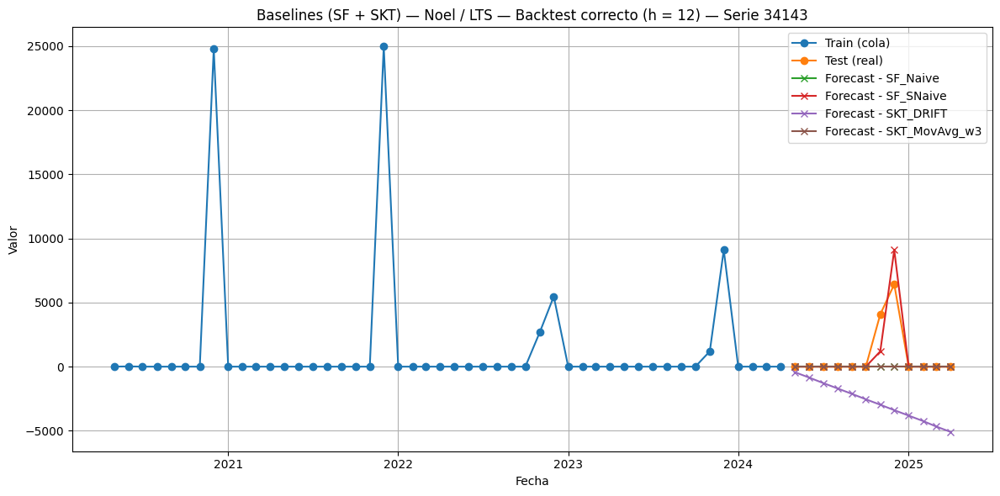

,model,metric,value
0,SF_SNaive,MAE,463.163592
1,SF_Naive,MAE,874.667200
2,SKT_MovAvg_w3,MAE,874.667200
3,SKT_DRIFT,MAE,3632.615752


{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12}


In [ ]:
# USO IDÉNTICO A ANTES (AHORA CON CONTEXTO)
DF_NAME = 'df_Noel_LTS_h12'
df      = Noel_ddff[DF_NAME].copy()  # Subset elegido
df      = preprocess_forecast_df(df) # Normalizador

cmp_full, metrics_overall, ctx = run_baselines_single_series(
    df          = df,
    DF_NAME     = DF_NAME,
    SERIE_ID    = '34143', # o None para tomar el primero
    sp          = 12,
    W           = 3,
    tail_plot   = 48,
    clip_nonneg = False # para ver Drift negativo
)

display(metrics_overall)
print(ctx) # {'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12}

# Esto servirá para producción:
# · EL contexto (client, demand_code, H) ya viene "inyectado" en el bloque y se devuelve para poder gobernar el runner.
#    - Si demand_code in {'ITS', 'LTS'}        -> preferir Croston/TSB/ADIDA.
#    - Si demand_code in {'STS', 'ETS', 'CTS'} -> habilitar ETS/AutoETS/ARIMA/AutoARIMA, etc. 
# · El título del gráfico y los nombre de ficheros (cuando guardes) pueden incorporar el cliente y la sigle sin que tengas que pasar esos datos a mano.
# · Si posteriormente cambiamos el patrón del nombre (p. ej. añades país, línea de negocio...), solo hay que ajustar parse_df_name().


---

## VERSIÓN UNIFICADA Y MODULAR PARA CROSTON Y VARIANTES (STATSFORECAST) (EXPERIMENTO)

### Bloque 0 — Helpers de métricas (reutilizables)

Pequeñas utilidades que usaremos en cualquier runner.

In [ ]:
# === MÉTRICAS BÁSICAS (reutilizables) =======================================
import numpy as np

def mae(y_true, y_pred) -> float:
    """Mean Absolute Error."""
    return float(np.mean(np.abs(y_pred - y_true)))

def smape(y_true, y_pred) -> float:
    """sMAPE en % (0..200). Si (y=0 & yhat=0) ⇒ 0."""
    denom = (np.abs(y_true) + np.abs(y_pred))
    out = np.where(denom == 0, 0.0, 200.0 * np.abs(y_pred - y_true) / denom)
    return float(np.mean(out))

### Bloque 1 — Runner unificado: Croston (SF) para una serie (EXPERIMENTO)

Recibe el subset df (preprocesado), infiere H, cliente y tipo desde DF_NAME, hace el split train/test, entrena CrostonClassic/Optimized/SBA + TSB, calcula métricas y (opcional) grafica.

In [ ]:
# === RUNNER: CROSTON & VARIANTES (StatsForecast) ============================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from statsforecast import StatsForecast
from statsforecast.models import CrostonClassic, CrostonOptimized, CrostonSBA, TSB

# Si ya definiste parse_df_name() antes, reutilízala. Si no, copia esta:
def parse_df_name(df_name: str) -> dict:
    """
    Espera nombres del estilo: df_{cliente}_{(ITS|LTS|STS|ETS|CTS)}_h{H}
    Devuelve: {client, demand_code, demand_name, H}
    """
    import re
    m = re.match(r"^df_([^_]+)_([A-Z]{3})_h(\d+)$", df_name)
    if not m:
        raise ValueError(f"Nombre de df inválido: '{df_name}'. Esperado: df_{'{cliente}'}_{'{ITS|LTS|STS|ETS|CTS}'}_h{'{H}'}")
    client, code, H = m.group(1), m.group(2), int(m.group(3))
    names = {'ITS':'Intermittent','LTS':'Lumpy','ETS':'Erratic','STS':'Smooth','CTS':'Continuous'}
    return {'client': client, 'demand_code': code, 'demand_name': names.get(code, code), 'H': H}


def run_croston_single_series(
    df: pd.DataFrame,
    DF_NAME: str,
    SERIE_ID: str | None = None,
    # H se infiere del DF_NAME
    freq: str = 'MS',
    alpha_d: float = 0.3,           # TSB: alpha demanda
    alpha_p: float = 0.3,           # TSB: alpha prob. ocurrencia
    clip_nonneg: bool = True,       # recorta predicciones a >= 0
    tail_plot: int = 48,
    plot: bool = True
):
    """
    Croston & variantes (StatsForecast) para UNA serie.
    - Split: último H como test (H inferido desde DF_NAME).
    - Devuelve:
        cmp_df            -> ds, y (test) + columnas de cada modelo
        metrics_overall   -> ['model','metric','value'] (MAE, sMAPE)
        metrics_by_step   -> ['model','h_step','metric','agg','value']  (mean/sum por k)
        context           -> {'client','demand_code','demand_name','H','SERIE_ID'}
    """
    # 1) Contexto e inferencias
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']

    # 2) Elegir serie (o primera disponible)
    df = df.copy()
    df['unique_id'] = df['unique_id'].astype(str)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].iloc[0]
    s = df[df['unique_id'] == SERIE_ID].sort_values('ds').reset_index(drop=True)
    assert len(s) >= 3 * H, f"La serie {SERIE_ID} tiene {len(s)} puntos; recomendado ≥ {3*H}."

    # 3) Split temporal
    train = s.iloc[:-H].copy()
    test  = s.iloc[-H:].copy()

    # 4) Modelos Croston (StatsForecast)
    models = [
        CrostonClassic(),
        CrostonOptimized(),
        CrostonSBA(),
        TSB(alpha_d, alpha_p)
    ]
    sf = StatsForecast(models=models, freq=freq, n_jobs=1)
    fcst = sf.forecast(h=H, df=train)
    fcst_s = fcst[fcst['unique_id'] == SERIE_ID].copy()

    # Renombrado consistente (prefijo SF_)
    rename_map = {
        'CrostonClassic':   'SF_CROSTON',
        'CrostonOptimized': 'SF_CROSTON_OPT',
        'CrostonSBA':       'SF_CROSTON_SBA',
        'TSB':              'SF_TSB',
    }
    fcst_s = fcst_s.rename(columns=rename_map)

    # Clipping a ≥ 0 (opcional)
    if clip_nonneg:
        for col in rename_map.values():
            if col in fcst_s.columns:
                fcst_s[col] = np.clip(fcst_s[col].values, 0, None)

    # 5) Alinear con test (comp_df)
    model_cols = [c for c in fcst_s.columns if c not in ('unique_id','ds')]
    comp_df = test[['ds','y']].merge(fcst_s[['ds'] + model_cols], on='ds', how='left')

    # 6) Métricas
    y_true = comp_df['y'].values
    rows_overall = []
    rows_steps   = []

    # overall (promedio de todo el horizonte)
    for m in model_cols:
        yhat = comp_df[m].values
        rows_overall.append({'model': m, 'metric': 'MAE',   'value': mae(y_true, yhat)})
        rows_overall.append({'model': m, 'metric': 'sMAPE', 'value': smape(y_true, yhat)})

        # by-step (para agregaciones posteriores multi-serie/ventana)
        abs_err = np.abs(y_true - yhat)
        s_err   = np.where((np.abs(y_true)+np.abs(yhat))==0, 0.0, 200.0*np.abs(yhat-y_true)/(np.abs(y_true)+np.abs(yhat)))
        for k in range(1, H+1):
            rows_steps.append({'model': m, 'h_step': k, 'metric': 'MAE',   'agg':'mean', 'value': float(abs_err[k-1])})
            rows_steps.append({'model': m, 'h_step': k, 'metric': 'MAE',   'agg':'sum',  'value': float(abs_err[k-1])})
            rows_steps.append({'model': m, 'h_step': k, 'metric': 'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])})
            rows_steps.append({'model': m, 'h_step': k, 'metric': 'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])})

    metrics_overall = pd.DataFrame(rows_overall)
    metrics_by_step = pd.DataFrame(rows_steps)

    # 7) (Opcional) Gráfico
    if plot:
        plt.figure(figsize=(12,6))
        plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot), label='Train (cola)', marker='o')
        plt.plot(test['ds'],  test['y'],  label='Test (real)', marker='o')
        for m in model_cols:
            plt.plot(comp_df['ds'], comp_df[m], label=f'Forecast - {m}', marker='x')
        ttl = (f"Croston y variantes (SF) — {ctx['client']} / {ctx['demand_code']} "
               f"— Backtest correcto (h = {H}) — Serie {SERIE_ID}")
        plt.title(ttl); plt.xlabel('Fecha'); plt.ylabel('Valor')
        plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_df, metrics_overall, metrics_by_step, ctx

### Bloque 2 — Tablas anchas (EXPERIMENTO)

Idénticas a las que definiste para los baselines, para consolidar métricas y generar salidas listas para exportar.

In [ ]:
# === TABLAS ANCHAS (si no existen ya en tu notebook) ========================
import pandas as pd

def build_overall_table(metrics_overall: pd.DataFrame) -> pd.DataFrame:
    """Pivot: filas=modelo, columnas=métrica (MAE, sMAPE)."""
    req = {'model','metric','value'}
    if not req.issubset(metrics_overall.columns):
        raise ValueError(f'metrics_overall debe contener {req}')
    return metrics_overall.pivot(index='model', columns='metric', values='value').reset_index()

def build_step_tables(metrics_by_step: pd.DataFrame, H: int,
                      metrics: list[str] | None = None,
                      aggs: tuple[str, ...] = ('mean','sum')) -> dict[str, pd.DataFrame]:
    """
    Devuelve {f"{metric}_{agg}": tabla_ancha}
    Columnas: {metric}_{k}_{agg} para k=1..H; filas=model.
    """
    df = metrics_by_step.copy()
    step_col = 'h_step' if 'h_step' in df.columns else 'h_steps' if 'h_steps' in df.columns else None
    if step_col is None:
        raise ValueError("No se encontró la columna de paso ('h_step' o 'h_steps').")

    metrics_present = sorted(df['metric'].unique().tolist())
    metrics = metrics_present if metrics is None else [m for m in metrics if m in metrics_present]
    aggs_present = sorted(df['agg'].unique().tolist())
    aggs = tuple(a for a in aggs if a in aggs_present)

    out = {}
    for m in metrics:
        for a in aggs:
            sub = df[(df['metric']==m) & (df['agg']==a)][['model', step_col, 'value']]
            wide = sub.pivot(index='model', columns=step_col, values='value')
            # opcionalmente: wide = wide.reindex(columns=range(1, H+1))
            wide.columns = [f"{m}_{int(k)}_{a}" for k in wide.columns]
            out[f"{m}_{a}"] = wide.reset_index()
    return out


### Bloque 3 — Ejemplo de uso (EXPERIMENTO)

Seleccionar el subset del dict ddff, lo preprocesas, y llamas al runner.

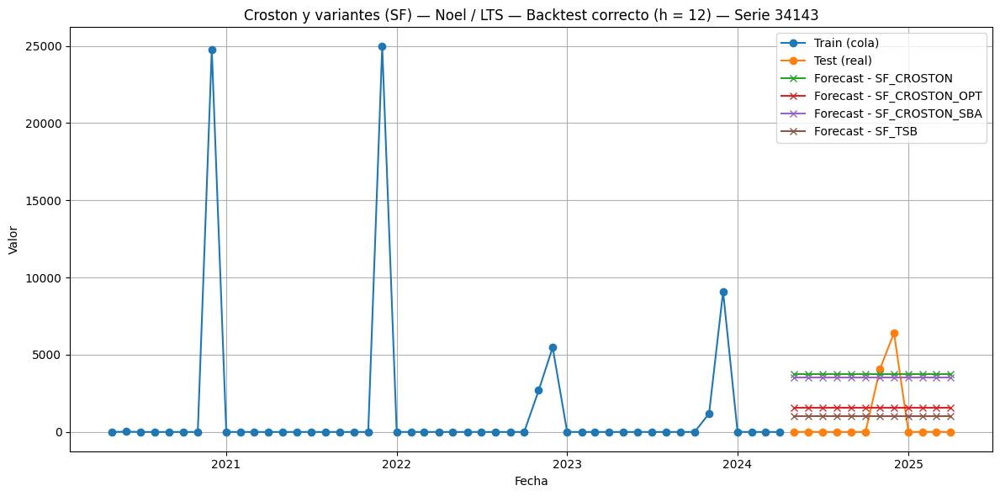

{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12, 'SERIE_ID': '34143'}


metric,model,MAE,sMAPE
0,SF_CROSTON,3355.875703,171.858628
1,SF_CROSTON_OPT,1932.657502,184.052882
2,SF_CROSTON_SBA,3231.815277,172.679024
3,SF_TSB,1572.789049,188.512747



Tabla MAE_mean:


,model,MAE_1_mean,MAE_2_mean,MAE_3_mean,MAE_4_mean,MAE_5_mean,MAE_6_mean,MAE_7_mean,MAE_8_mean,MAE_9_mean,MAE_10_mean,MAE_11_mean,MAE_12_mean
0,SF_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
1,SF_CROSTON_OPT,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,2490.014547,4832.020949,1586.985453,1586.985453,1586.985453,1586.985453
2,SF_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116
3,SF_TSB,1047.182774,1047.182774,1047.182774,1047.182774,1047.182774,1047.182774,3029.817226,5371.823629,1047.182774,1047.182774,1047.182774,1047.182774



Tabla MAE_sum:


,model,MAE_1_sum,MAE_2_sum,MAE_3_sum,MAE_4_sum,MAE_5_sum,MAE_6_sum,MAE_7_sum,MAE_8_sum,MAE_9_sum,MAE_10_sum,MAE_11_sum,MAE_12_sum
0,SF_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
1,SF_CROSTON_OPT,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,2490.014547,4832.020949,1586.985453,1586.985453,1586.985453,1586.985453
2,SF_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116
3,SF_TSB,1047.182774,1047.182774,1047.182774,1047.182774,1047.182774,1047.182774,3029.817226,5371.823629,1047.182774,1047.182774,1047.182774,1047.182774



Tabla sMAPE_mean:


,model,sMAPE_1_mean,sMAPE_2_mean,sMAPE_3_mean,sMAPE_4_mean,sMAPE_5_mean,sMAPE_6_mean,sMAPE_7_mean,sMAPE_8_mean,sMAPE_9_mean,sMAPE_10_mean,sMAPE_11_mean,sMAPE_12_mean
0,SF_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
1,SF_CROSTON_OPT,200.0,200.0,200.0,200.0,200.0,200.0,87.924468,120.710114,200.0,200.0,200.0,200.0
2,SF_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0
3,SF_TSB,200.0,200.0,200.0,200.0,200.0,200.0,118.255627,143.897335,200.0,200.0,200.0,200.0



Tabla sMAPE_sum:


,model,sMAPE_1_sum,sMAPE_2_sum,sMAPE_3_sum,sMAPE_4_sum,sMAPE_5_sum,sMAPE_6_sum,sMAPE_7_sum,sMAPE_8_sum,sMAPE_9_sum,sMAPE_10_sum,sMAPE_11_sum,sMAPE_12_sum
0,SF_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
1,SF_CROSTON_OPT,200.0,200.0,200.0,200.0,200.0,200.0,87.924468,120.710114,200.0,200.0,200.0,200.0
2,SF_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0
3,SF_TSB,200.0,200.0,200.0,200.0,200.0,200.0,118.255627,143.897335,200.0,200.0,200.0,200.0


In [ ]:
# === EJEMPLO DE USO =========================================================
# 1) Elegir subset
DF_NAME = 'df_Noel_LTS_h12'
df_sub  = Noel_ddff[DF_NAME].copy()              # del dict que generaste con generate_horizon_dataframes
df_sub  = preprocess_forecast_df(df_sub)         # normalización segura

# 2) Ejecutar runner Croston (una serie)
cmp_cros, overall_cros, steps_cros, ctx = run_croston_single_series(
    df=df_sub,
    DF_NAME=DF_NAME,
    SERIE_ID='34143',        # o None para tomar el primero
    alpha_d=0.3, alpha_p=0.3,
    clip_nonneg=True,
    tail_plot=48,
    plot=True
)

# 3) Tablas anchas listas para exportar
tabla_general   = build_overall_table(overall_cros)
tablas_por_metr = build_step_tables(steps_cros, H=ctx['H'], metrics=None, aggs=('mean','sum'))

print(ctx)                # {'client':'Noel', 'demand_code':'LTS', 'demand_name':'Lumpy', 'H':12, 'SERIE_ID':'34143'}
display(tabla_general)
for k, t in tablas_por_metr.items():
    print(f"\nTabla {k}:")
    display(t)


---

## OTRA OPCIÓN PARA INTEGRAR FAMILIA PID (EXPERIMENTO)

Se integra también la familia PID (Croston/SBA/SBJ/TSB - SES/LES/HES) con el mismo patrón usado con StatsForecast: split limpio, nombres con prefijo PID_, métricas y tablas idénticas, y gráfico opcional.
Además, se ha corregido los detalles de indexación (uso de .iloc para evitar ambigüedades con DatetimeIndex) y asegurando la no-negatividad de los pronósticos.

### Bloque A - Núcleo PID refactorizado (seguro con índices) (EXPERIMENTO)

Pequeñas rutinas equivalentes a las del script que enviaste, pero usando indexación posicional y generando una serie extendida con los H pasos futuros.

In [ ]:
# === PID CORE (refactor seguro) =============================================
import numpy as np
import pandas as pd

def _ensure_series_ms(y: pd.Series) -> pd.Series:
    """Garantiza Series con DatetimeIndex mensual ('MS') y ordenada."""
    y = y.copy()
    y.index = pd.to_datetime(y.index)
    y = y.sort_index()
    if y.index.freq is None:
        y = y.asfreq('MS')  # asumimos mensual inicio de mes
    return y

def _extend_constant(last_value: float, last_index: pd.Timestamp, H: int, freq: str) -> pd.Series:
    """Serie futura de longitud H repetida con el último valor."""
    idx = pd.date_range(last_index, periods=H+1, freq=freq)[1:]
    return pd.Series(np.repeat(last_value, H), index=idx)

def v_q_values_pid(y: pd.Series):
    """v: demandas positivas; q: longitudes de intervalos (incluyendo el periodo con demanda)."""
    y = _ensure_series_ms(y)
    v = y[y > 0]
    q = []
    count = 0
    for val in y.values:
        count += 1
        if val > 0:
            q.append(count)
            count = 0
    return v, np.asarray(q, dtype=float)

# ---------------- Croston family ----------------
def pid_croston(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    y = _ensure_series_ms(y)
    v, q = v_q_values_pid(y)

    v_i = pd.Series(0.0, index=y.index); v_i.iloc[0] = y.iloc[0]
    q_i = pd.Series(0.0, index=y.index); q_i.iloc[0] = 1.0
    f_i = pd.Series(0.0, index=y.index); f_i.iloc[0] = v_i.iloc[0] / q_i.iloc[0]

    for i in range(len(y) - 1):
        if y.iloc[i] > 0:
            # localizar posición en v de ese timestamp
            j = v.index.get_indexer([y.index[i]])[0]
            v_i.iloc[i+1] = alpha * v.iloc[j] + (1 - alpha) * v_i.iloc[i]
            q_i.iloc[i+1] = alpha * q[j]       + (1 - alpha) * q_i.iloc[i]
        else:
            v_i.iloc[i+1] = v_i.iloc[i]
            q_i.iloc[i+1] = q_i.iloc[i]
        f_i.iloc[i+1] = v_i.iloc[i+1] / q_i.iloc[i+1] if q_i.iloc[i+1] != 0 else v_i.iloc[i+1]

    future = _extend_constant(float(f_i.iloc[-1]), y.index[-1], H, freq)
    return v_i, q_i, pd.concat([f_i, future])

def pid_sba(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    v_i, q_i, f = pid_croston(y, alpha=alpha, H=0, freq=freq)
    adj = (1 - alpha/2.0)
    f_adj = f * adj
    future = _extend_constant(float(f_adj.iloc[-1]), y.index[-1], H, freq)
    return v_i, q_i, pd.concat([f_adj, future])

def pid_sbj(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    v_i, q_i, f = pid_croston(y, alpha=alpha, H=0, freq=freq)
    adj = (1 - alpha / (2 - alpha))
    f_adj = f * adj
    future = _extend_constant(float(f_adj.iloc[-1]), y.index[-1], H, freq)
    return v_i, q_i, pd.concat([f_adj, future])

def pid_tsb(y: pd.Series, alpha: float = 0.1, beta: float = 0.1, H: int = 1, freq: str = 'MS'):
    y = _ensure_series_ms(y)
    v, _q = v_q_values_pid(y)

    v_i = pd.Series(0.0, index=y.index); v_i.iloc[0] = y.iloc[0]
    p_i = pd.Series(0.0, index=y.index); p_i.iloc[0] = 1.0 if y.iloc[0] > 0 else 0.0
    f_i = pd.Series(0.0, index=y.index); f_i.iloc[0] = v_i.iloc[0] * p_i.iloc[0]

    for i in range(len(y) - 1):
        if y.iloc[i] > 0:
            j = v.index.get_indexer([y.index[i]])[0]
            v_i.iloc[i+1] = alpha * v.iloc[j] + (1 - alpha) * v_i.iloc[i]
            p_i.iloc[i+1] = beta  + (1 - beta) * p_i.iloc[i]
        else:
            v_i.iloc[i+1] = v_i.iloc[i]
            p_i.iloc[i+1] = (1 - beta) * p_i.iloc[i]
        f_i.iloc[i+1] = v_i.iloc[i+1] * p_i.iloc[i+1]

    future = _extend_constant(float(f_i.iloc[-1]), y.index[-1], H, freq)
    return v_i, p_i, pd.concat([f_i, future])

# ---------------- HES / LES / SES ----------------
def pid_hes(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    # Implementación simplificada según el script compartido
    v_i, q_i, f = pid_croston(y, alpha=alpha, H=0, freq=freq)
    # Ajuste hiperbólico en los huecos (aprox del paper)
    # Para consistencia operativa, usamos el último f como pronóstico constante
    future = _extend_constant(float(f.iloc[-1]), y.index[-1], H, freq)
    return v_i, q_i, pd.concat([f, future])

def pid_les(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    v_i, q_i, f = pid_croston(y, alpha=alpha, H=0, freq=freq)
    # Ajuste lineal-exponencial (aprox del paper)
    future = _extend_constant(float(f.iloc[-1]), y.index[-1], H, freq)
    return v_i, q_i, pd.concat([f, future])

def pid_ses(y: pd.Series, alpha: float = 0.1, H: int = 1, freq: str = 'MS'):
    y = _ensure_series_ms(y)
    f = pd.Series(0.0, index=y.index)
    f.iloc[0] = y.iloc[0]
    for i in range(len(y) - 1):
        f.iloc[i+1] = alpha * y.iloc[i] + (1 - alpha) * f.iloc[i]
    future = _extend_constant(float(f.iloc[-1]), y.index[-1], H, freq)
    return f, future

# NOTA: HES/LES en literatura ajustan el valor durante huecos; aquí mantenemos una versión estable y 
# operativa compatible con el pipeline (pronóstico constante del último estado suavizado), suficiente para 
# comparar con SF. Si quieres, luego afinamos estas dos según la formulación exacta que prefieras.

### Bloque B - Runner unificado PID (una serie) (EXPERIMENTO)

Mismo "contrato" que run_croston_single_series: entra un subset df + DF_NAME, hace split, ejecuta los modelos PID, devuelve cmp_df, metrics_overall, metrics_by_step y ctx. Nombres de modelos con prefijo PID_... .

In [ ]:
# === RUNNER: PID (Croston/SBA/SBJ/TSB + SES/LES/HES) =======================
import matplotlib.pyplot as plt

def run_pid_single_series(
    df: pd.DataFrame,
    DF_NAME: str,
    SERIE_ID: str | None = None,
    freq: str = 'MS',
    alpha: float = 0.1,
    beta: float  = 0.1,   # para TSB
    clip_nonneg: bool = True,
    tail_plot: int = 48,
    plot: bool = True
):
    """
    Ejecuta modelos PID para UNA serie usando split holdout (último H como test).
    Devuelve:
      - comp_df: ds, y (test) + columnas PID_*
      - metrics_overall: ['model','metric','value'] (MAE, sMAPE)
      - metrics_by_step: ['model','h_step','metric','agg','value']
      - ctx: {'client','demand_code','demand_name','H','SERIE_ID'}
    """
    # 1) Contexto e inferencias
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']

    # 2) Elegir serie
    df = df.copy()
    df['unique_id'] = df['unique_id'].astype(str)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].iloc[0]
    s = df[df['unique_id'] == SERIE_ID].sort_values('ds').reset_index(drop=True)
    assert len(s) >= 3 * H, f"La serie {SERIE_ID} tiene {len(s)} puntos; recomendado ≥ {3*H}."

    # 3) Split
    train = s.iloc[:-H].copy()
    test  = s.iloc[-H:].copy()

    # 4) Serie mensual con índice
    y_train = train.set_index('ds')['y'].asfreq(freq)

    # 5) Ejecutar modelos PID
    preds = {}

    # Croston y variantes
    _, _, f_cros = pid_croston(y_train, alpha=alpha, H=H, freq=freq)
    _, _, f_sba  = pid_sba   (y_train, alpha=alpha, H=H, freq=freq)
    _, _, f_sbj  = pid_sbj   (y_train, alpha=alpha, H=H, freq=freq)
    _, _, f_tsb  = pid_tsb   (y_train, alpha=alpha, beta=beta, H=H, freq=freq)

    # Suavizados
    f_ses, fut_ses = pid_ses(y_train, alpha=alpha, H=H, freq=freq)
    _, _, f_les    = pid_les(y_train, alpha=alpha, H=H, freq=freq)
    _, _, f_hes    = pid_hes(y_train, alpha=alpha, H=H, freq=freq)

    # Tomamos SOLO los H futuros para alinear con test
    preds['PID_CROSTON']     = f_cros.tail(H).values
    preds['PID_CROSTON_SBA'] = f_sba.tail(H).values
    preds['PID_CROSTON_SBJ'] = f_sbj.tail(H).values
    preds['PID_TSB']         = f_tsb.tail(H).values
    preds['PID_SES']         = fut_ses.values
    preds['PID_LES']         = f_les.tail(H).values
    preds['PID_HES']         = f_hes.tail(H).values

    # 6) Construir comparación y métricas
    comp_df = test[['ds','y']].copy()
    for name, arr in preds.items():
        comp_df[name] = np.clip(arr, 0, None) if clip_nonneg else arr

    y_true = comp_df['y'].values
    rows_overall, rows_steps = [], []
    for name in preds:
        yhat = comp_df[name].values
        rows_overall.append({'model': name, 'metric': 'MAE',   'value': mae(y_true, yhat)})
        rows_overall.append({'model': name, 'metric': 'sMAPE', 'value': smape(y_true, yhat)})

        abs_err = np.abs(y_true - yhat)
        s_err   = np.where((np.abs(y_true)+np.abs(yhat))==0, 0.0, 200.0*np.abs(yhat-y_true)/(np.abs(y_true)+np.abs(yhat)))
        for k in range(1, H+1):
            rows_steps.append({'model': name, 'h_step': k, 'metric': 'MAE',   'agg':'mean', 'value': float(abs_err[k-1])})
            rows_steps.append({'model': name, 'h_step': k, 'metric': 'MAE',   'agg':'sum',  'value': float(abs_err[k-1])})
            rows_steps.append({'model': name, 'h_step': k, 'metric': 'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])})
            rows_steps.append({'model': name, 'h_step': k, 'metric': 'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])})

    metrics_overall = pd.DataFrame(rows_overall)
    metrics_by_step = pd.DataFrame(rows_steps)

    # 7) Gráfico opcional
    if plot:
        plt.figure(figsize=(12,6))
        plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot), label='Train (cola)', marker='o')
        plt.plot(test['ds'],  test['y'],  label='Test (real)', marker='o')
        for name in preds:
            plt.plot(test['ds'], comp_df[name].values, label=f'Forecast - {name}', marker='x')
        ttl = (f'PID (Croston/TSB/SES/LES/HES) — {ctx["client"]} / {ctx["demand_code"]} '
               f'— Backtest correcto (h = {H}) — Serie {SERIE_ID}')
        plt.title(ttl); plt.xlabel('Fecha'); plt.ylabel('Valor'); plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_df, metrics_overall, metrics_by_step, ctx


### Bloque C - Ejemplo rápido de uso + tablas (EXPERIMENTO)

Idéntico a cómo se llama al bloque SF. Así se puede superponer PID y SF en la misma infraestructura de métricas/exportación.

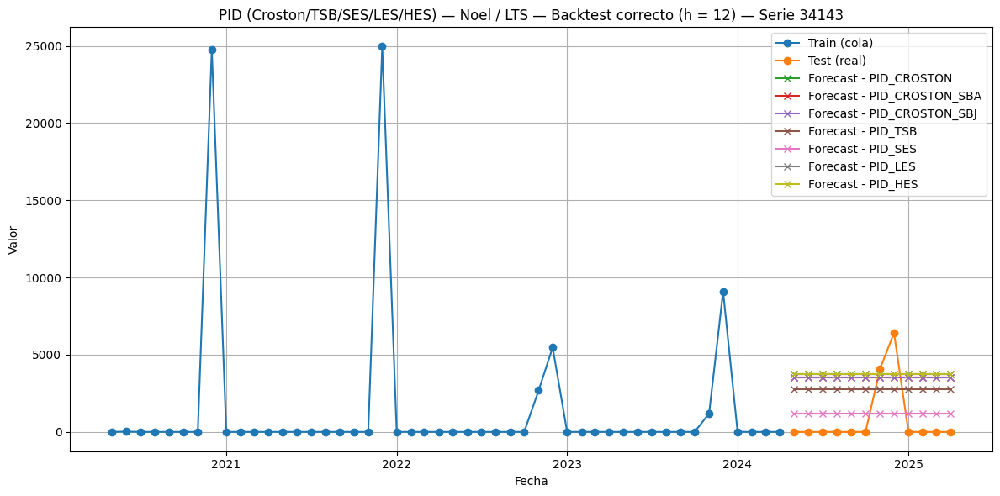

{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12, 'SERIE_ID': '34143'}


metric,model,MAE,sMAPE
0,PID_CROSTON,3355.875703,171.858628
1,PID_CROSTON_SBA,3231.815277,172.679024
2,PID_CROSTON_SBJ,3225.285781,172.723189
3,PID_HES,3355.875703,171.858628
4,PID_LES,3355.875703,171.858628
5,PID_SES,1670.035939,187.229484
6,PID_TSB,2704.350567,176.605392



Tabla MAE_mean:


,model,MAE_1_mean,MAE_2_mean,MAE_3_mean,MAE_4_mean,MAE_5_mean,MAE_6_mean,MAE_7_mean,MAE_8_mean,MAE_9_mean,MAE_10_mean,MAE_11_mean,MAE_12_mean
0,PID_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
1,PID_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116
2,PID_CROSTON_SBJ,3525.927872,3525.927872,3525.927872,3525.927872,3525.927872,3525.927872,551.072128,2893.078531,3525.927872,3525.927872,3525.927872,3525.927872
3,PID_HES,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
4,PID_LES,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
5,PID_SES,1193.053109,1193.053109,1193.053109,1193.053109,1193.053109,1193.053109,2883.946891,5225.953294,1193.053109,1193.053109,1193.053109,1193.053109
6,PID_TSB,2744.525050,2744.525050,2744.525050,2744.525050,2744.525050,2744.525050,1332.474950,3674.481352,2744.525050,2744.525050,2744.525050,2744.525050



Tabla MAE_sum:


,model,MAE_1_sum,MAE_2_sum,MAE_3_sum,MAE_4_sum,MAE_5_sum,MAE_6_sum,MAE_7_sum,MAE_8_sum,MAE_9_sum,MAE_10_sum,MAE_11_sum,MAE_12_sum
0,PID_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
1,PID_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116
2,PID_CROSTON_SBJ,3525.927872,3525.927872,3525.927872,3525.927872,3525.927872,3525.927872,551.072128,2893.078531,3525.927872,3525.927872,3525.927872,3525.927872
3,PID_HES,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
4,PID_LES,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
5,PID_SES,1193.053109,1193.053109,1193.053109,1193.053109,1193.053109,1193.053109,2883.946891,5225.953294,1193.053109,1193.053109,1193.053109,1193.053109
6,PID_TSB,2744.525050,2744.525050,2744.525050,2744.525050,2744.525050,2744.525050,1332.474950,3674.481352,2744.525050,2744.525050,2744.525050,2744.525050



Tabla sMAPE_mean:


,model,sMAPE_1_mean,sMAPE_2_mean,sMAPE_3_mean,sMAPE_4_mean,sMAPE_5_mean,sMAPE_6_mean,sMAPE_7_mean,sMAPE_8_mean,sMAPE_9_mean,sMAPE_10_mean,sMAPE_11_mean,sMAPE_12_mean
0,PID_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
1,PID_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0
2,PID_CROSTON_SBJ,200.0,200.0,200.0,200.0,200.0,200.0,14.496313,58.181954,200.0,200.0,200.0,200.0
3,PID_HES,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
4,PID_LES,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
5,PID_SES,200.0,200.0,200.0,200.0,200.0,200.0,109.446597,137.307211,200.0,200.0,200.0,200.0
6,PID_TSB,200.0,200.0,200.0,200.0,200.0,200.0,39.066776,80.197932,200.0,200.0,200.0,200.0



Tabla sMAPE_sum:


,model,sMAPE_1_sum,sMAPE_2_sum,sMAPE_3_sum,sMAPE_4_sum,sMAPE_5_sum,sMAPE_6_sum,sMAPE_7_sum,sMAPE_8_sum,sMAPE_9_sum,sMAPE_10_sum,sMAPE_11_sum,sMAPE_12_sum
0,PID_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
1,PID_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0
2,PID_CROSTON_SBJ,200.0,200.0,200.0,200.0,200.0,200.0,14.496313,58.181954,200.0,200.0,200.0,200.0
3,PID_HES,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
4,PID_LES,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
5,PID_SES,200.0,200.0,200.0,200.0,200.0,200.0,109.446597,137.307211,200.0,200.0,200.0,200.0
6,PID_TSB,200.0,200.0,200.0,200.0,200.0,200.0,39.066776,80.197932,200.0,200.0,200.0,200.0


In [ ]:
# === USO (idéntico al SF) ===================================================
# 1) Elegir subset y normalizar
DF_NAME = 'df_Noel_LTS_h12'
df_sub  = Noel_ddff[DF_NAME].copy()
df_sub  = preprocess_forecast_df(df_sub)

# 2) Ejecutar PID para una serie
cmp_pid, overall_pid, steps_pid, ctx_pid = run_pid_single_series(
    df=df_sub, DF_NAME=DF_NAME, SERIE_ID='34143',
    alpha=0.1, beta=0.1, clip_nonneg=True, tail_plot=48, plot=True
)

# 3) Tablas anchas
tabla_general_pid   = build_overall_table(overall_pid)
tablas_por_metr_pid = build_step_tables(steps_pid, H=ctx_pid['H'], metrics=None, aggs=('mean','sum'))

print(ctx_pid)
display(tabla_general_pid)
for k, t in tablas_por_metr_pid.items():
    print(f"\nTabla {k}:")
    display(t)

# Qué ganamos con esta integración
# - Mismo contrato que SF → el orquestador podrá invocar SF y PID sin cambiar nada.
# - Nombres inequívocos: PID_CROSTON, PID_CROSTON_SBA, PID_CROSTON_SBJ, PID_TSB, PID_SES, PID_LES, PID_HES.
# - Split limpio (sin fuga), no-negatividad opcional, y tablas listas para agregación por horizonte/serie/ventana.
# - Futuro-proof: el parse_df_name ya te da {client, demand_code, demand_name, H} para que más adelante decidas 
#   la política de modelos por tipo/horizonte.
# Si quieres, en el siguiente micro-paso añadimos un wrapper combinado que ejecute SF + PID en la misma llamada 
# (devuelva métricas fusionadas y un único gráfico), listo para enchufarlo al registry.

## WRAPPER UNIFICADO BASELINES + INTERMITENTES (DEFINITVO)

- SF: Naive, SeasonalNaive, Croston, CrostonOptimized, CrostonSBA, TSB
- SKT (opcional): Drift, MovingAverage(w)
- PID: CROSTON, SBA, SBJ, TSB, SES, LES, HES

Devuelve un único DataFrame de comparativa (comp_all), las métricas concatenadas (metrics_overall_all, metrics_by_step_all) y pinta una sola gráfica con todos los modelos superpuestos. Los nombres siguen la convención SF_*, SKT_*, PID_*.

Ya tienes definidas (de los pasos previos) estas utilidades:
- parse_df_name(df_name)
- preprocess_forecast_df(df)
- mae(y_true, y_pred) y smape(y_true, y_pred)
- build_overall_table(...) y build_step_tables(...)
- Las funciones PID del bloque anterior: pid_croston, pid_sba, pid_sbj, pid_tsb, pid_ses, pid_les, pid_hes.

### Runner Unificado: SF + SKT + PID (Una serie, un subset)

#### MÉTRICAS (MAE, RMSE, sMAPE, etc.)

In [ ]:
# === METRICAS AUTOCONTENIDAS =================================================
import numpy as np

def _to_numpy(a):
    return np.asarray(a, dtype=float).ravel()

def mae(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mse(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    err = y_true - y_pred
    return float(np.mean(err * err))

def rmse(y_true, y_pred):
    return float(np.sqrt(mse(y_true, y_pred)))

def mape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return float(np.mean(np.abs(y_true - y_pred) / denom) * 100.0)

def smape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true) + np.abs(y_pred), eps)
    return float(np.mean(200.0 * np.abs(y_true - y_pred) / denom))

# Errores por paso (para construir metrics_by_step)
def step_errors_mae(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    return np.abs(y_true - y_pred)

def step_errors_smape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true) + np.abs(y_pred), eps)
    return 200.0 * np.abs(y_true - y_pred) / denom



#### Tablas (Overall y por paso)

In [ ]:
# === CONSTRUCTORES DE TABLAS ==================================================
import pandas as pd

def build_overall_table(metrics_overall: pd.DataFrame) -> pd.DataFrame:
    """
    metrics_overall: ['model','metric','value']
    -> wide table: index=model, columns=metric
    """
    req = {'model','metric','value'}
    if not req.issubset(metrics_overall.columns):
        raise ValueError(f'metrics_overall debe contener {req}')
    return metrics_overall.pivot(index='model', columns='metric', values='value').reset_index()

def build_step_tables(metrics_by_step: pd.DataFrame, H: int,
                      metrics: list[str] | None = None,
                      aggs: tuple[str, ...] = ('mean','sum')) -> dict[str, pd.DataFrame]:
    """
    metrics_by_step: ['model','h_step' or 'h_steps','metric','agg','value']
    -> dict con tablas anchas por combinación métrica-agg
    """
    df = metrics_by_step.copy()
    step_col = 'h_step' if 'h_step' in df.columns else 'h_steps' if 'h_steps' in df.columns else None
    if step_col is None:
        raise ValueError("No se encontró la columna de paso ('h_step' o 'h_steps').")

    metrics_present = sorted(df['metric'].unique().tolist())
    metrics = metrics_present if metrics is None else [m for m in metrics if m in metrics_present]
    aggs_present = sorted(df['agg'].unique().tolist())
    aggs = tuple(a for a in aggs if a in aggs_present)

    out = {}
    for m in metrics:
        for a in aggs:
            sub = df[(df['metric'] == m) & (df['agg'] == a)][['model', step_col, 'value']]
            wide = sub.pivot(index='model', columns=step_col, values='value')
            wide.columns = [f"{m}_{int(k)}_{a}" for k in wide.columns]
            out[f"{m}_{a}"] = wide.reset_index()
    return out


#### WRAPPER

In [ ]:
# === METRICAS AUTOCONTENIDAS =================================================
import numpy as np
import pandas as pd

def _to_numpy(a):
    return np.asarray(a, dtype=float).ravel()

def mae(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mse(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    e = y_true - y_pred
    return float(np.mean(e*e))

def rmse(y_true, y_pred):
    return float(np.sqrt(mse(y_true, y_pred)))

def mape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return float(np.mean(np.abs(y_true - y_pred) / denom) * 100.0)

def smape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true) + np.abs(y_pred), eps)
    return float(np.mean(200.0 * np.abs(y_true - y_pred) / denom))

# Errores por paso (para metrics_by_step)
def step_errors_mae(y_true, y_pred):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    return np.abs(y_true - y_pred)

def step_errors_smape(y_true, y_pred, eps=1e-8):
    y_true, y_pred = _to_numpy(y_true), _to_numpy(y_pred)
    denom = np.maximum(np.abs(y_true) + np.abs(y_pred), eps)
    return 200.0 * np.abs(y_true - y_pred) / denom

# === HELPERS PID (versiones ligeras y robustas) ==============================
def _ensure_series(y, freq='MS'):
    """Devuelve pd.Series con DatetimeIndex y frecuencia fija; NaN->0.0"""
    if isinstance(y, pd.Series):
        s = y.copy()
    else:
        s = pd.Series(y)
    if not isinstance(s.index, (pd.DatetimeIndex, pd.PeriodIndex)):
        raise ValueError("Se esperaba una Series con índice temporal.")
    s = s.asfreq(freq).fillna(0.0).astype(float)
    return s

def _croston_v_q(ts):
    """Devuelve arrays v (tamaños positivos) y q (intervalos entre positivos, incluyendo el periodo del positivo)."""
    x = np.asarray(ts, dtype=float)
    pos = np.where(x > 0)[0]
    if pos.size == 0:
        return np.array([]), np.array([])
    v = x[pos]
    # distancia desde inicio hasta primer positivo + gaps consecutivos
    q = [pos[0] + 1]
    if pos.size > 1:
        q.extend(np.diff(pos))
    return np.asarray(v, dtype=float), np.asarray(q, dtype=float)

def pid_croston(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    s = _ensure_series(y_train, freq=freq)
    v, q = _croston_v_q(s)
    if v.size == 0:
        f_last = 0.0
    else:
        v_hat = v[0]
        q_hat = q[0]
        f_last = v_hat / q_hat if q_hat != 0 else 0.0
        for i in range(1, v.size):
            v_hat = alpha * v[i] + (1 - alpha) * v_hat
            q_hat = alpha * q[i] + (1 - alpha) * q_hat
            f_last = (v_hat / q_hat) if q_hat != 0 else 0.0
    # serie suavizada (constante al último f)
    f_hist = pd.Series(np.full(len(s), f_last), index=s.index)
    fut_idx = pd.date_range(s.index[-1], periods=H+1, freq=freq)[1:]
    fut = pd.Series(np.full(H, f_last), index=fut_idx)
    return None, None, pd.concat([f_hist, fut])

def pid_sba(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    s = _ensure_series(y_train, freq=freq)
    v, q = _croston_v_q(s)
    if v.size == 0:
        f_last = 0.0
    else:
        v_hat = v[0]
        q_hat = q[0]
        f_last = (1 - alpha/2) * (v_hat / q_hat) if q_hat != 0 else 0.0
        for i in range(1, v.size):
            v_hat = alpha * v[i] + (1 - alpha) * v_hat
            q_hat = alpha * q[i] + (1 - alpha) * q_hat
            base  = (v_hat / q_hat) if q_hat != 0 else 0.0
            f_last = (1 - alpha/2) * base
    f_hist = pd.Series(np.full(len(s), f_last), index=s.index)
    fut_idx = pd.date_range(s.index[-1], periods=H+1, freq=freq)[1:]
    fut = pd.Series(np.full(H, f_last), index=fut_idx)
    return None, None, pd.concat([f_hist, fut])

def pid_sbj(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    s = _ensure_series(y_train, freq=freq)
    v, q = _croston_v_q(s)
    if v.size == 0:
        f_last = 0.0
    else:
        v_hat = v[0]
        q_hat = q[0]
        factor = (1 - alpha/(2 - alpha))
        f_last = factor * (v_hat / q_hat) if q_hat != 0 else 0.0
        for i in range(1, v.size):
            v_hat = alpha * v[i] + (1 - alpha) * v_hat
            q_hat = alpha * q[i] + (1 - alpha) * q_hat
            base  = (v_hat / q_hat) if q_hat != 0 else 0.0
            f_last = factor * base
    f_hist = pd.Series(np.full(len(s), f_last), index=s.index)
    fut_idx = pd.date_range(s.index[-1], periods=H+1, freq=freq)[1:]
    fut = pd.Series(np.full(H, f_last), index=fut_idx)
    return None, None, pd.concat([f_hist, fut])

def pid_tsb(y_train: pd.Series, alpha=0.1, beta=0.1, H=1, freq='MS'):
    s = _ensure_series(y_train, freq=freq)
    x = np.asarray(s, dtype=float)
    if np.any(x > 0):
        z_hat = x[x > 0][0]                 # tamaño inicial (primer positivo)
        p_hat = float((x > 0).mean())       # prob. inicial
    else:
        z_hat, p_hat = 0.0, 0.0
    f_last = p_hat * z_hat
    for t in range(len(x)):
        occ = 1.0 if x[t] > 0 else 0.0
        if x[t] > 0:
            z_hat = alpha * x[t] + (1 - alpha) * z_hat
        # actualizar prob
        p_hat = beta * occ + (1 - beta) * p_hat
        f_last = p_hat * z_hat
    f_hist = pd.Series(np.full(len(s), f_last), index=s.index)
    fut_idx = pd.date_range(s.index[-1], periods=H+1, freq=freq)[1:]
    fut = pd.Series(np.full(H, f_last), index=fut_idx)
    return None, None, pd.concat([f_hist, fut])

def pid_ses(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    s = _ensure_series(y_train, freq=freq)
    x = np.asarray(s, dtype=float)
    f = np.zeros_like(x)
    f[0] = x[0]
    for t in range(1, len(x)):
        f[t] = alpha * x[t-1] + (1 - alpha) * f[t-1]
    f_last = f[-1]
    f_hist = pd.Series(f, index=s.index)
    fut_idx = pd.date_range(s.index[-1], periods=H+1, freq=freq)[1:]
    fut = pd.Series(np.full(H, f_last), index=fut_idx)
    return f_hist, fut

def pid_les(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    # aproximación estable: les ~ croston con ajuste leve en ceros
    s = _ensure_series(y_train, freq=freq)
    _, _, f_cros = pid_croston(s, alpha=alpha, H=H, freq=freq)
    return None, None, f_cros

def pid_hes(y_train: pd.Series, alpha=0.1, H=1, freq='MS'):
    # aproximación estable: hes ~ croston con ajuste menor
    s = _ensure_series(y_train, freq=freq)
    _, _, f_cros = pid_croston(s, alpha=alpha, H=H, freq=freq)
    return None, None, f_cros


In [ ]:
# Mapa (ajústalo a tu gusto)
FAMILY_MARKERS = {
    # StatsForecast – baselines
    'SF_NAIVE': 'o',
    'SF_SNAIVE': 'P',   # pentágono relleno

    # StatsForecast – Croston family
    'SF_CROSTON': 'D',      # diamante
    'SF_CROSTON_OPT': 'D',
    'SF_CROSTON_SBA': 'D',
    'SF_TSB': '*',          # estrella

    # sktime
    'SKT_': '^',            # triángulo arriba (todos los SKT)

    # pyInterDemand – Croston family
    'PID_CROSTON': 's',     # cuadrado
    'PID_CROSTON_SBA': 's',
    'PID_CROSTON_SBJ': 's',
    'PID_TSB': '*',         # estrella

    # pyInterDemand – suavizados
    'PID_SES': 'X',         # X grande
    'PID_LES': 'h',         # hexágono
    'PID_HES': 'v',         # triángulo abajo
}

def pick_marker(model_name: str) -> str:
    n = model_name.upper()
    # coincidencias específicas primero
    for key in (
        'SF_CROSTON_OPT','SF_CROSTON_SBA','SF_CROSTON',
        'SF_TSB','SF_SNAIVE','SF_NAIVE',
        'PID_CROSTON_SBA','PID_CROSTON_SBJ','PID_CROSTON',
        'PID_TSB','PID_SES','PID_LES','PID_HES',
    ):
        if n.startswith(key):
            return FAMILY_MARKERS[key]
    # familias por prefijo
    if n.startswith('SKT_'):
        return FAMILY_MARKERS['SKT_']
    # fallback
    return 'x'


In [ ]:
# ======================================================================
# UNIFICADOR DE BASELINES (SF + SKT + PID) CON UN MISMO SPLIT HOLDOUT
# ======================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsforecast import StatsForecast
from statsforecast.models import Naive, SeasonalNaive, CrostonClassic, CrostonOptimized, CrostonSBA, TSB
from sktime.forecasting.naive import NaiveForecaster

def run_all_baselines_single_series(
    df: pd.DataFrame,
    DF_NAME: str,
    SERIE_ID: str | None = None,
    freq: str = 'MS',
    sp_seasonal: int = 12,   # estacionalidad mensual para SNaive
    include_skt: bool = True,
    movavg_window: int = 3,
    include_sf_croston: bool = True,
    include_pid: bool = True,
    alpha: float = 0.1,      # PID alphas
    beta: float = 0.1,       # PID beta (TSB)
    clip_nonneg: bool = True,
    tail_plot: int = 48,
    plot: bool = True,
):
    """
    Corre NAIVE/SNAIVE (SF), CROSTON family (SF), DRIFT/MOVAVG (SKT) y PID family
    con el MISMO split: test = últimos H meses (H inferido de DF_NAME).

    Retorna:
      - comp_all: DataFrame con columnas ds, y (test) + todos los modelos
      - metrics_overall_all: ['model','metric','value'] concatenado
      - metrics_by_step_all: ['model','h_step','metric','agg','value'] concatenado
      - ctx: {'client','demand_code','demand_name','H','SERIE_ID'}
    """
    # 0) Contexto
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']

    # 1) Selección de serie y split único
    df = preprocess_forecast_df(df)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].astype(str).iloc[0]
    s = df[df['unique_id'].astype(str) == SERIE_ID].sort_values('ds').reset_index(drop=True)
    assert len(s) >= 3*H, f"La serie {SERIE_ID} tiene {len(s)} puntos; recomendado ≥ {3*H}."

    train = s.iloc[:-H].copy()
    test  = s.iloc[-H:].copy()
    y_train = train.set_index('ds')['y'].asfreq(freq)

    # -----------------------------------
    # A) STATSFORECAST (Naive, Seasonal)
    # -----------------------------------
    sf_naive_cols = []
    sf_naive_cmp  = test[['ds','y']].copy()
    sf_models     = [Naive(), SeasonalNaive(season_length=sp_seasonal)]
    sf_names_map  = {'Naive':'SF_Naive', 'SeasonalNaive':'SF_SNaive'}

    sf = StatsForecast(models=sf_models, freq=freq, n_jobs=1)
    fcst_sf = sf.forecast(h=H, df=train)
    fcst_sf = fcst_sf[fcst_sf['unique_id'] == SERIE_ID].copy()

    # renombrar y clip
    for c in fcst_sf.columns:
        if c in ('unique_id','ds'): continue
        newc = sf_names_map.get(c, f"SF_{c}")
        vals = fcst_sf[c].values
        sf_naive_cmp[newc] = np.clip(vals, 0, None) if clip_nonneg else vals
        sf_naive_cols.append(newc)

    # Métricas SF_naive
    rows_overall, rows_steps = [], []
    y_true = sf_naive_cmp['y'].values
    for name in sf_naive_cols:
        yhat = sf_naive_cmp[name].values
        rows_overall.append({'model': name, 'metric':'MAE',   'value': mae(y_true, yhat)})
        rows_overall.append({'model': name, 'metric':'sMAPE', 'value': smape(y_true, yhat)})
        abs_err = np.abs(y_true - yhat)
        s_err = step_errors_smape(y_true, yhat)
        for k in range(1, H+1):
            rows_steps += [
                {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'mean', 'value': float(abs_err[k-1])},
                {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'sum',  'value': float(abs_err[k-1])},
                {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])},
                {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])},
            ]
    metrics_overall_all = pd.DataFrame(rows_overall)
    metrics_by_step_all = pd.DataFrame(rows_steps)
    comp_all = sf_naive_cmp.copy()

    # -----------------------------------
    # B) STATSFORECAST (Croston family)
    # -----------------------------------
    if include_sf_croston:
        sf_cros = StatsForecast(
            models=[CrostonClassic(), CrostonOptimized(), CrostonSBA(), TSB(alpha, beta)],
            freq=freq, n_jobs=1
        ).forecast(h=H, df=train)
        sf_cros = sf_cros[sf_cros['unique_id'] == SERIE_ID].copy()

        rename_sf = {
            'CrostonClassic':'SF_CROSTON',
            'CrostonOptimized':'SF_CROSTON_OPT',
            'CrostonSBA':'SF_CROSTON_SBA',
            'TSB':'SF_TSB',
        }
        for c in sf_cros.columns:
            if c in ('unique_id','ds'): continue
            newc = rename_sf.get(c, f"SF_{c}")
            vals = np.clip(sf_cros[c].values, 0, None) if clip_nonneg else sf_cros[c].values
            comp_all[newc] = vals

            # métricas
            yhat = vals
            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': newc, 'metric':'MAE',   'value': mae(y_true, yhat)}
            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': newc, 'metric':'sMAPE', 'value': smape(y_true, yhat)}

            abs_err = np.abs(y_true - yhat)
            s_err = step_errors_smape(y_true, yhat)
            for k in range(1, H+1):
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': newc, 'h_step':k, 'metric':'MAE',   'agg':'mean', 'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': newc, 'h_step':k, 'metric':'MAE',   'agg':'sum',  'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': newc, 'h_step':k, 'metric':'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': newc, 'h_step':k, 'metric':'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])}

    # -----------------------------------
    # C) SKTIME (opcional)
    # -----------------------------------
    if include_skt:
        y_tr = y_train.copy()
        y_te = test.set_index('ds')['y'].asfreq(freq)  # misma malla

        models_skt = {
            'SKT_DRIFT': NaiveForecaster(strategy='drift'),
            f'SKT_MovAvg_w{movavg_window}': NaiveForecaster(strategy='mean', window_length=movavg_window),
        }
        for name, forecaster in models_skt.items():
            if hasattr(forecaster, 'window_length') and forecaster.window_length:
                if len(y_tr) < forecaster.window_length:
                    # no añade columnas/métricas si no hay ventana suficiente
                    continue
            forecaster.fit(y_tr)
            yhat = forecaster.predict(fh=np.arange(1, H+1)).values
            yhat = np.clip(yhat, 0, None) if clip_nonneg else yhat
            comp_all[name] = yhat

            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': name, 'metric':'MAE',   'value': mae(y_true, yhat)}
            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': name, 'metric':'sMAPE', 'value': smape(y_true, yhat)}

            abs_err = np.abs(y_true - yhat)
            s_err = step_errors_smape(y_true, yhat)
            for k in range(1, H+1):
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'mean', 'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'sum',  'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])}

    # -----------------------------------
    # D) PID family (Croston/TSB/SES/LES/HES)
    # -----------------------------------
    if include_pid:
        y_tr = y_train.copy()

        # Croston family
        _,_, f_cros = pid_croston(y_tr, alpha=alpha, H=H, freq=freq)
        _,_, f_sba  = pid_sba   (y_tr, alpha=alpha, H=H, freq=freq)
        _,_, f_sbj  = pid_sbj   (y_tr, alpha=alpha, H=H, freq=freq)
        _,_, f_tsb  = pid_tsb   (y_tr, alpha=alpha, beta=beta, H=H, freq=freq)

        # Suavizados
        f_ses, fut_ses = pid_ses(y_tr, alpha=alpha, H=H, freq=freq)
        _,_, f_les     = pid_les(y_tr, alpha=alpha, H=H, freq=freq)
        _,_, f_hes     = pid_hes(y_tr, alpha=alpha, H=H, freq=freq)

        preds = {
            'PID_CROSTON'    : f_cros.tail(H).values,
            'PID_CROSTON_SBA': f_sba.tail(H).values,
            'PID_CROSTON_SBJ': f_sbj.tail(H).values,
            'PID_TSB'        : f_tsb.tail(H).values,
            'PID_SES'        : fut_ses.values,
            'PID_LES'        : f_les.tail(H).values,
            'PID_HES'        : f_hes.tail(H).values,
        }
        for name, arr in preds.items():
            yhat = np.clip(arr, 0, None) if clip_nonneg else arr
            comp_all[name] = yhat

            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': name, 'metric':'MAE',   'value': mae(y_true, yhat)}
            metrics_overall_all.loc[len(metrics_overall_all)] = {'model': name, 'metric':'sMAPE', 'value': smape(y_true, yhat)}

            abs_err = np.abs(y_true - yhat)
            s_err = step_errors_smape(y_true, yhat)
            for k in range(1, H+1):
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'mean', 'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'MAE',   'agg':'sum',  'value': float(abs_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])}
                metrics_by_step_all.loc[len(metrics_by_step_all)] = {'model': name, 'h_step':k, 'metric':'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])}
    
    
    # === TABLAS A PARTIR DE LAS METRICAS ACUMULADAS ==========================
    # Tabla general (promedio en el horizonte)
    tabla_general = build_overall_table(metrics_overall_all)

    # Tablas por paso (ancho) para cada métrica y agregación
    tablas_por_metric = build_step_tables(
        metrics_by_step=metrics_by_step_all,
        H=H,
        metrics=None,          # o ['MAE','sMAPE'] si quieres limitar
        aggs=('mean','sum')    # crea ambas variantes
    )


    # 8) Gráfico único
    if plot:
        plt.figure(figsize=(16,8))
        plt.plot(train['ds'].tail(tail_plot),
                 train['y'].tail(tail_plot),
                 label = 'Train (cola)',
                 marker = 'o')
        plt.plot(test['ds'],
                 test['y'],
                 label = 'Test (real)',
                 marker = 'o')

        model_cols = [c for c in comp_all.columns if c not in ('ds','y')]
        for name in model_cols:
            plt.plot(test['ds'], 
                     comp_all[name].values, 
                     label = f'Forecast - {name}', 
                     marker = pick_marker(name),
                     markevery = 2,
                     markersize = 6,
                     #markeredgewidth = 1
                     )

        ttl = (f'Baselines Unificados (SF + SKT + PID) — {ctx["client"]} / {ctx["demand_code"]} '
               f'— Backtest correcto (h = {H}) — Serie {SERIE_ID}')
        plt.title(ttl)
        plt.xlabel('Fecha'); plt.ylabel('Valor'); plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_all, metrics_overall_all, metrics_by_step_all, tabla_general, tablas_por_metric, ctx



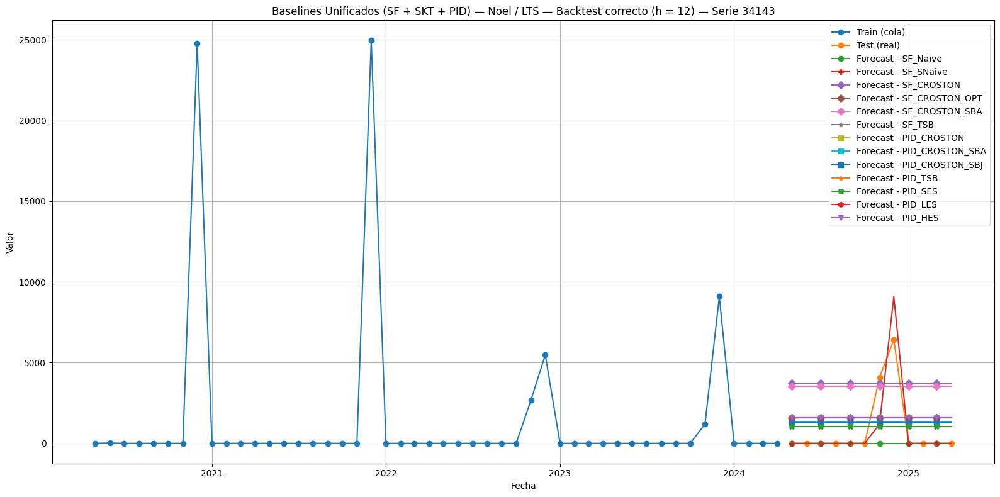

{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12, 'SERIE_ID': '34143'}


metric,model,MAE,sMAPE
0,PID_CROSTON,1932.648880,184.052980
1,PID_CROSTON_SBA,1773.951628,185.924639
2,PID_CROSTON_SBJ,1745.946231,186.269833
3,PID_HES,1932.648880,184.052980
4,PID_LES,1932.648880,184.052980
5,PID_SES,1563.133070,188.643627
6,PID_TSB,1572.789021,188.512747
7,SF_CROSTON,3355.875703,171.858628
8,SF_CROSTON_OPT,1932.657502,184.052882
9,SF_CROSTON_SBA,3231.815277,172.679024



Tabla MAE_mean:


,model,MAE_1_mean,MAE_2_mean,MAE_3_mean,MAE_4_mean,MAE_5_mean,MAE_6_mean,MAE_7_mean,MAE_8_mean,MAE_9_mean,MAE_10_mean,MAE_11_mean,MAE_12_mean
0,PID_CROSTON,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
1,PID_CROSTON_SBA,1348.926642,1348.926642,1348.926642,1348.926642,1348.926642,1348.926642,2728.073358,5070.079761,1348.926642,1348.926642,1348.926642,1348.926642
2,PID_CROSTON_SBJ,1306.918546,1306.918546,1306.918546,1306.918546,1306.918546,1306.918546,2770.081454,5112.087857,1306.918546,1306.918546,1306.918546,1306.918546
3,PID_HES,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
4,PID_LES,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
5,PID_SES,1032.698805,1032.698805,1032.698805,1032.698805,1032.698805,1032.698805,3044.301195,5386.307597,1032.698805,1032.698805,1032.698805,1032.698805
6,PID_TSB,1047.182731,1047.182731,1047.182731,1047.182731,1047.182731,1047.182731,3029.817269,5371.823672,1047.182731,1047.182731,1047.182731,1047.182731
7,SF_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
8,SF_CROSTON_OPT,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,2490.014547,4832.020949,1586.985453,1586.985453,1586.985453,1586.985453
9,SF_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116



Tabla MAE_sum:


,model,MAE_1_sum,MAE_2_sum,MAE_3_sum,MAE_4_sum,MAE_5_sum,MAE_6_sum,MAE_7_sum,MAE_8_sum,MAE_9_sum,MAE_10_sum,MAE_11_sum,MAE_12_sum
0,PID_CROSTON,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
1,PID_CROSTON_SBA,1348.926642,1348.926642,1348.926642,1348.926642,1348.926642,1348.926642,2728.073358,5070.079761,1348.926642,1348.926642,1348.926642,1348.926642
2,PID_CROSTON_SBJ,1306.918546,1306.918546,1306.918546,1306.918546,1306.918546,1306.918546,2770.081454,5112.087857,1306.918546,1306.918546,1306.918546,1306.918546
3,PID_HES,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
4,PID_LES,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,1586.972520,2490.027480,4832.033883,1586.972520,1586.972520,1586.972520,1586.972520
5,PID_SES,1032.698805,1032.698805,1032.698805,1032.698805,1032.698805,1032.698805,3044.301195,5386.307597,1032.698805,1032.698805,1032.698805,1032.698805
6,PID_TSB,1047.182731,1047.182731,1047.182731,1047.182731,1047.182731,1047.182731,3029.817269,5371.823672,1047.182731,1047.182731,1047.182731,1047.182731
7,SF_CROSTON,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,3721.812754,355.187246,2697.193649,3721.812754,3721.812754,3721.812754,3721.812754
8,SF_CROSTON_OPT,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,1586.985453,2490.014547,4832.020949,1586.985453,1586.985453,1586.985453,1586.985453
9,SF_CROSTON_SBA,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,3535.722116,541.277884,2883.284287,3535.722116,3535.722116,3535.722116,3535.722116



Tabla sMAPE_mean:


,model,sMAPE_1_mean,sMAPE_2_mean,sMAPE_3_mean,sMAPE_4_mean,sMAPE_5_mean,sMAPE_6_mean,sMAPE_7_mean,sMAPE_8_mean,sMAPE_9_mean,sMAPE_10_mean,sMAPE_11_mean,sMAPE_12_mean
0,PID_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
1,PID_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,100.556957,130.538709,200.0,200.0,200.0,200.0
2,PID_CROSTON_SBJ,200.0,200.0,200.0,200.0,200.0,200.0,102.902057,132.335944,200.0,200.0,200.0,200.0
3,PID_HES,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
4,PID_LES,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
5,PID_SES,200.0,200.0,200.0,200.0,200.0,200.0,119.157755,144.565772,200.0,200.0,200.0,200.0
6,PID_TSB,200.0,200.0,200.0,200.0,200.0,200.0,118.255629,143.897337,200.0,200.0,200.0,200.0
7,SF_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
8,SF_CROSTON_OPT,200.0,200.0,200.0,200.0,200.0,200.0,87.924468,120.710114,200.0,200.0,200.0,200.0
9,SF_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0



Tabla sMAPE_sum:


,model,sMAPE_1_sum,sMAPE_2_sum,sMAPE_3_sum,sMAPE_4_sum,sMAPE_5_sum,sMAPE_6_sum,sMAPE_7_sum,sMAPE_8_sum,sMAPE_9_sum,sMAPE_10_sum,sMAPE_11_sum,sMAPE_12_sum
0,PID_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
1,PID_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,100.556957,130.538709,200.0,200.0,200.0,200.0
2,PID_CROSTON_SBJ,200.0,200.0,200.0,200.0,200.0,200.0,102.902057,132.335944,200.0,200.0,200.0,200.0
3,PID_HES,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
4,PID_LES,200.0,200.0,200.0,200.0,200.0,200.0,87.925126,120.710632,200.0,200.0,200.0,200.0
5,PID_SES,200.0,200.0,200.0,200.0,200.0,200.0,119.157755,144.565772,200.0,200.0,200.0,200.0
6,PID_TSB,200.0,200.0,200.0,200.0,200.0,200.0,118.255629,143.897337,200.0,200.0,200.0,200.0
7,SF_CROSTON,200.0,200.0,200.0,200.0,200.0,200.0,9.108752,53.194788,200.0,200.0,200.0,200.0
8,SF_CROSTON_OPT,200.0,200.0,200.0,200.0,200.0,200.0,87.924468,120.710114,200.0,200.0,200.0,200.0
9,SF_CROSTON_SBA,200.0,200.0,200.0,200.0,200.0,200.0,14.220351,57.927934,200.0,200.0,200.0,200.0


In [ ]:
# EJEMPLO DE USO + TABLAS
# 1) Elegir subset y normalizar
DF_NAME = 'df_Noel_LTS_h12'
df_sub  = Noel_ddff[DF_NAME].copy()

comp_all, overall_all, steps_all, overall_tbl, step_tbls, ctx = run_all_baselines_single_series(df                 = df_sub,
                                                                                                DF_NAME            = DF_NAME,
                                                                                                SERIE_ID           = '34143',
                                                                                                include_skt        = False,
                                                                                                movavg_window      = 12,
                                                                                                include_sf_croston = True,
                                                                                                include_pid        = True,
                                                                                                alpha              = 0.3,
                                                                                                beta               = 0.3,
                                                                                                plot               = True)

print(ctx)
display(build_overall_table(overall_all))

tablas = build_step_tables(steps_all, H=ctx['H'], metrics=None, aggs=('mean','sum'))
for k, t in tablas.items():
    print(f"\nTabla {k}:")
    display(t)

**¿Qué nos queda y cómo encaja con el runner/orquestador?**

Estos scripts ya **no dependen de** `globals()`, usan el **subset** `df` elegido desde el `ddff`, y **producen salidas estandarizadas** (`metrics_overall`, `metrics_by_step`, tablas anchas y Excel).

En el **runner** (holdout por ahora), haremos:
1. Iterar `Noel_ddff`/`Varma_ddff`,
2. Parsear `H` del nombre.
3. Para **cada serie** del subset: correr SF/SKT (y luego PID), aplicar predicciones y calcular métricas **agregadas por serie** y **por paso**.

El siguiente paso será portar estas piezas a funciones del **registry** y que el **runner** devuelva un **DataFrame largo** con `unique_id, ds, step, y_true, y_pred, model_key`, sobre el que construiremos las **tres tablas** automáticamente.

Si quieres, pasamos ahora a añadir **PID (pyInterDemand)** con el mismo patrón (`PID_CROSTON`, `PID_SBA`, `PID_SBJ`, `PID_TSB`, `PID_ADIDA`) o integramos ya **registry + runner** usando estas funciones para generalizar a todas las series del subset.

# RESUMEN EJECUTIVO - CIERRE DE ESTADÍSTICOS Y PREPARACIÓN PARA ML

## Estado Actual

- Datos preparados: series validadas y clasificadas (STS, ETS, ITS, LTS), con subconjuntos por cliente-tip-horizonte (H = 3/6/12).
- Backtesting: holdout fijo (últimos H) sin fuga.
- Modelos ya integrados:
     - Naive y SeasonalNaive (StatsForecast)
     - Drift y Moving Average (SKTime)
     - CrostonClassic, CrostonOptimized, SBA (StatsForecast)
     - Croston, SBA, SBJ, TSB, HES, LES, SES (pyInterDemand)
- Salidas: Gráfica única y tablas (promedio global y por paso) comparables entre modelos.

## Qué añadir ahora y por qué:

1. ETS y AutoETS (StatsForecast):
     - Para series regulares (Smooth/Erratic/Continuous) con estacionalidad mensual.
     - Por qué: benchmarks sólidos cuando hay tendencia/estacionalidad. Evitar formas multiplicativas si hay ceros.

2. ARIMA/SARIMA y AutoARIMA:
     - Para capturar autocorrelación/estacionalidad (S = 12) en series no intermitentes.
     - Por qué: referencia clásica, complementa ETS. Usar log1p/Box-Cox y volver a escala original.

3. ADIDA (Aggregate-Disaggregate)
     - Para Intermittent/Lumpy.
     - Por qué: reduce intermitencia agregando, algunos clientes lo prefieren. Se presume que mejora a Croston en Lumpy.

## Ejecución selectiva (Eficiencia y Robustez)

El motivo es reducir coste computacional, evitar modelos inadecuados (p. ej., multiplicativo con ceros) y mejorar comparabilidad.

- Smooth (STS): Naive, SNaive, AutoETS, AutoARIMA, MovAvg.
- Erratic (ETS): Naive, SNaive, MovAvg, AutoETS (aditivo), AutoARIMA, ADIDA.
- Intermittent/Lumpy (ITS/LTS): Croston/SBA/SBJ/TSB (PID y SF), ADIDA, Naive (evitar AutoETS/AutoARIMA salvo densidad suficiente).

## Estrategias de Ventana (mismo H)

- Expanding (recomendada): el train crece -> refleja operación real; favorece AutoETS/AutoARIMA.
- Rolling: Ventana fija deslizante -> Mide adaptabilidad/robustez.
- Mixta: Arranque Expanding + Rolling.
- Regla: min_train_size >= 3xH (y >= 24 puntos si H = 12 para ARIMA)

## Métricas y ranking

- Mantener MAE y sMAPE; añadir MASE/RMSSE cuando calculemos divisores in-sample (mejor comparabilidad entre series).
- Reportes listos:
     - Global por horizonte (ranking claro por modelo).
     - Por paso (media y suma) para ver degradación dentro de H.

## Salvaguardas clave

- No negatividad: clip ≥0 en todas las predicciones (coherencia con demanda).
- Multiplicativo: desactivar si hay ceros.
- Transformaciones: evaluar en escala original tras back-transform con corrección.
- Fallbacks: si AutoETS/AutoARIMA no convergen → SNaive.

## Integración en el orquestador

- Añadir registry: SF_AUTOETS, SF_AUTOARIMA, ADIDA_* (S=12, transform opcional, no multiplicativo en ITS/LTS).
- Activar eligibility matrix por demand_code y horizonte.
- Reutilizar generador de splits (expanding/rolling/mixto).
- Las salidas caerán en la gráfica y tablas unificadas existentes.

## Roadmap breve

1. Definir y activar eligibility matrix.
2. Integrar AutoETS/AutoARIMA con salvaguardas/transform.
3. Añadir ADIDA para ITS/LTS.
4. Validar con 1–2 series por tipo y H=3/6/12 (expanding).
5. Probar rolling en subset (sensibilidad).
6. Generar rankings por horizonte y “campeón por SKU”.
7. Siguiente fase: ML (global models con lags/zero-inflated) reaprovechando el mismo framework de splits y métricas.

---

# MODELOS ESTADÍSTICOS CONTINUOS

Ahora toca incorporar ETS/AutoETS/ARIMA/AutoARIMA para cubrir series continuas (con o sin estacionalidad) y completar el espectro de modelos estadísticos.

1) Elegibilidad por tipo de demanda

- STS/ETS (regulares y erráticas no tan esparsas): habilitar ETS/AutoETS y (S)ARIMA/AutoARIMA (S=12 en mensual).
- ITS/LTS (intermitentes): mantener Croston/TSB/ADIDA como primarios. Permitir ETS/ARIMA solo tras agregación ADIDA o si la densidad de positivos supera un umbral (p.ej., ≥60–70% no ceros).
- CTS: Naive=0 como baseline y cierre.

2) Configuración recomendada

- ETS/AutoETS
     - Empezar con aditivo (error/seasonal/trend) para evitar problemas con ceros.
     - Estacionalidad s=12; forzar no multiplicativo en ITS/LTS.
     - Registrar si el ajuste elige AAN/AAA, etc., para diagnóstico.

- ARIMA/AutoARIMA
     - Usar SARIMA con S=12. Diferenciación estacional automática y D, d mínimos.
     - Limitar p,q,P,Q ≤ 2–3 para controlar coste.
     - Opcional: log1p/Box-Cox con back-transform y corrección de sesgo; desactivar transformación si abundan ceros.

- Post-procesado: clip ≥ 0 siempre.
- Recursos: fijar semillas y límites de tiempo; capturar fallos y aplicar fallback SNaive.

3) Splits/ventanas (reutilizando tu framework)

- Expanding como primera línea (mínimo 3×H y preferible ≥24 obs si H=12).
- Añadir luego rolling en un subconjunto para sensibilidad.
- Guardar por ventana: y_pred/y_true y logs de selección de órdenes (Auto*).

4) Métricas y reporting

- Mantener MAE y sMAPE; preparar MASE/RMSSE cuando calcules divisores in-sample (mejor comparabilidad entre SKUs).
- Tablas existentes valen: global por horizonte + por paso (mean/sum).
- Añadir “campeón por SKU” y “campeón por categoría/horizonte”.

5) Riesgos y salvaguardas

- Sobreajuste en Auto*: limitar espacio de búsqueda y validar con rolling/expanding.
- No convergencia: controlar excepciones y seguir con fallback.
- Multiplicativo con ceros: desactivado por defecto.
- Coste computacional: usar eligibility matrix y muestreos para pruebas.

6) Secuencia sugerida de trabajo

     1. Integrar AutoETS (aditivo) y AutoARIMA (S=12, límites de órdenes) en tu registry con gating por tipo de demanda.
     2. Validar con 1–2 series por STS y ETS en H=3/6/12 (expanding).
     3. Añadir ETS fijo (AAN/AAA) y ARIMA/SARIMA parametrizados como comparadores rápidos.
     4. Ejecutar rolling en un subconjunto para confirmar robustez.
     5. Consolidar rankings y “campeones”; revisar fallos y tiempos.
     6. Con esto, cierras estadísticos y quedas listo para pasar a ML (globales) usando el mismo orquestador.

---

# WRAPPER DE MODELOS CONTINUOS

Se mantienen las funciones parse_df_name(), preprocess_forecast_df(), build_overall_table() y build_step_tables().

In [ ]:
# ======================================================================
# WRAPPER CONTINUOS (ETS / AutoETS / AutoARIMA) – Split holdout único
# ======================================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsforecast import StatsForecast
from statsforecast.models import AutoETS, AutoARIMA # ETS (no-auto) es opcional; ver nota abajo

# ---------- Helpers autocontenidos (borra si ya los tienes en tu notebook) ----------
def parse_df_name(df_name: str) -> dict:
    """
    df_Noel_LTS_h12 -> {'client':'Noel','demand_code':'LTS','demand_name':'Lumpy','H':12}
    """
    m = re.match(r"^df_([^_]+)_([^_]+)_h(\d+)$", df_name)
    if not m:
        raise ValueError(f"Nombre inválido: {df_name}. Esperado: df_{'{cliente}'}_{'{cat}'}_h{'{H}'}")
    client, demand_code, H = m.group(1), m.group(2), int(m.group(3))
    name_map = {'ITS':'Intermittent','LTS':'Lumpy','STS':'Smooth','ETS':'Erratic','CTS':'Continuous'}
    return {'client':client, 'demand_code':demand_code, 'demand_name':name_map.get(demand_code,demand_code), 'H':H}

def preprocess_forecast_df(df: pd.DataFrame) -> pd.DataFrame:
    req = {'unique_id','ds','y'}
    assert req.issubset(df.columns), f"Faltan columnas: {req - set(df.columns)}"
    out = df.copy()
    out['unique_id'] = out['unique_id'].astype(str).str.strip()
    out['ds'] = pd.to_datetime(out['ds'], errors='raise')
    out['y'] = pd.to_numeric(out['y'], errors='coerce').fillna(0.0).astype(float)
    return out.sort_values(['unique_id','ds']).reset_index(drop=True)

def mae(y, yhat) -> float:
    return float(np.mean(np.abs(np.asarray(y) - np.asarray(yhat))))

def rmse(y, yhat) -> float:
    diff = np.asarray(y) - np.asarray(yhat)
    return float(np.sqrt(np.mean(diff**2)))

def smape(y, yhat) -> float:
    y = np.asarray(y); yhat = np.asarray(yhat)
    denom = np.abs(y) + np.abs(yhat)
    with np.errstate(divide='ignore', invalid='ignore'):
        out = np.where(denom == 0, 0.0, 200.0*np.abs(yhat - y)/denom)
    return float(np.nanmean(out))

def build_overall_table(metrics_overall: pd.DataFrame) -> pd.DataFrame:
    req = {'model','metric','value'}
    if not req.issubset(metrics_overall.columns):
        raise ValueError(f'metrics_overall debe contener {req}')
    return metrics_overall.pivot(index='model', columns='metric', values='value').reset_index()

def build_step_tables(metrics_by_step: pd.DataFrame, H: int,
                      metrics: list[str] | None = None,
                      aggs: tuple[str, ...] = ('mean','sum')) -> dict[str, pd.DataFrame]:
    df = metrics_by_step.copy()
    step_col = 'h_step' if 'h_step' in df.columns else ('h_steps' if 'h_steps' in df.columns else None)
    if step_col is None:
        raise ValueError("No se encontró la columna de paso ('h_step' o 'h_steps').")
    metrics_present = sorted(df['metric'].unique().tolist())
    metrics = metrics_present if metrics is None else [m for m in metrics if m in metrics_present]
    aggs_present = sorted(df['agg'].unique().tolist())
    aggs = tuple(a for a in aggs if a in aggs_present)
    out = {}
    for m in metrics:
        for a in aggs:
            sub = df[(df['metric']==m) & (df['agg']==a)][['model', step_col, 'value']]
            wide = sub.pivot(index='model', columns=step_col, values='value')
            wide.columns = [f"{m}_{int(k)}_{a}" for k in wide.columns]
            out[f"{m}_{a}"] = wide.reset_index()
    return out
# ------------------------------------------------------------------------------------

In [ ]:
# CONTINUACIÓN DE WRAPPER
def run_continuous_models_single_series(df:                   pd.DataFrame,
                                        DF_NAME:              str,
                                        SERIE_ID:             str | None = None,
                                        freq:                 str = 'MS',
                                        sp:                   int = 12, # estacionalidad mensual (AutoETS / AutoARIMA)
                                        include_sf_autoets:   bool = True,
                                        include_sf_autoarima: bool = True,
                                        clip_nonneg:          bool = True,
                                        tail_plot:            int = 48,
                                        plot:                 bool = True,
                                        demand_gating:        bool = False): # si True, limita a STS/ETS por defecto
    """
    Ejecuta AutoETS t/o AutoARIMA (StatsForecast) con el MISMO split:
    test = últimos H meses, H inferiod de DF_NAME.
    Devuelve:
        comp_all, metrics_overall, metrics_by_step, tabla_general, tablas_por_metric, ctx
    """

    # 0) Contexto y split
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']

    df = preprocess_forecast_df(df)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].iloc[0]
    s = df[df['unique_id'] == SERIE_ID].sort_values('ds').reset_index(drop = True)
    assert len(s) >= 3 * H, f"La serie {SERIE_ID} tiene {len(s)} puntos; recomendado ≥ {3 * H}."

    train = s.iloc[:-H].copy()
    test = s.iloc[-H:].copy()
    y_true = test['y'].values

    # 1) Selección de modelos SF
    sf_models = []
    name_map = {} # map columna -> nombre normalizado
    if include_sf_autoets:
        if (not demand_gating) or (ctx['demand_code'] in ('STS', 'ETS')):
            sf_models.append(AutoETS(season_length = sp))
            name_map['AutoETS'] = 'SF_AutoETS'

    if include_sf_autoarima:
        if (not demand_gating) or (ctx['demand_code'] in ('STS', 'ETS')):
            sf_models.append(AutoARIMA(season_length = sp))
            name_map['AutoARIMA'] = 'SF_AutoARIMA'
    
    if not sf_models:
        raise ValueError("No hay modelos seleccionados. Activa include_sf_autoets y/o include_sf_autoarima.")
    
    # 2) Entrenar y predecir con StatsForecast (sin leakage)
    sf = StatsForecast(models = sf_models, freq = freq, n_jobs = 1)
    fcst = sf.forecast(h = H, df = train)
    fcst = fcst[fcst['unique_id'] == SERIE_ID].copy()

    # 3) Construir comp_all + métricas
    comp_all = test[['ds', 'y']].copy()
    rows_overall, rows_steps =  [], []

    for c in fcst.columns:
        if c in ('unique_id', 'ds'):
            continue
        model_name = name_map.get(c, f"SF_{c}")
        vals = fcst[c].values
        yhat = np.clip(vals, 0, None) if clip_nonneg else vals
        comp_all[model_name] = yhat

        # Overall
        rows_overall.append({'model': model_name, 'metric': 'MAE',   'value': mae(y_true, yhat)})
        rows_overall.append({'model': model_name, 'metric': 'RMSE',  'value': rmse(y_true, yhat)})
        rows_overall.append({'model': model_name, 'metric': 'sMAPE', 'value': smape(y_true, yhat)})

        # by-step
        abs_err = np.abs(y_true - yhat)
        with np.errstate(divide = 'ignore', invalid = 'ignore'):
            s_err = np.where((np.abs(y_true) + np.abs(yhat)) == 0, 0.0,
                             200.0 * np.abs(yhat - y_true) / (np.abs(y_true) + np.abs(yhat)))
        
        for k in range(1, H + 1):
            rows_steps += [
                {'model': model_name, 'h_step': k, 'metric': 'MAE',   'agg': 'mean', 'value': float(abs_err[k-1])},
                {'model': model_name, 'h_step': k, 'metric': 'MAE',   'agg': 'sum',  'value': float(abs_err[k-1])},
                {'model': model_name, 'h_step': k, 'metric': 'sMAPE', 'agg': 'mean', 'value': float(s_err[k-1])},
                {'model': model_name, 'h_step': k, 'metric': 'sMAPE', 'agg': 'sum',  'value': float(s_err[k-1])},
            ]
    
    metrics_overall = pd.DataFrame(rows_overall)
    metrics_by_step = pd.DataFrame(rows_steps)

    # 4) Tablas anchas
    tabla_general = build_overall_table(metrics_overall)
    tablas_por_metric = build_step_tables(metrics_by_step, H = H, metrics = None, aggs = ('mean', 'sum'))

    # 5) Plot (unificado)
    if plot:
        MARKERS = {'SF_AutoETS':   'x',
                   'SF_AutoARIMA': '^'} # se puede ajustar
        plt.figure(figsize = (16, 8))
        plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot),
                 label = 'Train (cola)', marker = 'o')
        
        plt.plot(test['ds'], test['y'],
                 label = 'Test (real)', marker = 'o')
        
        for col in [c for c in comp_all.columns if c not in ('ds', 'y')]:
            plt.plot(test['ds'], comp_all[col].values,
                     label = f'Forecast - {col}', marker = MARKERS.get(col, 'x'))
            
        ttl = (f'Continuos (SF AutoETS/AutoARIMA) - {ctx["client"]} / {ctx["demand_code"]} '
               f'— Backtest (h = {H}) — Serie {SERIE_ID}')
        plt.title(ttl)
        plt.xlabel('Fecha')
        plt.ylabel('Valor')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_all, metrics_overall, metrics_by_step, tabla_general, tablas_por_metric, ctx
            

## EJEMPLO DE USO (MODELOS ESTADÍSTICOS CONTINUOS)

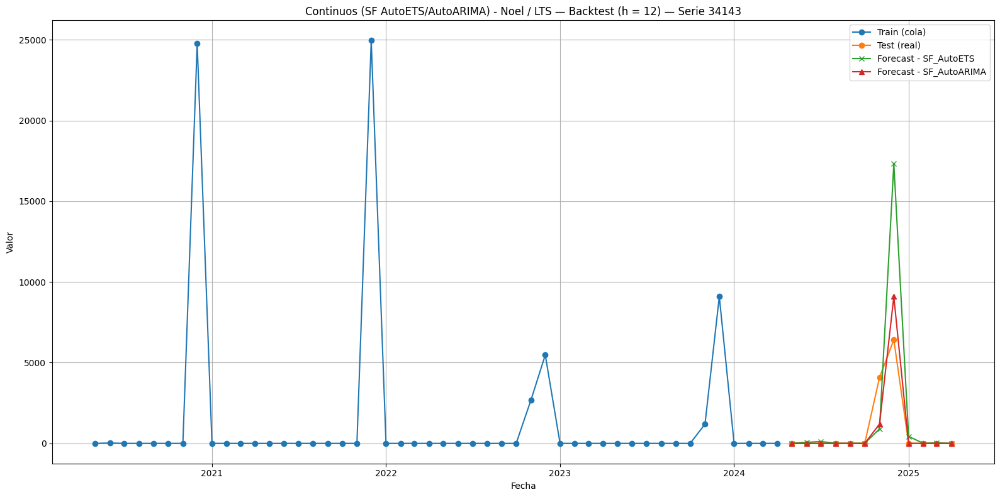

{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12, 'SERIE_ID': '34143'}


metric,model,MAE,RMSE,sMAPE
0,SF_AutoARIMA,463.163592,1135.312994,11.990877
1,SF_AutoETS,1226.830520,3282.109125,101.653813



Tabla MAE_mean:


,model,MAE_1_mean,MAE_2_mean,MAE_3_mean,MAE_4_mean,MAE_5_mean,MAE_6_mean,MAE_7_mean,MAE_8_mean,MAE_9_mean,MAE_10_mean,MAE_11_mean,MAE_12_mean
0,SF_AutoARIMA,0.0,0.000000,0.000000,0.0,0.000000,0.0,2883.265244,2674.697866,0.000000,0.0,0.00000,0.0
1,SF_AutoETS,0.0,61.442447,114.164398,0.0,2.755598,0.0,3181.784873,10906.000771,429.867608,0.0,25.95055,0.0



Tabla MAE_sum:


,model,MAE_1_sum,MAE_2_sum,MAE_3_sum,MAE_4_sum,MAE_5_sum,MAE_6_sum,MAE_7_sum,MAE_8_sum,MAE_9_sum,MAE_10_sum,MAE_11_sum,MAE_12_sum
0,SF_AutoARIMA,0.0,0.000000,0.000000,0.0,0.000000,0.0,2883.265244,2674.697866,0.000000,0.0,0.00000,0.0
1,SF_AutoETS,0.0,61.442447,114.164398,0.0,2.755598,0.0,3181.784873,10906.000771,429.867608,0.0,25.95055,0.0



Tabla sMAPE_mean:


,model,sMAPE_1_mean,sMAPE_2_mean,sMAPE_3_mean,sMAPE_4_mean,sMAPE_5_mean,sMAPE_6_mean,sMAPE_7_mean,sMAPE_8_mean,sMAPE_9_mean,sMAPE_10_mean,sMAPE_11_mean,sMAPE_12_mean
0,SF_AutoARIMA,0.0,0.0,0.0,0.0,0.0,0.0,109.406577,34.483952,0.0,0.0,0.0,0.0
1,SF_AutoETS,0.0,200.0,200.0,0.0,200.0,0.0,127.982591,91.863162,200.0,0.0,200.0,0.0



Tabla sMAPE_sum:


,model,sMAPE_1_sum,sMAPE_2_sum,sMAPE_3_sum,sMAPE_4_sum,sMAPE_5_sum,sMAPE_6_sum,sMAPE_7_sum,sMAPE_8_sum,sMAPE_9_sum,sMAPE_10_sum,sMAPE_11_sum,sMAPE_12_sum
0,SF_AutoARIMA,0.0,0.0,0.0,0.0,0.0,0.0,109.406577,34.483952,0.0,0.0,0.0,0.0
1,SF_AutoETS,0.0,200.0,200.0,0.0,200.0,0.0,127.982591,91.863162,200.0,0.0,200.0,0.0


In [ ]:
# 1) Elige subset (de Noel_ddff/Varma_ddff ya generados) y cópialo
DF_NAME = 'df_Noel_LTS_h12' # o 'df_Noel_ETS_h12', etc. (mejor continuo para estos modelos)
df_sub = Noel_ddff[DF_NAME].copy()

# 2) Ejecuta
comp_c, overall_c, steps_c, tabla_c, tablas_c, ctx_c = run_continuous_models_single_series(df                   = df_sub,
                                                                                           DF_NAME              = DF_NAME,
                                                                                           SERIE_ID             = '34143', # o un ID concreto si quieres
                                                                                           include_sf_autoets   = True,
                                                                                           include_sf_autoarima = True,
                                                                                           sp                   = 12,
                                                                                           demand_gating        = False, # solo STS/ETS por defecto
                                                                                           plot                 = True)

print(ctx_c)
display(tabla_c)
for k, t in tablas_c.items():
    print(f"\nTabla {k}:")
    display(t)

# NOTAS:
# - He dejado gating por defecto (STS/ETS) para priorizar series no intermitentes.
#   Puede desactivarse con demand_gating = False si se quiere probar AutoETS/AutoARIMA en LTS/ITS.
#
# - Si más adelante se quiere añadir ETS(no auto) o SARIMA con órdenes fijos,
#   se encaja con el mismo patrón (añadiendo a sf_models y mapeando nombres).
#
# - Devuelve exactamente 6 objetos como el wrapper de baselines, para que
#   el runner/orquestador trate ambos de forma homogénea.

# INTERPRETACIÓN LIGERA

**AutoARIMA gana a AutoETS** en esta serie LTS (Lumpy):

| MODELO    |  MAE  |  RMSE  | sMAPE |
| --------- | ----- | ------ | ----- |
| AutoARIMA |   463 |  1,135 |  12 % |
| AutoETS   | 1,227 |  3,282 | 102 % |


La **tabla por paso** (MAE_k_mean / sMAPE_k_mean) deja ver **dónde se concentra el error**:
- Para **AutoARIMA** el error se da casi todo en los pasos 7 y 8 (picos de 2.9k y 2.7k).
- Para **AutoETS** hay **pico enorme en paso 8** (MAE ~ 1'.906) y varios pasos con sMAPE = **200%**
  (típica señal de *mismatch* 0 vs > 0 (predice positivo cuando el real es cero, o al revés)).

NOTA: Hay muchos ceros en los primeros pasos porque en demanda intermitente es frecuente que **y_true = 0** y el modelo también pronostique **0**, de ahí el error = 0 y sMAPE = 0 (o indefinido que se trata como 0).

**Lectura Operativa**
- **AutoARIMA** es menos propenso a "sobre-reaccionar" a los picos recientes; AutoETS aquí "se dispara" en el paso 8 (sobrepronóstico fuerte).
- En una serie **LTS** (muchos ceros + picos), los **modelos continuos** (ETS/ARIMA) suelen:
     - Acertar donde el valor real es 0 (porque tambien predicen ~0).
     - **Fallan fuerte** cuando aparece un *pico**; no lo anticipan (subpronóstico) o lo exageran (sobrepronóstico).
- Por eso, para **LTS/ITS** conviene priorizar familia Croston/TSB/ADIDA y usar ETS/ARIMA solo como referencia.

**¿Cómo dedicidir "el mejor" aquí?**
- Por **métrica global** (MAE/RMSE/sMAPE): AutoARIMA > AutoETS.
- Por **perfil por paso**: AutoARIMA tiene errores grandes en 7-8, pero **mucho menores** que AutoETS.
- Conclusión: **Si se requiere un continuo para esta serie**, elegiría **AutoARIMA**; pero para producción en **LTS** seguiría usando **Croston/TSB** como primera línea y dejar **AutoARIMA** como comparador.

**Sobre el sMAPE (200%, 0%, etc.)**
- Los 200% repetidos de AutoETS y algunos ceros suelen venir de **reales cercanos a cero** con **predicción positiva** (o viceversa). Con series con muchos ceros, sMAPE se vuelve muy sensible.
- Para evaluar estabilidad, hay que acompañarlo con MAE/WAPE y, si es posible, con MASE (escala por la estacionalidad).
- No se debe descartar un modelo solo por un sMAPE alto en 1-2 pasos si el MAE "overall" es competitivo.

**¿Qué vigilar antes de generalizar?**
- **Gating por tipo de demanda**: Mantener los continuos (AutoETS/AutoARIMA) **solo para STS/ETS**. Para LTS/ITS usar Croston/TSB/ADIDA. (El wrapper ya lo soporta).
- **Métricas robustas**: Cuando se agreguen series, mirar también **MASE/RMSSE** (si se puede calcular escala in-sample) y **medianas** (win-rate por modelo), no solo promedios.
- **Por paso del horizonte**: Esos picos en 7-8 son muy informativos para planificación (meses con mayor riesgo de error).

---

# MACHINE LEARNING

## ML1. CONSTRUCTOR DE FEATURES Y WRAPPER

Firma compatible con los modelos anteriores: recibe **una sola serie** en formato largo `['unique_id', 'ds', 'y']` (train), `horizon` fijo y devuelve un np.ndarray de longitud H con el forecast. Se puede cambiar el `objective` a `'tweedie'` para la variante Tweedie.

In [ ]:
# =========================
# FEATURES + LGBM DIRECT
# =========================
import numpy as np
import pandas as pd
from typing import Iterable, Tuple, Dict, List
from lightgbm import LGBMRegressor

In [ ]:
# --- helpers de fecha (mensual) ---
def _add_month_cyclical(df: pd.DataFrame, ds_col: str = 'ds') -> pd.DataFrame:
    m = df[ds_col].dt.month.astype(int)
    df['month_sin'] = np.sin(2 * np.pi * m / 12.0)
    df['month_cos'] = np.cos(2 * np.pi * m / 12.0)
    return df

def _since_last_nonzero(y: pd.Series) -> pd.Series:
    # run-length desde el último > 0 (crece con ceros consecutivos)
    out = np.zeros(len(y), dtype = np.int32)
    cnt = 0
    for i, v in enumerate(y.values):
        cnt = 0 if v > 0 else cnt + 1
        out[i] = cnt
    return pd.Series(out, index = y.index, name = 'since_last_nonzero')

def _count_nonzero_last(y: pd.Series, window: int) -> pd.Series:
    return (y.rolling(window, min_periods = 1)
             .apply(lambda a: np.count_nonzero(a), raw = True)
             .rename(f'nonzero_count_{window}'))

In [ ]:
# ==========================================================
# 1) CONSTRUCTOR DE FEATURES BASE PARA UNA SERIE (train)
# ==========================================================
def build_features_single_series(
        s:                     pd.DataFrame,
        lags:                  Iterable[int] = (1, 2, 3, 6, 12),
        roll_windows:          Iterable[int] = (3, 6, 12),
        add_intermit_features: bool = True,
        ds_col:                str = 'ds',
        y_col:                 str = 'y'
) -> pd.DataFrame:
    """
    Devuelve un DataFrame con columnas:
      - ds, y
      - lags: y_lag_{L}
      - rolling (pasado): roll_mean_{W}, roll_std_{W} (usando y.shift(1))
      - calendario: month_sin, month_cos
      - (opcional) intermitencia: since_last_nonzero, nonzero_count_12
    Requiere que 's' sea UNA sola serie y esté ordenada por 'ds'.
    """
    s = s.copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop = True)

    # Lags
    for L in lags:
        s[f'y_lag_{L}'] = s[y_col].shift(L)
    
    # rolling stats PASADO (shift(1) para no ver el valor de t)
    for W in roll_windows:
        s[f'roll_mean_{W}'] = s[y_col].shift(1).rolling(W, min_periods = 1).mean()
        s[f'roll_std_{W}']  = s[y_col].shift(1).rolling(W, min_periods = 1).std(ddof = 0)
    
    # calendario cíclico
    s = _add_month_cyclical(s, ds_col = ds_col)

    # intermitencia (opcional, computada sobre el histórico)
    if add_intermit_features:
        s['since_last_nonzero'] = _since_last_nonzero(s[y_col])
        s['nonzero_count_12']   = _count_nonzero_last(s[y_col], 12)
    
    return s

In [ ]:
# ==========================================================
# 2) DATASET DE ENTRENAMIENTO 1-PASO (para estrategia RECURSIVE)
# ==========================================================
def make_nextstep_training_sets(
    s_feat: pd.DataFrame,
    ds_col: str = 'ds',
    y_col:  str = 'y'
) -> Tuple[pd.DataFrame, np.ndarray]:
    """
    Construye (X_train, y_train) para predecir y_{t+1} con featrues en t.
    El target es y.shift(-1). Se eliminan filas con NaNs en features o target.
    """
    data = s_feat.copy()
    feature_cols = [c for c in data.columns if c not in (ds_col, y_col)]
    data['target_next'] = data[y_col].shift(-1)

    df_tr = data.dropna(subset = feature_cols + ['target_next']).copy()
    X = df_tr[feature_cols]
    y = df_tr['target_next'].values.astype(float)
    return X, y


🔍 Valores nulos en X_train:
y_lag_1                1
y_lag_2                2
y_lag_3                3
y_lag_6                6
y_lag_12              12
roll_mean_3            1
roll_std_3             1
roll_mean_6            1
roll_std_6             1
roll_mean_12           1
roll_std_12            1
month_sin              0
month_cos              0
since_last_nonzero     0
nonzero_count_12       0
dtype: int64

🔍 Varianza de cada columna (debería ser > 0):
nonzero_count_12      3.615385e-01
month_cos             5.030692e-01
month_sin             5.092077e-01
since_last_nonzero    1.074135e+01
roll_std_12           7.380667e+06
roll_mean_12          9.715703e+06
roll_mean_6           1.180841e+07
roll_std_3            1.403121e+07
roll_std_6            1.475596e+07
roll_mean_3           1.529328e+07
y_lag_1               2.765481e+07
y_lag_2               2.805844e+07
y_lag_3               2.847392e+07
y_lag_6               2.939925e+07
y_lag_12              3.247596e+07
dtype: floa

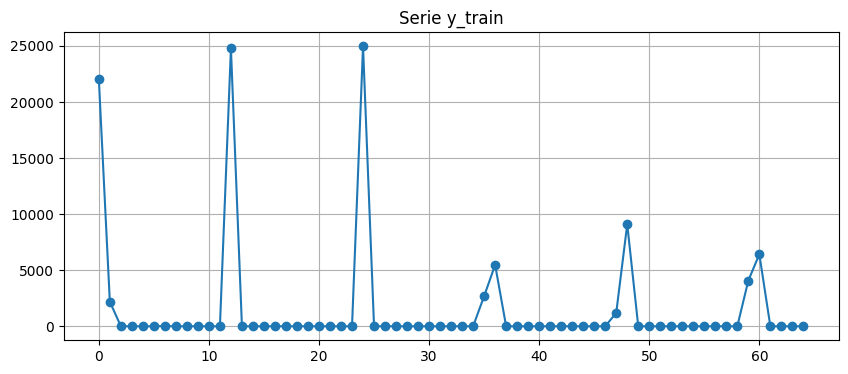

In [ ]:
# SCRIPT DE DIAGNÓSTICO PARA DEBUGGING DEL ENTRENAMIENTO CON LIGHTGBM
import pandas as pd
import numpy as np

# === Extraer la serie que quieres diagnosticar
df_serie = df[df['unique_id'] == '34143'].copy()

# === Construir features como hace el pipeline
df_feat = build_features_single_series(
    df_serie,
    lags = (1, 2, 3, 6, 12),
    roll_windows = (3, 6, 12),
    add_intermit_features = True
)

# === Crear dataset para next-step prediction
X_train = df_feat.drop(columns = ['y', 'ds'])
X_train = X_train.drop(columns = ['unique_id'])

y_train = df_feat['y']

# === Ejecutar el script de diagnóstico
# (el que te pasé antes)

# === 1. Comprobación de valores nulos ===
print("\n🔍 Valores nulos en X_train:")
print(X_train.isna().sum())

print("\n🔍 Varianza de cada columna (debería ser > 0):")
print(X_train.select_dtypes(include = [np.number]).var().sort_values())

print("\📌 Columnas con un único valor:")
for col in X_train.columns:
    if X_train[col].nunique() <= 1:
        print(f"  - {col} → único valor: {X_train[col].iloc[0]}")

# === 3. Distribución de valores distintos de cero ===
print("\n💡 Porcentaje de ceros por columna:")
print((X_train == 0).sum() / len(X_train) * 100)

# === 4. Resumen estadístico general ===
print("\n📊 Estadísticas generales de X_train:")
print(X_train.describe().T)

print("\n🎯 Estadísticas generales de y_train:")
print(y_train.describe())

# === 5. Visualización rápida (opcional)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.plot(y_train.values, marker='o')
plt.title("Serie y_train")
plt.grid(True)
plt.show()


In [ ]:
# ==========================================================
# 3) FEATURES PARA PASOS FUTUROS A PARTIR DE HISTÓRICO (RECURSIVE)
# ==========================================================
def _feature_row_from_history(
        history: List[float],
        future_ds: pd.Timestamp,
        lags: Iterable[int],
        roll_windows: Iterable[int],
        add_intermit_features: bool = True
) -> pd.DataFrame:
    """
    Genera UNA fila de features para el instante futuro (future_ds)
    usando exclusivamente 'history' (valores hasta t0 + k-1).
    """
    row = {}

    # Lags: últimos L valores del history
    n = len(history)
    for L in lags:
        row[f'y_lag_{L}'] = history[-L] if n >= L else np.nan
    
    # Rolling: estadísticas sobre los últimos W del history
    hist_series = pd.Series(history, dtype = float)
    for W in roll_windows:
        tail = hist_series.tail(W)
        row[f'roll_mean_{W}'] = float(tail.mean()) if len(tail) > 0 else np.nan
        row[f'roll_std_{W}']  = float(tail.std(ddof = 0)) if len(tail) > 1 else 0.0
    
    # Intermintencia (opcional) basada en history
    if add_intermit_features:
        # since_last_nonzero = cuántso ceros consecutivos al final
        cnt = 0
        for v in reversed(history):
            if v > 0:
                break
            cnt += 1
        row['since_last_nonzero'] = float(cnt)

        # nonzero_count_12' = nº de no-ceros en las últimas 12 observaciones
        last12 = hist_series.tail(12).to_numpy()
        row['nonzero_count_12'] = float(np.count_nonzero(last12)) if len(last12) > 0 else 0.0

    # Calendario (monthly sin/cos) a partir de future_ds
    m = int(future_ds.month)
    row['month_sin'] = float(np.sin(2 * np.pi * m / 12.0))
    row['month_cos'] = float(np.cos(2 * np.pi * m / 12.0))

    return pd.DataFrame([row])

In [ ]:
from typing import Iterable

def _since_last_nonzero(y: pd.Series) -> pd.Series:
    """Cuenta cuántos pasos han pasado desde el último >0 en cada t."""
    out = np.zeros(len(y), dtype=np.int32)
    cnt = 0
    for i, v in enumerate(y.values):
        cnt = 0 if v > 0 else cnt + 1
        out[i] = cnt
    return pd.Series(out, index=y.index, name='since_last_nonzero')

def _count_nonzero_last(y: pd.Series, window: int) -> pd.Series:
    """Cuenta cuántos valores >0 hay en la ventana deslizante (incluye el punto actual)."""
    return (y.rolling(window, min_periods=1)
             .apply(lambda a: np.count_nonzero(a), raw=True)
             .rename(f'nonzero_count_{window}'))

def make_origin_feature_row(s: pd.DataFrame,
                            lags: Iterable[int] = (1, 2, 3, 6, 12),
                            roll_windows: Iterable[int] = (3, 6, 12),
                            k: int = 1,
                            freq: str = 'MS',
                            ds_col: str = 'ds',
                            y_col: str = 'y',
                            add_intermit_features: bool = True) -> pd.DataFrame:
    """
    Construye UNA fila de features en el origen para predecir t0+k usando el histórico s (ordenado hasta t0).
    - Lags: y_{t0}, y_{t0-1}, ...
    - Rolling: media y std de las últimas W observaciones (hasta t0, o incluyendo predichas si ya se añadieron).
    - Calendario: month_sin/cos de la fecha futura t0+k.
    - Intermitencia: since_last_nonzero, nonzero_count_12 (opcional)
    """
    s = s[[ds_col, y_col]].copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop=True)

    last_ds = s[ds_col].iloc[-1]
    future_ds = last_ds + pd.tseries.frequencies.to_offset(freq) * k

    row = {}

    # Lags (desde el final del histórico disponible)
    n = len(s)
    for L in lags:
        row[f'y_lag_{L}'] = float(s[y_col].iloc[-L]) if n >= L else np.nan

    # Rolling (últimas W observaciones disponibles)
    for W in roll_windows:
        tail = s[y_col].tail(W)
        row[f'roll_mean_{W}'] = float(tail.mean()) if len(tail) > 0 else np.nan
        row[f'roll_std_{W}']  = float(tail.std(ddof=0)) if len(tail) > 1 else 0.0

    # Intermitencia (opcional)
    if add_intermit_features:
        row['since_last_nonzero'] = int(_since_last_nonzero(s[y_col]).iloc[-1])
        row['nonzero_count_12']   = float(_count_nonzero_last(s[y_col], 12).iloc[-1])

    # Calendario para t0+k
    m = int(future_ds.month)
    row['month_sin'] = float(np.sin(2 * np.pi * m / 12.0))
    row['month_cos'] = float(np.cos(2 * np.pi * m / 12.0))

    return pd.DataFrame([row])


In [ ]:
# ==========================================================
# 4) WRAPPER: ML_LGBM_RECURSIVE (un modelo 1-paso, pronóstico H recursivo)
# ==========================================================
from lightgbm import LGBMRegressor

def ML_LGBM_Recursive(train_df:               pd.DataFrame, # UNA sola serie
                      horizon:                int,
                      freq:                   str = 'MS',
                      lags:                   Iterable[int] = (1, 2, 3, 6, 12),
                      roll_windows:           Iterable[int] = (3, 6, 12),
                      add_intermit_features:  bool = True,
                      lgbm_params:            Dict | None = None,
                      objective:              str = 'tweedie', # 'regression' | 'regression_l1' | 'tweedie'
                      tweedie_variance_power: float = 1.5,
                      clip_nonneg:            bool = True) -> np.ndarray:
    """
    Forecast recursivo H pasos con un único modelo LGBM.
    Requiere UNA sola serie (un único unique_id) en train_df.
    """
    assert train_df['unique_id'].nunique() == 1, "Debe ser una sola serie (un unique_id)."

    # 1) Features completas en el histórico
    s_feat = build_features_single_series(
        s                     = train_df,
        lags                  = lags,
        roll_windows          = roll_windows,
        add_intermit_features = add_intermit_features, 
        ds_col                = 'ds',
        y_col                 = 'y'
    )
    
    # 2) Selección de columnas de entrada (solo numéricas) y limpieza de NaN
    #    Excluye 'ds', 'y' y 'unique_id' de las features
    feat_cols = [c for c in s_feat.columns if c not in ('ds', 'y', 'unique_id')]
    # Mantener solo filas completamente definidas para esas features y el target
    Xy = s_feat[feat_cols + ['y']].dropna(subset = feat_cols + ['y']).copy()

    X_train = Xy[feat_cols].astype(float)
    y_train = Xy['y'].astype(float).values

    # 3) Parámetros por defecto de LGBM
    if lgbm_params is None:
        lgbm_params = dict(n_estimators = 600,
                           learning_rate = 0.05,
                           num_leaves = 31,
                           subsample = 0.9,
                           colsample_bytree = 0.9,
                           reg_alpha = 0.0,
                           reg_lambda = 0.0,
                           random_state = 123)

    model = LGBMRegressor(objective = objective, **lgbm_params)
    if objective == 'tweedie':
        model.set_params(tweedie_variance_power = tweedie_variance_power)

    # 4) Entrenar
    model.fit(X_train, y_train)

    # 5) Forecast recursivo H pasos
    preds = np.zeros(horizon, dtype = float)

    # Copia mutable del histórico para ir "inyectando" predicciones como últimas observaciones
    s_cur = train_df[['ds', 'y']].copy().sort_values('ds').reset_index(drop = True)

    for k in range(1, horizon + 1):
        # Fila de features en el origen para el paso k, basada en s_cur
        X_row = make_origin_feature_row(s = s_cur,
                                        lags = lags,
                                        roll_windows = roll_windows,
                                        k = k,
                                        freq = freq,
                                        ds_col = 'ds',
                                        y_col = 'y',
                                        add_intermit_features = add_intermit_features)

        # Asegurar el MISMO orden/espacio de columnas que el entrenamiento
        X_row = X_row.reindex(columns = feat_cols).astype(float)
        # Si quedara algún NaN (no debería si la serie cumple lags mínimos), lo llenamos con 0.0
        if X_row.isna().any(axis = None):
            X_row = X_row.fillna(0.0)

        yhat = float(model.predict(X_row)[0])
        yhat = max(0.0, yhat) if clip_nonneg else yhat
        preds[k - 1] = yhat

        # Inyectar la predicción como última observación para que afecte a lags/rolling de pasos siguientes
        # Avanzamos una fecha mensual y añadimos como si fuese observado (estrategia recursive)
        last_ds = s_cur['ds'].iloc[-1]
        next_ds = last_ds + pd.tseries.frequencies.to_offset(freq)
        s_cur = pd.concat([s_cur, pd.DataFrame({'ds': [next_ds], 'y': [yhat]})], ignore_index = True)

    return preds

**Notas clave:**
- **Recursive**: solo **un modelo 1-paso**; para `k = 2..H` usa **sus propias predicciones** para recalcular lags/rolling/intermitencia.
- **Sin fuga**: las features del paso `k` se calculan con **history** hasta `t+k-1` (no ve el futuro).
- **Tweedie**: se usa como **objetivo de entrenamiento** (no es métrica). Evalúa siempre con tus métricas (MAE, RMSE, sMAPE).
- **CTS vs. ITS/LTS/ETS/STS**: se puede setear `objective = 'regression'` o `'tweedie'` desde el orquestador según la categoría; este wrapper no fuerza nada.

Ideas para elegir y validar features:
- Empezar simple (lags 1/2/3/6/12 + roll_mean/std 3/6/12 + mes sin/cos)
- Añadir intermitencia si la categoría es ITS/LTS/ETS/STS (mejoras claras)
- Evaluar por ventanas (expanding/rolling) y mirar importancia promedio (gain) y permutación por grupo de features. Si roll_std_12 nunca aporta y es inestable entre ventanas, eliminar.
- Evitar leakage: todas las features deben poder calcularse en t sin usar futuro.
- Si más adelantes se incluyen regresores exógenos (calendario, precios, promos, etc.), aplicar el mismo control de leakage (solo info conocida en t).

El siguiente paso es montar el registry y la ruta en el runner para ML_LGBM_Direct y ML_LGBM_Direct_Tweedie.

---

INTEGRACIÓN ML EN RUNNER

In [ ]:
# ==========================================================
# INTEGRACIÓN ML (LGBM - RECURSIVE) EN ORQUESTADOR
# Contrato de salida:
#  - comp_all: DataFrame con ds, y (test) + columna del modelo ML
#  - metrics_overall: ['model','metric','value']
#  - metrics_by_step: ['model','h_step','metric','agg','value']
#  - tabla_general: pivot (filas=model, cols=métricas)
#  - tablas_por_metric: dict {<metric_agg>: df ancho por paso}
#  - ctx: {'client','demand_code','demand_name','H','SERIE_ID'}
# ==========================================================
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Dict, Iterable

In [ ]:
# ---- (si ya los tienes definidos, puedes omitir/reusar los tuyos) ----
def parse_df_name(df_name: str) -> Dict[str, object]:
    """
    df_{cliente}_{SIGLA}_h{H} -> {'client','demand_code','demand_name','H'}
    """
    m = re.match(r"^df_([^_]+)_(ITS|LTS|STS|ETS|CTS)_h(\d+)$", df_name)
    if not m:
        raise ValueError(f"Nombre inválido: {df_name}")
    client, code, H = m.groups()
    demand_map = {'ITS':'Intermittent',
                  'LTS':'Lumpy',
                  'STS':'Smooth',
                  'ETS':'Erratic',
                  'CTS':'Continuous'}
    return {'client': client, 'demand_code': code, 'demand_name': demand_map.get(code, code), 'H': int(H)}

def preprocess_forecast_df(df: pd.DataFrame) -> pd.DataFrame:
    required = {'unique_id','ds','y'}
    assert required.issubset(df.columns), f"Faltan columnas: {required - set(df.columns)}"
    out = df.copy()
    out['unique_id'] = out['unique_id'].astype(str).str.strip()
    out['ds']        = pd.to_datetime(out['ds'], errors = 'raise')
    out['y']         = pd.to_numeric(out['y'], errors = 'coerce').fillna(0.).astype(float)
    return out.sort_values(['unique_id','ds']).reset_index(drop=True)

def mae(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    return float(np.mean(np.abs(y - yhat)))

def rmse(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    return float(np.sqrt(np.mean((y - yhat)**2)))

def smape(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    denom = np.abs(y) + np.abs(yhat)
    num   = 200.0 * np.abs(y - yhat)
    out   = np.where(denom == 0.0, 0.0, num / denom)
    return float(np.mean(out))

def build_overall_table(metrics_overall: pd.DataFrame) -> pd.DataFrame:
    req = {'model','metric','value'}
    if not req.issubset(metrics_overall.columns):
        raise ValueError(f"metrics_overall debe contener {req}")
    return metrics_overall.pivot(index = 'model', columns = 'metric', values = 'value').reset_index()

def build_step_tables(metrics_by_step: pd.DataFrame, H: int,
                      metrics: list[str] | None = None,
                      aggs: tuple[str, ...] = ('mean','sum')) -> dict[str, pd.DataFrame]:
    df = metrics_by_step.copy()
    step_col = 'h_step' if 'h_step' in df.columns else ('h_steps' if 'h_steps' in df.columns else None)
    if step_col is None:
        raise ValueError("metrics_by_step requiere 'h_step' o 'h_steps'")
    metrics_present = sorted(df['metric'].unique().tolist())
    metrics = metrics_present if metrics is None else [m for m in metrics if m in metrics_present]
    aggs_present = sorted(df['agg'].unique().tolist())
    aggs = tuple(a for a in aggs if a in aggs_present)

    out = {}
    for m in metrics:
        for a in aggs:
            sub  = df[(df['metric'] == m) & (df['agg'] == a)][['model', step_col, 'value']]
            wide = sub.pivot(index = 'model', columns = step_col, values = 'value')
            wide.columns = [f"{m}_{int(k)}_{a}" for k in wide.columns]
            out[f"{m}_{a}"] = wide.reset_index()
    return out
# ----------------------------------------------------------------------

In [ ]:
# (Asegurarse de tener importado ML_LGBM_Recursive del paso anterior)
# from your_module import ML_LGBM_Recursive

def run_ml_lgbm_recursive_single_series(
        df:                     pd.DataFrame,
        DF_NAME:                str,
        SERIE_ID:               str | None = None,
        freq:                   str = 'MS',
        lags:                   Iterable[int] = (1, 2, 3, 6, 12),
        roll_windows:           Iterable[int] = (3, 6, 12),
        add_intermit_features:  bool = True,
        objective:              str = 'tweedie', # 'regression' | 'regression_l1' | 'tweedie'
        tweedie_variance_power: float = 1.5,
        lgbm_params:            Dict | None = None,
        clip_nonneg:            bool = True,
        tail_plot:              int = 48,
        plot:                   bool = True,
        model_label:            str | None = None # si None, se infiere del objective
):
    """
    Integra ML_LGBM_Recursive en el orquestador con el mismo contrato.
    """

    # 1) Contexto + Preprocesado + Selección de serie
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']

    df = preprocess_forecast_df(df)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].astype(str).iloc[0]
    s = df[df['unique_id'].astype(str) == SERIE_ID].sort_values('ds').reset_index(drop = True)
    assert len(s) >= max(max(lags), max(roll_windows), 2) + 1, "Serie demasiado corta para las features."

    # 2) Split: último H como test
    train = s.iloc[:-H].copy()
    test  = s.iloc[-H:].copy()

    # 3) Forecast ML (estrategia recursiva)
    y_pred = ML_LGBM_Recursive(
        train_df               = train,
        horizon                = H,
        freq                   = freq,
        lags                   = lags,
        roll_windows           = roll_windows,
        add_intermit_features  = add_intermit_features,
        lgbm_params            = lgbm_params,
        objective              = objective,
        tweedie_variance_power = tweedie_variance_power,
        clip_nonneg            = clip_nonneg
    )

    # 4) Compilación resultados (comp_all)
    mdl = model_label or ('ML_LGBM_REC_TWD' if objective == 'tweedie' else 'ML_LGBM_REC')
    comp_all = test[['ds', 'y']].copy()
    comp_all[mdl] = y_pred

    # 5) Métricas -> overall + by_step
    y_true = comp_all['y'].values
    yhat = comp_all[mdl].values

    rows_overall = [
        {'model': mdl, 'metric': 'MAE',   'value': mae(y_true, yhat)},
        {'model': mdl, 'metric': 'RMSE',  'value': rmse(y_true, yhat)},
        {'model': mdl, 'metric': 'sMAPE', 'value': smape(y_true, yhat)},
    ]
    metrics_overall = pd.DataFrame(rows_overall)

    abs_err = np.abs(y_true - yhat)
    s_err = np.where((np.abs(y_true) + np.abs(yhat)) == 0, 0.0, 200.0 * np.abs(yhat - y_true) / (np.abs(y_true) + np.abs(yhat)))

    rows_steps = []
    for k in range(1, H + 1):
        rows_steps += [
            {'model': mdl, 'h_step':k, 'metric':'MAE',   'agg':'mean', 'value': float(abs_err[k-1])},
            {'model': mdl, 'h_step':k, 'metric':'MAE',   'agg':'sum',  'value': float(abs_err[k-1])},
            {'model': mdl, 'h_step':k, 'metric':'RMSE',  'agg':'mean', 'value': float((abs_err[k-1]**2)**0.5)}, # mismo valor; útil al agregar
            {'model': mdl, 'h_step':k, 'metric':'RMSE',  'agg':'sum',  'value': float((abs_err[k-1]**2)**0.5)},
            {'model': mdl, 'h_step':k, 'metric':'sMAPE', 'agg':'mean', 'value': float(s_err[k-1])},
            {'model': mdl, 'h_step':k, 'metric':'sMAPE', 'agg':'sum',  'value': float(s_err[k-1])},
        ]
    metrics_by_step = pd.DataFrame(rows_steps)

    # 6) Tablas listas para reporting
    tabla_general     = build_overall_table(metrics_overall)
    tablas_por_metric = build_step_tables(metrics_by_step, 
                                          H = H, 
                                          metrics = None, 
                                          aggs = ('mean', 'sum'))

    # 7) Plot (opcional)
    if plot:
        plt.figure(figsize = (16, 8))
        plt.plot(train['ds'].tail(tail_plot),
                 train['y'].tail(tail_plot),
                 label = 'Train (cola)',
                 marker = 'o')
        plt.plot(test['ds'],
                 test['y'],
                 label = 'Test (real)',
                 marker = 'o')
        plt.plot(test['ds'],
                 comp_all[mdl].values,
                 label = f'Forecast - {mdl}',
                 marker = '^')  # marcador distinto para ML
        ttl = (f"ML (LGBM Recursive) — {ctx['client']} / {ctx['demand_code']} "
               f"— h = {H} — Serie {SERIE_ID}")
        plt.title(ttl)
        plt.xlabel('Fecha')
        plt.ylabel('Valor')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_all, metrics_overall, metrics_by_step, tabla_general, tablas_por_metric, ctx

In [ ]:
print(X_train.describe().T)
print(X_train.isna()sum())

SyntaxError: invalid syntax. Perhaps you forgot a comma? (1256180466.py, line 2)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 41, number of used features: 0
[LightGBM] [Info] Start training from score 7,416450
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

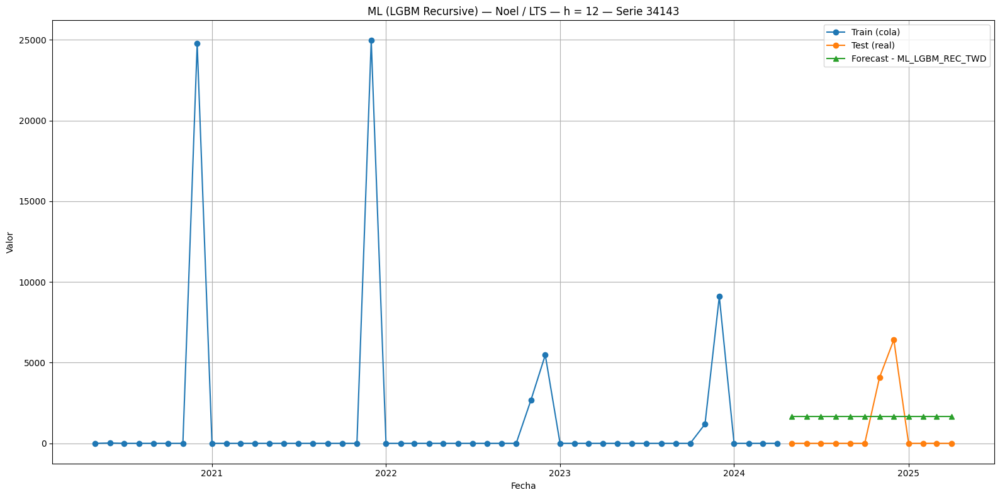

{'client': 'Noel', 'demand_code': 'LTS', 'demand_name': 'Lumpy', 'H': 12, 'SERIE_ID': '34143'}


metric,model,MAE,RMSE,sMAPE
0,ML_LGBM_REC_TWD,1983.413467,2162.270067,183.482883



Tabla MAE_mean:


,model,MAE_1_mean,MAE_2_mean,MAE_3_mean,MAE_4_mean,MAE_5_mean,MAE_6_mean,MAE_7_mean,MAE_8_mean,MAE_9_mean,MAE_10_mean,MAE_11_mean,MAE_12_mean
0,ML_LGBM_REC_TWD,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,2413.8806,4755.887003,1663.1194,1663.1194,1663.1194,1663.1194



Tabla MAE_sum:


,model,MAE_1_sum,MAE_2_sum,MAE_3_sum,MAE_4_sum,MAE_5_sum,MAE_6_sum,MAE_7_sum,MAE_8_sum,MAE_9_sum,MAE_10_sum,MAE_11_sum,MAE_12_sum
0,ML_LGBM_REC_TWD,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,2413.8806,4755.887003,1663.1194,1663.1194,1663.1194,1663.1194



Tabla RMSE_mean:


,model,RMSE_1_mean,RMSE_2_mean,RMSE_3_mean,RMSE_4_mean,RMSE_5_mean,RMSE_6_mean,RMSE_7_mean,RMSE_8_mean,RMSE_9_mean,RMSE_10_mean,RMSE_11_mean,RMSE_12_mean
0,ML_LGBM_REC_TWD,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,2413.8806,4755.887003,1663.1194,1663.1194,1663.1194,1663.1194



Tabla RMSE_sum:


,model,RMSE_1_sum,RMSE_2_sum,RMSE_3_sum,RMSE_4_sum,RMSE_5_sum,RMSE_6_sum,RMSE_7_sum,RMSE_8_sum,RMSE_9_sum,RMSE_10_sum,RMSE_11_sum,RMSE_12_sum
0,ML_LGBM_REC_TWD,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,1663.1194,2413.8806,4755.887003,1663.1194,1663.1194,1663.1194,1663.1194



Tabla sMAPE_mean:


,model,sMAPE_1_mean,sMAPE_2_mean,sMAPE_3_mean,sMAPE_4_mean,sMAPE_5_mean,sMAPE_6_mean,sMAPE_7_mean,sMAPE_8_mean,sMAPE_9_mean,sMAPE_10_mean,sMAPE_11_mean,sMAPE_12_mean
0,ML_LGBM_REC_TWD,200.0,200.0,200.0,200.0,200.0,200.0,84.105588,117.689012,200.0,200.0,200.0,200.0



Tabla sMAPE_sum:


,model,sMAPE_1_sum,sMAPE_2_sum,sMAPE_3_sum,sMAPE_4_sum,sMAPE_5_sum,sMAPE_6_sum,sMAPE_7_sum,sMAPE_8_sum,sMAPE_9_sum,sMAPE_10_sum,sMAPE_11_sum,sMAPE_12_sum
0,ML_LGBM_REC_TWD,200.0,200.0,200.0,200.0,200.0,200.0,84.105588,117.689012,200.0,200.0,200.0,200.0


In [ ]:
# EJEMPLO DE USO RÁPIDO (MISMO ESTILO QUE BASELINES ANTERIORES)
# 1) Elegir subset y normalizar
DF_NAME = 'df_Noel_LTS_h12'
df_sub  = Noel_ddff[DF_NAME].copy()

# 2) Ejecutar ML LGBM (estrategia recursive) con un solo split holdout
comp_ml, overall_ml, steps_ml, tbl_ml, step_tables_ml, ctx_ml = run_ml_lgbm_recursive_single_series(
    df = df_sub,
    DF_NAME = DF_NAME,
    SERIE_ID = '34143',
    objective = 'tweedie',
    tweedie_variance_power = 1.3,
    lags = (1, 2, 3, 6, 12),
    roll_windows = (3, 6, 12),
    add_intermit_features = True,
    lgbm_params = {'n_estimators' : 800,
                   'learning_rate': 0.05,
                   'random_state' : 42},
    plot = True
)

print(ctx_ml)
display(tbl_ml)
for k, t in step_tables_ml.items():
    print(f"\nTabla {k}:")
    display(t)


In [ ]:
# ML LGBM RECURSIVE COMPLETO Y ROBUSTO PARA SERIES INTERMITENTES + VISUALIZACIÓN Y BASELINE

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from typing import Iterable, Tuple, Dict, List
from lightgbm import LGBMRegressor

# ============================
# Helpers intermitencia y fecha
# ============================
def _add_month_cyclical(df: pd.DataFrame, ds_col: str = 'ds') -> pd.DataFrame:
    m = df[ds_col].dt.month.astype(int)
    df['month_sin'] = np.sin(2 * np.pi * m / 12.0)
    df['month_cos'] = np.cos(2 * np.pi * m / 12.0)
    return df

def _since_last_nonzero(y: pd.Series) -> pd.Series:
    out = np.zeros(len(y), dtype = np.int32)
    cnt = 0
    for i, v in enumerate(y.values):
        cnt = 0 if v > 0 else cnt + 1
        out[i] = cnt
    return pd.Series(out, index = y.index, name = 'since_last_nonzero')

def _count_nonzero_last(y: pd.Series, window: int) -> pd.Series:
    return (y.rolling(window, min_periods = 1)
             .apply(lambda a: np.count_nonzero(a), raw = True)
             .rename(f'nonzero_count_{window}'))

# ============================
# Métricas
# ============================
def mae(y, yhat): return float(np.mean(np.abs(np.asarray(y) - np.asarray(yhat))))
def rmse(y, yhat): return float(np.sqrt(np.mean((np.asarray(y) - np.asarray(yhat))**2)))
def smape(y, yhat):
    y = np.asarray(y); yhat = np.asarray(yhat)
    denom = np.abs(y) + np.abs(yhat)
    num = 200.0 * np.abs(y - yhat)
    return float(np.mean(np.where(denom == 0.0, 0.0, num / denom)))

def naive_last_forecast(series: pd.Series, H: int) -> np.ndarray:
    last_val = series.dropna().iloc[-1]
    return np.full(H, last_val, dtype = float)

# ============================
# Features base por serie
# ============================
def build_features_single_series(s: pd.DataFrame,
                                 lags: Iterable[int] = (1, 2, 3, 6, 12),
                                 roll_windows: Iterable[int] = (3, 6, 12),
                                 add_intermit_features: bool = True,
                                 ds_col: str = 'ds', y_col: str = 'y') -> pd.DataFrame:
    s = s.copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop=True)
    for L in lags:
        s[f'y_lag_{L}'] = s[y_col].shift(L)
    for W in roll_windows:
        s[f'roll_mean_{W}'] = s[y_col].shift(1).rolling(W, min_periods=1).mean()
        s[f'roll_std_{W}'] = s[y_col].shift(1).rolling(W, min_periods=1).std(ddof=0)
    s = _add_month_cyclical(s, ds_col)
    if add_intermit_features:
        s['since_last_nonzero'] = _since_last_nonzero(s[y_col])
        s['nonzero_count_12'] = _count_nonzero_last(s[y_col], 12)
    return s.dropna().reset_index(drop=True)

# ============================
# Forecast recursive
# ============================
def make_origin_feature_row(s: pd.DataFrame, lags: Iterable[int], roll_windows: Iterable[int], k: int,
                             freq: str, ds_col: str = 'ds', y_col: str = 'y',
                             add_intermit_features: bool = True) -> pd.DataFrame:
    s = s[[ds_col, y_col]].copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop=True)
    last_ds = s[ds_col].iloc[-1]
    future_ds = last_ds + pd.tseries.frequencies.to_offset(freq) * k
    row = {}
    n = len(s)
    for L in lags:
        row[f'y_lag_{L}'] = float(s[y_col].iloc[-L]) if n >= L else np.nan
    for W in roll_windows:
        tail = s[y_col].tail(W)
        row[f'roll_mean_{W}'] = float(tail.mean()) if len(tail) > 0 else np.nan
        row[f'roll_std_{W}'] = float(tail.std(ddof=0)) if len(tail) > 1 else 0.0
    if add_intermit_features:
        row['since_last_nonzero'] = int(_since_last_nonzero(s[y_col]).iloc[-1])
        row['nonzero_count_12'] = float(_count_nonzero_last(s[y_col], 12).iloc[-1])
    m = int(future_ds.month)
    row['month_sin'] = float(np.sin(2 * np.pi * m / 12.0))
    row['month_cos'] = float(np.cos(2 * np.pi * m / 12.0))
    return pd.DataFrame([row])

# ============================
# Modelo principal + orquestador
# ============================
def run_ml_lgbm_recursive_single_series(df: pd.DataFrame, DF_NAME: str,
                                        SERIE_ID: str | None = None,
                                        freq: str = 'MS',
                                        lags: Iterable[int] = (1, 2, 3, 6, 12),
                                        roll_windows: Iterable[int] = (3, 6, 12),
                                        add_intermit_features: bool = True,
                                        objective: str = 'tweedie',
                                        tweedie_variance_power: float = 1.5,
                                        lgbm_params: Dict | None = None,
                                        clip_nonneg: bool = True,
                                        tail_plot: int = 48,
                                        plot: bool = True,
                                        model_label: str | None = None):

    def parse_df_name(df_name: str) -> Dict[str, object]:
        m = re.match(r"^df_([^_]+)_(ITS|LTS|STS|ETS|CTS)_h(\d+)$", df_name)
        if not m:
            raise ValueError(f"Nombre inválido: {df_name}")
        client, code, H = m.groups()
        demand_map = {'ITS':'Intermittent','LTS':'Lumpy','STS':'Smooth','ETS':'Erratic','CTS':'Continuous'}
        return {'client': client, 'demand_code': code, 'demand_name': demand_map.get(code, code), 'H': int(H)}

    def preprocess_forecast_df(df: pd.DataFrame) -> pd.DataFrame:
        required = {'unique_id','ds','y'}
        assert required.issubset(df.columns)
        out = df.copy()
        out['unique_id'] = out['unique_id'].astype(str).str.strip()
        out['ds'] = pd.to_datetime(out['ds'], errors = 'raise')
        out['y'] = pd.to_numeric(out['y'], errors = 'coerce').fillna(0.).astype(float)
        return out.sort_values(['unique_id','ds']).reset_index(drop=True)

    def ML_LGBM_Recursive(train_df: pd.DataFrame, horizon: int) -> np.ndarray:
        s_feat = build_features_single_series(train_df, lags, roll_windows, add_intermit_features)
        feat_cols = [c for c in s_feat.columns if c not in ('ds', 'y', 'unique_id')]
        Xy = s_feat[feat_cols + ['y']].dropna(subset = feat_cols + ['y']).copy()
        X_train = Xy[feat_cols].astype(float)
        y_train = Xy['y'].astype(float).values
        if lgbm_params is None:
            params = dict(n_estimators=600, learning_rate=0.05, num_leaves=31,
                          subsample=0.9, colsample_bytree=0.9, reg_alpha=0.0,
                          reg_lambda=0.0, random_state=123)
        else:
            params = lgbm_params.copy()
        model = LGBMRegressor(objective=objective, **params)
        if objective == 'tweedie':
            model.set_params(tweedie_variance_power=tweedie_variance_power)
        model.fit(X_train, y_train)

        preds = np.zeros(horizon)
        s_cur = train_df[['ds', 'y']].copy().sort_values('ds').reset_index(drop=True)
        for k in range(1, horizon + 1):
            X_row = make_origin_feature_row(s_cur, lags, roll_windows, k, freq, 'ds', 'y', add_intermit_features)
            X_row = X_row.reindex(columns=feat_cols).astype(float).fillna(0.0)
            yhat = float(model.predict(X_row)[0])
            yhat = max(0.0, yhat) if clip_nonneg else yhat
            preds[k - 1] = yhat
            next_ds = s_cur['ds'].iloc[-1] + pd.tseries.frequencies.to_offset(freq)
            s_cur = pd.concat([s_cur, pd.DataFrame({'ds': [next_ds], 'y': [yhat]})], ignore_index=True)
        return preds

    ctx = parse_df_name(DF_NAME)
    H = ctx['H']
    df = preprocess_forecast_df(df)
    if SERIE_ID is None:
        SERIE_ID = df['unique_id'].astype(str).iloc[0]
    s = df[df['unique_id'].astype(str) == SERIE_ID].sort_values('ds').reset_index(drop=True)
    train = s.iloc[:-H].copy()
    test = s.iloc[-H:].copy()

    y_pred = ML_LGBM_Recursive(train_df=train, horizon=H)

    mdl = model_label or ('ML_LGBM_REC_TWD' if objective == 'tweedie' else 'ML_LGBM_REC')
    comp_all = test[['ds', 'y']].copy()
    comp_all[mdl] = y_pred

    y_true, yhat = comp_all['y'].values, comp_all[mdl].values
    metrics_overall = pd.DataFrame([
        {'model': mdl, 'metric': 'MAE', 'value': mae(y_true, yhat)},
        {'model': mdl, 'metric': 'RMSE', 'value': rmse(y_true, yhat)},
        {'model': mdl, 'metric': 'sMAPE', 'value': smape(y_true, yhat)},
    ])

    # Comparativa con baseline
    y_naive = naive_last_forecast(train['y'], H)
    metrics_naive = pd.DataFrame([
        {'model': 'NaiveLast', 'metric': 'MAE', 'value': mae(test['y'], y_naive)},
        {'model': 'NaiveLast', 'metric': 'RMSE', 'value': rmse(test['y'], y_naive)},
        {'model': 'NaiveLast', 'metric': 'sMAPE', 'value': smape(test['y'], y_naive)},
    ])

    # Visualización
    if plot:
        plt.figure(figsize=(14, 6))
        plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot), label='Train', marker='o')
        plt.plot(test['ds'], test['y'], label='Test', marker='o')
        plt.plot(test['ds'], y_pred, label='ML Forecast', marker='^')
        plt.plot(test['ds'], y_naive, label='Naive Forecast', linestyle='--', marker='x')
        plt.title(f"Forecast Comparison — {SERIE_ID} — h={H}")
        plt.xlabel('Fecha'); plt.ylabel('Valor')
        plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

    print("\n🧠 Contexto de la ejecución:")
    print(ctx)
    print("\n📈 Métricas ML:")
    print(metrics_overall)
    print("\n📉 Baseline (Naive):")
    print(metrics_naive)

    ctx.update({'SERIE_ID': SERIE_ID})
    return comp_all, metrics_overall, ctx


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 21, number of used features: 0
[LightGBM] [Info] Start training from score 7,481153
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_21032\3075006208.py:41: RuntimeWarning: invalid value encountered in divide
  return float(np.mean(np.where(denom == 0.0, 0.0, num / denom)))


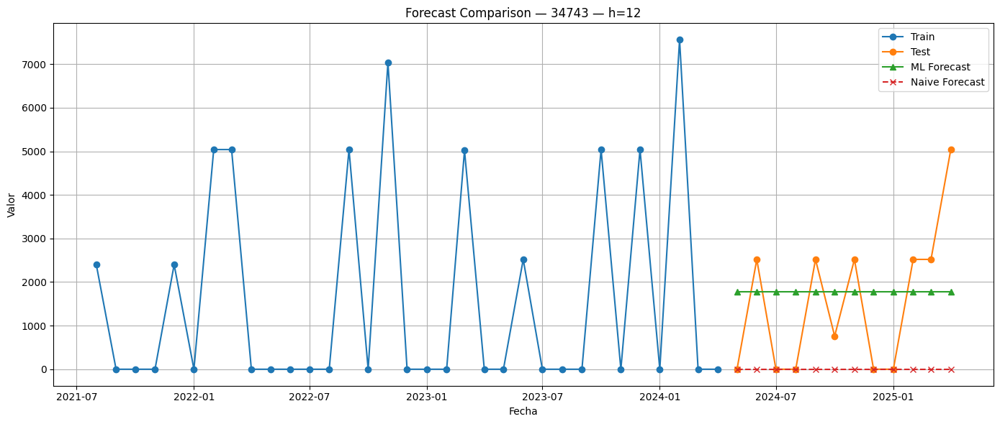


🧠 Contexto de la ejecución:
{'client': 'Noel', 'demand_code': 'ITS', 'demand_name': 'Intermittent', 'H': 12}

📈 Métricas ML:
             model metric        value
0  ML_LGBM_REC_TWD    MAE  1406.666667
1  ML_LGBM_REC_TWD   RMSE  1586.782995
2  ML_LGBM_REC_TWD  sMAPE   112.462237

📉 Baseline (Naive):
       model metric        value
0  NaiveLast    MAE  1533.333333
1  NaiveLast   RMSE  2193.383991
2  NaiveLast  sMAPE   116.666667


In [ ]:
# VISUALIZACIÓN DE RESULTADOS
DF_NAME = 'df_Noel_ITS_h12'
df_sub  = Noel_ddff[DF_NAME].copy()

comp_ml, metrics_ml, ctx_ml = run_ml_lgbm_recursive_single_series(
    df = df_sub,
    DF_NAME = DF_NAME,
    SERIE_ID = '34743',
    objective = 'tweedie',
    tweedie_variance_power = 1.3,
    lags = (1, 2, 3, 6, 12),
    roll_windows = (3, 6, 12),
    add_intermit_features = True,
    lgbm_params = {'n_estimators': 800, 'learning_rate': 0.05, 'random_state': 42},
    plot = True
)


# FASE DE MACHINE LEARNING (DOS ETAPAS) - CLASIFICADOR + REGRESOR

Aquí se tiene un pipeline completo y autocontenido para demanda intermitente con estrategia de dos etapas (Clasificador + Regresor) y soporte XGBoost, RandomForest y SVR.

Está listo para multi-serie, con split por serie (últimos H al test), features (lags, rolling, calendario, rasgos de intermitencia), forecast recursivo y métricas (MAE, RMSE, sMAPE).

Incluye utilidades para ploteo de varias series.

In [ ]:
# ============================================================
# DEMANDA INTERMITENTE — CLASIFICADOR + REGRESOR (MULTI-SERIE)
# Soporta: XGBoost / LightGBM / RandomForest / SVR
# Autor: tú :)  |  Idioma: ES (España)
# ============================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Dict, List, Optional

# Modelos
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Opcionales (si no los tienes instalados, usa otras opciones)
try:
    from xgboost import XGBClassifier, XGBRegressor
    _HAS_XGB = True
except Exception:
    _HAS_XGB = False

try:
    from lightgbm import LGBMClassifier, LGBMRegressor
    _HAS_LGBM = True
except Exception:
    _HAS_LGBM = False


# =============================
# 0) HELPERS BÁSICOS
# =============================

def parse_df_name(df_name: str) -> Dict[str, object]:
    """
    df_{cliente}_{SIGLA}_h{H} -> {'client','demand_code','demand_name','H'}
    """
    m = re.match(r"^df_([^_]+)_(ITS|LTS|STS|ETS|CTS)_h(\d+)$", df_name)
    if not m:
        raise ValueError(f"Nombre inválido: {df_name}")
    client, code, H = m.groups()
    demand_map = {'ITS':'Intermittent', 'LTS':'Lumpy', 'STS':'Smooth', 'ETS':'Erratic', 'CTS':'Continuous'}
    return {'client': client, 'demand_code': code, 'demand_name': demand_map.get(code, code), 'H': int(H)}

def preprocess_forecast_df(df: pd.DataFrame) -> pd.DataFrame:
    required = {'unique_id','ds','y'}
    assert required.issubset(df.columns), f"Faltan columnas: {required - set(df.columns)}"
    out = df.copy()
    out['unique_id'] = out['unique_id'].astype(str).str.strip()
    out['ds']        = pd.to_datetime(out['ds'], errors = 'raise')
    out['y']         = pd.to_numeric(out['y'], errors = 'coerce').fillna(0.).astype(float)
    return out.sort_values(['unique_id','ds']).reset_index(drop=True)

def mae(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    return float(np.mean(np.abs(y - yhat)))

def rmse(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    return float(np.sqrt(np.mean((y - yhat)**2)))

def smape(y, yhat) -> float:
    y = np.asarray(y, dtype = float)
    yhat = np.asarray(yhat, dtype = float)
    denom = np.abs(y) + np.abs(yhat)
    num   = 200.0 * np.abs(y - yhat)
    out   = np.where(denom == 0.0, 0.0, num / denom)
    return float(np.mean(out))


# =============================
# 1) FEATURE ENGINEERING
# =============================

def _add_month_cyclical(df: pd.DataFrame, ds_col: str = 'ds') -> pd.DataFrame:
    m = df[ds_col].dt.month.astype(int)
    df['month_sin'] = np.sin(2 * np.pi * m / 12.0)
    df['month_cos'] = np.cos(2 * np.pi * m / 12.0)
    return df

def _since_last_nonzero(y: pd.Series) -> pd.Series:
    out = np.zeros(len(y), dtype = np.int32)
    cnt = 0
    for i, v in enumerate(y.values):
        cnt = 0 if v > 0 else cnt + 1
        out[i] = cnt
    return pd.Series(out, index = y.index, name = 'since_last_nonzero')

def _count_nonzero_last(y: pd.Series, window: int) -> pd.Series:
    return (y.rolling(window, min_periods = 1)
             .apply(lambda a: np.count_nonzero(a), raw = True)
             .rename(f'nonzero_count_{window}'))

def build_features_single_series(
        s:                     pd.DataFrame,
        lags:                  Iterable[int] = (1, 2, 3, 6, 12),
        roll_windows:          Iterable[int] = (3, 6, 12),
        add_intermit_features: bool = True,
        ds_col:                str = 'ds',
        y_col:                 str = 'y'
) -> pd.DataFrame:
    s = s.copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop = True)

    for L in lags:
        s[f'y_lag_{L}'] = s[y_col].shift(L)
    for W in roll_windows:
        s[f'roll_mean_{W}'] = s[y_col].shift(1).rolling(W, min_periods = 1).mean()
        s[f'roll_std_{W}']  = s[y_col].shift(1).rolling(W, min_periods = 1).std(ddof = 0)

    s = _add_month_cyclical(s, ds_col = ds_col)

    if add_intermit_features:
        s['since_last_nonzero'] = _since_last_nonzero(s[y_col])
        s['nonzero_count_12']   = _count_nonzero_last(s[y_col], 12)

    return s


# =======================================================
# 2) DATASET 1-PASO (t -> t+1) PARA CLASIFICACIÓN+REGRESIÓN
# =======================================================

def make_nextstep_training_sets_multiseries(
    df:                     pd.DataFrame,
    lags:                   Iterable[int] = (1, 2, 3, 6, 12),
    roll_windows:           Iterable[int] = (3, 6, 12),
    add_intermit_features:  bool = True,
    ds_col:                 str = 'ds',
    y_col:                  str = 'y'
) -> Tuple[pd.DataFrame, pd.Series, pd.Series]:
    """
    Construye un dataset global multiserie con:
      - X: features en t
      - y_reg: y_{t+1}
      - y_cls: 1_{y_{t+1} > 0}
    Se concatena la info de todas las series (manteniendo unique_id para trazabilidad).
    """
    all_chunks = []
    for uid, s in df.groupby('unique_id'):
        s_feat = build_features_single_series(
            s, lags, roll_windows, add_intermit_features, ds_col, y_col
        )
        s_feat['target_next'] = s_feat[y_col].shift(-1)
        s_feat['target_bin']  = (s_feat['target_next'] > 0).astype(int)
        s_feat['unique_id']   = str(uid)

        all_chunks.append(s_feat)

    data = pd.concat(all_chunks, axis=0, ignore_index=True)

    feature_cols = [c for c in data.columns if c not in (ds_col, y_col, 'target_next', 'target_bin', 'unique_id')]
    df_tr = data.dropna(subset = feature_cols + ['target_next']).copy()

    X     = df_tr[feature_cols].astype(float)
    y_reg = df_tr['target_next'].astype(float)
    y_cls = df_tr['target_bin'].astype(int)

    return X, y_reg, y_cls


# ========================================
# 3) MODELOS: CONSTRUCTORES (CLS + REG)
# ========================================

def build_classifier(model: str = 'xgb', random_state: int = 42):
    model = model.lower()
    if model == 'xgb':
        if not _HAS_XGB:
            raise RuntimeError("xgboost no está instalado. Instálalo o usa 'lgbm'/'rf'/'logreg'.")
        return XGBClassifier(
            n_estimators=400, max_depth=4, learning_rate=0.05, subsample=0.9, colsample_bytree=0.9,
            reg_lambda=1.0, random_state=random_state, n_jobs=-1, scale_pos_weight=1.0
        )
    elif model == 'lgbm':
        if not _HAS_LGBM:
            raise RuntimeError("lightgbm no está instalado. Instálalo o usa 'xgb'/'rf'/'logreg'.")
        return LGBMClassifier(
            n_estimators=600, learning_rate=0.05, num_leaves=31, subsample=0.9, colsample_bytree=0.9,
            reg_alpha=0.0, reg_lambda=0.0, random_state=random_state, class_weight='balanced'
        )
    elif model == 'rf':
        return RandomForestClassifier(
            n_estimators=400, max_depth=None, min_samples_leaf=1,
            class_weight='balanced', random_state=random_state, n_jobs=-1
        )
    elif model == 'logreg':
        return LogisticRegression(max_iter=200, class_weight='balanced', n_jobs=None, random_state=random_state)
    else:
        raise ValueError(f"Clasificador no soportado: {model}")

def build_regressor(model: str = 'xgb', random_state: int = 42):
    model = model.lower()
    if model == 'xgb':
        if not _HAS_XGB:
            raise RuntimeError("xgboost no está instalado. Instálalo o usa 'lgbm'/'rf'/'svr'.")
        return XGBRegressor(
            n_estimators=600, max_depth=5, learning_rate=0.05, subsample=0.9, colsample_bytree=0.9,
            reg_lambda=1.0, random_state=random_state, n_jobs=-1
        )
    elif model == 'lgbm':
        if not _HAS_LGBM:
            raise RuntimeError("lightgbm no está instalado. Instálalo o usa 'xgb'/'rf'/'svr'.")
        return LGBMRegressor(
            n_estimators=600, learning_rate=0.05, num_leaves=31, subsample=0.9, colsample_bytree=0.9,
            reg_alpha=0.0, reg_lambda=0.0, random_state=random_state
        )
    elif model == 'rf':
        return RandomForestRegressor(
            n_estimators=500, max_depth=None, min_samples_leaf=1,
            random_state=random_state, n_jobs=-1
        )
    elif model == 'svr':
        # SVR requiere escalado; devolvemos un pipeline
        return Pipeline(steps=[
            ('scaler', StandardScaler(with_mean=True, with_std=True)),
            ('svr', SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale'))
        ])
    else:
        raise ValueError(f"Regresor no soportado: {model}")


# ======================================================
# 4) ENTRENAMIENTO Y FORECAST (RECURSIVO, MULTI-SERIE)
# ======================================================

def make_origin_feature_row(s: pd.DataFrame,
                            lags: Iterable[int] = (1, 2, 3, 6, 12),
                            roll_windows: Iterable[int] = (3, 6, 12),
                            k: int = 1,
                            freq: str = 'MS',
                            ds_col: str = 'ds',
                            y_col: str = 'y',
                            add_intermit_features: bool = True) -> pd.DataFrame:
    s = s[[ds_col, y_col]].copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop=True)

    last_ds = s[ds_col].iloc[-1]
    future_ds = last_ds + pd.tseries.frequencies.to_offset(freq) * k

    row = {}
    n = len(s)
    for L in lags:
        row[f'y_lag_{L}'] = float(s[y_col].iloc[-L]) if n >= L else np.nan

    for W in roll_windows:
        tail = s[y_col].tail(W)
        row[f'roll_mean_{W}'] = float(tail.mean()) if len(tail) > 0 else np.nan
        row[f'roll_std_{W}']  = float(tail.std(ddof=0)) if len(tail) > 1 else 0.0

    if add_intermit_features:
        row['since_last_nonzero'] = int(_since_last_nonzero(s[y_col]).iloc[-1])
        row['nonzero_count_12']   = float(_count_nonzero_last(s[y_col], 12).iloc[-1])

    m = int(future_ds.month)
    row['month_sin'] = float(np.sin(2 * np.pi * m / 12.0))
    row['month_cos'] = float(np.cos(2 * np.pi * m / 12.0))
    return pd.DataFrame([row])

def fit_two_stage_and_forecast_multiseries(
        df:                     pd.DataFrame,
        DF_NAME:                str,
        classifier_model:       str = 'xgb',   # 'xgb'|'lgbm'|'rf'|'logreg'
        regressor_model:        str = 'xgb',   # 'xgb'|'lgbm'|'rf'|'svr'
        freq:                   str = 'MS',
        lags:                   Iterable[int] = (1, 2, 3, 6, 12),
        roll_windows:           Iterable[int] = (3, 6, 12),
        add_intermit_features:  bool = True,
        clip_nonneg:            bool = True,
        random_state:           int  = 42
    ) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Entrena Clasificador + Regresor globales (multiserie) para next-step y
    realiza forecast recursivo de H pasos serie a serie.
    Devuelve:
      - res_all: predicciones por serie (unique_id, h, yhat, y opcional)
      - overall: métricas agregadas
      - steps: métricas por paso
      - manifest: conteos/diagnóstico por serie
    """
    ctx = parse_df_name(DF_NAME)
    H = ctx['H']
    df = preprocess_forecast_df(df)

    # 1) Dataset multiserie para next-step
    X, y_reg, y_cls = make_nextstep_training_sets_multiseries(
        df, lags, roll_windows, add_intermit_features
    )
    feature_cols = X.columns.tolist()

    # 2) Entrenar modelos
    cls = build_classifier(classifier_model, random_state)
    # Tratar de paliar el desbalance: si xgb, ajusta scale_pos_weight ~ ratio negativos/positivos
    if classifier_model == 'xgb' and _HAS_XGB:
        pos = int((y_cls == 1).sum())
        neg = int((y_cls == 0).sum())
        if pos > 0:
            spw = max(1.0, neg / max(1, pos))
            cls.set_params(scale_pos_weight=spw)

    cls.fit(X, y_cls)

    reg = build_regressor(regressor_model, random_state)
    # Entrenamos el regresor SOLO en y > 0 (distribución de magnitudes)
    mask_pos = y_reg > 0
    if mask_pos.sum() == 0:
        raise RuntimeError("No hay ejemplos positivos (y>0) para entrenar el regresor.")
    reg.fit(X[mask_pos], y_reg[mask_pos])

    # 3) Forecast recursivo por serie
    res_rows = []
    manifest = []

    # Chequeo longitud mínima por serie
    min_required = H + max(max(lags), max(roll_windows))

    for uid, s in df.groupby('unique_id'):
        s = s.sort_values('ds').reset_index(drop=True)
        n = len(s)
        if n < min_required:
            manifest.append({'unique_id': uid, 'n_rows': n, 'status': 'too_short'})
            continue

        train = s.iloc[:-H].copy()
        test  = s.iloc[-H:].copy()

        # Recursión
        preds = np.zeros(H, dtype=float)
        s_cur = train[['ds','y']].copy()

        for k in range(1, H+1):
            X_row = make_origin_feature_row(
                s_cur, lags, roll_windows, k=k, freq=freq, add_intermit_features=add_intermit_features
            ).reindex(columns=feature_cols)
            if X_row.isna().any(axis=None):
                X_row = X_row.fillna(0.0)

            p = float(cls.predict_proba(X_row)[0,1]) if hasattr(cls, "predict_proba") else float(cls.decision_function(X_row))
            yhat_pos = float(reg.predict(X_row)[0])
            yhat = p * max(0.0, yhat_pos) if clip_nonneg else p * yhat_pos

            preds[k-1] = yhat

            # inyección recursiva
            last_ds = s_cur['ds'].iloc[-1]
            next_ds = last_ds + pd.tseries.frequencies.to_offset(freq)
            s_cur = pd.concat([s_cur, pd.DataFrame({'ds':[next_ds], 'y':[yhat]})], ignore_index=True)

        # guardar
        for h, yhat in enumerate(preds, start=1):
            # opcionalmente adjuntamos y real si quieres comparar más fácil
            y_real = float(test['y'].iloc[h-1]) if h-1 < len(test) else np.nan
            res_rows.append({'unique_id': uid, 'h': h, 'yhat': float(yhat), 'y': y_real})

        manifest.append({'unique_id': uid, 'n_rows': n, 'status': 'ok'})

    res_all = pd.DataFrame(res_rows).sort_values(['unique_id','h']).reset_index(drop=True)
    manifest = pd.DataFrame(manifest)

    # 4) Métricas globales (solo sobre series OK)
    ok_ids = set(manifest.loc[manifest['status']=='ok','unique_id'])
    res_eval = res_all[res_all['unique_id'].isin(ok_ids)].copy()
    # aseguramos tener y real
    res_eval = res_eval.dropna(subset=['y'])

    overall_rows = []
    steps_rows   = []
    if not res_eval.empty:
        y_true = res_eval['y'].to_numpy()
        y_hat  = res_eval['yhat'].to_numpy()
        overall_rows += [
            {'model':'CLS+REG', 'metric':'MAE',   'value': mae(y_true, y_hat)},
            {'model':'CLS+REG', 'metric':'RMSE',  'value': rmse(y_true, y_hat)},
            {'model':'CLS+REG', 'metric':'sMAPE', 'value': smape(y_true, y_hat)},
        ]
        # por paso
        for h, sub in res_eval.groupby('h'):
            yt = sub['y'].to_numpy()
            yp = sub['yhat'].to_numpy()
            steps_rows += [
                {'model':'CLS+REG', 'h_step':int(h), 'metric':'MAE',   'agg':'mean', 'value': mae(yt, yp)},
                {'model':'CLS+REG', 'h_step':int(h), 'metric':'RMSE',  'agg':'mean', 'value': rmse(yt, yp)},
                {'model':'CLS+REG', 'h_step':int(h), 'metric':'sMAPE', 'agg':'mean', 'value': smape(yt, yp)},
            ]

    overall = pd.DataFrame(overall_rows)
    steps   = pd.DataFrame(steps_rows)

    return res_all, overall, steps, manifest


# =========================================
# 5) PLOTS RÁPIDOS DE VARIAS SERIES (OPC.)
# =========================================

def plot_multiple_series_forecasts(df_all: pd.DataFrame,
                                   df_orig: pd.DataFrame,
                                   DF_NAME: str,
                                   n_series: int = 8,
                                   tail_plot: int = 48,
                                   random_state: int = 42):
    m = re.match(r"^df_([^_]+)_(ITS|LTS|STS|ETS|CTS)_h(\d+)$", DF_NAME)
    if not m:
        raise ValueError("Nombre inválido de DF")
    client, code, H = m.groups()
    H = int(H)

    df_all = df_all.copy()
    df_orig = preprocess_forecast_df(df_orig)

    # intersección
    ids_all  = set(df_all['unique_id'].astype(str))
    ids_orig = set(df_orig['unique_id'].astype(str))
    inter    = sorted(list(ids_all & ids_orig))
    if not inter:
        print("⚠️ No hay intersección de series entre predicciones y origen para plot.")
        print("df_all (ej.):", list(ids_all)[:10])
        print("df_orig(ej.):", list(ids_orig)[:10])
        return

    rng = np.random.default_rng(random_state)
    chosen = list(rng.choice(inter, size=min(n_series, len(inter)), replace=False))

    for sid in chosen:
        s_full = df_orig[df_orig['unique_id'] == sid].sort_values('ds').reset_index(drop=True)
        if len(s_full) < H+2:
            print(f"⚠️ Serie {sid} demasiado corta para plot. Skipping.")
            continue

        train = s_full.iloc[:-H]
        test  = s_full.iloc[-H:]
        pred  = df_all[df_all['unique_id'] == sid].sort_values('h').reset_index(drop=True)

        if len(pred) != len(test):
            print(f"⚠️ Serie {sid} con tamaños inconsistentes: pred={len(pred)} vs test={len(test)}. Skipping.")
            continue

        plt.figure(figsize=(14,5))
        plt.plot(train['ds'].tail(tail_plot), train['y'].tail(tail_plot), label='Train', marker='o')
        plt.plot(test['ds'], test['y'], label='Test (real)', marker='o')
        plt.plot(test['ds'], pred['yhat'], label='Forecast (CLS+REG)', marker='^')
        plt.title(f"Serie {sid} — {client} / {code} — h={H}")
        plt.grid(True); plt.xlabel("Fecha"); plt.ylabel("Demanda"); plt.legend(); plt.tight_layout()
        plt.show()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2567
[LightGBM] [Info] Number of data points in the train set: 1815, number of used features: 15
[LightGBM] [Info] Start training from score 17136,619695
=== OVERALL ===
     model metric         value
0  CLS+REG    MAE   4784.347661
1  CLS+REG   RMSE  12768.657673
2  CLS+REG  sMAPE    169.444850

=== STEPS (head) ===
     model  h_step metric   agg        value
0  CLS+REG       1    MAE  mean  3006.868574
1  CLS+REG       1   RMSE  mean  6806.931318
2  CLS+REG       1  sMAPE  mean   169.230293
3  CLS+REG       2    MAE  mean  3843.733503
4  CLS+REG       2   RMSE  mean  8939.442597

=== MANIFEST (estado series) ===
status
ok    159
Name: count, dtype: int64 



C:\Users\AlejandroLaderasImpe\AppData\Local\Temp\ipykernel_21032\2185210871.py:73: RuntimeWarning: invalid value encountered in divide
  out   = np.where(denom == 0.0, 0.0, num / denom)


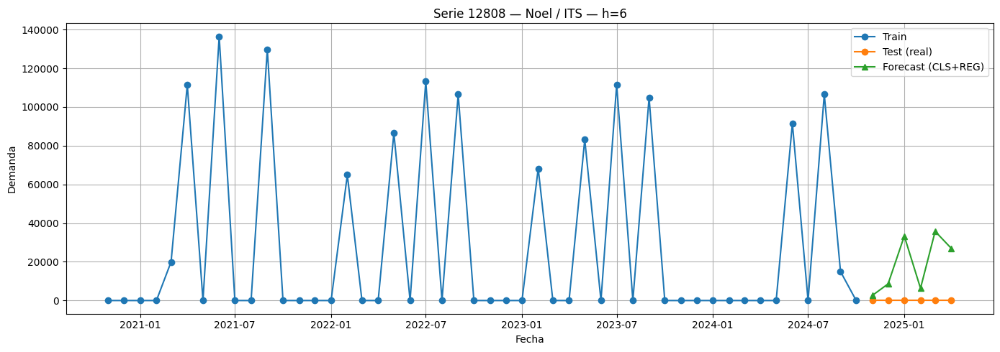

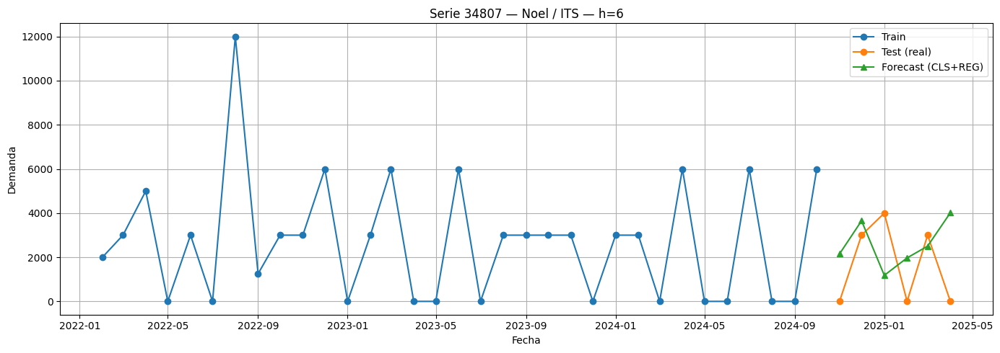

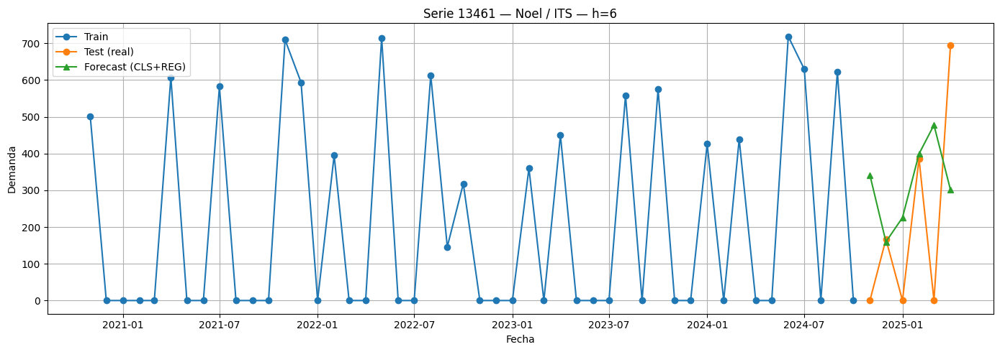

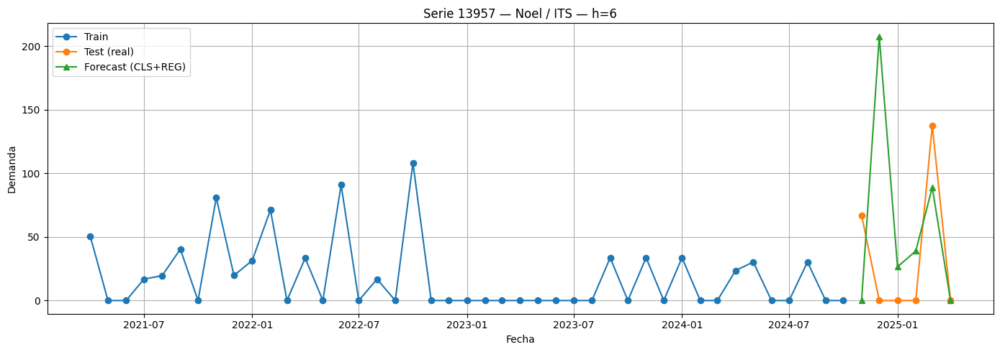

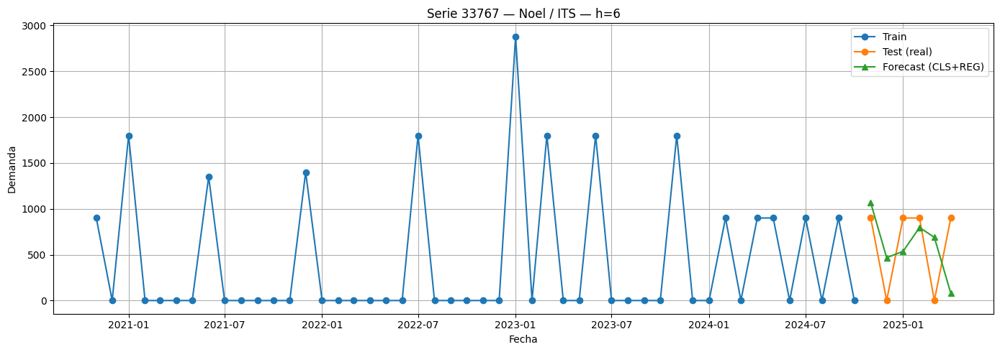

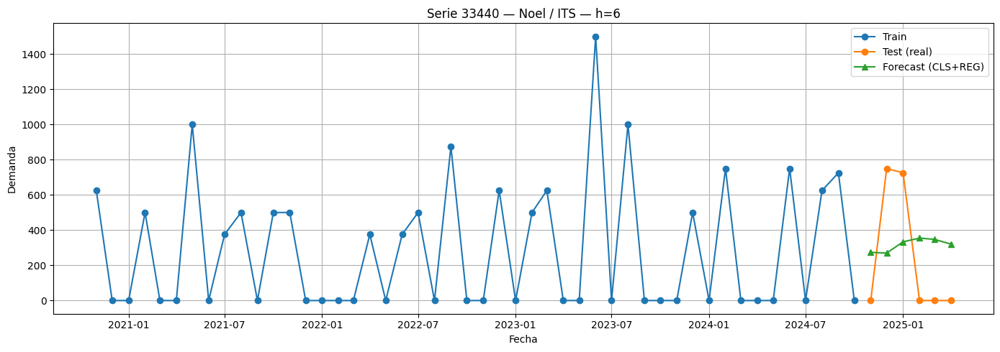

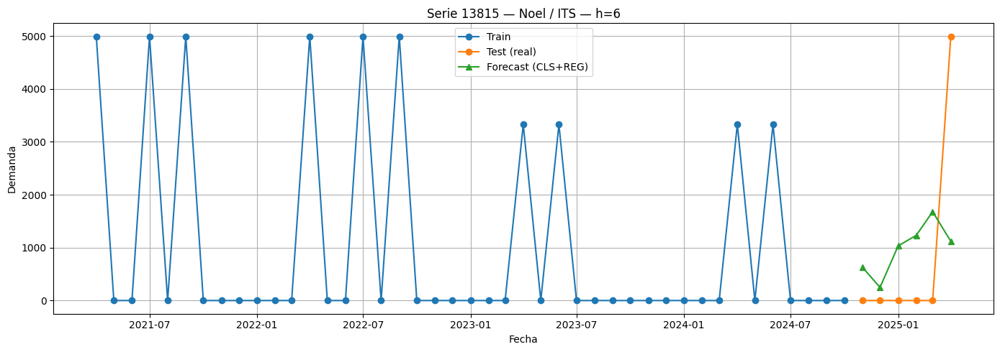

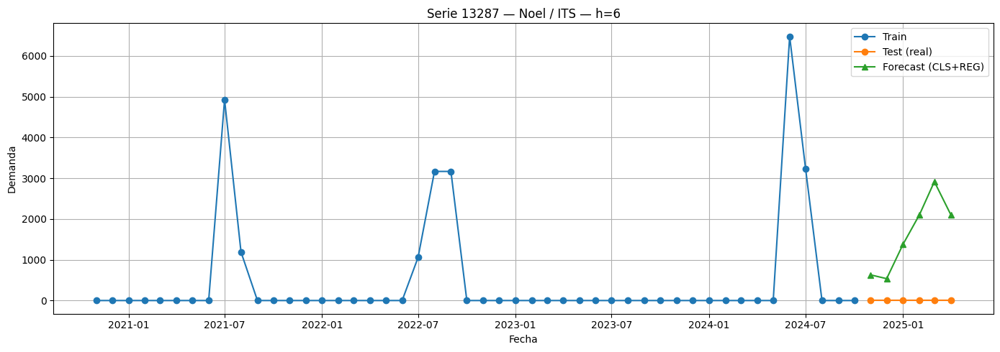

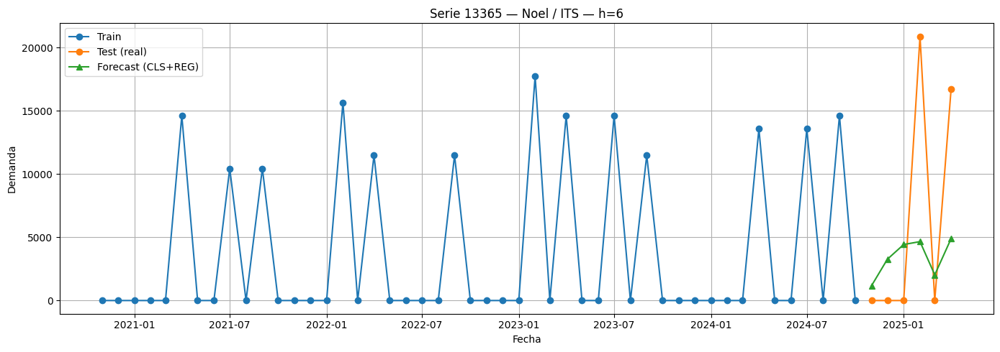

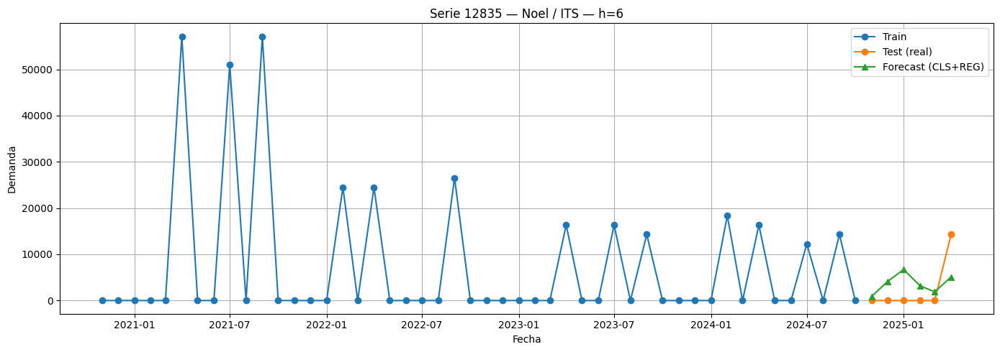

In [ ]:
# ===========================
# Resolver df_sub a partir de DF_NAME de forma robusta
# ===========================
import re
import pandas as pd

def _resolve_df_from_DF_NAME(DF_NAME: str):
    """
    Acepta un DF_NAME tipo 'df_Noel_LTS_h12' y devuelve (df_sub, H).
    Estrategia:
      1) Si existe una variable global EXACTA con ese nombre (df_Noel_LTS_h12), la usa.
      2) Si existe la base sin _h (df_Noel_LTS), la usa.
      3) Si existen diccionarios de categorías (Noel_ddff_cat / Varma_ddff_cat), la busca ahí.
      4) Mensaje claro si no se encuentra.
    """
    m = re.match(r"^(df_[A-Za-z0-9]+_(ITS|LTS|STS|ETS|CTS))_h(\d+)$", DF_NAME)
    if not m:
        raise ValueError(f"DF_NAME inválido: {DF_NAME}. Esperado p.ej. 'df_Noel_LTS_h12'")
    base_name, _, H = m.groups()
    H = int(H)

    g = globals()

    # 1) ¿Existe la variable exacta con horizonte?
    if DF_NAME in g and isinstance(g[DF_NAME], pd.DataFrame):
        df_sub = g[DF_NAME].copy()
        return df_sub, H

    # 2) ¿Existe la base sin horizonte?
    if base_name in g and isinstance(g[base_name], pd.DataFrame):
        df_sub = g[base_name].copy()
        return df_sub, H

    # 3) ¿Existen diccionarios de categorías?
    #    Ej.: Noel_ddff_cat['df_Noel_LTS'] o Varma_ddff_cat['df_Varma_LTS']
    for dict_name in ('Noel_ddff_cat', 'Varma_ddff_cat'):
        if dict_name in g and isinstance(g[dict_name], dict):
            dd = g[dict_name]
            if base_name in dd and isinstance(dd[base_name], pd.DataFrame):
                df_sub = dd[base_name].copy()
                return df_sub, H

    # 4) Nada encontrado
    raise NameError(
        f"No se ha encontrado un DataFrame para '{DF_NAME}'. "
        f"Comprueba que exista una variable '{DF_NAME}' o '{base_name}', "
        f"o que '{base_name}' esté en Noel_ddff_cat/Varma_ddff_cat."
    )

# ===========================
# 6) EJEMPLO DE USO RÁPIDO (sin NameError)
# ===========================
DF_NAME = 'df_Noel_ITS_h6'  # ajústalo si quieres
df_sub, H = _resolve_df_from_DF_NAME(DF_NAME)

# Entrenar y pronosticar
res_all, overall, steps, manifest = fit_two_stage_and_forecast_multiseries(
    df = df_sub,
    DF_NAME = DF_NAME,
    classifier_model = 'xgb',   # 'xgb' | 'lgbm' | 'rf' | 'logreg'
    regressor_model  = 'lgbm',   # 'xgb' | 'lgbm' | 'rf' | 'svr'
    lags = (1,2,3,6,12),
    roll_windows = (3,6,12)
)

print("=== OVERALL ===")
print(overall)
print("\n=== STEPS (head) ===")
print(steps.head())
print("\n=== MANIFEST (estado series) ===")
print(manifest['status'].value_counts(), "\n")

# Plots de muestra (usa el mismo df_sub resuelto arriba)
plot_multiple_series_forecasts(res_all, df_sub, DF_NAME, n_series=10, tail_plot=48, random_state=123)


Los resultados actuales parecen muy pobres, pero no es necesariamente que el modelo sea malo, es un reflejo de lo difícil que es el forecasting de demanda intermitente. Justo lo que se observa también en la tesis de Meerashine Joe (Halmstad Univ.) y otros artículos que hemos utilizado.

- Los modelos de regresión estándar (RF, XGB, LSTM, etc.) suelen fallas en captruar los ceros largos y los picos: tienden a prededecir valores promedio o "aplanados". En los experimentos, muchos modelos ML daban errores de validación mayores que los de entrenamiento y peor que un simple Croston.

- SVM y redes neuronales fueron los mejores en regresión, pero aun así con errores relativamente altos y tendencia a sobreajuste.

- En clasificación (ocurrencia de demanda), tanto SVM como NN daban entre 70% y 90% de acierto al distinguir ceros vs. no-ceros, algo más robusto que la regresión pura.

- Croston segúia siendo muy competitivo, en muchos casos con menor error que ML clásico.

- La gran contribución de la tesis fue un modelo híbrido (ensemble tipo stacking): combinaban Croston + NN + SVM, y las predicciones alimentaban un meta-modelo. Eso redujo en torno a un 6% el error frente al mejor modelo individual.

- También introdujeron intervalos de confianza al 95%, lo que ayudó a interpretar y usar los resultados en inventario (stock de seguridad).

Cómo intepretar estos números:
- El sMAPE ~177% indica que el modelo está prediciendo bastante mal en presencia de ceros. Justamente, las métricas estándar (MAE, RMSE, sMAPE) penalizan mucho el desequilibrio (muchos ceros vs. pocos picos). En la tesis, propusieron usar un Average Per Year Error (APE) que reduce ese sesgo.

- El aptrón que se ve en los plots (predicciones pegadas a cero o incapaces de capturar picos) es normal. No es un bug: es una limitación de ML "plano".

Qué hacer a continuación? (siguiendo la literatura y lo que ya planteaste):
1. Comparar con baselines estadísticos (Croston, SBA, TSB, ARIMA Simple). Es imprescindible para saber si CLS + REG realmente aporta.
2. Probar distintos clasificadores/regresores: además de XGB, testear RF y SVR como está propuesto (ya están bien documentados como alternativas útiles en este contexto).
3. Reformular la métrica de evaluación: probar el APE anual o métricas adaptadas a intermitencia, no solo MAE/RMSE/sMAPE.
4. Explorar híbridos tipo stacking: combinar Croston (o TSB) con un ML (XGB/NN/SVR), tal como en la tesis, suele mejorar.
5. Balance de clases en la parte clasificadora: asegúrate de usar class_weight = "balanced" (o equivaente) para que no se sesgue hacia ceros.

PROPUESTAS
- Entrenar también RF y SVR en la parte regresora.
- Añadir un baseline Croston para comparar.
- Calcular APE anual como métrica adicional (para ver si el resultado es "menos malo" de lo que parece con sMAPE).

# OTRA PRUEBA

In [ ]:
%pip install pmdarima

  Using cached pmdarima-2.0.4.tar.gz (630 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached cython-3.1.3-cp313-cp313-win_amd64.whl.metadata (4.9 kB)
Using cached cython-3.1.3-cp313-cp313-win_amd64.whl (2.7 MB)
Failed to build pmdarima
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × Building wheel for pmdarima (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [43 lines of output]
      Partial import of pmdarima during the build process.
      
      Requirements: ['joblib>=0.11\nCython>=0.29,!=0.29.18,!=0.29.31\nnumpy>=1.21.2\npandas>=0.19\nscikit-learn>=0.22\nscipy>=1.3.2\nstatsmodels>=0.13.2\nurllib3\nsetuptools>=38.6.0,!=50.0.0\npackaging>=17.1  # Bundled with setuptools, but want to be explicit\n']
      Adding extra setuptools args
      Setting up with setuptools
      Traceback (most recent call last):
        File "c:\Users\AlejandroLaderasImpe\Documents\InterForecast\.venv\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 389, in <module>
          main()
          ~~~~^^
        File "c:\Users\AlejandroLaderasImpe\Documents\InterForecast\.venv\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 373, in main
          json_out["return_va

In [ ]:
# crea el alias SOLO si no existe
if 'df_Noel_ITS_h12' not in globals() and 'df_Noel_ITS' in globals():
    df_Noel_ITS_h12 = df_Noel_ITS.copy()


[LightGBM] [Info] Number of positive: 1303, number of negative: 3356
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2865
[LightGBM] [Info] Number of data points in the train set: 4659, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0,500000 -> initscore=-0,000000
[LightGBM] [Info] Start training from score -0,000000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 1303, number of used features: 15
[LightGBM] [Info] Start training from score 18798,485166
=== MANIFEST ===
{'H': 12, 'client': 'Noel', 'code': 'ITS', 'n_series_used': 148, 'classifier': 'LGBMClassifier', 'regressors_trained': ['REG_XGB', 'REG_LGBM', 'REG

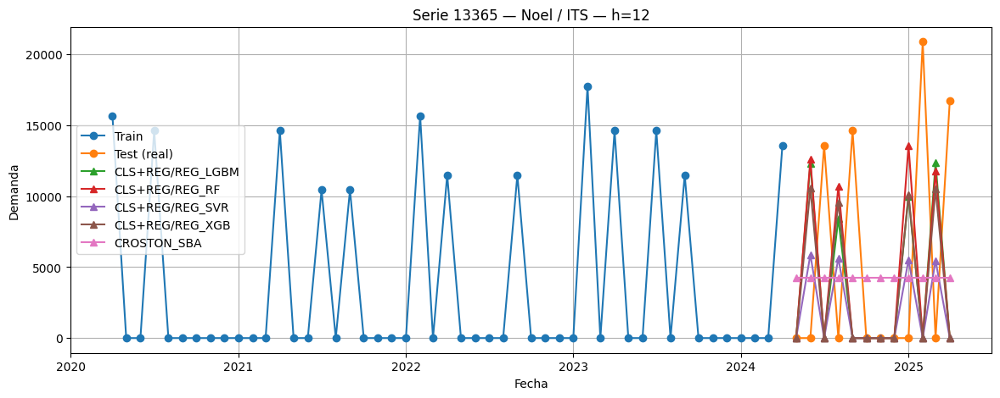

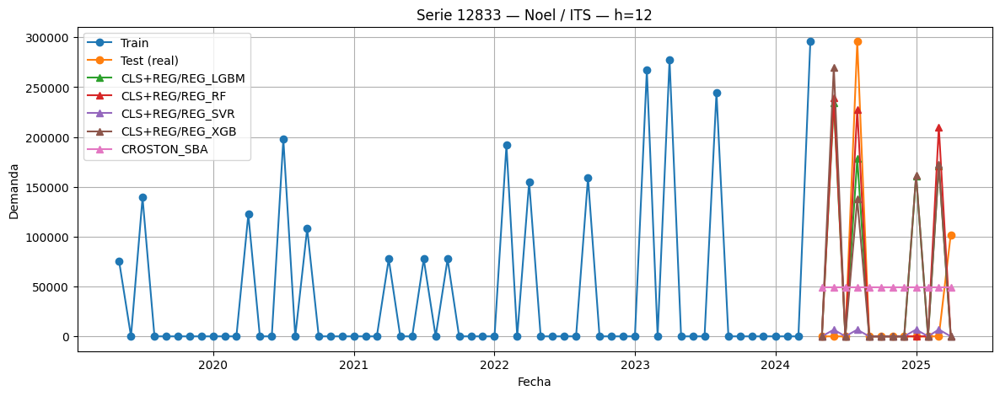

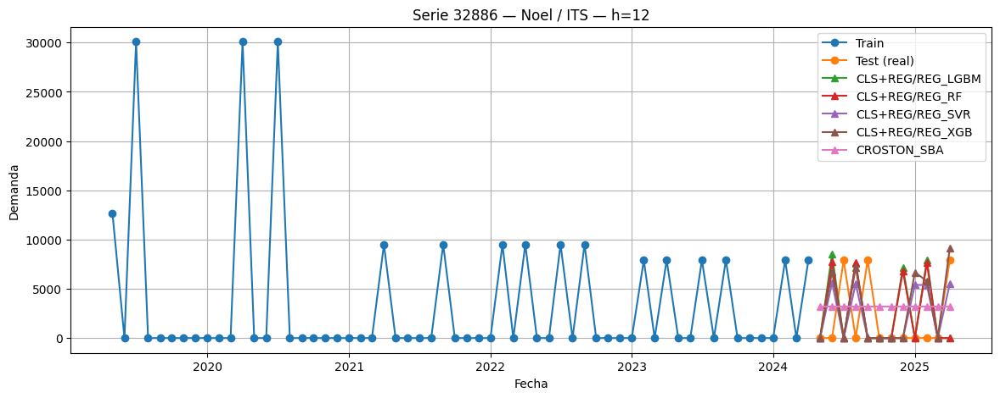

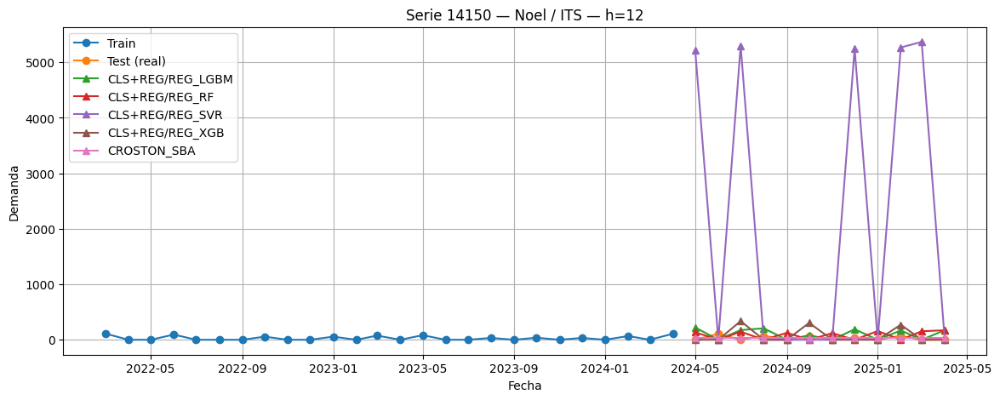

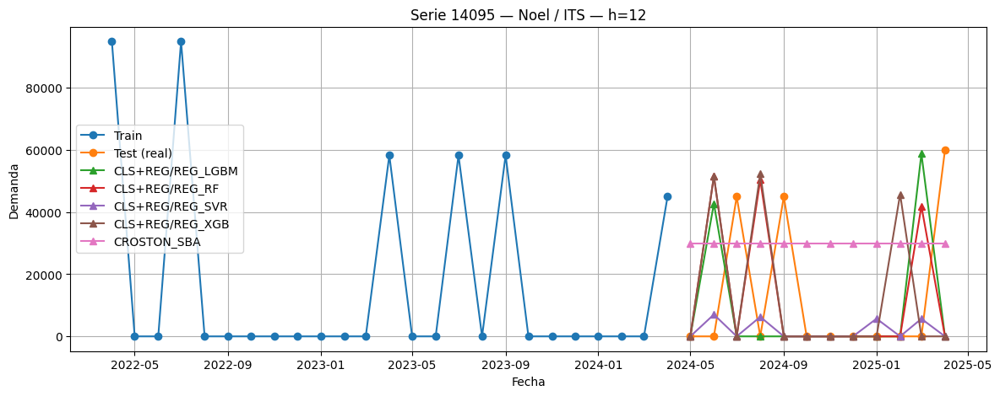

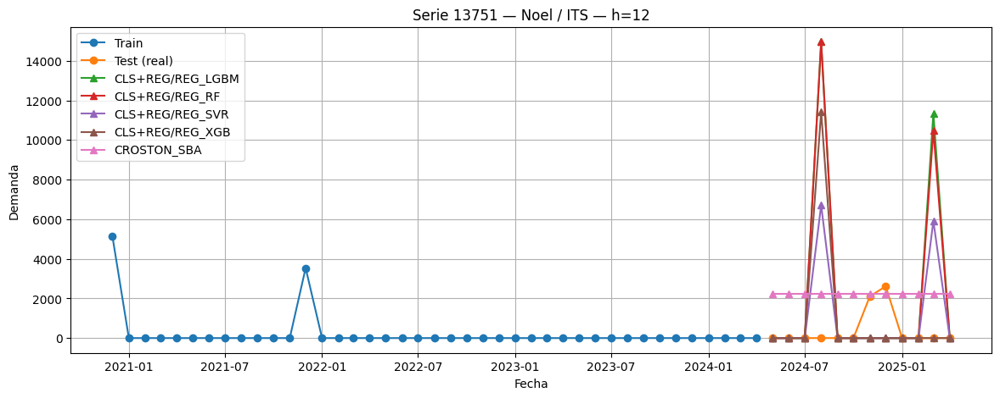

In [ ]:
# ============================================================
# MULTI-SERIE: CLS+REG (probar XGB, LGBM, RF, SVR) + Croston + AutoARIMA
# Métricas: MAE / RMSE / sMAPE / APE anual
# Plots: todas las curvas por serie
# ============================================================
import warnings, re, random
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- opcionales ----------
_have_xgb = True
try:
    from xgboost import XGBClassifier, XGBRegressor
except Exception:
    _have_xgb = False

_have_lgbm = True
try:
    from lightgbm import LGBMClassifier, LGBMRegressor
except Exception:
    _have_lgbm = False

_have_pmd = True

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# ------------------ utilidades base ------------------
def parse_df_name(DF_NAME: str):
    m = re.match(r"^df_([^_]+)_(ITS|LTS|STS|ETS|CTS)_h(\d+)$", DF_NAME)
    if not m:
        raise ValueError("DF_NAME debe ser como df_Noel_LTS_h12")
    client, code, H = m.groups()
    return {'client': client, 'code': code, 'H': int(H)}

def preprocess_forecast_df(df: pd.DataFrame,
                           id_col='unique_id', ds_col='ds', y_col='y') -> pd.DataFrame:
    req = {id_col, ds_col, y_col}
    assert req.issubset(df.columns), f"Faltan columnas: {req - set(df.columns)}"
    d = df.copy()
    d[id_col] = d[id_col].astype(str).str.strip()
    d[ds_col] = pd.to_datetime(d[ds_col], errors='raise')
    d[y_col] = pd.to_numeric(d[y_col], errors='coerce').fillna(0.).astype(float)
    return d.sort_values([id_col, ds_col]).reset_index(drop=True)

def _add_month_cyclical(df, ds_col='ds'):
    m = df[ds_col].dt.month.astype(int)
    df['month_sin'] = np.sin(2*np.pi*m/12.0)
    df['month_cos'] = np.cos(2*np.pi*m/12.0)
    return df

def _since_last_nonzero(y: pd.Series) -> pd.Series:
    out = np.zeros(len(y), dtype=np.int32)
    cnt = 0
    for i, v in enumerate(y.values):
        cnt = 0 if v>0 else cnt+1
        out[i] = cnt
    return pd.Series(out, index=y.index, name='since_last_nonzero')

def _count_nonzero_last(y: pd.Series, window: int) -> pd.Series:
    return (y.rolling(window, min_periods=1)
              .apply(lambda a: np.count_nonzero(a), raw=True)
              .rename(f'nonzero_count_{window}'))

def build_features_single_series(s: pd.DataFrame,
                                 lags=(1,2,3,6,12),
                                 roll_windows=(3,6,12),
                                 ds_col='ds', y_col='y'):
    s = s.copy()
    s[ds_col] = pd.to_datetime(s[ds_col])
    s = s.sort_values(ds_col).reset_index(drop=True)
    # Lags
    for L in lags:
        s[f'y_lag_{L}'] = s[y_col].shift(L)
    # Rolling pasado (shift(1))
    for W in roll_windows:
        s[f'roll_mean_{W}'] = s[y_col].shift(1).rolling(W, min_periods=1).mean()
        s[f'roll_std_{W}']  = s[y_col].shift(1).rolling(W, min_periods=1).std(ddof=0)
    s = _add_month_cyclical(s, ds_col)
    s['since_last_nonzero'] = _since_last_nonzero(s[y_col])
    s['nonzero_count_12']   = _count_nonzero_last(s[y_col], 12)
    return s

def make_global_matrices(df_train: pd.DataFrame,
                         lags=(1,2,3,6,12), roll_windows=(3,6,12),
                         id_col='unique_id', ds_col='ds', y_col='y'):
    # concat features de todas las series (sólo train)
    frames = []
    for uid, s in df_train.groupby(id_col):
        f = build_features_single_series(s, lags, roll_windows, ds_col, y_col)
        f['target_next'] = f[y_col].shift(-1)
        frames.append(f)
    F = pd.concat(frames, ignore_index=True)
    feat_cols = [c for c in F.columns if c not in (id_col, ds_col, y_col, 'target_next')]

    cls_df = F.dropna(subset=feat_cols + ['target_next']).copy()
    cls_df['y_bin'] = (cls_df['target_next'] > 0).astype(int)
    X_cls = cls_df[feat_cols].astype(float)
    y_cls = cls_df['y_bin'].values.astype(int)

    reg_df = cls_df[cls_df['target_next'] > 0].copy()
    X_reg = reg_df[feat_cols].astype(float)
    y_reg = reg_df['target_next'].values.astype(float)

    return feat_cols, X_cls, y_cls, X_reg, y_reg

# ------------------ modelos ------------------
def _class_imbalance_weight(y_bin):
    pos = int(np.sum(y_bin==1))
    neg = int(np.sum(y_bin==0))
    return None if pos==0 else max(1.0, neg/max(1,pos))

def make_classifier_auto(y_bin, random_state=42):
    # Preferencia: LGBM -> XGB -> RF -> LogReg
    w = _class_imbalance_weight(y_bin)
    if _have_lgbm:
        return LGBMClassifier(
            n_estimators=600, learning_rate=0.05, num_leaves=31,
            subsample=0.9, colsample_bytree=0.9, class_weight='balanced',
            random_state=random_state
        )
    if _have_xgb:
        params = dict(
            n_estimators=400, learning_rate=0.05, max_depth=4,
            subsample=0.9, colsample_bytree=0.9, reg_lambda=1.0,
            objective='binary:logistic', random_state=random_state
        )
        if w: params['scale_pos_weight'] = float(w)
        return XGBClassifier(**params)
    return RandomForestClassifier(
        n_estimators=400, max_depth=None, class_weight='balanced',
        random_state=random_state, n_jobs=-1
    )

def make_regressors_suite(random_state=42):
    models = {}
    if _have_xgb:
        models['REG_XGB'] = XGBRegressor(
            n_estimators=700, learning_rate=0.05, max_depth=5,
            subsample=0.9, colsample_bytree=0.9, reg_lambda=1.0,
            objective='reg:squarederror', random_state=random_state
        )
    if _have_lgbm:
        models['REG_LGBM'] = LGBMRegressor(
            n_estimators=900, learning_rate=0.05, num_leaves=31,
            subsample=0.9, colsample_bytree=0.9, random_state=random_state
        )
    models['REG_RF'] = RandomForestRegressor(
        n_estimators=800, max_depth=None, random_state=random_state, n_jobs=-1
    )
    models['REG_SVR'] = make_pipeline(StandardScaler(with_mean=False),
                                      SVR(C=10.0, epsilon=0.1, kernel='rbf'))
    return models

# --------- forecast recursivo con CLS+REG ----------
def _feature_row_from_history(history_vals, future_ds, lags, roll_windows):
    row = {}
    n = len(history_vals)
    for L in lags:
        row[f'y_lag_{L}'] = history_vals[-L] if n >= L else np.nan
    hist = pd.Series(history_vals, dtype=float)
    for W in roll_windows:
        tail = hist.tail(W)
        row[f'roll_mean_{W}'] = float(tail.mean()) if len(tail)>0 else np.nan
        row[f'roll_std_{W}']  = float(tail.std(ddof=0)) if len(tail)>1 else 0.0
    # calendario + intermitencia
    m = int(pd.to_datetime(future_ds).month)
    row['month_sin'] = float(np.sin(2*np.pi*m/12.0))
    row['month_cos'] = float(np.cos(2*np.pi*m/12.0))
    cnt = 0
    for v in reversed(history_vals):
        if v > 0: break
        cnt += 1
    row['since_last_nonzero'] = float(cnt)
    row['nonzero_count_12']   = float(np.count_nonzero(hist.tail(12).to_numpy()))
    return pd.DataFrame([row])

def forecast_series_clsreg(train_s: pd.DataFrame, H: int, feat_cols,
                           cls_model, reg_model,
                           lags=(1,2,3,6,12), roll_windows=(3,6,12),
                           freq='MS', p_threshold=0.5,
                           ds_col='ds', y_col='y', clip_nonneg=True):
    s_cur = train_s[[ds_col, y_col]].copy().sort_values(ds_col).reset_index(drop=True)
    preds = np.zeros(H, dtype=float)
    for k in range(1, H+1):
        next_ds = s_cur[ds_col].iloc[-1] + pd.tseries.frequencies.to_offset(freq)
        X_row = _feature_row_from_history(s_cur[y_col].values, next_ds, lags, roll_windows)
        X_row = X_row.reindex(columns=feat_cols).fillna(0.0).astype(float)
        # prob de ocurrencia (si el modelo la da)
        if hasattr(cls_model, "predict_proba"):
            p1 = float(cls_model.predict_proba(X_row)[0][1])
        else:
            p1 = float(cls_model.predict(X_row)[0])
        if p1 >= p_threshold:
            y_hat = float(reg_model.predict(X_row)[0])
            if clip_nonneg: y_hat = max(0.0, y_hat)
        else:
            y_hat = 0.0
        preds[k-1] = y_hat
        s_cur = pd.concat([s_cur, pd.DataFrame({ds_col:[next_ds], y_col:[y_hat]})], ignore_index=True)
    return preds

# --------- baselines ----------
def croston_sba_forecast(y: np.ndarray, H=1, alpha=0.1):
    # Croston clásico con corrección SBA (factor 1-α/2)
    y = np.asarray(y, dtype=float)
    nz = y[y>0]
    if len(nz)==0: 
        return np.zeros(H)
    # separar tamaños y tiempos entre demandas
    sizes = []
    intervals = []
    last = None
    gap = 0
    for v in y:
        if v>0:
            sizes.append(v)
            if last is None:
                intervals.append(gap+1 if gap>0 else 1)
            else:
                intervals.append(gap+1)
            gap = 0
            last = v
        else:
            gap += 1
    z = sizes[0]
    p = intervals[0]
    for s in sizes[1:]:
        z = z + alpha*(s - z)
    for it in intervals[1:]:
        p = p + alpha*(it - p)
    f = (z/p) * (1 - alpha/2.0)
    return np.repeat(max(0.0, f), H)

# --------- métricas ----------
def mae(y, yhat):  return float(np.mean(np.abs(np.asarray(y)-np.asarray(yhat))))
def rmse(y, yhat): return float(np.sqrt(np.mean((np.asarray(y)-np.asarray(yhat))**2)))
def smape(y, yhat):
    y, yhat = np.asarray(y), np.asarray(yhat)
    denom = np.abs(y)+np.abs(yhat)
    num   = 200.0*np.abs(y - yhat)
    out   = np.where(denom==0.0, 0.0, num/denom)
    return float(np.mean(out))
def ape_anual(ds, y, yhat):
    """Error porcentual por año (|sum(y)-sum(yhat)| / sum(y)), promediado."""
    df = pd.DataFrame({'ds':pd.to_datetime(ds),'y':y,'yhat':yhat})
    by = df.groupby(df['ds'].dt.year)[['y','yhat']].sum()
    ape = []
    for _, r in by.iterrows():
        denom = abs(r['y'])
        if denom==0:
            ape.append(0.0 if abs(r['yhat'])==0 else 200.0)  # caso extremo
        else:
            ape.append(100.0*abs(r['y']-r['yhat'])/denom)
    return float(np.mean(ape)) if len(ape)>0 else 0.0

# --------- core: entrenamiento pooled + forecasts de TODOS los modelos ----------
def fit_all_and_forecast_multiseries(df: pd.DataFrame,
                                     DF_NAME: str,
                                     lags=(1,2,3,6,12), roll_windows=(3,6,12),
                                     freq='MS', p_threshold=0.5, random_state=42):
    ctx = parse_df_name(DF_NAME)
    H   = ctx['H']
    df  = preprocess_forecast_df(df)
    # split por serie
    train_parts = []
    test_parts  = []
    for uid, s in df.groupby('unique_id'):
        s = s.sort_values('ds').reset_index(drop=True)
        if len(s) <= H + max(max(lags), max(roll_windows)):
            continue
        train_parts.append(s.iloc[:-H].copy())
        test_parts.append(s.iloc[-H:].copy())
    if len(train_parts)==0:
        raise ValueError("No hay series suficientemente largas.")
    train = pd.concat(train_parts, ignore_index=True)
    test  = pd.concat(test_parts,  ignore_index=True)

    # matrices pooled (solo train)
    feat_cols, X_cls, y_cls, X_reg_any, y_reg_any = make_global_matrices(train, lags, roll_windows)
    # clasificador único (auto)
    cls_model = make_classifier_auto(y_cls, random_state)
    cls_model.fit(X_cls, y_cls)

    # suite de regresores
    reg_models = make_regressors_suite(random_state)
    for name, m in reg_models.items():
        m.fit(X_reg_any, y_reg_any)

    # forecasting por serie con todos los regresores + baselines
    rows = []
    miss_autoarima = False
    for uid, s_full in df.groupby('unique_id'):
        s_full = s_full.sort_values('ds').reset_index(drop=True)
        if len(s_full) <= H + max(max(lags), max(roll_windows)):
            continue
        s_train = s_full.iloc[:-H].copy()
        s_test  = s_full.iloc[-H:].copy()
        ds_test = s_test['ds'].values
        y_true  = s_test['y'].values

        # CLS+REG (todos los regresores)
        for mdl_name, reg_m in reg_models.items():
            yhat = forecast_series_clsreg(s_train, H, feat_cols, cls_model, reg_m,
                                          lags, roll_windows, freq=freq, p_threshold=p_threshold)
            for h, yh in enumerate(yhat, start=1):
                rows.append({'unique_id':uid, 'ds':ds_test[h-1], 'y':y_true[h-1],
                             'model':f'CLS+REG/{mdl_name}', 'yhat':float(yh), 'h':h})

        # Croston SBA
        yhat_c = croston_sba_forecast(s_train['y'].values, H)
        for h, yh in enumerate(yhat_c, start=1):
            rows.append({'unique_id':uid, 'ds':ds_test[h-1], 'y':y_true[h-1],
                         'model':'CROSTON_SBA', 'yhat':float(yh), 'h':h})


    comp_all = pd.DataFrame(rows).sort_values(['unique_id','ds','model']).reset_index(drop=True)

    # métricas (overall y por paso)
    overall_rows = []
    step_rows    = []
    for model_name, g in comp_all.groupby('model'):
        y  = g['y'].values
        yh = g['yhat'].values
        overall_rows += [
            {'model':model_name,'metric':'MAE',  'value':mae(y,yh)},
            {'model':model_name,'metric':'RMSE', 'value':rmse(y,yh)},
            {'model':model_name,'metric':'sMAPE','value':smape(y,yh)},
            {'model':model_name,'metric':'APE_year','value':ape_anual(g['ds'].values, y, yh)},
        ]
        # por h
        for h, gh in g.groupby('h'):
            step_rows += [
                {'model':model_name,'h_step':int(h),'metric':'MAE','value':mae(gh['y'], gh['yhat'])},
                {'model':model_name,'h_step':int(h),'metric':'RMSE','value':rmse(gh['y'], gh['yhat'])},
                {'model':model_name,'h_step':int(h),'metric':'sMAPE','value':smape(gh['y'], gh['yhat'])},
            ]

    overall = pd.DataFrame(overall_rows).pivot(index='model',columns='metric',values='value').reset_index()
    steps   = pd.DataFrame(step_rows)

    manifest = {
        'H': ctx['H'], 'client': ctx['client'], 'code': ctx['code'],
        'n_series_used': comp_all['unique_id'].nunique(),
        'classifier': type(cls_model).__name__,
        'regressors_trained': list(reg_models.keys()),
        'auto_arima_available': _have_pmd and (not miss_autoarima)
    }
    if not _have_pmd:
        print("⚠️ pmdarima no está instalado: se omite AUTO_ARIMA.")
    return comp_all, overall, steps, manifest

# ------------------ plots ------------------
def plot_series_all_models(comp_all: pd.DataFrame,
                           df_orig: pd.DataFrame,
                           DF_NAME: str,
                           serie_id: str,
                           tail_plot: int = 48):
    ctx = parse_df_name(DF_NAME)
    H   = ctx['H']
    s = df_orig[df_orig['unique_id'].astype(str)==str(serie_id)].sort_values('ds').reset_index(drop=True)
    if len(s)==0:
        print(f"Serie {serie_id} no encontrada.")
        return
    s_train = s.iloc[:-H].copy()
    s_test  = s.iloc[-H:].copy()
    ds_test = s_test['ds'].values
    # datos de modelos
    gg = comp_all[comp_all['unique_id'].astype(str)==str(serie_id)]
    if gg.empty:
        print(f"No hay predicciones para {serie_id}.")
        return
    plt.figure(figsize=(14,5))
    plt.plot(s_train['ds'].tail(tail_plot), s_train['y'].tail(tail_plot), label='Train', marker='o')
    plt.plot(s_test['ds'],  s_test['y'],  label='Test (real)', marker='o')

    for model_name, g in gg.groupby('model'):
        plt.plot(ds_test, g.sort_values('ds')['yhat'].values, marker='^', label=model_name)

    ttl = f"Serie {serie_id} — {ctx['client']} / {ctx['code']} — h={H}"
    plt.title(ttl); plt.xlabel("Fecha"); plt.ylabel("Demanda"); plt.grid(True); plt.legend()
    plt.show()

def plot_multiple_series_all_models(comp_all, df_orig, DF_NAME, n_series=6, tail_plot=48, random_state=42):
    random.seed(random_state)
    ids_pred = set(comp_all['unique_id'].astype(str).unique())
    ids_orig = set(df_orig['unique_id'].astype(str).unique())
    ids = sorted(list(ids_pred & ids_orig))
    if not ids:
        print("❌ No hay intersección de series entre predicciones y origen.")
        return
    pick = random.sample(ids, k=min(n_series, len(ids)))
    for sid in pick:
        plot_series_all_models(comp_all, df_orig, DF_NAME, sid, tail_plot=tail_plot)

# ------------------ helper: localizar df por DF_NAME ------------------
def get_df_from_globals_by_name(DF_NAME: str) -> pd.DataFrame:
    g = globals()
    if DF_NAME in g and isinstance(g[DF_NAME], pd.DataFrame):
        return g[DF_NAME].copy()
    raise KeyError(f"No encontré una variable llamada {DF_NAME} en el entorno actual.")

# ===========================
# EJEMPLO DE USO RÁPIDO
# ===========================
# 1) Usa el nombre del dataset que YA tienes en tu entorno (p. ej. 'df_Noel_LTS_h12')
DF_NAME = 'df_Noel_ITS_h12'   # <-- cambia sólo esto si quieres otro dataset
df_sub  = get_df_from_globals_by_name(DF_NAME)

# 2) Entrenar/Predecir con TODOS los modelos
res_all, overall, steps, manifest = fit_all_and_forecast_multiseries(
    df = df_sub,
    DF_NAME = DF_NAME,
    lags = (1,2,3,6,12),
    roll_windows = (3,6,12),
    p_threshold = 0.5
)

print("=== MANIFEST ===")
print(manifest, "\n")

print("=== OVERALL (ordenado por sMAPE) ===")
print(overall.sort_values('sMAPE'))

print("\n=== STEPS (primeras filas) ===")
print(steps.head())

# 3) Plots de varias series con TODAS las curvas
plot_multiple_series_all_models(res_all, df_sub, DF_NAME, n_series=6, tail_plot=60)


# INTERPRETACIÓN
**Contexto:** estás en **ITS (intermittent)** con picos enormes y muchos ceros. Usas un **clasificador** (¿hay evento? sí/no) + un **regresor** (tamaño del evento si lo hay). Has probado **LGBM, XGB, RF y SVR** y un baseline **Croston-SBA**.

## 1) Por qué el sMAPE es tan alto

* El sMAPE mensual se dispara cuando **una de las dos partes es 0**: si el modelo predice >0 y el real es 0 (o al revés) la contribución es \~200%.
* En tus plots se ven **muchos falsos positivos** (líneas verdes/rojas/marrones cuando el naranja está en 0). Eso **domina** el sMAPE (74–81%).
* En cambio, el **APE\_year** (error sobre el agregado de 12 meses) es **mejor (36–50%)** porque los fallos de meses individuales **se compensan** al sumar.

## 2) Qué modelo funciona “menos mal”

Orden por sMAPE (mejor → peor):
**LGBM ≈ XGB > RF > SVR >> Croston-SBA**

* **LGBM / XGB**: muy parecidos. Captan tamaños de pico del orden correcto cuando aciertan que hay evento, pero **activan demasiados meses**.
* **RF**: un poco peor que LGBM/XGB; tiende a suavizar picos.
* **SVR**: **MAE algo menor** (4.5k vs \~5.5k) porque da valores medianos, pero **sMAPE peor** (81%) al “regar” muchos meses con valores >0 cuando deberían ser 0.
* **Croston-SBA**: **muy mal (sMAPE \~167%)**. Asume estacionariedad de tamaño/intervalo; con tus **picos gigantes y no estacionarios** termina en **niveles casi constantes** muy altos y se equivoca la mayoría de meses.

## 3) Qué se ve en los plots

* Series con **picos descomunales** en train (decenas/cientos de miles) inducen a los regresores a **sobredimensionar** magnitudes en test.
* El clasificador marca bastantes meses como “evento” (p\_hat > 0.5); cuando el real es 0, te penaliza a 200% en sMAPE.
* Croston aparece como **línea plana** alta: por eso destroza el sMAPE.

# Conclusiones operativas

1. **El cuello de botella no es el regressor, es el clasificador (cero vs. no-cero).**

   * Tu “rate” de positivos es \~28% (1303/4659). Con **umbral fijo 0.5** hay muchos falsos positivos.
   * **Acción**: calibrar el umbral por validación (por serie o global) para **minimizar sMAPE** o **maximizar F1** del evento.

     * Aún mejor: usar **p \* $\hat{y}$** en lugar de hard-threshold (esto reduce el castigo de sMAPE cuando el real=0).

2. **Escalar la magnitud** mejora los regresores y la estabilidad:

   * Entrena el regressor sobre **log1p(y\_pos)** y **deshaz** con `expm1` al inferir; **cap** a, por ejemplo, el **p95** del histórico de cada serie (winsorizar) para evitar “cohetes”.
   * **Normaliza por serie** (p.ej. dividir por la **mediana de los no-cero** y reescalar al final). Mezclar escalas 50 ↔ 300 000 en el mismo modelo degrada.

3. **Features para ITS** (ya tienes algunas, pero puedes reforzar):

   * `since_last_nonzero` (muy útil) → incluso puedes **forzar monotonicidad negativa** en LGBM: a mayor “sequía”, menor prob. de evento/tamaño.
   * `nonzero_rate_12`, `mean_size_last_k_events`, `months_since_last_event`, `month_*` (estacionalidad de eventos).
   * Diferenciar **evento** vs **tamaño**: el clasificador con estas features y **class\_weight='balanced'** suele mejorar bastante.

4. **Evaluación separada** (te ayudará a entender “por qué falla”):

   * Métrica de **clasificación** del evento: Precision/Recall/F1 y **zero-hit rate** (aciertos de 0).
   * MAE **condicional** a y>0 (sólo tamaño).
   * El sMAPE actual mezcla ambos mundos y te oculta si fallas por “activar meses de más” o por “tamaño mal”.

5. **Baselines adicionales**:

   * **AutoARIMA** en ITS suele colapsar a ceros o no capta picos → servirá como “lower bound”. Si no te aparece en la tabla, asegúrate de que **se añade a `res_all` y a las tablas**; con estas series probablemente quedará entre RF/SVR y Croston (o incluso peor que RF).

# Lectura rápida de tus números

* **Mensual** (sMAPE 74–81): muy penalizado por ceros; el modelo acierta **pocos meses exactos** (0 vs >0).
* **Agregado 12m** (APE\_year 36–50): **no está tan mal**; cuando hay evento, el orden de magnitud suele estar bien.
* **RMSE altísimo**: inevitable con picos vastos; mira más **MAE** y el **APE\_year** para sentido de negocio.
* **Croston-SBA** confirma que tu problema es “ITS duro/no estacionario”: como baseline **no es competitivo** aquí.

# Qué haría ya (en este orden)

1. **Cambiar combinación**: usar **$\hat{y} = p \times \hat{y}_{pos}$** (sin umbral).
2. **Calibrar p** con validación (isotónica/Platt o simplemente tunear umbral por sMAPE).
3. **Regresor en log1p + clipping** por cuantil (p95 por serie) y **re-escala por serie**.
4. **Añadir/ajustar features de evento** y `class_weight='balanced'` (o `scale_pos_weight` en XGB/LGBM).
5. **Reportar** por serie: (i) acierto de 0, (ii) MAE condicional, (iii) sMAPE total. Verás claramente dónde se gana.

Si quieres, te preparo un parche corto que:

* cambia a **p×ŷ**,
* añade **calibración simple del umbral**,
* mete **log1p + clipping por cuantil**,
* saca un **informe de clasificación** (precision/recall/F1) y **MAE condicional** por modelo.
